In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/')

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


In [ ]:
import sys
sys.path.append('/content/gdrive/MyDrive/ACSE-9')

In [ ]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# TensorFlow ≥2.0 is required
import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2.0"

# Common imports
import numpy as np
import os

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

import pandas as pd
import time
import joblib

In [ ]:
%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Found GPU at: /device:GPU:0
Thu Aug  5 20:13:19 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.42.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P0    36W / 250W |    347MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                            

### Loading in the Data

In [ ]:
## ENHANCED DATA
enhanced_data = joblib.load('/content/gdrive/MyDrive/ACSE-9/models/enhanced_data_410.pkl') 
X_train_pca = enhanced_data ##
print(X_train_pca.shape)

(410, 50)


In [ ]:
print(X_train_pca[0:1])

[[ 3.37709998e+02  2.06305823e+01  1.88619242e+02 -1.26510489e+02
  -1.23205485e+02  3.61668642e+02  3.85825318e+02  4.04812137e+02
   2.51026250e+02 -9.60726630e+01 -4.76512697e+01  2.54697171e+01
  -1.68235134e+01 -9.63434410e+00  7.90164238e-01  5.51059865e-01
   1.38087891e+01  2.47819675e+00  7.56156910e+00  1.32812233e+00
  -4.25983489e-01  2.80925798e+00  1.77024863e+00 -5.98540759e-01
  -4.96593570e-01 -8.80873581e-01 -1.16286416e+00 -2.10600390e-01
  -5.31614137e-01  2.78087164e-01  1.17934532e+00  7.52935583e-01
   4.59453547e-01 -6.18091697e-01  3.58251745e-01 -2.30659853e-01
   4.87412159e-01 -4.84105879e-02  7.03924171e-01 -3.76288009e-01
  -1.23952102e-01 -1.52927307e-01  4.53932321e-01  1.00000000e+00
   1.00000000e+00  1.00000000e+00  1.00000000e+00  1.00000000e+00
   1.00000000e+00  1.00000000e+00]]


Scaling between [-1,1]

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler_minmax = MinMaxScaler((-1, 1))
X_train_scaled = scaler_minmax.fit_transform(X_train_pca)
np.allclose(X_train_pca, scaler_minmax.inverse_transform(X_train_scaled))

True

# Create a TensorFlow Dataset and Split it into Batches

In [ ]:
def concat_timesteps(X_train, ntimes, step):
    X_train_concat = []
    for i in range(len(X_train) - ntimes*step):
        X_train_concat.append(X_train[i:i+ntimes*step:step])
    return np.array(X_train_concat) 

In [ ]:
ntimes = 9  # consecutive times for the GAN
step = 1 # step between times

X_train_concat = concat_timesteps(X_train_scaled, ntimes, step)
print("X_train_concat: ", np.shape(X_train_concat))

X_train_4d = X_train_concat.reshape((X_train_concat.shape[0], ntimes, X_train_concat.shape[2], 1))  #(148706, 100, 81, 1)
print("X_train_4d: ", X_train_4d.shape)

X_train_concat:  (401, 9, 50)
X_train_4d:  (401, 9, 50, 1)


In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('To enable a high-RAM runtime, select the Runtime > "Change runtime type"')
  print('menu, and then select High-RAM in the Runtime shape dropdown. Then, ')
  print('re-execute this cell.')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 27.3 gigabytes of available RAM

You are using a high-RAM runtime!


In [ ]:
#BATCH_SIZE = 128
BATCH_SIZE = 256
#latent_space = 120

#latent_space = 100
latent_space = 150

# Create a tensorflow dataset and split it into batches
train_dataset = tf.data.Dataset.from_tensor_slices(X_train_4d)
# shuffles at random the elements of the dataset
train_dataset = train_dataset.shuffle(len(X_train_4d))
# combines the elements of the dataset into batches
train_dataset = train_dataset.batch(BATCH_SIZE)
for data in train_dataset:
    print(data)
    break


tf.Tensor(
[[[[ 8.44184255e-01]
   [-7.79091408e-01]
   [ 1.24380521e-01]
   ...
   [ 9.97805329e-01]
   [ 1.00000000e+00]
   [ 4.34644230e-01]]

  [[ 8.38055476e-01]
   [-7.73963386e-01]
   [ 1.07895489e-01]
   ...
   [ 9.97682073e-01]
   [ 1.00000000e+00]
   [ 4.34984014e-01]]

  [[ 8.35227300e-01]
   [-7.77251562e-01]
   [ 1.02156520e-01]
   ...
   [ 9.97574774e-01]
   [ 1.00000000e+00]
   [ 4.33367919e-01]]

  ...

  [[ 8.20618661e-01]
   [-7.67986258e-01]
   [ 6.88176543e-02]
   ...
   [ 9.96970737e-01]
   [ 1.00000000e+00]
   [ 4.18084850e-01]]

  [[ 8.19540346e-01]
   [-7.57397990e-01]
   [ 6.43780856e-02]
   ...
   [ 9.96798400e-01]
   [ 1.00000000e+00]
   [ 4.12187262e-01]]

  [[ 8.15685543e-01]
   [-6.95432542e-01]
   [ 3.09072379e-02]
   ...
   [ 9.96552328e-01]
   [ 1.00000000e+00]
   [ 4.04471819e-01]]]


 [[[ 5.07936348e-01]
   [-8.90127996e-01]
   [-5.05790582e-01]
   ...
   [ 7.48391124e-01]
   [ 9.99999984e-01]
   [-8.56723973e-02]]

  [[ 5.02275129e-01]
   [-8.4935453

# Make Generator

In [ ]:
# # pred_output1
# # Gen/Disc losses -> [5.076335, 0.44397128]
# # Prediction loss -> 0.02296643
# def make_generator_model():
#     model = tf.keras.Sequential()
#     model.add(keras.layers.Dense(2*10*256, use_bias=False, input_shape=(latent_space,)))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU(0.2))

#     model.add(keras.layers.Reshape((2, 10, 256)))

#     model.add(keras.layers.Conv2DTranspose(128, (3, 3),strides=(2, 2), use_bias=False))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU(0.3))

#     model.add(keras.layers.Conv2DTranspose(64, (3, 3), strides=(1, 2), output_padding=[0,0], use_bias=False))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU(0.3))

#     model.add(keras.layers.Conv2DTranspose(1, (3, 8), strides=(1, 1), output_padding=[0,0], use_bias=False, activation='tanh'))

#     return model

# # pred_output1
# # Gen/Disc losses -> [5.076335, 0.44397128]
# # Prediction loss -> 0.02296643
# def make_generator_model():
#     model = tf.keras.Sequential()
#     model.add(keras.layers.Dense(2*5*256, use_bias=False, input_shape=(latent_space,)))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU(0.2))

#     model.add(keras.layers.Reshape((2, 5, 256)))

#     model.add(keras.layers.Conv2DTranspose(128, (3, 3),strides=(2, 2), use_bias=False))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU(0.3))

#     model.add(keras.layers.Conv2DTranspose(64, (3, 3), strides=(1, 2), output_padding=[0,0], use_bias=False))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU(0.3))

#     model.add(keras.layers.Conv2DTranspose(1, (3, 6), strides=(1, 2), output_padding=[0,0], use_bias=False, activation='tanh'))

#     return model

## pred_output2 -> LATEST
## gen/discr -> [4.671269, 0.49525785]
## Prediction loss -> 0.02015809
## New gen/discr -> [3.5416906, 0.7925]
## New Pred loss -> 0.035453536
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(keras.layers.Dense(2*20*256, use_bias=False, input_shape=(latent_space,)))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.2))

    model.add(keras.layers.Reshape((2, 20, 256)))

    model.add(keras.layers.Conv2DTranspose(128, (3, 3),strides=(2, 1), use_bias=False))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.3))

    model.add(keras.layers.Conv2DTranspose(64, (3, 3), strides=(1, 2), output_padding=[0,0], use_bias=False))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.3))

    model.add(keras.layers.Conv2DTranspose(1, (3, 6), strides=(1, 1), output_padding=[0,0], use_bias=False, activation='tanh'))

    return model


# ## Trial
# ## gen/discr -> [4.116969, 0.5747111]
# ## Prediction loss -> 0.02
# def make_generator_model():
#     model = tf.keras.Sequential()
#     model.add(keras.layers.Dense(4*20*256, use_bias=False, input_shape=(latent_space,)))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU(0.2))

#     model.add(keras.layers.Reshape((4, 20, 256)))

#     model.add(keras.layers.Conv2DTranspose(128, (3, 3),strides=(1, 1), use_bias=False))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU(0.3))

#     model.add(keras.layers.Conv2DTranspose(64, (3, 3), strides=(1, 2), output_padding=[0,0], use_bias=False))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU(0.3))

#     model.add(keras.layers.Conv2DTranspose(1, (2, 6), strides=(1, 1), output_padding=[0,0], use_bias=False, activation='tanh'))

#     return model

# def make_generator_model():
#   model = tf.keras.Sequential()
#   model.add(keras.layers.Dense(9*50*16, use_bias=False, input_shape=(latent_space,)))
#   model.add(keras.layers.BatchNormalization())
#   model.add(keras.layers.LeakyReLU())

#   model.add(keras.layers.Reshape((9, 50, 16)))

#   model.add(keras.layers.Conv2DTranspose(8, (1, 1), strides=(1, 1), padding='same', use_bias=False))
#   model.add(keras.layers.BatchNormalization())
#   model.add(keras.layers.LeakyReLU())

#   model.add(keras.layers.Conv2DTranspose(4, (1, 1), strides=(1, 1), padding='same', use_bias=False))
#   model.add(keras.layers.BatchNormalization())
#   model.add(keras.layers.LeakyReLU())

#   model.add(keras.layers.Conv2DTranspose(1, (1, 1), strides=(1, 1), padding='same', output_padding=[0,0], use_bias=False, activation='tanh'))

#   return model

In [ ]:
generator = make_generator_model()
generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 10240)             1536000   
_________________________________________________________________
batch_normalization (BatchNo (None, 10240)             40960     
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 10240)             0         
_________________________________________________________________
reshape (Reshape)            (None, 2, 20, 256)        0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 5, 22, 128)        294912    
_________________________________________________________________
batch_normalization_1 (Batch (None, 5, 22, 128)        512       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 5, 22, 128)        0

### Create Random Input Noise

For a random noise input, we generate an output shown below:

(1, 150)
(1, 9, 50, 1)


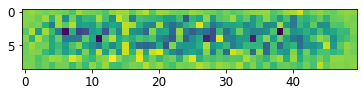

In [ ]:
noise = tf.random.normal([1, latent_space])
print(noise.shape)
generated_image = generator(noise, training=False)
print(generated_image.shape)
plt.imshow(generated_image[0, :, :, 0])

### Make Discriminator

In [ ]:
inp_shape = generated_image.shape[1:]

def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(keras.layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                    input_shape=inp_shape))
                                     
    model.add(keras.layers.LeakyReLU(0.2))
    model.add(keras.layers.Dropout(0.3)) # decrease hyper learning distribution

    model.add(keras.layers.Conv2D(128, (3, 3), strides=(1, 2), padding='same'))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.2))
    model.add(keras.layers.Dropout(0.3)) # decrease hyper learning distribution

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(1))

    return model

# #INCREASE TRIAL
# def make_discriminator_model():
#     model = tf.keras.Sequential()
#     model.add(keras.layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same',
#                                     input_shape=inp_shape))
                                     
#     model.add(keras.layers.LeakyReLU(0.2))
#     model.add(keras.layers.Dropout(0.3)) # decrease hyper learning distribution

#     model.add(keras.layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU(0.2))
#     model.add(keras.layers.Dropout(0.3)) # decrease hyper learning distribution

#     model.add(keras.layers.Conv2D(256, (3, 3), strides=(2, 2), padding='same'))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU(0.2))
#     model.add(keras.layers.Dropout(0.3)) # decrease hyper learning distribution

#     model.add(keras.layers.Flatten())
#     model.add(keras.layers.Dense(1))

#     return model

# #REDUCED TRIAL
# def make_discriminator_model():
#     model = tf.keras.Sequential()
#     model.add(keras.layers.Conv2D(16, (3, 3), strides=(2, 2), padding='same',
#                                     input_shape=inp_shape))
                                     
#     model.add(keras.layers.LeakyReLU(0.2))
#     model.add(keras.layers.Dropout(0.3)) # decrease hyper learning distribution

#     model.add(keras.layers.Conv2D(32, (3, 3), strides=(2, 2), padding='same'))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU(0.2))
#     model.add(keras.layers.Dropout(0.3)) # decrease hyper learning distribution

#     model.add(keras.layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same'))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU(0.2))
#     model.add(keras.layers.Dropout(0.3)) # decrease hyper learning distribution

#     model.add(keras.layers.Flatten())
#     model.add(keras.layers.Dense(1))

#     return model

# def make_discriminator_model():
#     model = tf.keras.Sequential()
#     model.add(keras.layers.Conv2D(32, (3, 3), strides=(2, 2), padding='same',
#                                      input_shape=inp_shape))
#     model.add(keras.layers.LeakyReLU(0.2))

#     model.add(keras.layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same'))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU(0.2))

#     model.add(keras.layers.Flatten())
#     model.add(keras.layers.Dense(1))

#     return model

# # reducing params
# def make_discriminator_model():
#     model = tf.keras.Sequential()
#     model.add(keras.layers.Conv2D(8, (1, 1), strides=(1, 1), padding='same',
#                           input_shape=inp_shape))
#     model.add(keras.layers.LeakyReLU()) # Leaky ReLU activation function helps with the gradient flow - alleviates problem of almost 0 gradients
#     model.add(keras.layers.Dropout(0.2)) # decrease hyper learning distribution

#     model.add(keras.layers.Conv2D(16, (1, 1), strides=(1, 1), padding='same')) # downsampling
#     model.add(keras.layers.LeakyReLU())
#     model.add(keras.layers.Dropout(0.2))

#     model.add(keras.layers.Flatten())
#     model.add(keras.layers.Dense(1))

#     return model

In [ ]:
discriminator = make_discriminator_model()
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 5, 25, 64)         1664      
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 5, 25, 64)         0         
_________________________________________________________________
dropout (Dropout)            (None, 5, 25, 64)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 5, 13, 128)        73856     
_________________________________________________________________
batch_normalization_3 (Batch (None, 5, 13, 128)        512       
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 5, 13, 128)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 5, 13, 128)       

In [ ]:
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.00721915]], shape=(1, 1), dtype=float32)


### Create GAN by combining both Models

In [ ]:
gan = keras.models.Sequential([generator, discriminator])

### Define Losses and Optimizers

In [ ]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

generator_mean_loss = tf.keras.metrics.Mean(dtype=tf.float32)
discriminator_mean_loss = tf.keras.metrics.Mean(dtype=tf.float32)

In [ ]:
# The discriminator and the generator optimizers are different since we will train two networks separately.
generator_optimizer = tf.keras.optimizers.Adam(2e-3, 0.7, 0.999)
discriminator_optimizer = tf.keras.optimizers.Adam(5e-3, 0.7, 0.999)

# ## TRY
# generator_optimizer = tf.keras.optimizers.Adam(2e-4, 0.5)
# discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, 0.5)


In [ ]:
# logs to follow losses on tensorboard
#current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
generator_log_dir = '/content/gdrive/MyDrive/ACSE-9/logs/generator'
discriminator_log_dir = '/content/gdrive/MyDrive/ACSE-9/logs/discriminator'

generator_summary_writer = tf.summary.create_file_writer(generator_log_dir)
discriminator_summary_writer = tf.summary.create_file_writer(discriminator_log_dir)

# Define Training Loop

In [ ]:
num_examples_to_generate = 9

# You will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
seed = tf.random.normal([num_examples_to_generate, latent_space])
print(seed.shape)


(9, 150)


In [ ]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function
def train_gen_step(batch):
    noise = tf.random.normal([BATCH_SIZE, latent_space])
    
    with tf.GradientTape() as gen_tape:
        generated_images = generator(noise, training=True)
        fake_output = discriminator(generated_images, training=True)
        real_output = discriminator(batch, training=True)
        
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    #gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    #discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    
    generator_mean_loss(gen_loss)
    #discriminator_mean_loss(disc_loss)


In [ ]:
@tf.function
def train_disc_step(batch):
    noise = tf.random.normal([BATCH_SIZE, latent_space])
    
    with tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        fake_output = discriminator(generated_images, training=True)
        real_output = discriminator(batch, training=True)
        
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    #gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    #generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    
    #generator_mean_loss(gen_loss)
    discriminator_mean_loss(disc_loss)


In [ ]:
def train(dataset, epochs):
    gen_step_cnt = 0
    disc_step_cnt = 0
    hist = []
    for epoch in range(epochs):
        start = time.time()
        print("Epoch {}/{}".format(epoch + 1, epochs))   

        batch_num = 0
        for batch in dataset:
          if batch_num % 3 == 0:
            train_disc_step(batch)
            disc_step_cnt += 1
            train_gen_step(batch)
            gen_step_cnt += 1
            with discriminator_summary_writer.as_default():
              tf.summary.scalar('loss', discriminator_mean_loss.result(), step=epoch)
            with generator_summary_writer.as_default():
              tf.summary.scalar('loss', generator_mean_loss.result(), step=epoch)
          else:
            train_gen_step(batch)
            gen_step_cnt += 1
            with generator_summary_writer.as_default():
              tf.summary.scalar('loss', generator_mean_loss.result(), step=epoch)
          batch_num += 1
        
        hist.append([generator_mean_loss.result().numpy(), discriminator_mean_loss.result().numpy()])

        generator_mean_loss.reset_states()
        discriminator_mean_loss.reset_states()
        #print("a:", discriminator.metrics_names[0])
        #print("b:", hist[-1][1])
        #print("discriminator", "{}: {:.6f}".format(discriminator.metrics_names[0], hist[-1][1]), end=' - ')
        #print("generator", "{}: {:.6f}".format(gan.metrics_names[0], hist[-1][0]), end=' - ')    
        print ('{:.0f}s'.format( time.time()-start))


        #Global variables are used below
        if epoch%100 == 0: 
            
          print("generator loss: ", hist[-1][0])
          print("discriminator loss: ", hist[-1][-1])
            #plot loss
          print('Loss: ')
          fig, ax = plt.subplots(1,1, figsize=[20,10])
          ax.plot(hist)
          ax.legend(['loss_gen', 'loss_disc'])
          ax.set_yscale('log')
          ax.grid()
          plt.show()
            
    # return hist, gen_step_cnt, disc_step_cnt
    return hist

In [ ]:
train_dataset

<BatchDataset shapes: (None, 9, 50, 1), types: tf.float64>

Epoch 1/20000
3s
generator loss:  5.6249986
discriminator loss:  1.7032325
Loss: 


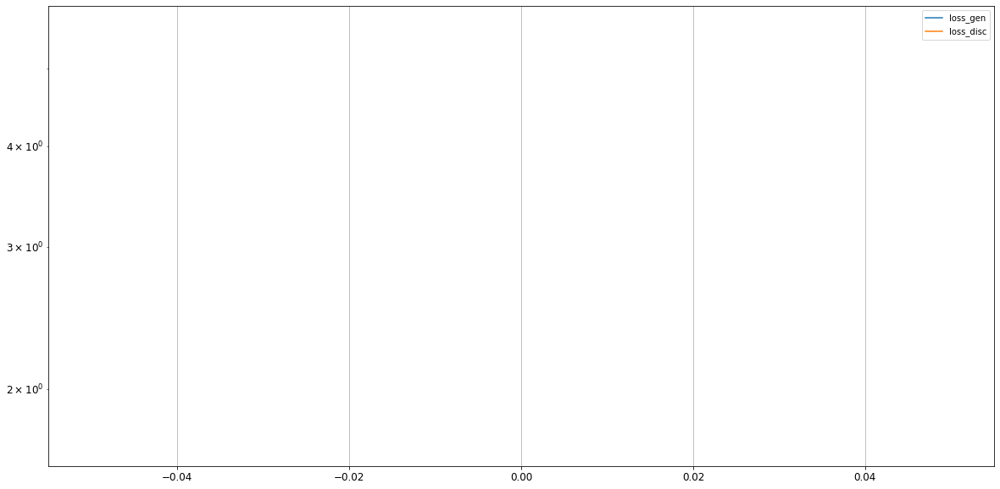

Epoch 2/20000
0s
Epoch 3/20000
0s
Epoch 4/20000
0s
Epoch 5/20000
0s
Epoch 6/20000
0s
Epoch 7/20000
0s
Epoch 8/20000
0s
Epoch 9/20000
0s
Epoch 10/20000
0s
Epoch 11/20000
0s
Epoch 12/20000
0s
Epoch 13/20000
0s
Epoch 14/20000
0s
Epoch 15/20000
0s
Epoch 16/20000
0s
Epoch 17/20000
0s
Epoch 18/20000
0s
Epoch 19/20000
0s
Epoch 20/20000
0s
Epoch 21/20000
0s
Epoch 22/20000
0s
Epoch 23/20000
0s
Epoch 24/20000
0s
Epoch 25/20000
0s
Epoch 26/20000
0s
Epoch 27/20000
0s
Epoch 28/20000
0s
Epoch 29/20000
0s
Epoch 30/20000
0s
Epoch 31/20000
0s
Epoch 32/20000
0s
Epoch 33/20000
0s
Epoch 34/20000
0s
Epoch 35/20000
0s
Epoch 36/20000
0s
Epoch 37/20000
0s
Epoch 38/20000
0s
Epoch 39/20000
0s
Epoch 40/20000
0s
Epoch 41/20000
0s
Epoch 42/20000
0s
Epoch 43/20000
0s
Epoch 44/20000
0s
Epoch 45/20000
0s
Epoch 46/20000
0s
Epoch 47/20000
0s
Epoch 48/20000
0s
Epoch 49/20000
0s
Epoch 50/20000
0s
Epoch 51/20000
0s
Epoch 52/20000
0s
Epoch 53/20000
0s
Epoch 54/20000
0s
Epoch 55/20000
0s
Epoch 56/20000
0s
Epoch 57/20000
0s


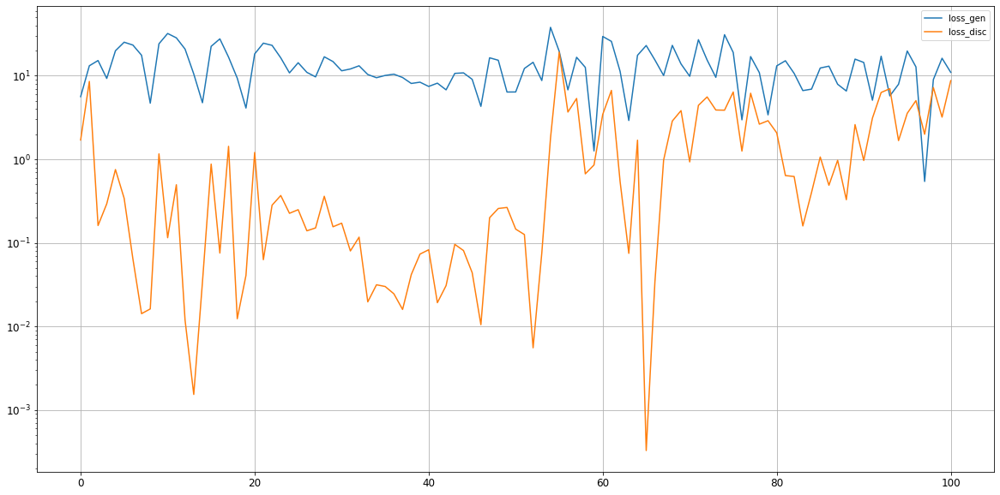

Epoch 102/20000
0s
Epoch 103/20000
0s
Epoch 104/20000
0s
Epoch 105/20000
0s
Epoch 106/20000
0s
Epoch 107/20000
0s
Epoch 108/20000
0s
Epoch 109/20000
0s
Epoch 110/20000
0s
Epoch 111/20000
0s
Epoch 112/20000
0s
Epoch 113/20000
0s
Epoch 114/20000
0s
Epoch 115/20000
0s
Epoch 116/20000
0s
Epoch 117/20000
0s
Epoch 118/20000
0s
Epoch 119/20000
0s
Epoch 120/20000
0s
Epoch 121/20000
0s
Epoch 122/20000
0s
Epoch 123/20000
0s
Epoch 124/20000
0s
Epoch 125/20000
0s
Epoch 126/20000
0s
Epoch 127/20000
0s
Epoch 128/20000
0s
Epoch 129/20000
0s
Epoch 130/20000
0s
Epoch 131/20000
0s
Epoch 132/20000
0s
Epoch 133/20000
0s
Epoch 134/20000
0s
Epoch 135/20000
0s
Epoch 136/20000
0s
Epoch 137/20000
0s
Epoch 138/20000
0s
Epoch 139/20000
0s
Epoch 140/20000
0s
Epoch 141/20000
0s
Epoch 142/20000
0s
Epoch 143/20000
0s
Epoch 144/20000
0s
Epoch 145/20000
0s
Epoch 146/20000
0s
Epoch 147/20000
0s
Epoch 148/20000
0s
Epoch 149/20000
0s
Epoch 150/20000
0s
Epoch 151/20000
0s
Epoch 152/20000
0s
Epoch 153/20000
0s
Epoch 154/20

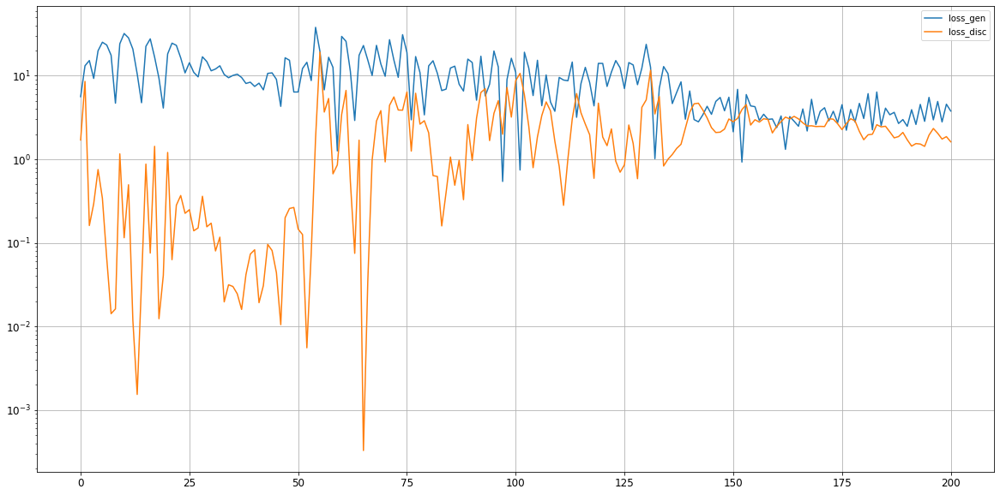

Epoch 202/20000
0s
Epoch 203/20000
0s
Epoch 204/20000
0s
Epoch 205/20000
0s
Epoch 206/20000
0s
Epoch 207/20000
0s
Epoch 208/20000
0s
Epoch 209/20000
0s
Epoch 210/20000
0s
Epoch 211/20000
0s
Epoch 212/20000
0s
Epoch 213/20000
0s
Epoch 214/20000
0s
Epoch 215/20000
0s
Epoch 216/20000
0s
Epoch 217/20000
0s
Epoch 218/20000
0s
Epoch 219/20000
0s
Epoch 220/20000
0s
Epoch 221/20000
0s
Epoch 222/20000
0s
Epoch 223/20000
0s
Epoch 224/20000
0s
Epoch 225/20000
0s
Epoch 226/20000
0s
Epoch 227/20000
0s
Epoch 228/20000
0s
Epoch 229/20000
0s
Epoch 230/20000
0s
Epoch 231/20000
0s
Epoch 232/20000
0s
Epoch 233/20000
0s
Epoch 234/20000
0s
Epoch 235/20000
0s
Epoch 236/20000
0s
Epoch 237/20000
0s
Epoch 238/20000
0s
Epoch 239/20000
0s
Epoch 240/20000
0s
Epoch 241/20000
0s
Epoch 242/20000
0s
Epoch 243/20000
0s
Epoch 244/20000
0s
Epoch 245/20000
0s
Epoch 246/20000
0s
Epoch 247/20000
0s
Epoch 248/20000
0s
Epoch 249/20000
0s
Epoch 250/20000
0s
Epoch 251/20000
0s
Epoch 252/20000
0s
Epoch 253/20000
0s
Epoch 254/20

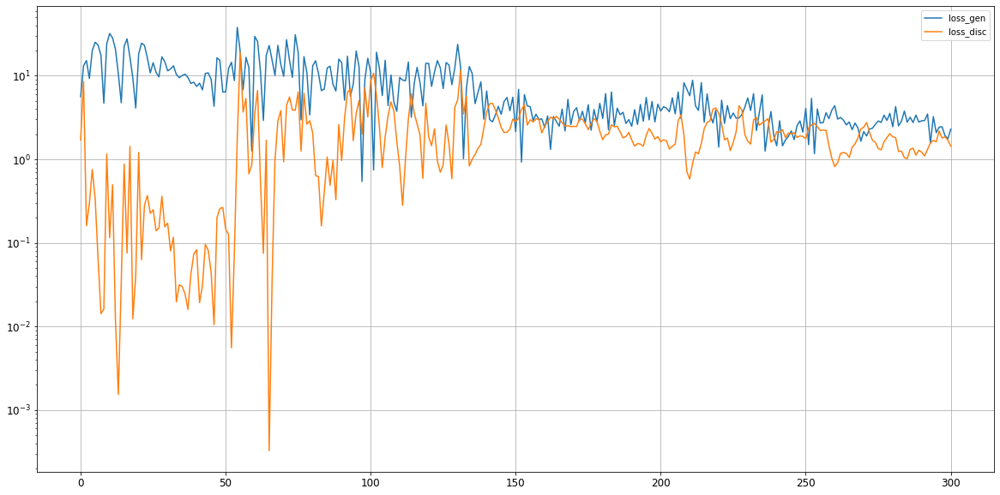

Epoch 302/20000
0s
Epoch 303/20000
0s
Epoch 304/20000
0s
Epoch 305/20000
0s
Epoch 306/20000
0s
Epoch 307/20000
0s
Epoch 308/20000
0s
Epoch 309/20000
0s
Epoch 310/20000
0s
Epoch 311/20000
0s
Epoch 312/20000
0s
Epoch 313/20000
0s
Epoch 314/20000
0s
Epoch 315/20000
0s
Epoch 316/20000
0s
Epoch 317/20000
0s
Epoch 318/20000
0s
Epoch 319/20000
0s
Epoch 320/20000
0s
Epoch 321/20000
0s
Epoch 322/20000
0s
Epoch 323/20000
0s
Epoch 324/20000
0s
Epoch 325/20000
0s
Epoch 326/20000
0s
Epoch 327/20000
0s
Epoch 328/20000
0s
Epoch 329/20000
0s
Epoch 330/20000
0s
Epoch 331/20000
0s
Epoch 332/20000
0s
Epoch 333/20000
0s
Epoch 334/20000
0s
Epoch 335/20000
0s
Epoch 336/20000
0s
Epoch 337/20000
0s
Epoch 338/20000
0s
Epoch 339/20000
0s
Epoch 340/20000
0s
Epoch 341/20000
0s
Epoch 342/20000
0s
Epoch 343/20000
0s
Epoch 344/20000
0s
Epoch 345/20000
0s
Epoch 346/20000
0s
Epoch 347/20000
0s
Epoch 348/20000
0s
Epoch 349/20000
0s
Epoch 350/20000
0s
Epoch 351/20000
0s
Epoch 352/20000
0s
Epoch 353/20000
0s
Epoch 354/20

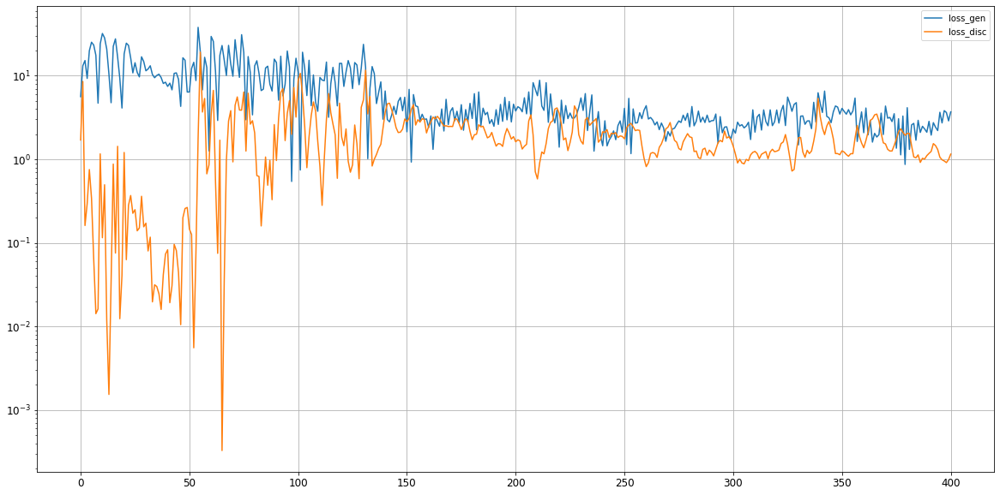

Epoch 402/20000
0s
Epoch 403/20000
0s
Epoch 404/20000
0s
Epoch 405/20000
0s
Epoch 406/20000
0s
Epoch 407/20000
0s
Epoch 408/20000
0s
Epoch 409/20000
0s
Epoch 410/20000
0s
Epoch 411/20000
0s
Epoch 412/20000
0s
Epoch 413/20000
0s
Epoch 414/20000
0s
Epoch 415/20000
0s
Epoch 416/20000
0s
Epoch 417/20000
0s
Epoch 418/20000
0s
Epoch 419/20000
0s
Epoch 420/20000
0s
Epoch 421/20000
0s
Epoch 422/20000
0s
Epoch 423/20000
0s
Epoch 424/20000
0s
Epoch 425/20000
0s
Epoch 426/20000
0s
Epoch 427/20000
0s
Epoch 428/20000
0s
Epoch 429/20000
0s
Epoch 430/20000
0s
Epoch 431/20000
0s
Epoch 432/20000
0s
Epoch 433/20000
0s
Epoch 434/20000
0s
Epoch 435/20000
0s
Epoch 436/20000
0s
Epoch 437/20000
0s
Epoch 438/20000
0s
Epoch 439/20000
0s
Epoch 440/20000
0s
Epoch 441/20000
0s
Epoch 442/20000
0s
Epoch 443/20000
0s
Epoch 444/20000
0s
Epoch 445/20000
0s
Epoch 446/20000
0s
Epoch 447/20000
0s
Epoch 448/20000
0s
Epoch 449/20000
0s
Epoch 450/20000
0s
Epoch 451/20000
0s
Epoch 452/20000
0s
Epoch 453/20000
0s
Epoch 454/20

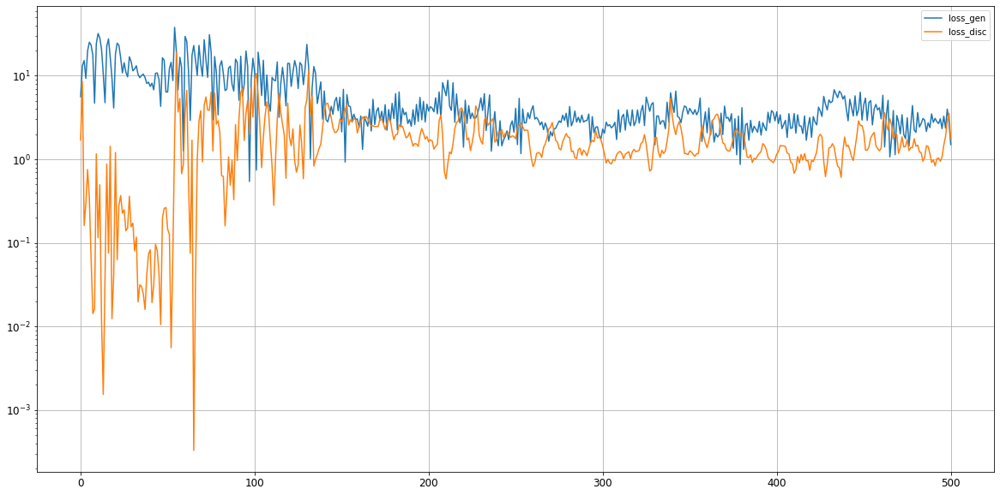

Epoch 502/20000
0s
Epoch 503/20000
0s
Epoch 504/20000
0s
Epoch 505/20000
0s
Epoch 506/20000
0s
Epoch 507/20000
0s
Epoch 508/20000
0s
Epoch 509/20000
0s
Epoch 510/20000
0s
Epoch 511/20000
0s
Epoch 512/20000
0s
Epoch 513/20000
0s
Epoch 514/20000
0s
Epoch 515/20000
0s
Epoch 516/20000
0s
Epoch 517/20000
0s
Epoch 518/20000
0s
Epoch 519/20000
0s
Epoch 520/20000
0s
Epoch 521/20000
0s
Epoch 522/20000
0s
Epoch 523/20000
0s
Epoch 524/20000
0s
Epoch 525/20000
0s
Epoch 526/20000
0s
Epoch 527/20000
0s
Epoch 528/20000
0s
Epoch 529/20000
0s
Epoch 530/20000
0s
Epoch 531/20000
0s
Epoch 532/20000
0s
Epoch 533/20000
0s
Epoch 534/20000
0s
Epoch 535/20000
0s
Epoch 536/20000
0s
Epoch 537/20000
0s
Epoch 538/20000
0s
Epoch 539/20000
0s
Epoch 540/20000
0s
Epoch 541/20000
0s
Epoch 542/20000
0s
Epoch 543/20000
0s
Epoch 544/20000
0s
Epoch 545/20000
0s
Epoch 546/20000
0s
Epoch 547/20000
0s
Epoch 548/20000
0s
Epoch 549/20000
0s
Epoch 550/20000
0s
Epoch 551/20000
0s
Epoch 552/20000
0s
Epoch 553/20000
0s
Epoch 554/20

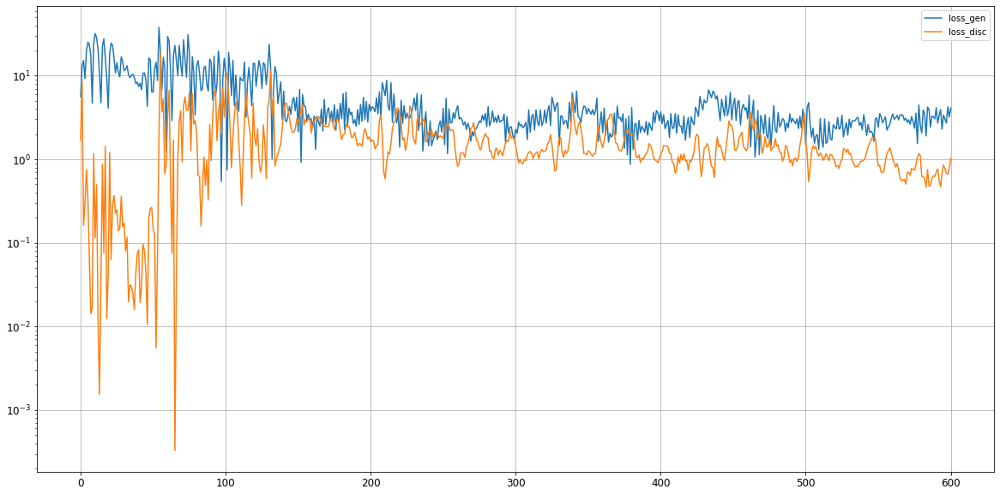

Epoch 602/20000
0s
Epoch 603/20000
0s
Epoch 604/20000
0s
Epoch 605/20000
0s
Epoch 606/20000
0s
Epoch 607/20000
0s
Epoch 608/20000
0s
Epoch 609/20000
0s
Epoch 610/20000
0s
Epoch 611/20000
0s
Epoch 612/20000
0s
Epoch 613/20000
0s
Epoch 614/20000
0s
Epoch 615/20000
0s
Epoch 616/20000
0s
Epoch 617/20000
0s
Epoch 618/20000
0s
Epoch 619/20000
0s
Epoch 620/20000
0s
Epoch 621/20000
0s
Epoch 622/20000
0s
Epoch 623/20000
0s
Epoch 624/20000
0s
Epoch 625/20000
0s
Epoch 626/20000
0s
Epoch 627/20000
0s
Epoch 628/20000
0s
Epoch 629/20000
0s
Epoch 630/20000
0s
Epoch 631/20000
0s
Epoch 632/20000
0s
Epoch 633/20000
0s
Epoch 634/20000
0s
Epoch 635/20000
0s
Epoch 636/20000
0s
Epoch 637/20000
0s
Epoch 638/20000
0s
Epoch 639/20000
0s
Epoch 640/20000
0s
Epoch 641/20000
0s
Epoch 642/20000
0s
Epoch 643/20000
0s
Epoch 644/20000
0s
Epoch 645/20000
0s
Epoch 646/20000
0s
Epoch 647/20000
0s
Epoch 648/20000
0s
Epoch 649/20000
0s
Epoch 650/20000
0s
Epoch 651/20000
0s
Epoch 652/20000
0s
Epoch 653/20000
0s
Epoch 654/20

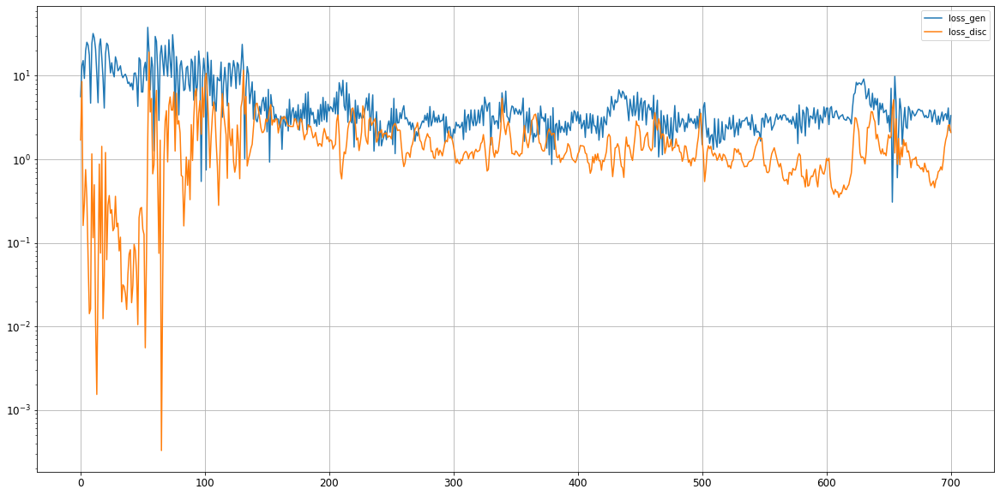

Epoch 702/20000
0s
Epoch 703/20000
0s
Epoch 704/20000
0s
Epoch 705/20000
0s
Epoch 706/20000
0s
Epoch 707/20000
0s
Epoch 708/20000
0s
Epoch 709/20000
0s
Epoch 710/20000
0s
Epoch 711/20000
0s
Epoch 712/20000
0s
Epoch 713/20000
0s
Epoch 714/20000
0s
Epoch 715/20000
0s
Epoch 716/20000
0s
Epoch 717/20000
0s
Epoch 718/20000
0s
Epoch 719/20000
0s
Epoch 720/20000
0s
Epoch 721/20000
0s
Epoch 722/20000
0s
Epoch 723/20000
0s
Epoch 724/20000
0s
Epoch 725/20000
0s
Epoch 726/20000
0s
Epoch 727/20000
0s
Epoch 728/20000
0s
Epoch 729/20000
0s
Epoch 730/20000
0s
Epoch 731/20000
0s
Epoch 732/20000
0s
Epoch 733/20000
0s
Epoch 734/20000
0s
Epoch 735/20000
0s
Epoch 736/20000
0s
Epoch 737/20000
0s
Epoch 738/20000
0s
Epoch 739/20000
0s
Epoch 740/20000
0s
Epoch 741/20000
0s
Epoch 742/20000
0s
Epoch 743/20000
0s
Epoch 744/20000
0s
Epoch 745/20000
0s
Epoch 746/20000
0s
Epoch 747/20000
0s
Epoch 748/20000
0s
Epoch 749/20000
0s
Epoch 750/20000
0s
Epoch 751/20000
0s
Epoch 752/20000
0s
Epoch 753/20000
0s
Epoch 754/20

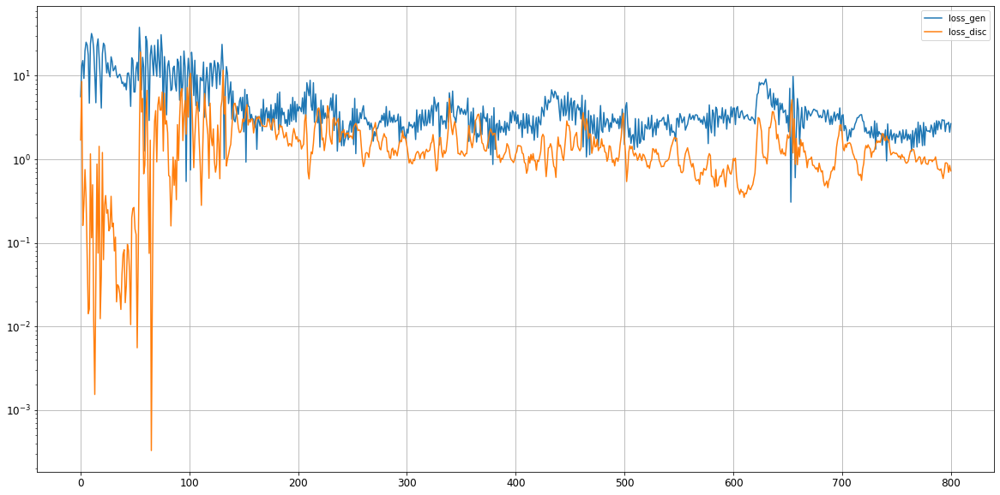

Epoch 802/20000
0s
Epoch 803/20000
0s
Epoch 804/20000
0s
Epoch 805/20000
0s
Epoch 806/20000
0s
Epoch 807/20000
0s
Epoch 808/20000
0s
Epoch 809/20000
0s
Epoch 810/20000
0s
Epoch 811/20000
0s
Epoch 812/20000
0s
Epoch 813/20000
0s
Epoch 814/20000
0s
Epoch 815/20000
0s
Epoch 816/20000
0s
Epoch 817/20000
0s
Epoch 818/20000
0s
Epoch 819/20000
0s
Epoch 820/20000
0s
Epoch 821/20000
0s
Epoch 822/20000
0s
Epoch 823/20000
0s
Epoch 824/20000
0s
Epoch 825/20000
0s
Epoch 826/20000
0s
Epoch 827/20000
0s
Epoch 828/20000
0s
Epoch 829/20000
0s
Epoch 830/20000
0s
Epoch 831/20000
0s
Epoch 832/20000
0s
Epoch 833/20000
0s
Epoch 834/20000
0s
Epoch 835/20000
0s
Epoch 836/20000
0s
Epoch 837/20000
0s
Epoch 838/20000
0s
Epoch 839/20000
0s
Epoch 840/20000
0s
Epoch 841/20000
0s
Epoch 842/20000
0s
Epoch 843/20000
0s
Epoch 844/20000
0s
Epoch 845/20000
0s
Epoch 846/20000
0s
Epoch 847/20000
0s
Epoch 848/20000
0s
Epoch 849/20000
0s
Epoch 850/20000
0s
Epoch 851/20000
0s
Epoch 852/20000
0s
Epoch 853/20000
0s
Epoch 854/20

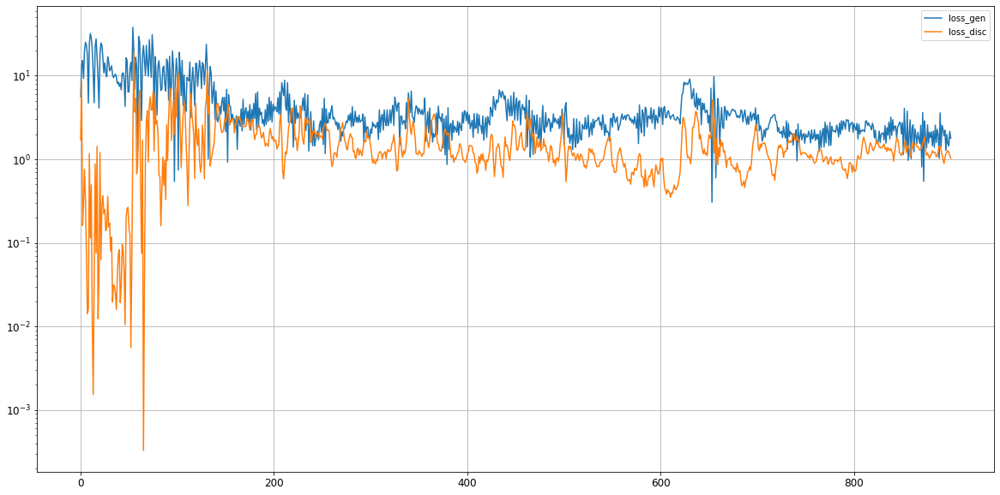

Epoch 902/20000
0s
Epoch 903/20000
0s
Epoch 904/20000
0s
Epoch 905/20000
0s
Epoch 906/20000
0s
Epoch 907/20000
0s
Epoch 908/20000
0s
Epoch 909/20000
0s
Epoch 910/20000
0s
Epoch 911/20000
0s
Epoch 912/20000
0s
Epoch 913/20000
0s
Epoch 914/20000
0s
Epoch 915/20000
0s
Epoch 916/20000
0s
Epoch 917/20000
0s
Epoch 918/20000
0s
Epoch 919/20000
0s
Epoch 920/20000
0s
Epoch 921/20000
0s
Epoch 922/20000
0s
Epoch 923/20000
0s
Epoch 924/20000
0s
Epoch 925/20000
0s
Epoch 926/20000
0s
Epoch 927/20000
0s
Epoch 928/20000
0s
Epoch 929/20000
0s
Epoch 930/20000
0s
Epoch 931/20000
0s
Epoch 932/20000
0s
Epoch 933/20000
0s
Epoch 934/20000
0s
Epoch 935/20000
0s
Epoch 936/20000
0s
Epoch 937/20000
0s
Epoch 938/20000
0s
Epoch 939/20000
0s
Epoch 940/20000
0s
Epoch 941/20000
0s
Epoch 942/20000
0s
Epoch 943/20000
0s
Epoch 944/20000
0s
Epoch 945/20000
0s
Epoch 946/20000
0s
Epoch 947/20000
0s
Epoch 948/20000
0s
Epoch 949/20000
0s
Epoch 950/20000
0s
Epoch 951/20000
0s
Epoch 952/20000
0s
Epoch 953/20000
0s
Epoch 954/20

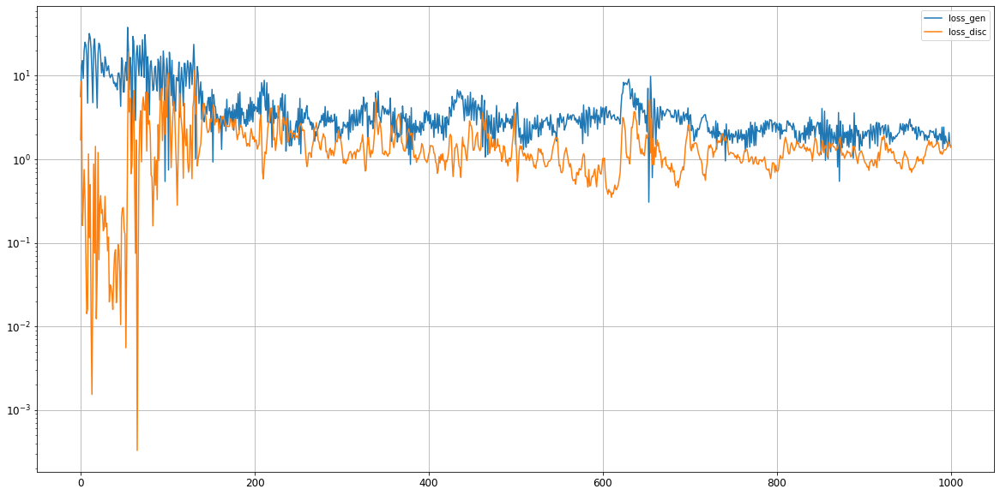

Epoch 1002/20000
0s
Epoch 1003/20000
0s
Epoch 1004/20000
0s
Epoch 1005/20000
0s
Epoch 1006/20000
0s
Epoch 1007/20000
0s
Epoch 1008/20000
0s
Epoch 1009/20000
0s
Epoch 1010/20000
0s
Epoch 1011/20000
0s
Epoch 1012/20000
0s
Epoch 1013/20000
0s
Epoch 1014/20000
0s
Epoch 1015/20000
0s
Epoch 1016/20000
0s
Epoch 1017/20000
0s
Epoch 1018/20000
0s
Epoch 1019/20000
0s
Epoch 1020/20000
0s
Epoch 1021/20000
0s
Epoch 1022/20000
0s
Epoch 1023/20000
0s
Epoch 1024/20000
0s
Epoch 1025/20000
0s
Epoch 1026/20000
0s
Epoch 1027/20000
0s
Epoch 1028/20000
0s
Epoch 1029/20000
0s
Epoch 1030/20000
0s
Epoch 1031/20000
0s
Epoch 1032/20000
0s
Epoch 1033/20000
0s
Epoch 1034/20000
0s
Epoch 1035/20000
0s
Epoch 1036/20000
0s
Epoch 1037/20000
0s
Epoch 1038/20000
0s
Epoch 1039/20000
0s
Epoch 1040/20000
0s
Epoch 1041/20000
0s
Epoch 1042/20000
0s
Epoch 1043/20000
0s
Epoch 1044/20000
0s
Epoch 1045/20000
0s
Epoch 1046/20000
0s
Epoch 1047/20000
0s
Epoch 1048/20000
0s
Epoch 1049/20000
0s
Epoch 1050/20000
0s
Epoch 1051/20000
0s


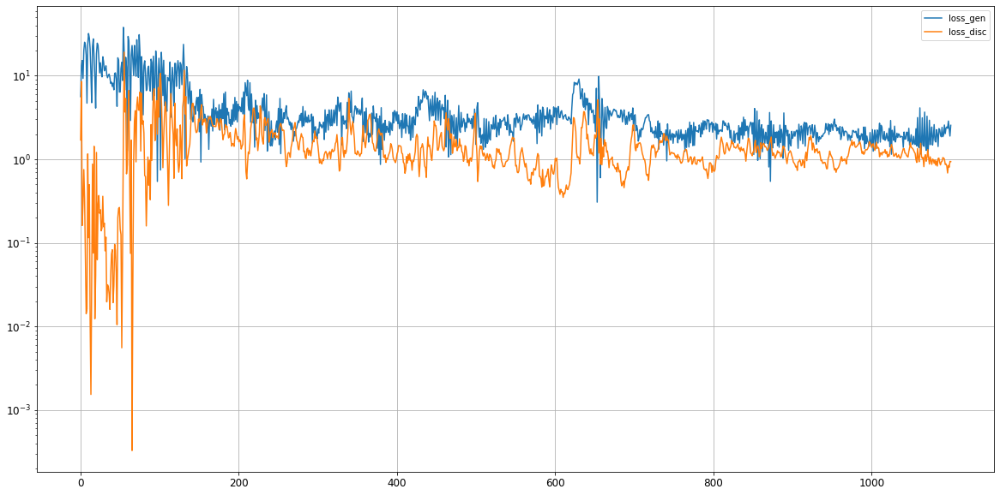

Epoch 1102/20000
0s
Epoch 1103/20000
0s
Epoch 1104/20000
0s
Epoch 1105/20000
0s
Epoch 1106/20000
0s
Epoch 1107/20000
0s
Epoch 1108/20000
0s
Epoch 1109/20000
0s
Epoch 1110/20000
0s
Epoch 1111/20000
0s
Epoch 1112/20000
0s
Epoch 1113/20000
0s
Epoch 1114/20000
0s
Epoch 1115/20000
0s
Epoch 1116/20000
0s
Epoch 1117/20000
0s
Epoch 1118/20000
0s
Epoch 1119/20000
0s
Epoch 1120/20000
0s
Epoch 1121/20000
0s
Epoch 1122/20000
0s
Epoch 1123/20000
0s
Epoch 1124/20000
0s
Epoch 1125/20000
0s
Epoch 1126/20000
0s
Epoch 1127/20000
0s
Epoch 1128/20000
0s
Epoch 1129/20000
0s
Epoch 1130/20000
0s
Epoch 1131/20000
0s
Epoch 1132/20000
0s
Epoch 1133/20000
0s
Epoch 1134/20000
0s
Epoch 1135/20000
0s
Epoch 1136/20000
0s
Epoch 1137/20000
0s
Epoch 1138/20000
0s
Epoch 1139/20000
0s
Epoch 1140/20000
0s
Epoch 1141/20000
0s
Epoch 1142/20000
0s
Epoch 1143/20000
0s
Epoch 1144/20000
0s
Epoch 1145/20000
0s
Epoch 1146/20000
0s
Epoch 1147/20000
0s
Epoch 1148/20000
0s
Epoch 1149/20000
0s
Epoch 1150/20000
0s
Epoch 1151/20000
0s


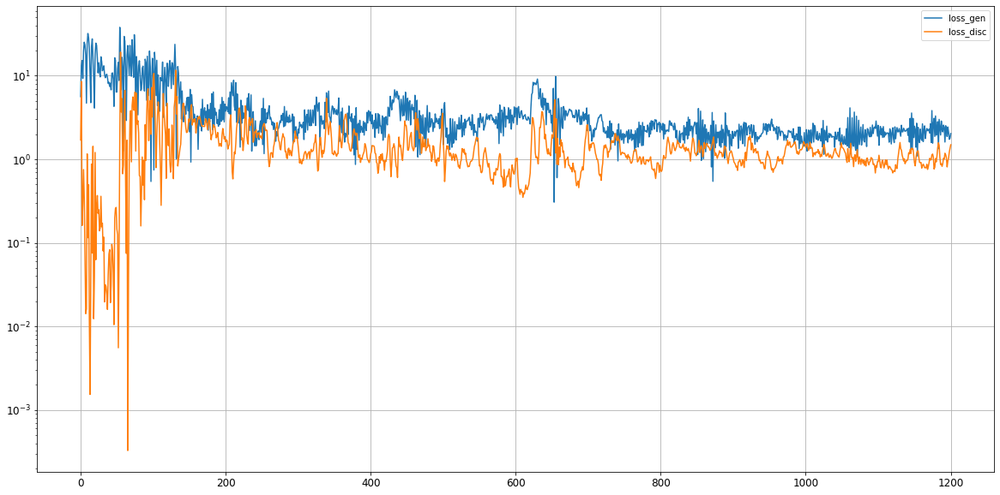

Epoch 1202/20000
0s
Epoch 1203/20000
0s
Epoch 1204/20000
0s
Epoch 1205/20000
0s
Epoch 1206/20000
0s
Epoch 1207/20000
0s
Epoch 1208/20000
0s
Epoch 1209/20000
0s
Epoch 1210/20000
0s
Epoch 1211/20000
0s
Epoch 1212/20000
0s
Epoch 1213/20000
0s
Epoch 1214/20000
0s
Epoch 1215/20000
0s
Epoch 1216/20000
0s
Epoch 1217/20000
0s
Epoch 1218/20000
0s
Epoch 1219/20000
0s
Epoch 1220/20000
0s
Epoch 1221/20000
0s
Epoch 1222/20000
0s
Epoch 1223/20000
0s
Epoch 1224/20000
0s
Epoch 1225/20000
0s
Epoch 1226/20000
0s
Epoch 1227/20000
0s
Epoch 1228/20000
0s
Epoch 1229/20000
0s
Epoch 1230/20000
0s
Epoch 1231/20000
0s
Epoch 1232/20000
0s
Epoch 1233/20000
0s
Epoch 1234/20000
0s
Epoch 1235/20000
0s
Epoch 1236/20000
0s
Epoch 1237/20000
0s
Epoch 1238/20000
0s
Epoch 1239/20000
0s
Epoch 1240/20000
0s
Epoch 1241/20000
0s
Epoch 1242/20000
0s
Epoch 1243/20000
0s
Epoch 1244/20000
0s
Epoch 1245/20000
0s
Epoch 1246/20000
0s
Epoch 1247/20000
0s
Epoch 1248/20000
0s
Epoch 1249/20000
0s
Epoch 1250/20000
0s
Epoch 1251/20000
0s


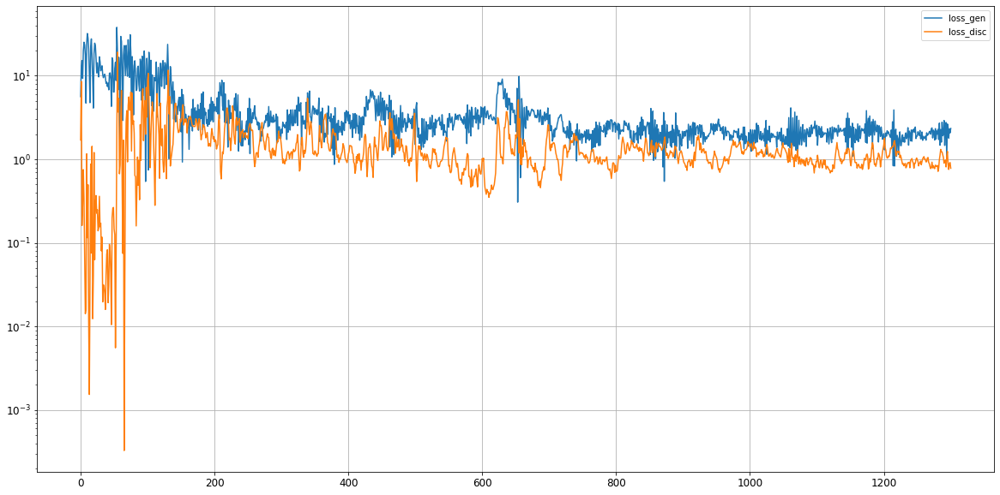

Epoch 1302/20000
0s
Epoch 1303/20000
0s
Epoch 1304/20000
0s
Epoch 1305/20000
0s
Epoch 1306/20000
0s
Epoch 1307/20000
0s
Epoch 1308/20000
0s
Epoch 1309/20000
0s
Epoch 1310/20000
0s
Epoch 1311/20000
0s
Epoch 1312/20000
0s
Epoch 1313/20000
0s
Epoch 1314/20000
0s
Epoch 1315/20000
0s
Epoch 1316/20000
0s
Epoch 1317/20000
0s
Epoch 1318/20000
0s
Epoch 1319/20000
0s
Epoch 1320/20000
0s
Epoch 1321/20000
0s
Epoch 1322/20000
0s
Epoch 1323/20000
0s
Epoch 1324/20000
0s
Epoch 1325/20000
0s
Epoch 1326/20000
0s
Epoch 1327/20000
0s
Epoch 1328/20000
0s
Epoch 1329/20000
0s
Epoch 1330/20000
0s
Epoch 1331/20000
0s
Epoch 1332/20000
0s
Epoch 1333/20000
0s
Epoch 1334/20000
0s
Epoch 1335/20000
0s
Epoch 1336/20000
0s
Epoch 1337/20000
0s
Epoch 1338/20000
0s
Epoch 1339/20000
0s
Epoch 1340/20000
0s
Epoch 1341/20000
0s
Epoch 1342/20000
0s
Epoch 1343/20000
0s
Epoch 1344/20000
0s
Epoch 1345/20000
0s
Epoch 1346/20000
0s
Epoch 1347/20000
0s
Epoch 1348/20000
0s
Epoch 1349/20000
0s
Epoch 1350/20000
0s
Epoch 1351/20000
0s


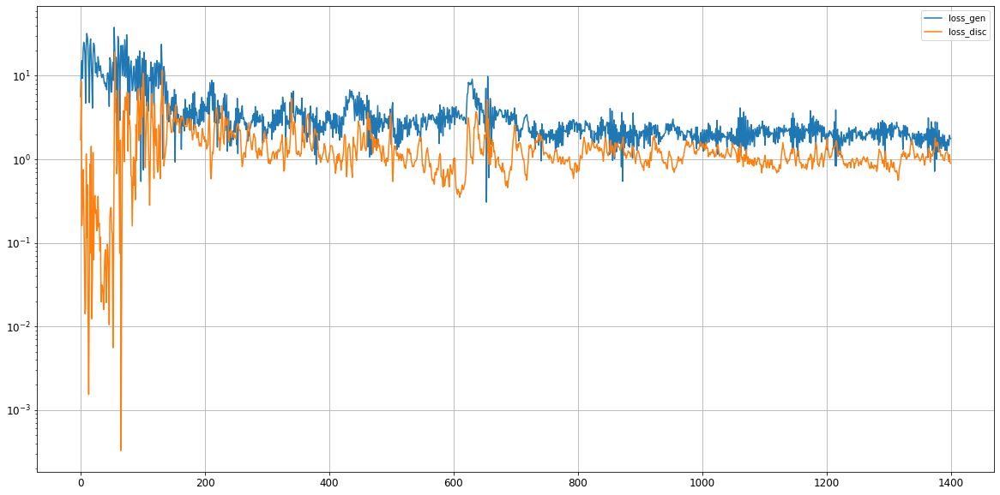

Epoch 1402/20000
0s
Epoch 1403/20000
0s
Epoch 1404/20000
0s
Epoch 1405/20000
0s
Epoch 1406/20000
0s
Epoch 1407/20000
0s
Epoch 1408/20000
0s
Epoch 1409/20000
0s
Epoch 1410/20000
0s
Epoch 1411/20000
0s
Epoch 1412/20000
0s
Epoch 1413/20000
0s
Epoch 1414/20000
0s
Epoch 1415/20000
0s
Epoch 1416/20000
0s
Epoch 1417/20000
0s
Epoch 1418/20000
0s
Epoch 1419/20000
0s
Epoch 1420/20000
0s
Epoch 1421/20000
0s
Epoch 1422/20000
0s
Epoch 1423/20000
0s
Epoch 1424/20000
0s
Epoch 1425/20000
0s
Epoch 1426/20000
0s
Epoch 1427/20000
0s
Epoch 1428/20000
0s
Epoch 1429/20000
0s
Epoch 1430/20000
0s
Epoch 1431/20000
0s
Epoch 1432/20000
0s
Epoch 1433/20000
0s
Epoch 1434/20000
0s
Epoch 1435/20000
0s
Epoch 1436/20000
0s
Epoch 1437/20000
0s
Epoch 1438/20000
0s
Epoch 1439/20000
0s
Epoch 1440/20000
0s
Epoch 1441/20000
0s
Epoch 1442/20000
0s
Epoch 1443/20000
0s
Epoch 1444/20000
0s
Epoch 1445/20000
0s
Epoch 1446/20000
0s
Epoch 1447/20000
0s
Epoch 1448/20000
0s
Epoch 1449/20000
0s
Epoch 1450/20000
0s
Epoch 1451/20000
0s


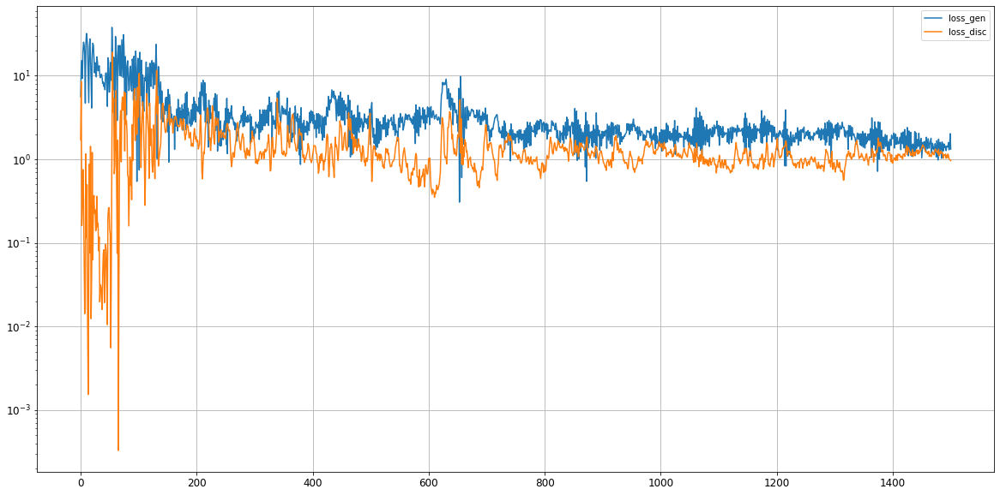

Epoch 1502/20000
0s
Epoch 1503/20000
0s
Epoch 1504/20000
0s
Epoch 1505/20000
0s
Epoch 1506/20000
0s
Epoch 1507/20000
0s
Epoch 1508/20000
0s
Epoch 1509/20000
0s
Epoch 1510/20000
0s
Epoch 1511/20000
0s
Epoch 1512/20000
0s
Epoch 1513/20000
0s
Epoch 1514/20000
0s
Epoch 1515/20000
0s
Epoch 1516/20000
0s
Epoch 1517/20000
0s
Epoch 1518/20000
0s
Epoch 1519/20000
0s
Epoch 1520/20000
0s
Epoch 1521/20000
0s
Epoch 1522/20000
0s
Epoch 1523/20000
0s
Epoch 1524/20000
0s
Epoch 1525/20000
0s
Epoch 1526/20000
0s
Epoch 1527/20000
0s
Epoch 1528/20000
0s
Epoch 1529/20000
0s
Epoch 1530/20000
0s
Epoch 1531/20000
0s
Epoch 1532/20000
0s
Epoch 1533/20000
0s
Epoch 1534/20000
0s
Epoch 1535/20000
0s
Epoch 1536/20000
0s
Epoch 1537/20000
0s
Epoch 1538/20000
0s
Epoch 1539/20000
0s
Epoch 1540/20000
0s
Epoch 1541/20000
0s
Epoch 1542/20000
0s
Epoch 1543/20000
0s
Epoch 1544/20000
0s
Epoch 1545/20000
0s
Epoch 1546/20000
0s
Epoch 1547/20000
0s
Epoch 1548/20000
0s
Epoch 1549/20000
0s
Epoch 1550/20000
0s
Epoch 1551/20000
0s


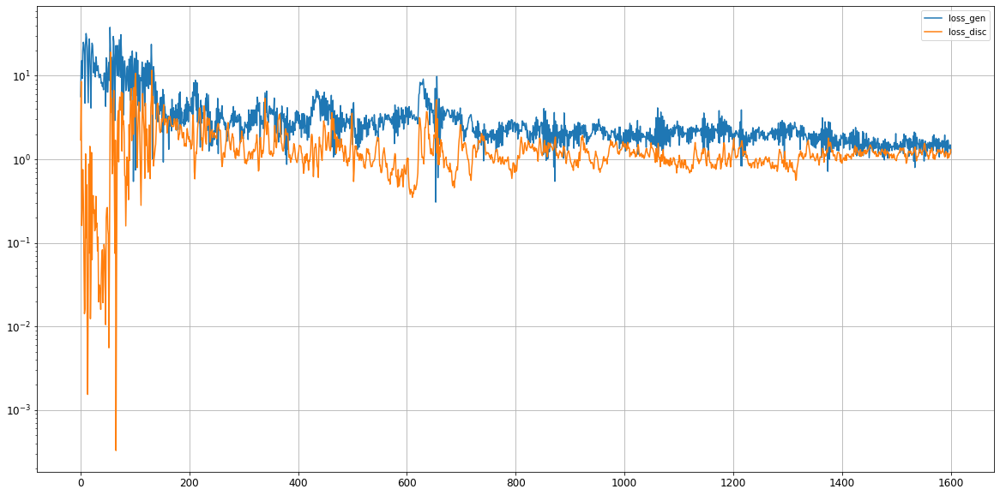

Epoch 1602/20000
0s
Epoch 1603/20000
0s
Epoch 1604/20000
0s
Epoch 1605/20000
0s
Epoch 1606/20000
0s
Epoch 1607/20000
0s
Epoch 1608/20000
0s
Epoch 1609/20000
0s
Epoch 1610/20000
0s
Epoch 1611/20000
0s
Epoch 1612/20000
0s
Epoch 1613/20000
0s
Epoch 1614/20000
0s
Epoch 1615/20000
0s
Epoch 1616/20000
0s
Epoch 1617/20000
0s
Epoch 1618/20000
0s
Epoch 1619/20000
0s
Epoch 1620/20000
0s
Epoch 1621/20000
0s
Epoch 1622/20000
0s
Epoch 1623/20000
0s
Epoch 1624/20000
0s
Epoch 1625/20000
0s
Epoch 1626/20000
0s
Epoch 1627/20000
0s
Epoch 1628/20000
0s
Epoch 1629/20000
0s
Epoch 1630/20000
0s
Epoch 1631/20000
0s
Epoch 1632/20000
0s
Epoch 1633/20000
0s
Epoch 1634/20000
0s
Epoch 1635/20000
0s
Epoch 1636/20000
0s
Epoch 1637/20000
0s
Epoch 1638/20000
0s
Epoch 1639/20000
0s
Epoch 1640/20000
0s
Epoch 1641/20000
0s
Epoch 1642/20000
0s
Epoch 1643/20000
0s
Epoch 1644/20000
0s
Epoch 1645/20000
0s
Epoch 1646/20000
0s
Epoch 1647/20000
0s
Epoch 1648/20000
0s
Epoch 1649/20000
0s
Epoch 1650/20000
0s
Epoch 1651/20000
0s


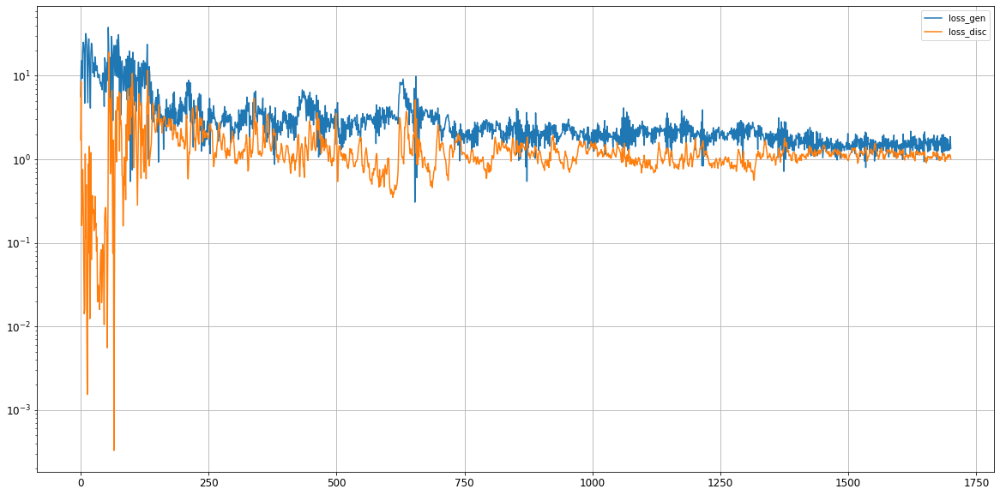

Epoch 1702/20000
0s
Epoch 1703/20000
0s
Epoch 1704/20000
0s
Epoch 1705/20000
0s
Epoch 1706/20000
0s
Epoch 1707/20000
0s
Epoch 1708/20000
0s
Epoch 1709/20000
0s
Epoch 1710/20000
0s
Epoch 1711/20000
0s
Epoch 1712/20000
0s
Epoch 1713/20000
0s
Epoch 1714/20000
0s
Epoch 1715/20000
0s
Epoch 1716/20000
0s
Epoch 1717/20000
0s
Epoch 1718/20000
0s
Epoch 1719/20000
0s
Epoch 1720/20000
0s
Epoch 1721/20000
0s
Epoch 1722/20000
0s
Epoch 1723/20000
0s
Epoch 1724/20000
0s
Epoch 1725/20000
0s
Epoch 1726/20000
0s
Epoch 1727/20000
0s
Epoch 1728/20000
0s
Epoch 1729/20000
0s
Epoch 1730/20000
0s
Epoch 1731/20000
0s
Epoch 1732/20000
0s
Epoch 1733/20000
0s
Epoch 1734/20000
0s
Epoch 1735/20000
0s
Epoch 1736/20000
0s
Epoch 1737/20000
0s
Epoch 1738/20000
0s
Epoch 1739/20000
0s
Epoch 1740/20000
0s
Epoch 1741/20000
0s
Epoch 1742/20000
0s
Epoch 1743/20000
0s
Epoch 1744/20000
0s
Epoch 1745/20000
0s
Epoch 1746/20000
0s
Epoch 1747/20000
0s
Epoch 1748/20000
0s
Epoch 1749/20000
0s
Epoch 1750/20000
0s
Epoch 1751/20000
0s


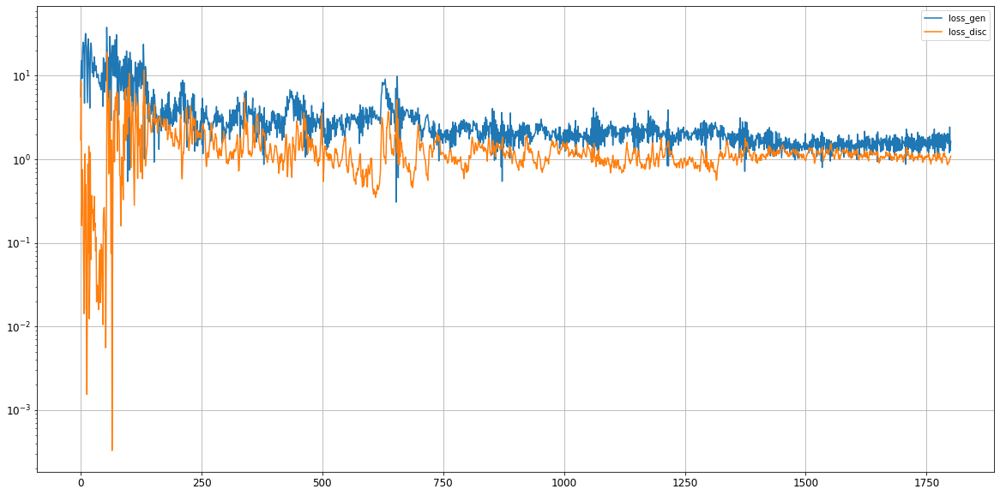

Epoch 1802/20000
0s
Epoch 1803/20000
0s
Epoch 1804/20000
0s
Epoch 1805/20000
0s
Epoch 1806/20000
0s
Epoch 1807/20000
0s
Epoch 1808/20000
0s
Epoch 1809/20000
0s
Epoch 1810/20000
0s
Epoch 1811/20000
0s
Epoch 1812/20000
0s
Epoch 1813/20000
0s
Epoch 1814/20000
0s
Epoch 1815/20000
0s
Epoch 1816/20000
0s
Epoch 1817/20000
0s
Epoch 1818/20000
0s
Epoch 1819/20000
0s
Epoch 1820/20000
0s
Epoch 1821/20000
0s
Epoch 1822/20000
0s
Epoch 1823/20000
0s
Epoch 1824/20000
0s
Epoch 1825/20000
0s
Epoch 1826/20000
0s
Epoch 1827/20000
0s
Epoch 1828/20000
0s
Epoch 1829/20000
0s
Epoch 1830/20000
0s
Epoch 1831/20000
0s
Epoch 1832/20000
0s
Epoch 1833/20000
0s
Epoch 1834/20000
0s
Epoch 1835/20000
0s
Epoch 1836/20000
0s
Epoch 1837/20000
0s
Epoch 1838/20000
0s
Epoch 1839/20000
0s
Epoch 1840/20000
0s
Epoch 1841/20000
0s
Epoch 1842/20000
0s
Epoch 1843/20000
0s
Epoch 1844/20000
0s
Epoch 1845/20000
0s
Epoch 1846/20000
0s
Epoch 1847/20000
0s
Epoch 1848/20000
0s
Epoch 1849/20000
0s
Epoch 1850/20000
0s
Epoch 1851/20000
0s


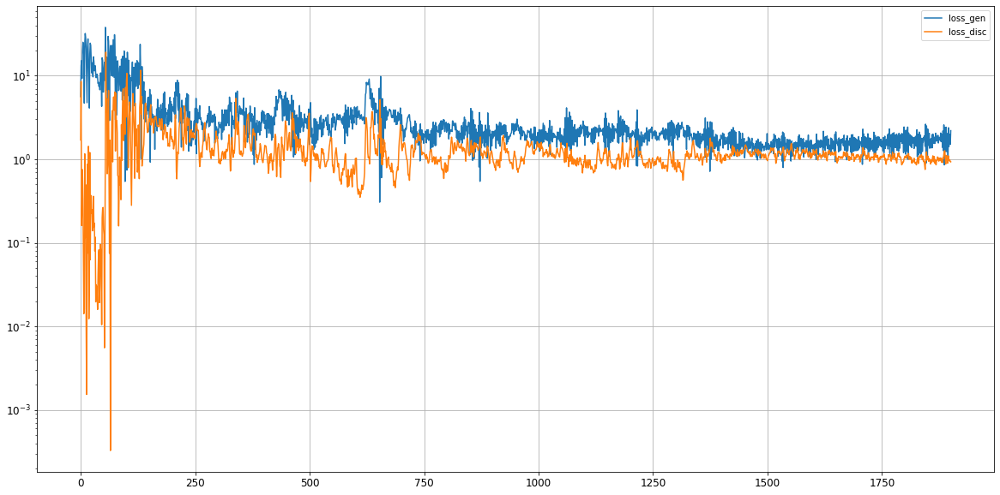

Epoch 1902/20000
0s
Epoch 1903/20000
0s
Epoch 1904/20000
0s
Epoch 1905/20000
0s
Epoch 1906/20000
0s
Epoch 1907/20000
0s
Epoch 1908/20000
0s
Epoch 1909/20000
0s
Epoch 1910/20000
0s
Epoch 1911/20000
0s
Epoch 1912/20000
0s
Epoch 1913/20000
0s
Epoch 1914/20000
0s
Epoch 1915/20000
0s
Epoch 1916/20000
0s
Epoch 1917/20000
0s
Epoch 1918/20000
0s
Epoch 1919/20000
0s
Epoch 1920/20000
0s
Epoch 1921/20000
0s
Epoch 1922/20000
0s
Epoch 1923/20000
0s
Epoch 1924/20000
0s
Epoch 1925/20000
0s
Epoch 1926/20000
0s
Epoch 1927/20000
0s
Epoch 1928/20000
0s
Epoch 1929/20000
0s
Epoch 1930/20000
0s
Epoch 1931/20000
0s
Epoch 1932/20000
0s
Epoch 1933/20000
0s
Epoch 1934/20000
0s
Epoch 1935/20000
0s
Epoch 1936/20000
0s
Epoch 1937/20000
0s
Epoch 1938/20000
0s
Epoch 1939/20000
0s
Epoch 1940/20000
0s
Epoch 1941/20000
0s
Epoch 1942/20000
0s
Epoch 1943/20000
0s
Epoch 1944/20000
0s
Epoch 1945/20000
0s
Epoch 1946/20000
0s
Epoch 1947/20000
0s
Epoch 1948/20000
0s
Epoch 1949/20000
0s
Epoch 1950/20000
0s
Epoch 1951/20000
0s


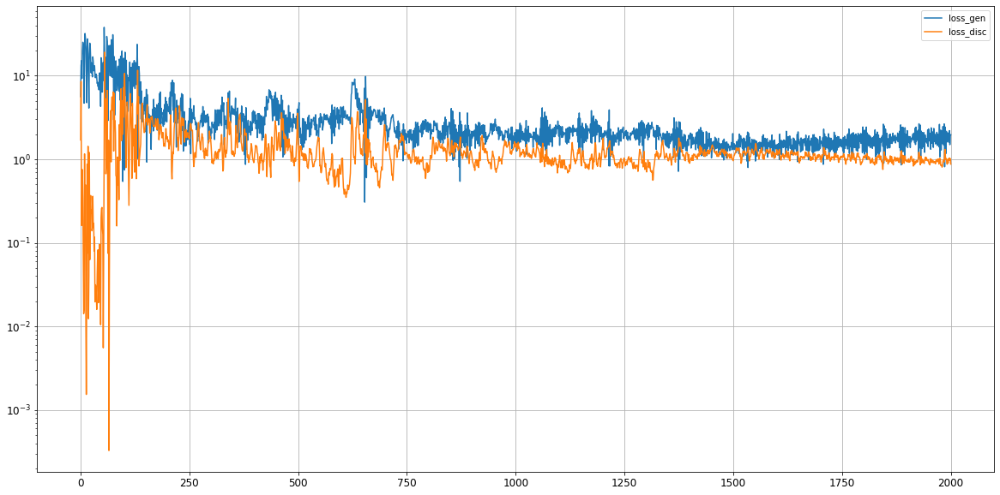

Epoch 2002/20000
0s
Epoch 2003/20000
0s
Epoch 2004/20000
0s
Epoch 2005/20000
0s
Epoch 2006/20000
0s
Epoch 2007/20000
0s
Epoch 2008/20000
0s
Epoch 2009/20000
0s
Epoch 2010/20000
0s
Epoch 2011/20000
0s
Epoch 2012/20000
0s
Epoch 2013/20000
0s
Epoch 2014/20000
0s
Epoch 2015/20000
0s
Epoch 2016/20000
0s
Epoch 2017/20000
0s
Epoch 2018/20000
0s
Epoch 2019/20000
0s
Epoch 2020/20000
0s
Epoch 2021/20000
0s
Epoch 2022/20000
0s
Epoch 2023/20000
0s
Epoch 2024/20000
0s
Epoch 2025/20000
0s
Epoch 2026/20000
0s
Epoch 2027/20000
0s
Epoch 2028/20000
0s
Epoch 2029/20000
0s
Epoch 2030/20000
0s
Epoch 2031/20000
0s
Epoch 2032/20000
0s
Epoch 2033/20000
0s
Epoch 2034/20000
0s
Epoch 2035/20000
0s
Epoch 2036/20000
0s
Epoch 2037/20000
0s
Epoch 2038/20000
0s
Epoch 2039/20000
0s
Epoch 2040/20000
0s
Epoch 2041/20000
0s
Epoch 2042/20000
0s
Epoch 2043/20000
0s
Epoch 2044/20000
0s
Epoch 2045/20000
0s
Epoch 2046/20000
0s
Epoch 2047/20000
0s
Epoch 2048/20000
0s
Epoch 2049/20000
0s
Epoch 2050/20000
0s
Epoch 2051/20000
0s


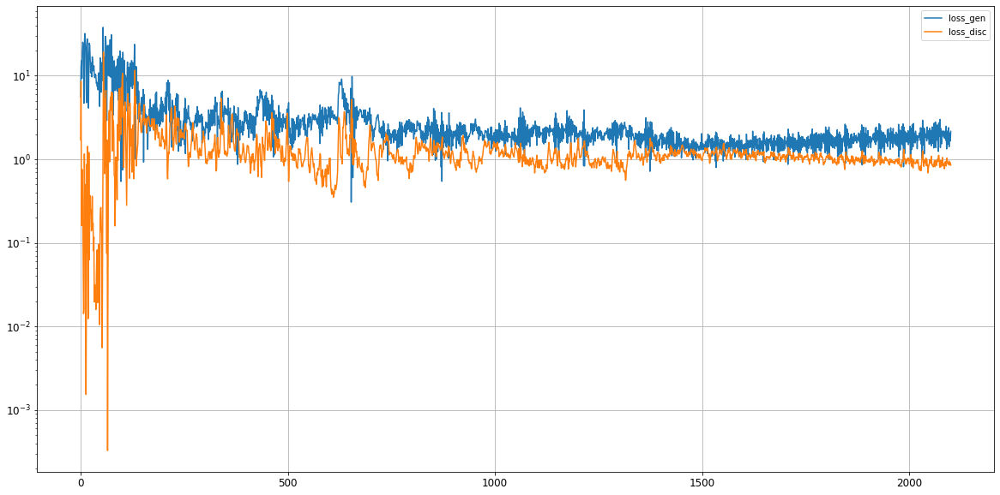

Epoch 2102/20000
0s
Epoch 2103/20000
0s
Epoch 2104/20000
0s
Epoch 2105/20000
0s
Epoch 2106/20000
0s
Epoch 2107/20000
0s
Epoch 2108/20000
0s
Epoch 2109/20000
0s
Epoch 2110/20000
0s
Epoch 2111/20000
0s
Epoch 2112/20000
0s
Epoch 2113/20000
0s
Epoch 2114/20000
0s
Epoch 2115/20000
0s
Epoch 2116/20000
0s
Epoch 2117/20000
0s
Epoch 2118/20000
0s
Epoch 2119/20000
0s
Epoch 2120/20000
0s
Epoch 2121/20000
0s
Epoch 2122/20000
0s
Epoch 2123/20000
0s
Epoch 2124/20000
0s
Epoch 2125/20000
0s
Epoch 2126/20000
0s
Epoch 2127/20000
0s
Epoch 2128/20000
0s
Epoch 2129/20000
0s
Epoch 2130/20000
0s
Epoch 2131/20000
0s
Epoch 2132/20000
0s
Epoch 2133/20000
0s
Epoch 2134/20000
0s
Epoch 2135/20000
0s
Epoch 2136/20000
0s
Epoch 2137/20000
0s
Epoch 2138/20000
0s
Epoch 2139/20000
0s
Epoch 2140/20000
0s
Epoch 2141/20000
0s
Epoch 2142/20000
0s
Epoch 2143/20000
0s
Epoch 2144/20000
0s
Epoch 2145/20000
0s
Epoch 2146/20000
0s
Epoch 2147/20000
0s
Epoch 2148/20000
0s
Epoch 2149/20000
0s
Epoch 2150/20000
0s
Epoch 2151/20000
0s


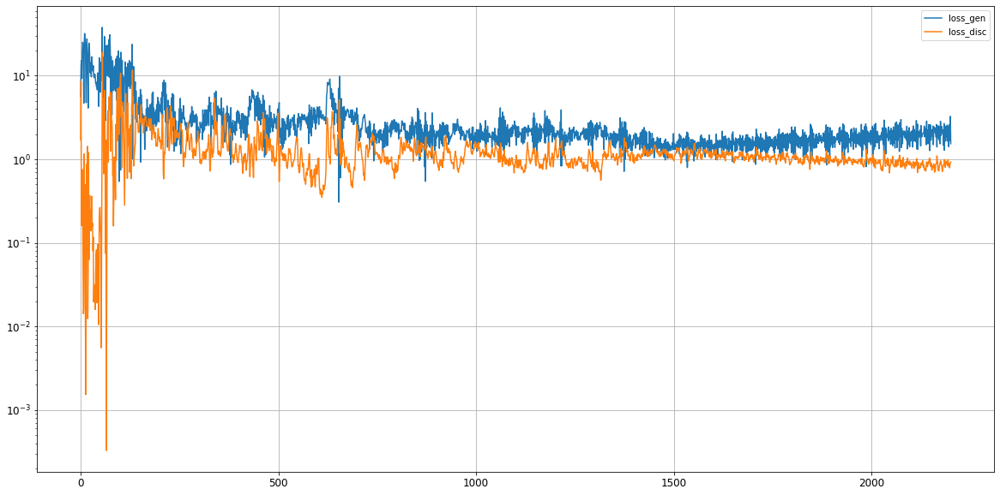

Epoch 2202/20000
0s
Epoch 2203/20000
0s
Epoch 2204/20000
0s
Epoch 2205/20000
0s
Epoch 2206/20000
0s
Epoch 2207/20000
0s
Epoch 2208/20000
0s
Epoch 2209/20000
0s
Epoch 2210/20000
0s
Epoch 2211/20000
0s
Epoch 2212/20000
0s
Epoch 2213/20000
0s
Epoch 2214/20000
0s
Epoch 2215/20000
0s
Epoch 2216/20000
0s
Epoch 2217/20000
0s
Epoch 2218/20000
0s
Epoch 2219/20000
0s
Epoch 2220/20000
0s
Epoch 2221/20000
0s
Epoch 2222/20000
0s
Epoch 2223/20000
0s
Epoch 2224/20000
0s
Epoch 2225/20000
0s
Epoch 2226/20000
0s
Epoch 2227/20000
0s
Epoch 2228/20000
0s
Epoch 2229/20000
0s
Epoch 2230/20000
0s
Epoch 2231/20000
0s
Epoch 2232/20000
0s
Epoch 2233/20000
0s
Epoch 2234/20000
0s
Epoch 2235/20000
0s
Epoch 2236/20000
0s
Epoch 2237/20000
0s
Epoch 2238/20000
0s
Epoch 2239/20000
0s
Epoch 2240/20000
0s
Epoch 2241/20000
0s
Epoch 2242/20000
0s
Epoch 2243/20000
0s
Epoch 2244/20000
0s
Epoch 2245/20000
0s
Epoch 2246/20000
0s
Epoch 2247/20000
0s
Epoch 2248/20000
0s
Epoch 2249/20000
0s
Epoch 2250/20000
0s
Epoch 2251/20000
0s


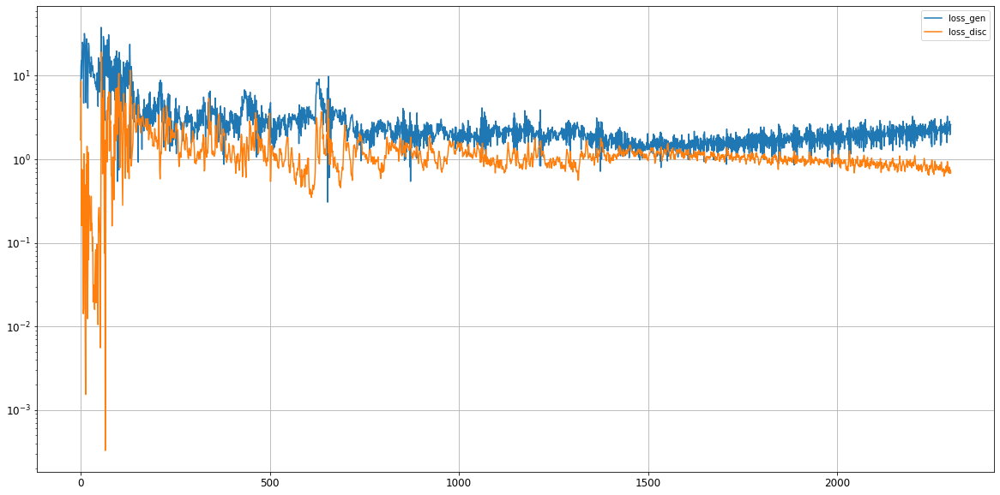

Epoch 2302/20000
0s
Epoch 2303/20000
0s
Epoch 2304/20000
0s
Epoch 2305/20000
0s
Epoch 2306/20000
0s
Epoch 2307/20000
0s
Epoch 2308/20000
0s
Epoch 2309/20000
0s
Epoch 2310/20000
0s
Epoch 2311/20000
0s
Epoch 2312/20000
0s
Epoch 2313/20000
0s
Epoch 2314/20000
0s
Epoch 2315/20000
0s
Epoch 2316/20000
0s
Epoch 2317/20000
0s
Epoch 2318/20000
0s
Epoch 2319/20000
0s
Epoch 2320/20000
0s
Epoch 2321/20000
0s
Epoch 2322/20000
0s
Epoch 2323/20000
0s
Epoch 2324/20000
0s
Epoch 2325/20000
0s
Epoch 2326/20000
0s
Epoch 2327/20000
0s
Epoch 2328/20000
0s
Epoch 2329/20000
0s
Epoch 2330/20000
0s
Epoch 2331/20000
0s
Epoch 2332/20000
0s
Epoch 2333/20000
0s
Epoch 2334/20000
0s
Epoch 2335/20000
0s
Epoch 2336/20000
0s
Epoch 2337/20000
0s
Epoch 2338/20000
0s
Epoch 2339/20000
0s
Epoch 2340/20000
0s
Epoch 2341/20000
0s
Epoch 2342/20000
0s
Epoch 2343/20000
0s
Epoch 2344/20000
0s
Epoch 2345/20000
0s
Epoch 2346/20000
0s
Epoch 2347/20000
0s
Epoch 2348/20000
0s
Epoch 2349/20000
0s
Epoch 2350/20000
0s
Epoch 2351/20000
0s


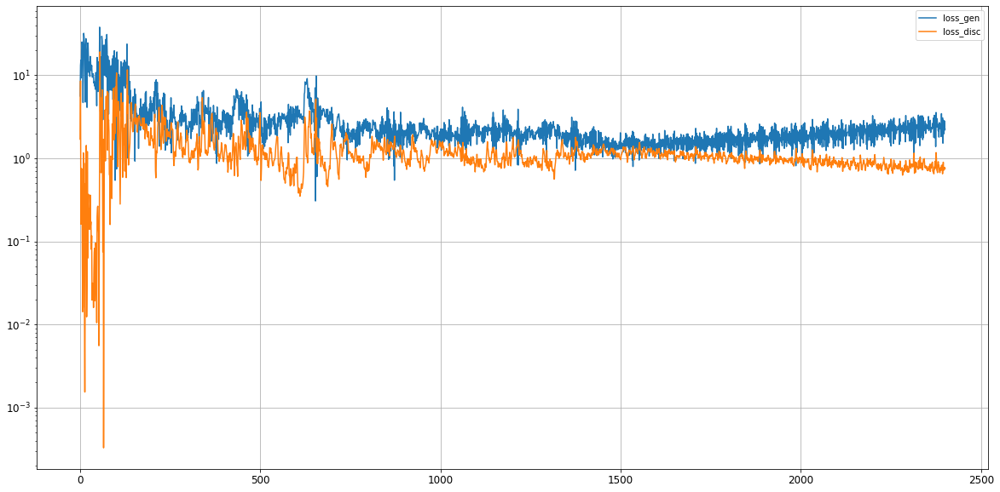

Epoch 2402/20000
0s
Epoch 2403/20000
0s
Epoch 2404/20000
0s
Epoch 2405/20000
0s
Epoch 2406/20000
0s
Epoch 2407/20000
0s
Epoch 2408/20000
0s
Epoch 2409/20000
0s
Epoch 2410/20000
0s
Epoch 2411/20000
0s
Epoch 2412/20000
0s
Epoch 2413/20000
0s
Epoch 2414/20000
0s
Epoch 2415/20000
0s
Epoch 2416/20000
0s
Epoch 2417/20000
0s
Epoch 2418/20000
0s
Epoch 2419/20000
0s
Epoch 2420/20000
0s
Epoch 2421/20000
0s
Epoch 2422/20000
0s
Epoch 2423/20000
0s
Epoch 2424/20000
0s
Epoch 2425/20000
0s
Epoch 2426/20000
0s
Epoch 2427/20000
0s
Epoch 2428/20000
0s
Epoch 2429/20000
0s
Epoch 2430/20000
0s
Epoch 2431/20000
0s
Epoch 2432/20000
0s
Epoch 2433/20000
0s
Epoch 2434/20000
0s
Epoch 2435/20000
0s
Epoch 2436/20000
0s
Epoch 2437/20000
0s
Epoch 2438/20000
0s
Epoch 2439/20000
0s
Epoch 2440/20000
0s
Epoch 2441/20000
0s
Epoch 2442/20000
0s
Epoch 2443/20000
0s
Epoch 2444/20000
0s
Epoch 2445/20000
0s
Epoch 2446/20000
0s
Epoch 2447/20000
0s
Epoch 2448/20000
0s
Epoch 2449/20000
0s
Epoch 2450/20000
0s
Epoch 2451/20000
0s


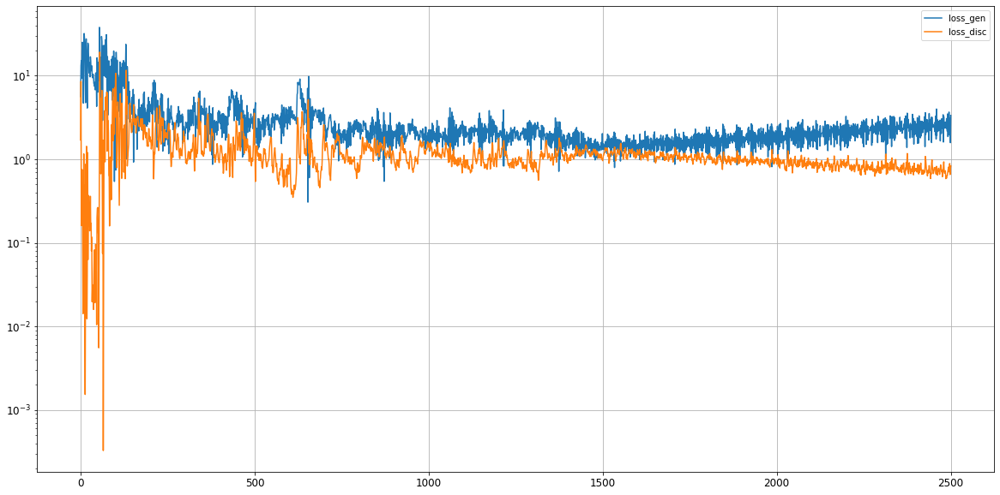

Epoch 2502/20000
0s
Epoch 2503/20000
0s
Epoch 2504/20000
0s
Epoch 2505/20000
0s
Epoch 2506/20000
0s
Epoch 2507/20000
0s
Epoch 2508/20000
0s
Epoch 2509/20000
0s
Epoch 2510/20000
0s
Epoch 2511/20000
0s
Epoch 2512/20000
0s
Epoch 2513/20000
0s
Epoch 2514/20000
0s
Epoch 2515/20000
0s
Epoch 2516/20000
0s
Epoch 2517/20000
0s
Epoch 2518/20000
0s
Epoch 2519/20000
0s
Epoch 2520/20000
0s
Epoch 2521/20000
0s
Epoch 2522/20000
0s
Epoch 2523/20000
0s
Epoch 2524/20000
0s
Epoch 2525/20000
0s
Epoch 2526/20000
0s
Epoch 2527/20000
0s
Epoch 2528/20000
0s
Epoch 2529/20000
0s
Epoch 2530/20000
0s
Epoch 2531/20000
0s
Epoch 2532/20000
0s
Epoch 2533/20000
0s
Epoch 2534/20000
0s
Epoch 2535/20000
0s
Epoch 2536/20000
0s
Epoch 2537/20000
0s
Epoch 2538/20000
0s
Epoch 2539/20000
0s
Epoch 2540/20000
0s
Epoch 2541/20000
0s
Epoch 2542/20000
0s
Epoch 2543/20000
0s
Epoch 2544/20000
0s
Epoch 2545/20000
0s
Epoch 2546/20000
0s
Epoch 2547/20000
0s
Epoch 2548/20000
0s
Epoch 2549/20000
0s
Epoch 2550/20000
0s
Epoch 2551/20000
0s


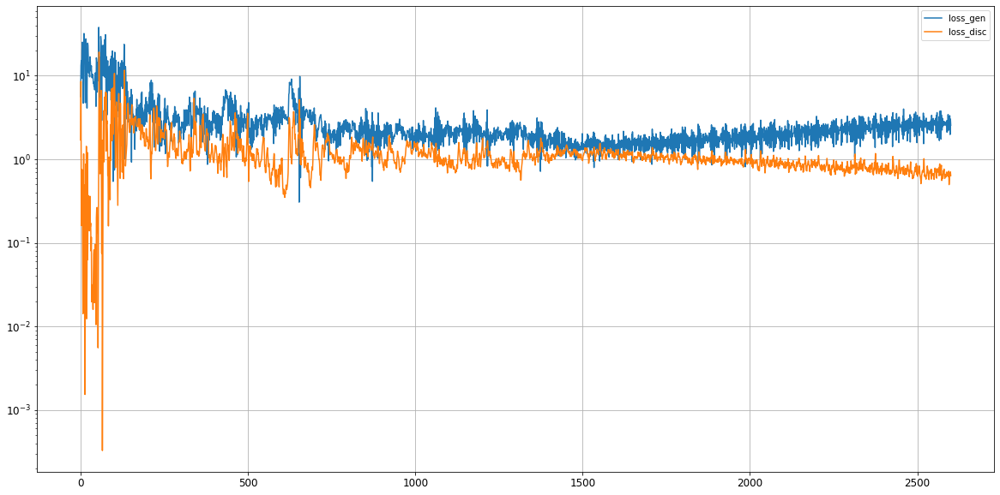

Epoch 2602/20000
0s
Epoch 2603/20000
0s
Epoch 2604/20000
0s
Epoch 2605/20000
0s
Epoch 2606/20000
0s
Epoch 2607/20000
0s
Epoch 2608/20000
0s
Epoch 2609/20000
0s
Epoch 2610/20000
0s
Epoch 2611/20000
0s
Epoch 2612/20000
0s
Epoch 2613/20000
0s
Epoch 2614/20000
0s
Epoch 2615/20000
0s
Epoch 2616/20000
0s
Epoch 2617/20000
0s
Epoch 2618/20000
0s
Epoch 2619/20000
0s
Epoch 2620/20000
0s
Epoch 2621/20000
0s
Epoch 2622/20000
0s
Epoch 2623/20000
0s
Epoch 2624/20000
0s
Epoch 2625/20000
0s
Epoch 2626/20000
0s
Epoch 2627/20000
0s
Epoch 2628/20000
0s
Epoch 2629/20000
0s
Epoch 2630/20000
0s
Epoch 2631/20000
0s
Epoch 2632/20000
0s
Epoch 2633/20000
0s
Epoch 2634/20000
0s
Epoch 2635/20000
0s
Epoch 2636/20000
0s
Epoch 2637/20000
0s
Epoch 2638/20000
0s
Epoch 2639/20000
0s
Epoch 2640/20000
0s
Epoch 2641/20000
0s
Epoch 2642/20000
0s
Epoch 2643/20000
0s
Epoch 2644/20000
0s
Epoch 2645/20000
0s
Epoch 2646/20000
0s
Epoch 2647/20000
0s
Epoch 2648/20000
0s
Epoch 2649/20000
0s
Epoch 2650/20000
0s
Epoch 2651/20000
0s


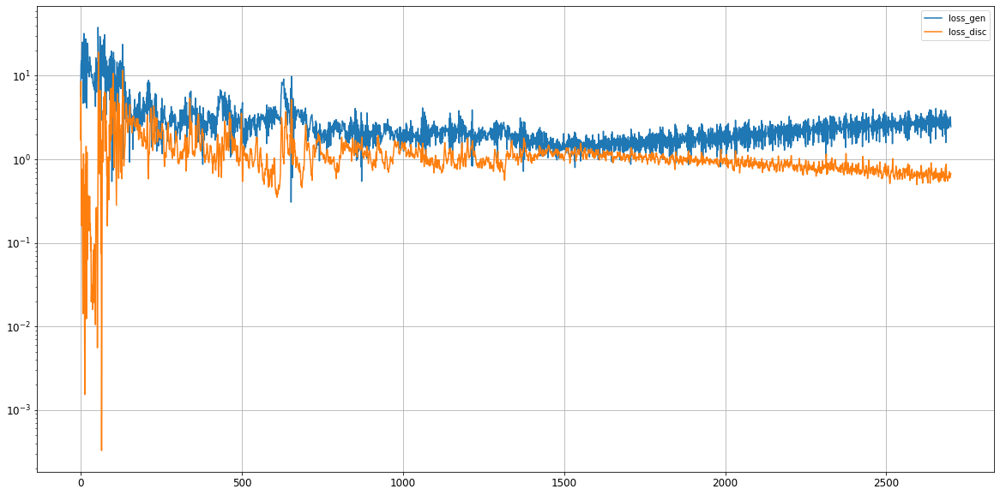

Epoch 2702/20000
0s
Epoch 2703/20000
0s
Epoch 2704/20000
0s
Epoch 2705/20000
0s
Epoch 2706/20000
0s
Epoch 2707/20000
0s
Epoch 2708/20000
0s
Epoch 2709/20000
0s
Epoch 2710/20000
0s
Epoch 2711/20000
0s
Epoch 2712/20000
0s
Epoch 2713/20000
0s
Epoch 2714/20000
0s
Epoch 2715/20000
0s
Epoch 2716/20000
0s
Epoch 2717/20000
0s
Epoch 2718/20000
0s
Epoch 2719/20000
0s
Epoch 2720/20000
0s
Epoch 2721/20000
0s
Epoch 2722/20000
0s
Epoch 2723/20000
0s
Epoch 2724/20000
0s
Epoch 2725/20000
0s
Epoch 2726/20000
0s
Epoch 2727/20000
0s
Epoch 2728/20000
0s
Epoch 2729/20000
0s
Epoch 2730/20000
0s
Epoch 2731/20000
0s
Epoch 2732/20000
0s
Epoch 2733/20000
0s
Epoch 2734/20000
0s
Epoch 2735/20000
0s
Epoch 2736/20000
0s
Epoch 2737/20000
0s
Epoch 2738/20000
0s
Epoch 2739/20000
0s
Epoch 2740/20000
0s
Epoch 2741/20000
0s
Epoch 2742/20000
0s
Epoch 2743/20000
0s
Epoch 2744/20000
0s
Epoch 2745/20000
0s
Epoch 2746/20000
0s
Epoch 2747/20000
0s
Epoch 2748/20000
0s
Epoch 2749/20000
0s
Epoch 2750/20000
0s
Epoch 2751/20000
0s


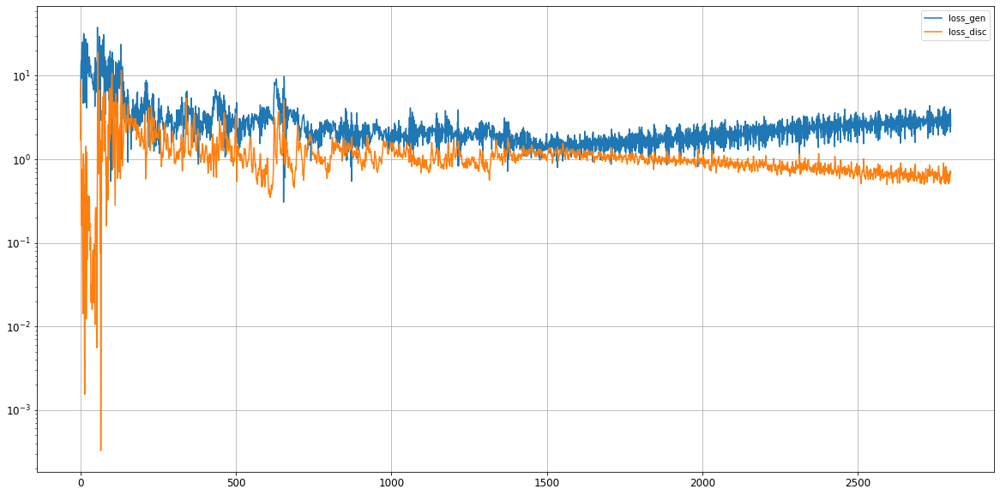

Epoch 2802/20000
0s
Epoch 2803/20000
0s
Epoch 2804/20000
0s
Epoch 2805/20000
0s
Epoch 2806/20000
0s
Epoch 2807/20000
0s
Epoch 2808/20000
0s
Epoch 2809/20000
0s
Epoch 2810/20000
0s
Epoch 2811/20000
0s
Epoch 2812/20000
0s
Epoch 2813/20000
0s
Epoch 2814/20000
0s
Epoch 2815/20000
0s
Epoch 2816/20000
0s
Epoch 2817/20000
0s
Epoch 2818/20000
0s
Epoch 2819/20000
0s
Epoch 2820/20000
0s
Epoch 2821/20000
0s
Epoch 2822/20000
0s
Epoch 2823/20000
0s
Epoch 2824/20000
0s
Epoch 2825/20000
0s
Epoch 2826/20000
0s
Epoch 2827/20000
0s
Epoch 2828/20000
0s
Epoch 2829/20000
0s
Epoch 2830/20000
0s
Epoch 2831/20000
0s
Epoch 2832/20000
0s
Epoch 2833/20000
0s
Epoch 2834/20000
0s
Epoch 2835/20000
0s
Epoch 2836/20000
0s
Epoch 2837/20000
0s
Epoch 2838/20000
0s
Epoch 2839/20000
0s
Epoch 2840/20000
0s
Epoch 2841/20000
0s
Epoch 2842/20000
0s
Epoch 2843/20000
0s
Epoch 2844/20000
0s
Epoch 2845/20000
0s
Epoch 2846/20000
0s
Epoch 2847/20000
0s
Epoch 2848/20000
0s
Epoch 2849/20000
0s
Epoch 2850/20000
0s
Epoch 2851/20000
0s


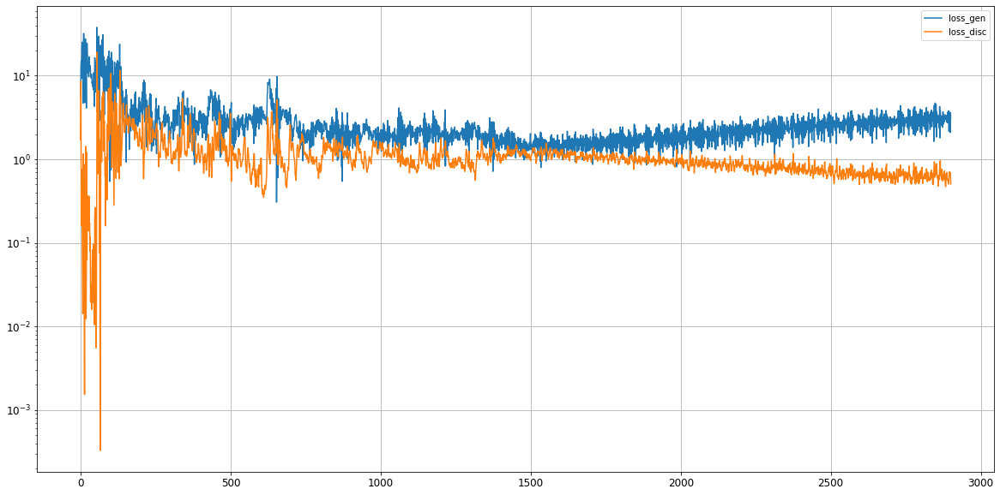

Epoch 2902/20000
0s
Epoch 2903/20000
0s
Epoch 2904/20000
0s
Epoch 2905/20000
0s
Epoch 2906/20000
0s
Epoch 2907/20000
0s
Epoch 2908/20000
0s
Epoch 2909/20000
0s
Epoch 2910/20000
0s
Epoch 2911/20000
0s
Epoch 2912/20000
0s
Epoch 2913/20000
0s
Epoch 2914/20000
0s
Epoch 2915/20000
0s
Epoch 2916/20000
0s
Epoch 2917/20000
0s
Epoch 2918/20000
0s
Epoch 2919/20000
0s
Epoch 2920/20000
0s
Epoch 2921/20000
0s
Epoch 2922/20000
0s
Epoch 2923/20000
0s
Epoch 2924/20000
0s
Epoch 2925/20000
0s
Epoch 2926/20000
0s
Epoch 2927/20000
0s
Epoch 2928/20000
0s
Epoch 2929/20000
0s
Epoch 2930/20000
0s
Epoch 2931/20000
0s
Epoch 2932/20000
0s
Epoch 2933/20000
0s
Epoch 2934/20000
0s
Epoch 2935/20000
0s
Epoch 2936/20000
0s
Epoch 2937/20000
0s
Epoch 2938/20000
0s
Epoch 2939/20000
0s
Epoch 2940/20000
0s
Epoch 2941/20000
0s
Epoch 2942/20000
0s
Epoch 2943/20000
0s
Epoch 2944/20000
0s
Epoch 2945/20000
0s
Epoch 2946/20000
0s
Epoch 2947/20000
0s
Epoch 2948/20000
0s
Epoch 2949/20000
0s
Epoch 2950/20000
0s
Epoch 2951/20000
0s


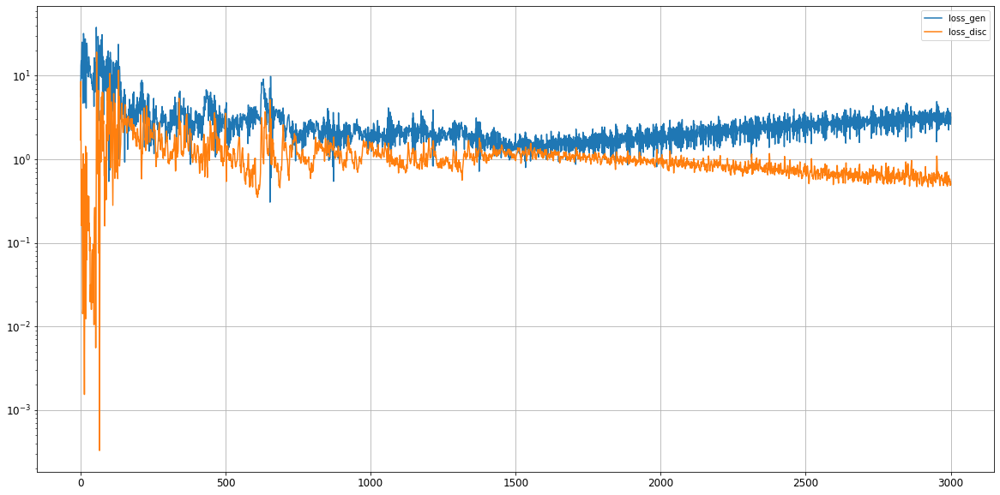

Epoch 3002/20000
0s
Epoch 3003/20000
0s
Epoch 3004/20000
0s
Epoch 3005/20000
0s
Epoch 3006/20000
0s
Epoch 3007/20000
0s
Epoch 3008/20000
0s
Epoch 3009/20000
0s
Epoch 3010/20000
0s
Epoch 3011/20000
0s
Epoch 3012/20000
0s
Epoch 3013/20000
0s
Epoch 3014/20000
0s
Epoch 3015/20000
0s
Epoch 3016/20000
0s
Epoch 3017/20000
0s
Epoch 3018/20000
0s
Epoch 3019/20000
0s
Epoch 3020/20000
0s
Epoch 3021/20000
0s
Epoch 3022/20000
0s
Epoch 3023/20000
0s
Epoch 3024/20000
0s
Epoch 3025/20000
0s
Epoch 3026/20000
0s
Epoch 3027/20000
0s
Epoch 3028/20000
0s
Epoch 3029/20000
0s
Epoch 3030/20000
0s
Epoch 3031/20000
0s
Epoch 3032/20000
0s
Epoch 3033/20000
0s
Epoch 3034/20000
0s
Epoch 3035/20000
0s
Epoch 3036/20000
0s
Epoch 3037/20000
0s
Epoch 3038/20000
0s
Epoch 3039/20000
0s
Epoch 3040/20000
0s
Epoch 3041/20000
0s
Epoch 3042/20000
0s
Epoch 3043/20000
0s
Epoch 3044/20000
0s
Epoch 3045/20000
0s
Epoch 3046/20000
0s
Epoch 3047/20000
0s
Epoch 3048/20000
0s
Epoch 3049/20000
0s
Epoch 3050/20000
0s
Epoch 3051/20000
0s


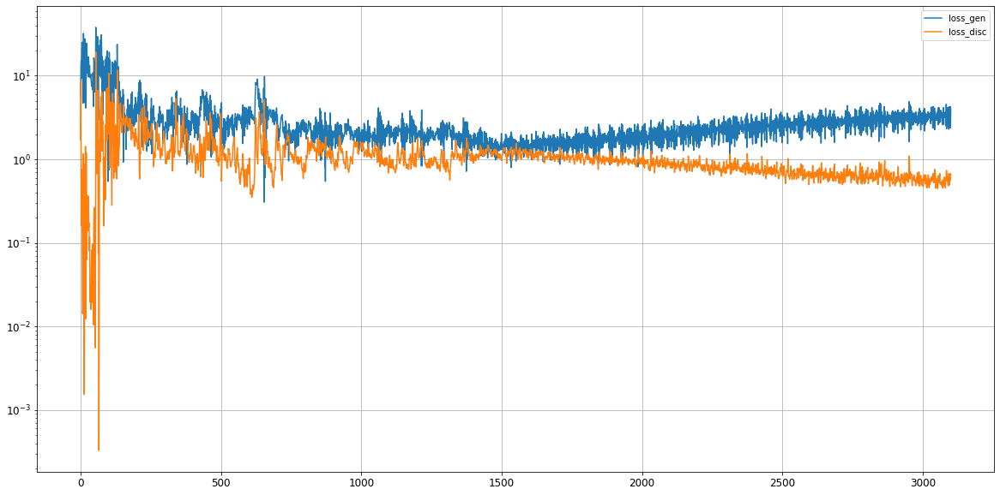

Epoch 3102/20000
0s
Epoch 3103/20000
0s
Epoch 3104/20000
0s
Epoch 3105/20000
0s
Epoch 3106/20000
0s
Epoch 3107/20000
0s
Epoch 3108/20000
0s
Epoch 3109/20000
0s
Epoch 3110/20000
0s
Epoch 3111/20000
0s
Epoch 3112/20000
0s
Epoch 3113/20000
0s
Epoch 3114/20000
0s
Epoch 3115/20000
0s
Epoch 3116/20000
0s
Epoch 3117/20000
0s
Epoch 3118/20000
0s
Epoch 3119/20000
0s
Epoch 3120/20000
0s
Epoch 3121/20000
0s
Epoch 3122/20000
0s
Epoch 3123/20000
0s
Epoch 3124/20000
0s
Epoch 3125/20000
0s
Epoch 3126/20000
0s
Epoch 3127/20000
0s
Epoch 3128/20000
0s
Epoch 3129/20000
0s
Epoch 3130/20000
0s
Epoch 3131/20000
0s
Epoch 3132/20000
0s
Epoch 3133/20000
0s
Epoch 3134/20000
0s
Epoch 3135/20000
0s
Epoch 3136/20000
0s
Epoch 3137/20000
0s
Epoch 3138/20000
0s
Epoch 3139/20000
0s
Epoch 3140/20000
0s
Epoch 3141/20000
0s
Epoch 3142/20000
0s
Epoch 3143/20000
0s
Epoch 3144/20000
0s
Epoch 3145/20000
0s
Epoch 3146/20000
0s
Epoch 3147/20000
0s
Epoch 3148/20000
0s
Epoch 3149/20000
0s
Epoch 3150/20000
0s
Epoch 3151/20000
0s


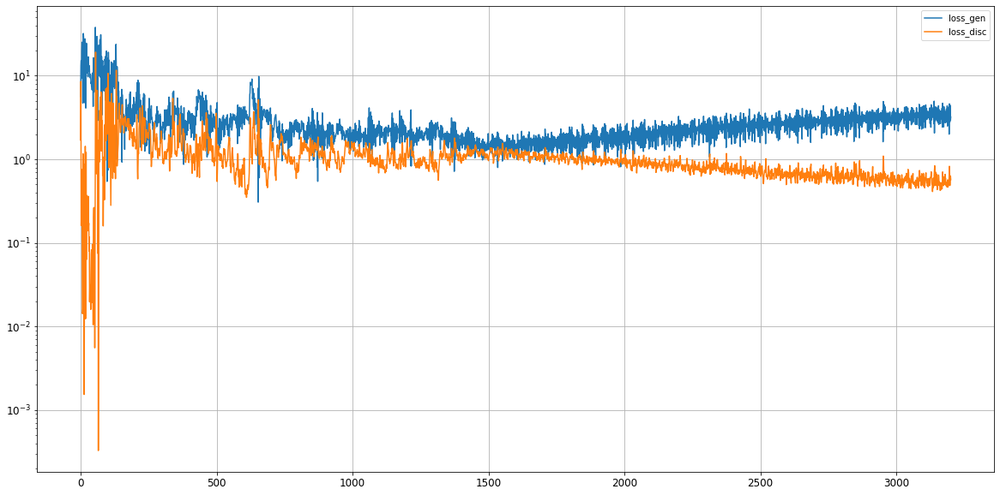

Epoch 3202/20000
0s
Epoch 3203/20000
0s
Epoch 3204/20000
0s
Epoch 3205/20000
0s
Epoch 3206/20000
0s
Epoch 3207/20000
0s
Epoch 3208/20000
0s
Epoch 3209/20000
0s
Epoch 3210/20000
0s
Epoch 3211/20000
0s
Epoch 3212/20000
0s
Epoch 3213/20000
0s
Epoch 3214/20000
0s
Epoch 3215/20000
0s
Epoch 3216/20000
0s
Epoch 3217/20000
0s
Epoch 3218/20000
0s
Epoch 3219/20000
0s
Epoch 3220/20000
0s
Epoch 3221/20000
0s
Epoch 3222/20000
0s
Epoch 3223/20000
0s
Epoch 3224/20000
0s
Epoch 3225/20000
0s
Epoch 3226/20000
0s
Epoch 3227/20000
0s
Epoch 3228/20000
0s
Epoch 3229/20000
0s
Epoch 3230/20000
0s
Epoch 3231/20000
0s
Epoch 3232/20000
0s
Epoch 3233/20000
0s
Epoch 3234/20000
0s
Epoch 3235/20000
0s
Epoch 3236/20000
0s
Epoch 3237/20000
0s
Epoch 3238/20000
0s
Epoch 3239/20000
0s
Epoch 3240/20000
0s
Epoch 3241/20000
0s
Epoch 3242/20000
0s
Epoch 3243/20000
0s
Epoch 3244/20000
0s
Epoch 3245/20000
0s
Epoch 3246/20000
0s
Epoch 3247/20000
0s
Epoch 3248/20000
0s
Epoch 3249/20000
0s
Epoch 3250/20000
0s
Epoch 3251/20000
0s


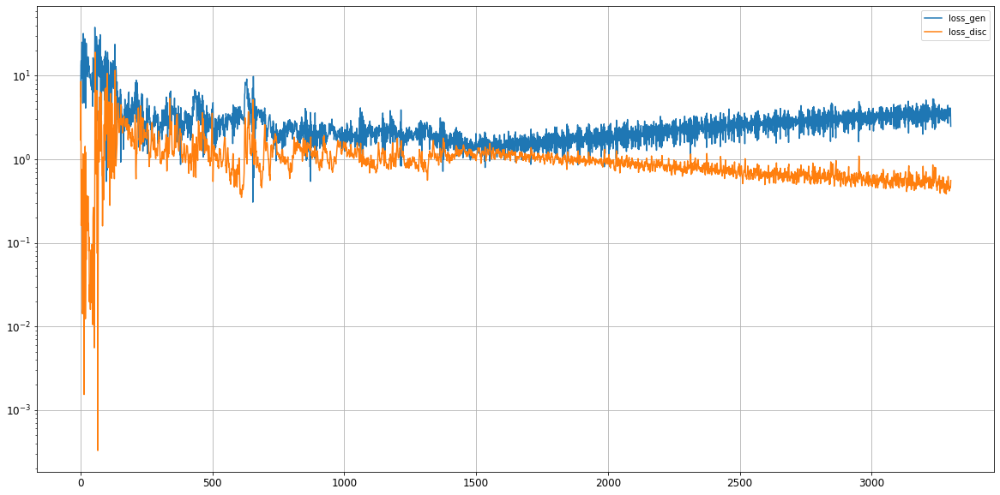

Epoch 3302/20000
0s
Epoch 3303/20000
0s
Epoch 3304/20000
0s
Epoch 3305/20000
0s
Epoch 3306/20000
0s
Epoch 3307/20000
0s
Epoch 3308/20000
0s
Epoch 3309/20000
0s
Epoch 3310/20000
0s
Epoch 3311/20000
0s
Epoch 3312/20000
0s
Epoch 3313/20000
0s
Epoch 3314/20000
0s
Epoch 3315/20000
0s
Epoch 3316/20000
0s
Epoch 3317/20000
0s
Epoch 3318/20000
0s
Epoch 3319/20000
0s
Epoch 3320/20000
0s
Epoch 3321/20000
0s
Epoch 3322/20000
0s
Epoch 3323/20000
0s
Epoch 3324/20000
0s
Epoch 3325/20000
0s
Epoch 3326/20000
0s
Epoch 3327/20000
0s
Epoch 3328/20000
0s
Epoch 3329/20000
0s
Epoch 3330/20000
0s
Epoch 3331/20000
0s
Epoch 3332/20000
0s
Epoch 3333/20000
0s
Epoch 3334/20000
0s
Epoch 3335/20000
0s
Epoch 3336/20000
0s
Epoch 3337/20000
0s
Epoch 3338/20000
0s
Epoch 3339/20000
0s
Epoch 3340/20000
0s
Epoch 3341/20000
0s
Epoch 3342/20000
0s
Epoch 3343/20000
0s
Epoch 3344/20000
0s
Epoch 3345/20000
0s
Epoch 3346/20000
0s
Epoch 3347/20000
0s
Epoch 3348/20000
0s
Epoch 3349/20000
0s
Epoch 3350/20000
0s
Epoch 3351/20000
0s


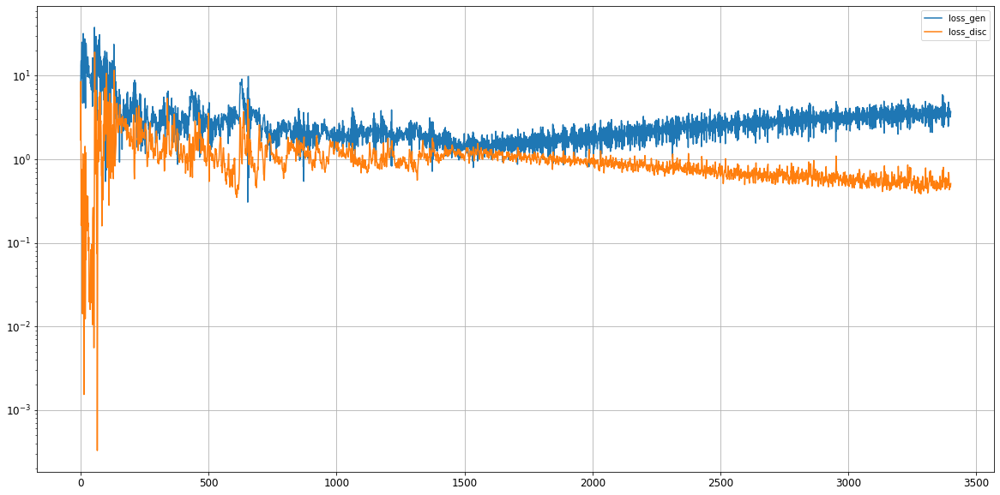

Epoch 3402/20000
0s
Epoch 3403/20000
0s
Epoch 3404/20000
0s
Epoch 3405/20000
0s
Epoch 3406/20000
0s
Epoch 3407/20000
0s
Epoch 3408/20000
0s
Epoch 3409/20000
0s
Epoch 3410/20000
0s
Epoch 3411/20000
0s
Epoch 3412/20000
0s
Epoch 3413/20000
0s
Epoch 3414/20000
0s
Epoch 3415/20000
0s
Epoch 3416/20000
0s
Epoch 3417/20000
0s
Epoch 3418/20000
0s
Epoch 3419/20000
0s
Epoch 3420/20000
0s
Epoch 3421/20000
0s
Epoch 3422/20000
0s
Epoch 3423/20000
0s
Epoch 3424/20000
0s
Epoch 3425/20000
0s
Epoch 3426/20000
0s
Epoch 3427/20000
0s
Epoch 3428/20000
0s
Epoch 3429/20000
0s
Epoch 3430/20000
0s
Epoch 3431/20000
0s
Epoch 3432/20000
0s
Epoch 3433/20000
0s
Epoch 3434/20000
0s
Epoch 3435/20000
0s
Epoch 3436/20000
0s
Epoch 3437/20000
0s
Epoch 3438/20000
0s
Epoch 3439/20000
0s
Epoch 3440/20000
0s
Epoch 3441/20000
0s
Epoch 3442/20000
0s
Epoch 3443/20000
0s
Epoch 3444/20000
0s
Epoch 3445/20000
0s
Epoch 3446/20000
0s
Epoch 3447/20000
0s
Epoch 3448/20000
0s
Epoch 3449/20000
0s
Epoch 3450/20000
0s
Epoch 3451/20000
0s


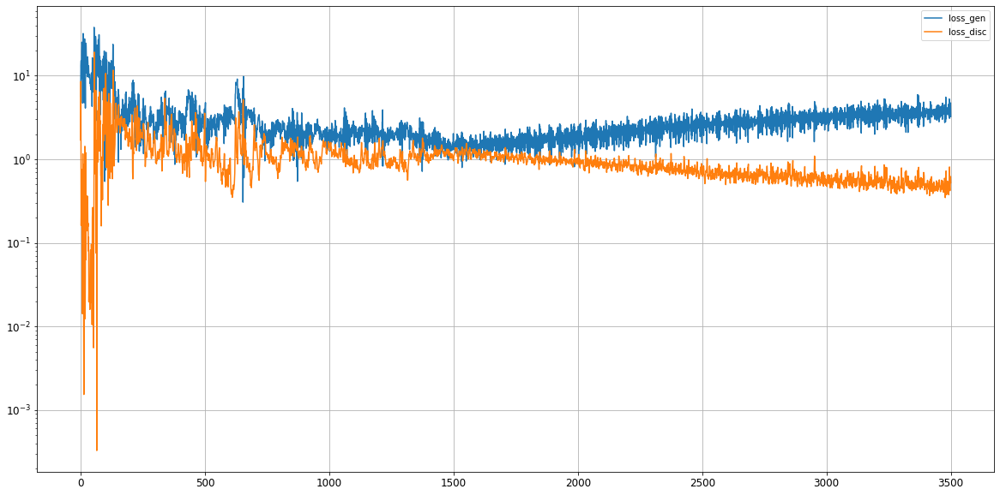

Epoch 3502/20000
0s
Epoch 3503/20000
0s
Epoch 3504/20000
0s
Epoch 3505/20000
0s
Epoch 3506/20000
0s
Epoch 3507/20000
0s
Epoch 3508/20000
0s
Epoch 3509/20000
0s
Epoch 3510/20000
0s
Epoch 3511/20000
0s
Epoch 3512/20000
0s
Epoch 3513/20000
0s
Epoch 3514/20000
0s
Epoch 3515/20000
0s
Epoch 3516/20000
0s
Epoch 3517/20000
0s
Epoch 3518/20000
0s
Epoch 3519/20000
0s
Epoch 3520/20000
0s
Epoch 3521/20000
0s
Epoch 3522/20000
0s
Epoch 3523/20000
0s
Epoch 3524/20000
0s
Epoch 3525/20000
0s
Epoch 3526/20000
0s
Epoch 3527/20000
0s
Epoch 3528/20000
0s
Epoch 3529/20000
0s
Epoch 3530/20000
0s
Epoch 3531/20000
0s
Epoch 3532/20000
0s
Epoch 3533/20000
0s
Epoch 3534/20000
0s
Epoch 3535/20000
0s
Epoch 3536/20000
0s
Epoch 3537/20000
0s
Epoch 3538/20000
0s
Epoch 3539/20000
0s
Epoch 3540/20000
0s
Epoch 3541/20000
0s
Epoch 3542/20000
0s
Epoch 3543/20000
0s
Epoch 3544/20000
0s
Epoch 3545/20000
0s
Epoch 3546/20000
0s
Epoch 3547/20000
0s
Epoch 3548/20000
0s
Epoch 3549/20000
0s
Epoch 3550/20000
0s
Epoch 3551/20000
0s


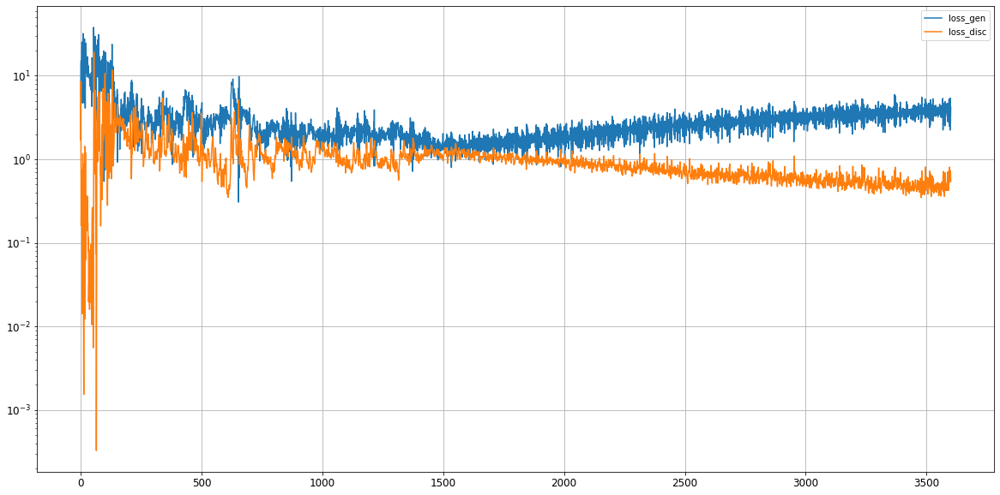

Epoch 3602/20000
0s
Epoch 3603/20000
0s
Epoch 3604/20000
0s
Epoch 3605/20000
0s
Epoch 3606/20000
0s
Epoch 3607/20000
0s
Epoch 3608/20000
0s
Epoch 3609/20000
0s
Epoch 3610/20000
0s
Epoch 3611/20000
0s
Epoch 3612/20000
0s
Epoch 3613/20000
0s
Epoch 3614/20000
0s
Epoch 3615/20000
0s
Epoch 3616/20000
0s
Epoch 3617/20000
0s
Epoch 3618/20000
0s
Epoch 3619/20000
0s
Epoch 3620/20000
0s
Epoch 3621/20000
0s
Epoch 3622/20000
0s
Epoch 3623/20000
0s
Epoch 3624/20000
0s
Epoch 3625/20000
0s
Epoch 3626/20000
0s
Epoch 3627/20000
0s
Epoch 3628/20000
0s
Epoch 3629/20000
0s
Epoch 3630/20000
0s
Epoch 3631/20000
0s
Epoch 3632/20000
0s
Epoch 3633/20000
0s
Epoch 3634/20000
0s
Epoch 3635/20000
0s
Epoch 3636/20000
0s
Epoch 3637/20000
0s
Epoch 3638/20000
0s
Epoch 3639/20000
0s
Epoch 3640/20000
0s
Epoch 3641/20000
0s
Epoch 3642/20000
0s
Epoch 3643/20000
0s
Epoch 3644/20000
0s
Epoch 3645/20000
0s
Epoch 3646/20000
0s
Epoch 3647/20000
0s
Epoch 3648/20000
0s
Epoch 3649/20000
0s
Epoch 3650/20000
0s
Epoch 3651/20000
0s


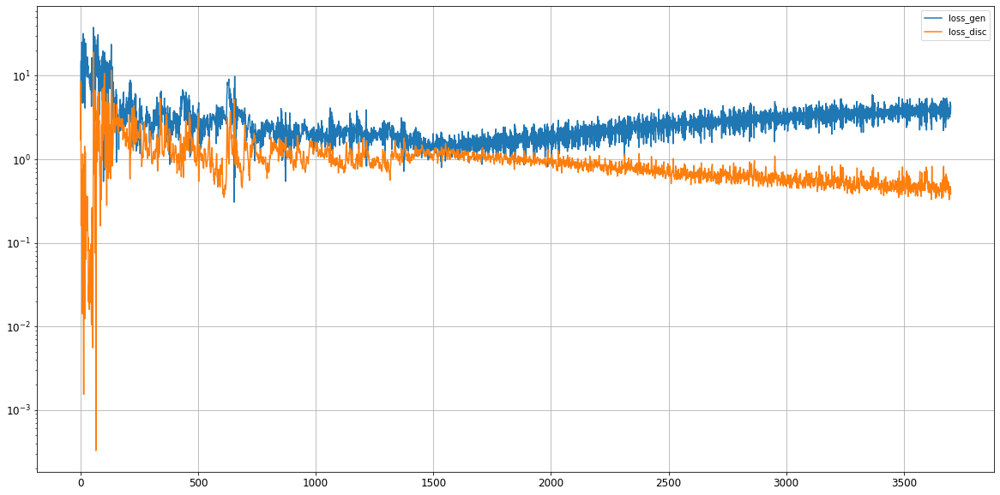

Epoch 3702/20000
0s
Epoch 3703/20000
0s
Epoch 3704/20000
0s
Epoch 3705/20000
0s
Epoch 3706/20000
0s
Epoch 3707/20000
0s
Epoch 3708/20000
0s
Epoch 3709/20000
0s
Epoch 3710/20000
0s
Epoch 3711/20000
0s
Epoch 3712/20000
0s
Epoch 3713/20000
0s
Epoch 3714/20000
0s
Epoch 3715/20000
0s
Epoch 3716/20000
0s
Epoch 3717/20000
0s
Epoch 3718/20000
0s
Epoch 3719/20000
0s
Epoch 3720/20000
0s
Epoch 3721/20000
0s
Epoch 3722/20000
0s
Epoch 3723/20000
0s
Epoch 3724/20000
0s
Epoch 3725/20000
0s
Epoch 3726/20000
0s
Epoch 3727/20000
0s
Epoch 3728/20000
0s
Epoch 3729/20000
0s
Epoch 3730/20000
0s
Epoch 3731/20000
0s
Epoch 3732/20000
0s
Epoch 3733/20000
0s
Epoch 3734/20000
0s
Epoch 3735/20000
0s
Epoch 3736/20000
0s
Epoch 3737/20000
0s
Epoch 3738/20000
0s
Epoch 3739/20000
0s
Epoch 3740/20000
0s
Epoch 3741/20000
0s
Epoch 3742/20000
0s
Epoch 3743/20000
0s
Epoch 3744/20000
0s
Epoch 3745/20000
0s
Epoch 3746/20000
0s
Epoch 3747/20000
0s
Epoch 3748/20000
0s
Epoch 3749/20000
0s
Epoch 3750/20000
0s
Epoch 3751/20000
0s


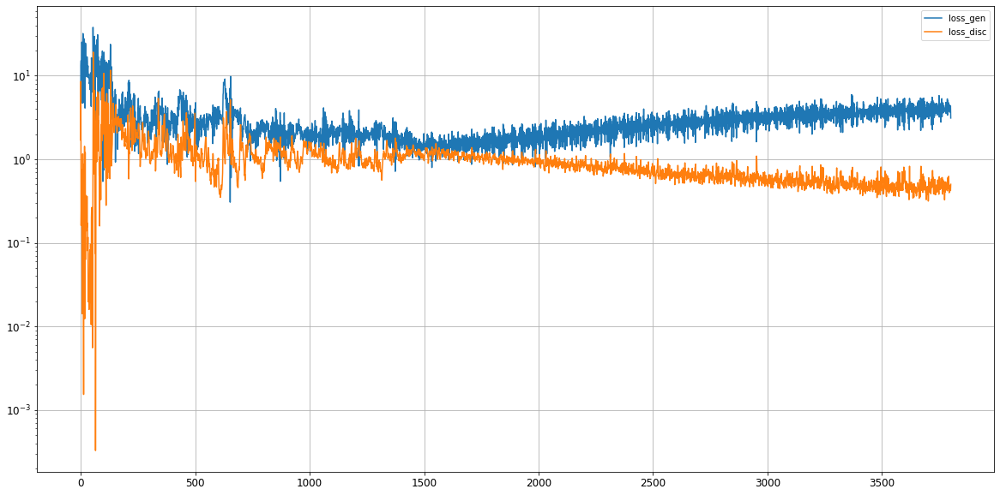

Epoch 3802/20000
0s
Epoch 3803/20000
0s
Epoch 3804/20000
0s
Epoch 3805/20000
0s
Epoch 3806/20000
0s
Epoch 3807/20000
0s
Epoch 3808/20000
0s
Epoch 3809/20000
0s
Epoch 3810/20000
0s
Epoch 3811/20000
0s
Epoch 3812/20000
0s
Epoch 3813/20000
0s
Epoch 3814/20000
0s
Epoch 3815/20000
0s
Epoch 3816/20000
0s
Epoch 3817/20000
0s
Epoch 3818/20000
0s
Epoch 3819/20000
0s
Epoch 3820/20000
0s
Epoch 3821/20000
0s
Epoch 3822/20000
0s
Epoch 3823/20000
0s
Epoch 3824/20000
0s
Epoch 3825/20000
0s
Epoch 3826/20000
0s
Epoch 3827/20000
0s
Epoch 3828/20000
0s
Epoch 3829/20000
0s
Epoch 3830/20000
0s
Epoch 3831/20000
0s
Epoch 3832/20000
0s
Epoch 3833/20000
0s
Epoch 3834/20000
0s
Epoch 3835/20000
0s
Epoch 3836/20000
0s
Epoch 3837/20000
0s
Epoch 3838/20000
0s
Epoch 3839/20000
0s
Epoch 3840/20000
0s
Epoch 3841/20000
0s
Epoch 3842/20000
0s
Epoch 3843/20000
0s
Epoch 3844/20000
0s
Epoch 3845/20000
0s
Epoch 3846/20000
0s
Epoch 3847/20000
0s
Epoch 3848/20000
0s
Epoch 3849/20000
0s
Epoch 3850/20000
0s
Epoch 3851/20000
0s


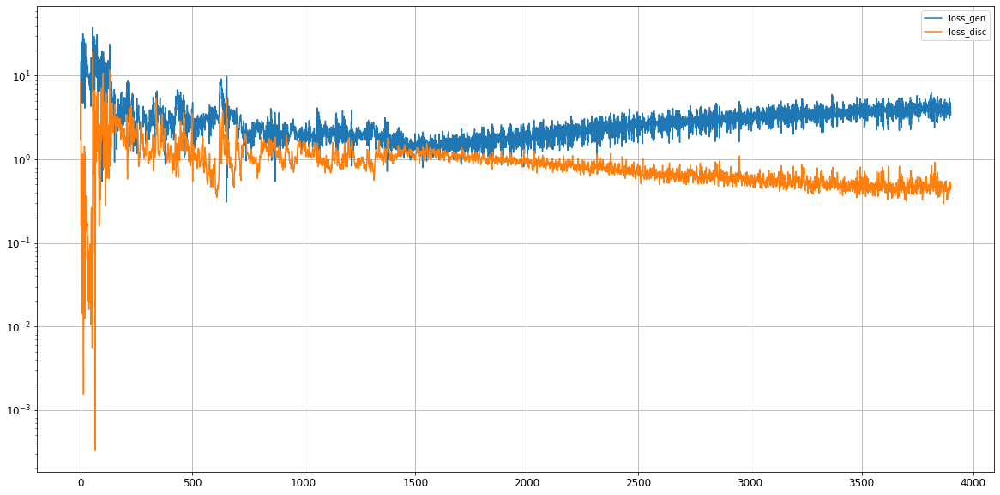

Epoch 3902/20000
0s
Epoch 3903/20000
0s
Epoch 3904/20000
0s
Epoch 3905/20000
0s
Epoch 3906/20000
0s
Epoch 3907/20000
0s
Epoch 3908/20000
0s
Epoch 3909/20000
0s
Epoch 3910/20000
0s
Epoch 3911/20000
0s
Epoch 3912/20000
0s
Epoch 3913/20000
0s
Epoch 3914/20000
0s
Epoch 3915/20000
0s
Epoch 3916/20000
0s
Epoch 3917/20000
0s
Epoch 3918/20000
0s
Epoch 3919/20000
0s
Epoch 3920/20000
0s
Epoch 3921/20000
0s
Epoch 3922/20000
0s
Epoch 3923/20000
0s
Epoch 3924/20000
0s
Epoch 3925/20000
0s
Epoch 3926/20000
0s
Epoch 3927/20000
0s
Epoch 3928/20000
0s
Epoch 3929/20000
0s
Epoch 3930/20000
0s
Epoch 3931/20000
0s
Epoch 3932/20000
0s
Epoch 3933/20000
0s
Epoch 3934/20000
0s
Epoch 3935/20000
0s
Epoch 3936/20000
0s
Epoch 3937/20000
0s
Epoch 3938/20000
0s
Epoch 3939/20000
0s
Epoch 3940/20000
0s
Epoch 3941/20000
0s
Epoch 3942/20000
0s
Epoch 3943/20000
0s
Epoch 3944/20000
0s
Epoch 3945/20000
0s
Epoch 3946/20000
0s
Epoch 3947/20000
0s
Epoch 3948/20000
0s
Epoch 3949/20000
0s
Epoch 3950/20000
0s
Epoch 3951/20000
0s


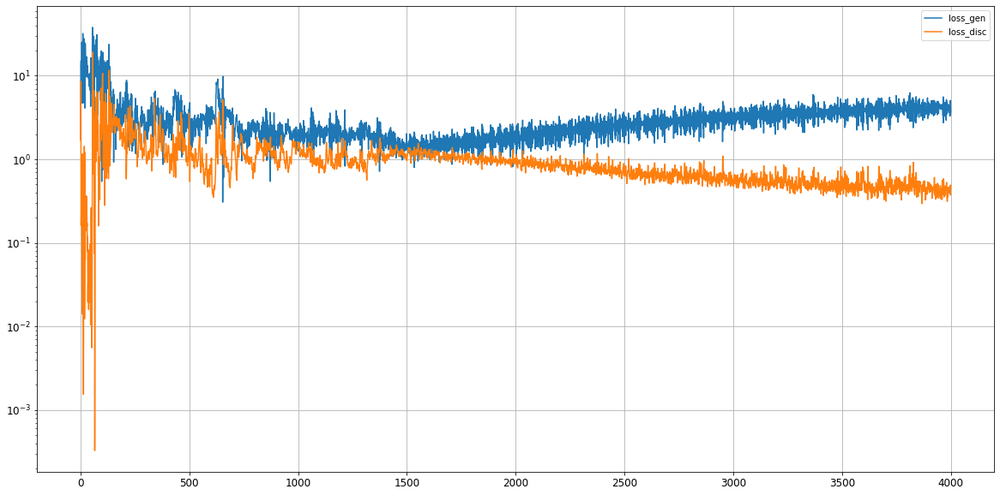

Epoch 4002/20000
0s
Epoch 4003/20000
0s
Epoch 4004/20000
0s
Epoch 4005/20000
0s
Epoch 4006/20000
0s
Epoch 4007/20000
0s
Epoch 4008/20000
0s
Epoch 4009/20000
0s
Epoch 4010/20000
0s
Epoch 4011/20000
0s
Epoch 4012/20000
0s
Epoch 4013/20000
0s
Epoch 4014/20000
0s
Epoch 4015/20000
0s
Epoch 4016/20000
0s
Epoch 4017/20000
0s
Epoch 4018/20000
0s
Epoch 4019/20000
0s
Epoch 4020/20000
0s
Epoch 4021/20000
0s
Epoch 4022/20000
0s
Epoch 4023/20000
0s
Epoch 4024/20000
0s
Epoch 4025/20000
0s
Epoch 4026/20000
0s
Epoch 4027/20000
0s
Epoch 4028/20000
0s
Epoch 4029/20000
0s
Epoch 4030/20000
0s
Epoch 4031/20000
0s
Epoch 4032/20000
0s
Epoch 4033/20000
0s
Epoch 4034/20000
0s
Epoch 4035/20000
0s
Epoch 4036/20000
0s
Epoch 4037/20000
0s
Epoch 4038/20000
0s
Epoch 4039/20000
0s
Epoch 4040/20000
0s
Epoch 4041/20000
0s
Epoch 4042/20000
0s
Epoch 4043/20000
0s
Epoch 4044/20000
0s
Epoch 4045/20000
0s
Epoch 4046/20000
0s
Epoch 4047/20000
0s
Epoch 4048/20000
0s
Epoch 4049/20000
0s
Epoch 4050/20000
0s
Epoch 4051/20000
0s


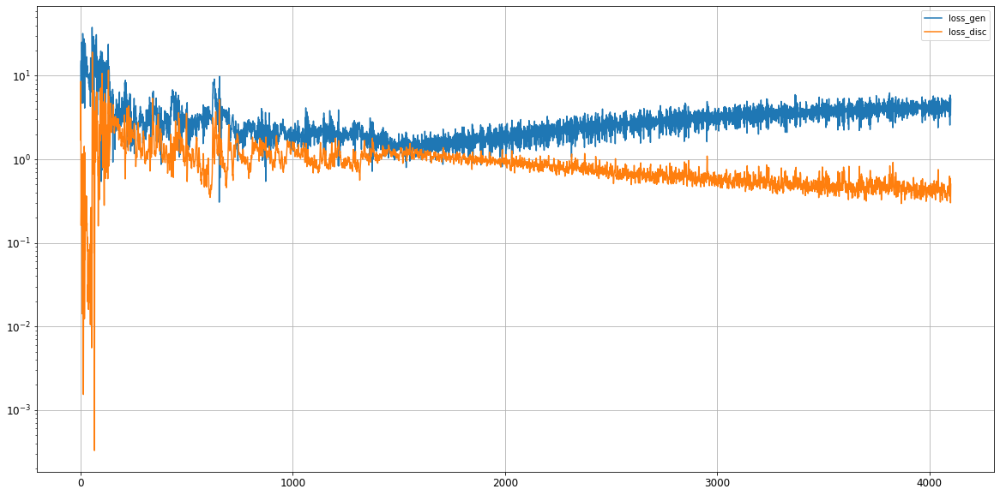

Epoch 4102/20000
0s
Epoch 4103/20000
0s
Epoch 4104/20000
0s
Epoch 4105/20000
0s
Epoch 4106/20000
0s
Epoch 4107/20000
0s
Epoch 4108/20000
0s
Epoch 4109/20000
0s
Epoch 4110/20000
0s
Epoch 4111/20000
0s
Epoch 4112/20000
0s
Epoch 4113/20000
0s
Epoch 4114/20000
0s
Epoch 4115/20000
0s
Epoch 4116/20000
0s
Epoch 4117/20000
0s
Epoch 4118/20000
0s
Epoch 4119/20000
0s
Epoch 4120/20000
0s
Epoch 4121/20000
0s
Epoch 4122/20000
0s
Epoch 4123/20000
0s
Epoch 4124/20000
0s
Epoch 4125/20000
0s
Epoch 4126/20000
0s
Epoch 4127/20000
0s
Epoch 4128/20000
0s
Epoch 4129/20000
0s
Epoch 4130/20000
0s
Epoch 4131/20000
0s
Epoch 4132/20000
0s
Epoch 4133/20000
0s
Epoch 4134/20000
0s
Epoch 4135/20000
0s
Epoch 4136/20000
0s
Epoch 4137/20000
0s
Epoch 4138/20000
0s
Epoch 4139/20000
0s
Epoch 4140/20000
0s
Epoch 4141/20000
0s
Epoch 4142/20000
0s
Epoch 4143/20000
0s
Epoch 4144/20000
0s
Epoch 4145/20000
0s
Epoch 4146/20000
0s
Epoch 4147/20000
0s
Epoch 4148/20000
0s
Epoch 4149/20000
0s
Epoch 4150/20000
0s
Epoch 4151/20000
0s


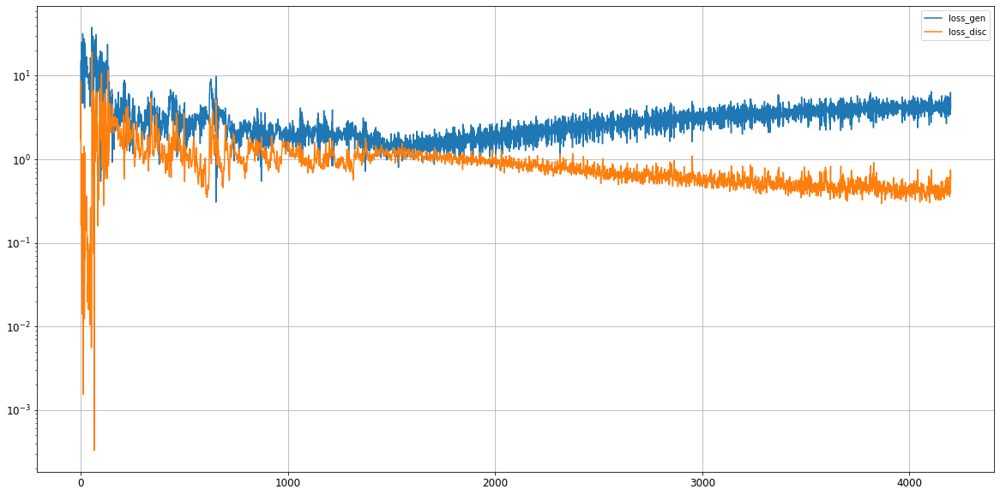

Epoch 4202/20000
0s
Epoch 4203/20000
0s
Epoch 4204/20000
0s
Epoch 4205/20000
0s
Epoch 4206/20000
0s
Epoch 4207/20000
0s
Epoch 4208/20000
0s
Epoch 4209/20000
0s
Epoch 4210/20000
0s
Epoch 4211/20000
0s
Epoch 4212/20000
0s
Epoch 4213/20000
0s
Epoch 4214/20000
0s
Epoch 4215/20000
0s
Epoch 4216/20000
0s
Epoch 4217/20000
0s
Epoch 4218/20000
0s
Epoch 4219/20000
0s
Epoch 4220/20000
0s
Epoch 4221/20000
0s
Epoch 4222/20000
0s
Epoch 4223/20000
0s
Epoch 4224/20000
0s
Epoch 4225/20000
0s
Epoch 4226/20000
0s
Epoch 4227/20000
0s
Epoch 4228/20000
0s
Epoch 4229/20000
0s
Epoch 4230/20000
0s
Epoch 4231/20000
0s
Epoch 4232/20000
0s
Epoch 4233/20000
0s
Epoch 4234/20000
0s
Epoch 4235/20000
0s
Epoch 4236/20000
0s
Epoch 4237/20000
0s
Epoch 4238/20000
0s
Epoch 4239/20000
0s
Epoch 4240/20000
0s
Epoch 4241/20000
0s
Epoch 4242/20000
0s
Epoch 4243/20000
0s
Epoch 4244/20000
0s
Epoch 4245/20000
0s
Epoch 4246/20000
0s
Epoch 4247/20000
0s
Epoch 4248/20000
0s
Epoch 4249/20000
0s
Epoch 4250/20000
0s
Epoch 4251/20000
0s


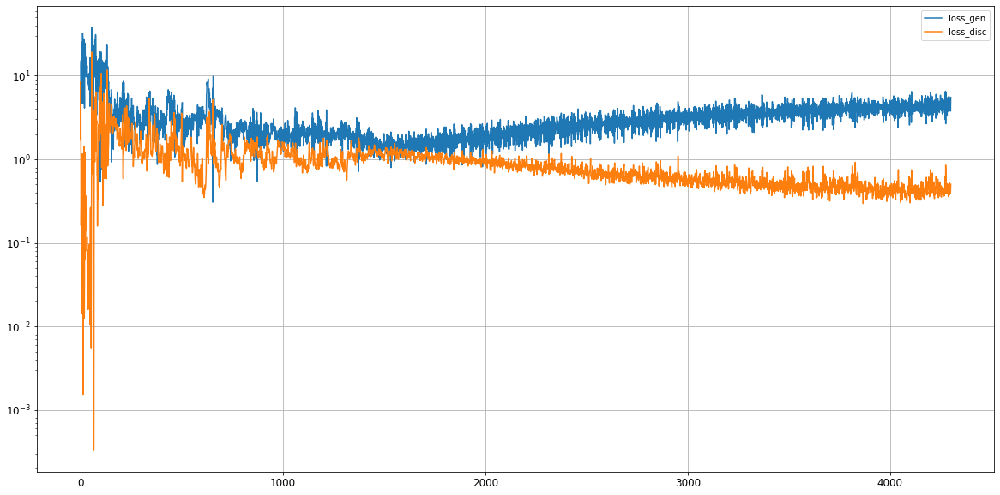

Epoch 4302/20000
0s
Epoch 4303/20000
0s
Epoch 4304/20000
0s
Epoch 4305/20000
0s
Epoch 4306/20000
0s
Epoch 4307/20000
0s
Epoch 4308/20000
0s
Epoch 4309/20000
0s
Epoch 4310/20000
0s
Epoch 4311/20000
0s
Epoch 4312/20000
0s
Epoch 4313/20000
0s
Epoch 4314/20000
0s
Epoch 4315/20000
0s
Epoch 4316/20000
0s
Epoch 4317/20000
0s
Epoch 4318/20000
0s
Epoch 4319/20000
0s
Epoch 4320/20000
0s
Epoch 4321/20000
0s
Epoch 4322/20000
0s
Epoch 4323/20000
0s
Epoch 4324/20000
0s
Epoch 4325/20000
0s
Epoch 4326/20000
0s
Epoch 4327/20000
0s
Epoch 4328/20000
0s
Epoch 4329/20000
0s
Epoch 4330/20000
0s
Epoch 4331/20000
0s
Epoch 4332/20000
0s
Epoch 4333/20000
0s
Epoch 4334/20000
0s
Epoch 4335/20000
0s
Epoch 4336/20000
0s
Epoch 4337/20000
0s
Epoch 4338/20000
0s
Epoch 4339/20000
0s
Epoch 4340/20000
0s
Epoch 4341/20000
0s
Epoch 4342/20000
0s
Epoch 4343/20000
0s
Epoch 4344/20000
0s
Epoch 4345/20000
0s
Epoch 4346/20000
0s
Epoch 4347/20000
0s
Epoch 4348/20000
0s
Epoch 4349/20000
0s
Epoch 4350/20000
0s
Epoch 4351/20000
0s


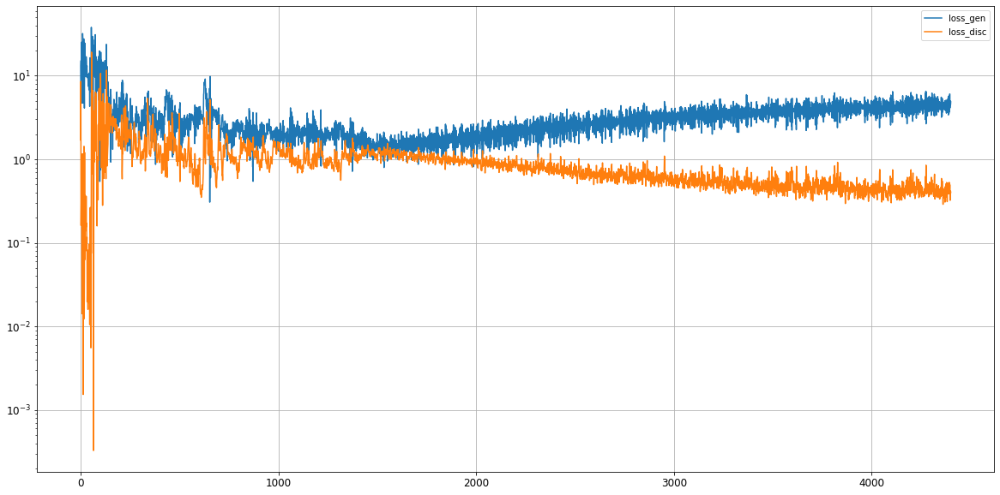

Epoch 4402/20000
0s
Epoch 4403/20000
0s
Epoch 4404/20000
0s
Epoch 4405/20000
0s
Epoch 4406/20000
0s
Epoch 4407/20000
0s
Epoch 4408/20000
0s
Epoch 4409/20000
0s
Epoch 4410/20000
0s
Epoch 4411/20000
0s
Epoch 4412/20000
0s
Epoch 4413/20000
0s
Epoch 4414/20000
0s
Epoch 4415/20000
0s
Epoch 4416/20000
0s
Epoch 4417/20000
0s
Epoch 4418/20000
0s
Epoch 4419/20000
0s
Epoch 4420/20000
0s
Epoch 4421/20000
0s
Epoch 4422/20000
0s
Epoch 4423/20000
0s
Epoch 4424/20000
0s
Epoch 4425/20000
0s
Epoch 4426/20000
0s
Epoch 4427/20000
0s
Epoch 4428/20000
0s
Epoch 4429/20000
0s
Epoch 4430/20000
0s
Epoch 4431/20000
0s
Epoch 4432/20000
0s
Epoch 4433/20000
0s
Epoch 4434/20000
0s
Epoch 4435/20000
0s
Epoch 4436/20000
0s
Epoch 4437/20000
0s
Epoch 4438/20000
0s
Epoch 4439/20000
0s
Epoch 4440/20000
0s
Epoch 4441/20000
0s
Epoch 4442/20000
0s
Epoch 4443/20000
0s
Epoch 4444/20000
0s
Epoch 4445/20000
0s
Epoch 4446/20000
0s
Epoch 4447/20000
0s
Epoch 4448/20000
0s
Epoch 4449/20000
0s
Epoch 4450/20000
0s
Epoch 4451/20000
0s


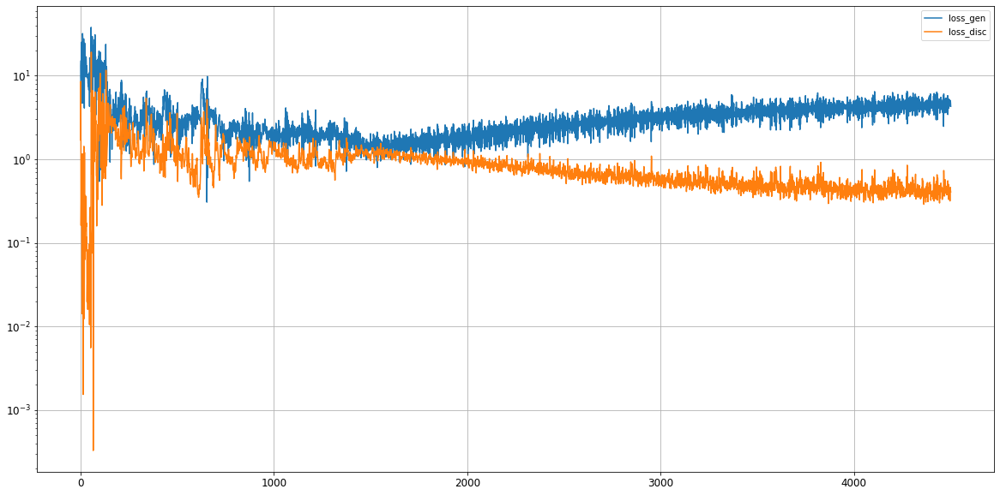

Epoch 4502/20000
0s
Epoch 4503/20000
0s
Epoch 4504/20000
0s
Epoch 4505/20000
0s
Epoch 4506/20000
0s
Epoch 4507/20000
0s
Epoch 4508/20000
0s
Epoch 4509/20000
0s
Epoch 4510/20000
0s
Epoch 4511/20000
0s
Epoch 4512/20000
0s
Epoch 4513/20000
0s
Epoch 4514/20000
0s
Epoch 4515/20000
0s
Epoch 4516/20000
0s
Epoch 4517/20000
0s
Epoch 4518/20000
0s
Epoch 4519/20000
0s
Epoch 4520/20000
0s
Epoch 4521/20000
0s
Epoch 4522/20000
0s
Epoch 4523/20000
0s
Epoch 4524/20000
0s
Epoch 4525/20000
0s
Epoch 4526/20000
0s
Epoch 4527/20000
0s
Epoch 4528/20000
0s
Epoch 4529/20000
0s
Epoch 4530/20000
0s
Epoch 4531/20000
0s
Epoch 4532/20000
0s
Epoch 4533/20000
0s
Epoch 4534/20000
0s
Epoch 4535/20000
0s
Epoch 4536/20000
0s
Epoch 4537/20000
0s
Epoch 4538/20000
0s
Epoch 4539/20000
0s
Epoch 4540/20000
0s
Epoch 4541/20000
0s
Epoch 4542/20000
0s
Epoch 4543/20000
0s
Epoch 4544/20000
0s
Epoch 4545/20000
0s
Epoch 4546/20000
0s
Epoch 4547/20000
0s
Epoch 4548/20000
0s
Epoch 4549/20000
0s
Epoch 4550/20000
0s
Epoch 4551/20000
0s


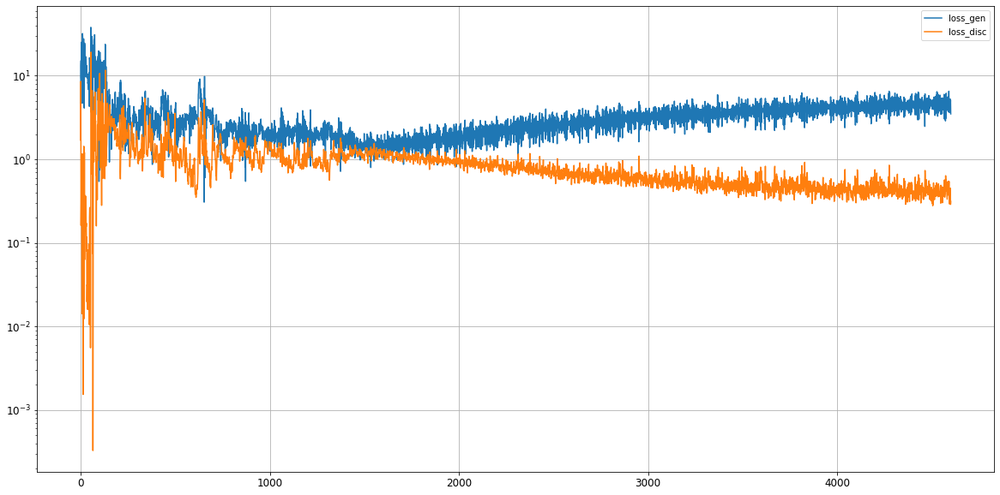

Epoch 4602/20000
0s
Epoch 4603/20000
0s
Epoch 4604/20000
0s
Epoch 4605/20000
0s
Epoch 4606/20000
0s
Epoch 4607/20000
0s
Epoch 4608/20000
0s
Epoch 4609/20000
0s
Epoch 4610/20000
0s
Epoch 4611/20000
0s
Epoch 4612/20000
0s
Epoch 4613/20000
0s
Epoch 4614/20000
0s
Epoch 4615/20000
0s
Epoch 4616/20000
0s
Epoch 4617/20000
0s
Epoch 4618/20000
0s
Epoch 4619/20000
0s
Epoch 4620/20000
0s
Epoch 4621/20000
0s
Epoch 4622/20000
0s
Epoch 4623/20000
0s
Epoch 4624/20000
0s
Epoch 4625/20000
0s
Epoch 4626/20000
0s
Epoch 4627/20000
0s
Epoch 4628/20000
0s
Epoch 4629/20000
0s
Epoch 4630/20000
0s
Epoch 4631/20000
0s
Epoch 4632/20000
0s
Epoch 4633/20000
0s
Epoch 4634/20000
0s
Epoch 4635/20000
0s
Epoch 4636/20000
0s
Epoch 4637/20000
0s
Epoch 4638/20000
0s
Epoch 4639/20000
0s
Epoch 4640/20000
0s
Epoch 4641/20000
0s
Epoch 4642/20000
0s
Epoch 4643/20000
0s
Epoch 4644/20000
0s
Epoch 4645/20000
0s
Epoch 4646/20000
0s
Epoch 4647/20000
0s
Epoch 4648/20000
0s
Epoch 4649/20000
0s
Epoch 4650/20000
0s
Epoch 4651/20000
0s


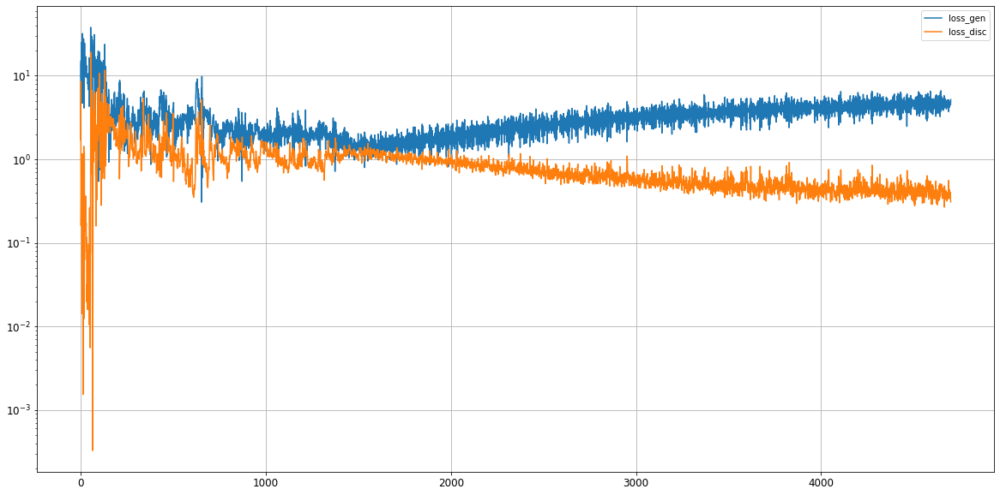

Epoch 4702/20000
0s
Epoch 4703/20000
0s
Epoch 4704/20000
0s
Epoch 4705/20000
0s
Epoch 4706/20000
0s
Epoch 4707/20000
0s
Epoch 4708/20000
0s
Epoch 4709/20000
0s
Epoch 4710/20000
0s
Epoch 4711/20000
0s
Epoch 4712/20000
0s
Epoch 4713/20000
0s
Epoch 4714/20000
0s
Epoch 4715/20000
0s
Epoch 4716/20000
0s
Epoch 4717/20000
0s
Epoch 4718/20000
0s
Epoch 4719/20000
0s
Epoch 4720/20000
0s
Epoch 4721/20000
0s
Epoch 4722/20000
0s
Epoch 4723/20000
0s
Epoch 4724/20000
0s
Epoch 4725/20000
0s
Epoch 4726/20000
0s
Epoch 4727/20000
0s
Epoch 4728/20000
0s
Epoch 4729/20000
0s
Epoch 4730/20000
0s
Epoch 4731/20000
0s
Epoch 4732/20000
0s
Epoch 4733/20000
0s
Epoch 4734/20000
0s
Epoch 4735/20000
0s
Epoch 4736/20000
0s
Epoch 4737/20000
0s
Epoch 4738/20000
0s
Epoch 4739/20000
0s
Epoch 4740/20000
0s
Epoch 4741/20000
0s
Epoch 4742/20000
0s
Epoch 4743/20000
0s
Epoch 4744/20000
0s
Epoch 4745/20000
0s
Epoch 4746/20000
0s
Epoch 4747/20000
0s
Epoch 4748/20000
0s
Epoch 4749/20000
0s
Epoch 4750/20000
0s
Epoch 4751/20000
0s


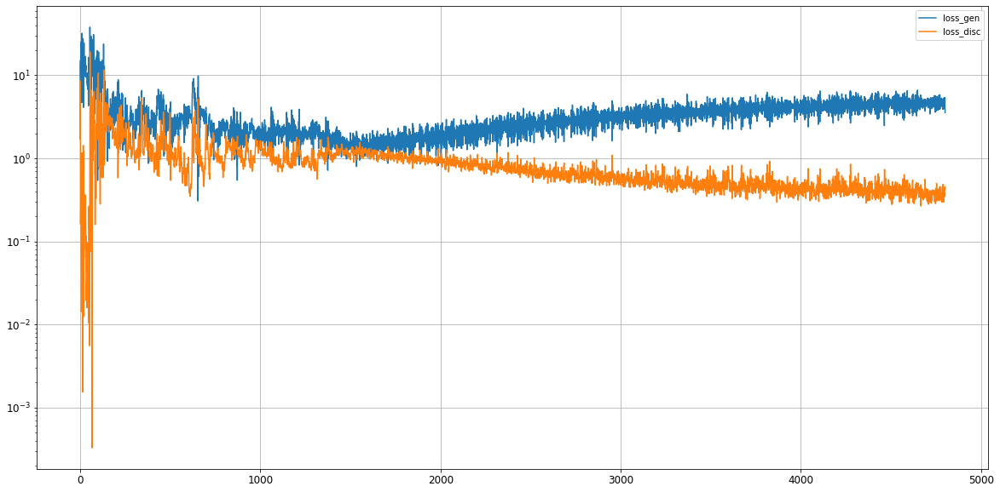

Epoch 4802/20000
0s
Epoch 4803/20000
0s
Epoch 4804/20000
0s
Epoch 4805/20000
0s
Epoch 4806/20000
0s
Epoch 4807/20000
0s
Epoch 4808/20000
0s
Epoch 4809/20000
0s
Epoch 4810/20000
0s
Epoch 4811/20000
0s
Epoch 4812/20000
0s
Epoch 4813/20000
0s
Epoch 4814/20000
0s
Epoch 4815/20000
0s
Epoch 4816/20000
0s
Epoch 4817/20000
0s
Epoch 4818/20000
0s
Epoch 4819/20000
0s
Epoch 4820/20000
0s
Epoch 4821/20000
0s
Epoch 4822/20000
0s
Epoch 4823/20000
0s
Epoch 4824/20000
0s
Epoch 4825/20000
0s
Epoch 4826/20000
0s
Epoch 4827/20000
0s
Epoch 4828/20000
0s
Epoch 4829/20000
0s
Epoch 4830/20000
0s
Epoch 4831/20000
0s
Epoch 4832/20000
0s
Epoch 4833/20000
0s
Epoch 4834/20000
0s
Epoch 4835/20000
0s
Epoch 4836/20000
0s
Epoch 4837/20000
0s
Epoch 4838/20000
0s
Epoch 4839/20000
0s
Epoch 4840/20000
0s
Epoch 4841/20000
0s
Epoch 4842/20000
0s
Epoch 4843/20000
0s
Epoch 4844/20000
0s
Epoch 4845/20000
0s
Epoch 4846/20000
0s
Epoch 4847/20000
0s
Epoch 4848/20000
0s
Epoch 4849/20000
0s
Epoch 4850/20000
0s
Epoch 4851/20000
0s


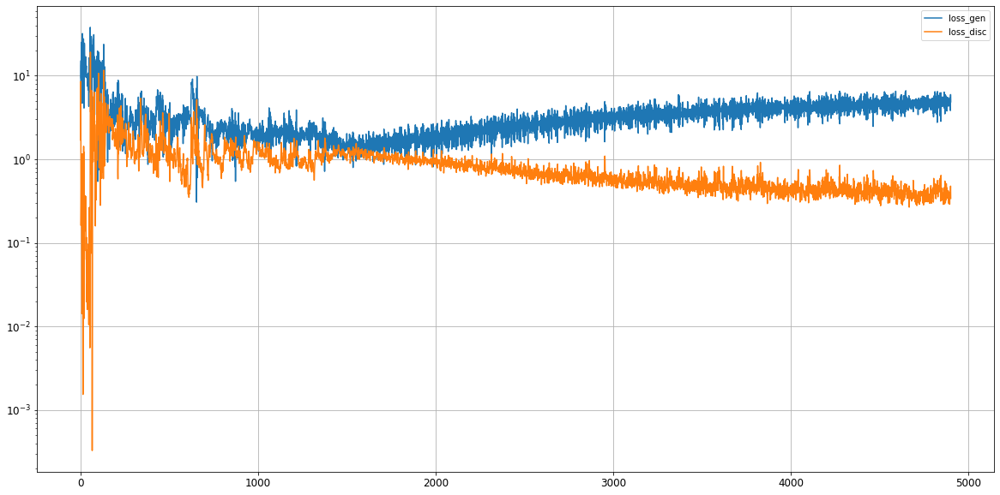

Epoch 4902/20000
0s
Epoch 4903/20000
0s
Epoch 4904/20000
0s
Epoch 4905/20000
0s
Epoch 4906/20000
0s
Epoch 4907/20000
0s
Epoch 4908/20000
0s
Epoch 4909/20000
0s
Epoch 4910/20000
0s
Epoch 4911/20000
0s
Epoch 4912/20000
0s
Epoch 4913/20000
0s
Epoch 4914/20000
0s
Epoch 4915/20000
0s
Epoch 4916/20000
0s
Epoch 4917/20000
0s
Epoch 4918/20000
0s
Epoch 4919/20000
0s
Epoch 4920/20000
0s
Epoch 4921/20000
0s
Epoch 4922/20000
0s
Epoch 4923/20000
0s
Epoch 4924/20000
0s
Epoch 4925/20000
0s
Epoch 4926/20000
0s
Epoch 4927/20000
0s
Epoch 4928/20000
0s
Epoch 4929/20000
0s
Epoch 4930/20000
0s
Epoch 4931/20000
0s
Epoch 4932/20000
0s
Epoch 4933/20000
0s
Epoch 4934/20000
0s
Epoch 4935/20000
0s
Epoch 4936/20000
0s
Epoch 4937/20000
0s
Epoch 4938/20000
0s
Epoch 4939/20000
0s
Epoch 4940/20000
0s
Epoch 4941/20000
0s
Epoch 4942/20000
0s
Epoch 4943/20000
0s
Epoch 4944/20000
0s
Epoch 4945/20000
0s
Epoch 4946/20000
0s
Epoch 4947/20000
0s
Epoch 4948/20000
0s
Epoch 4949/20000
0s
Epoch 4950/20000
0s
Epoch 4951/20000
0s


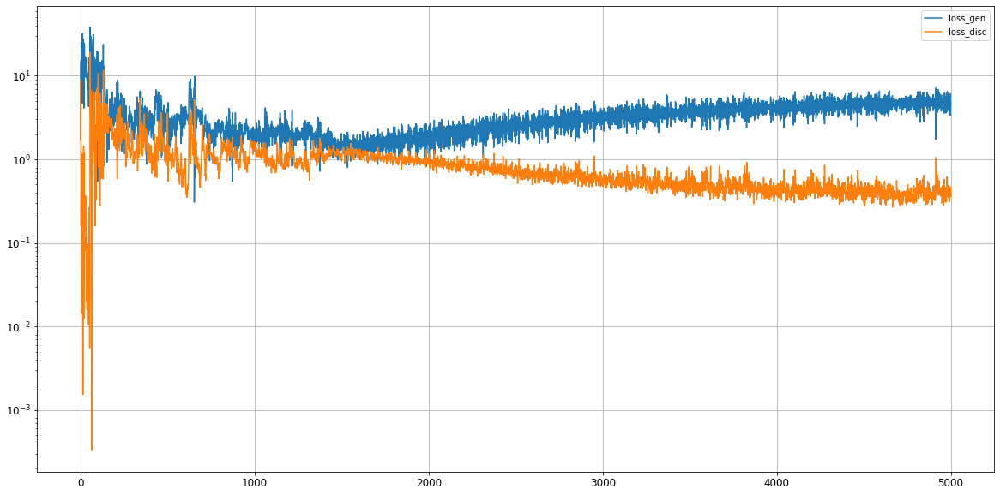

Epoch 5002/20000
0s
Epoch 5003/20000
0s
Epoch 5004/20000
0s
Epoch 5005/20000
0s
Epoch 5006/20000
0s
Epoch 5007/20000
0s
Epoch 5008/20000
0s
Epoch 5009/20000
0s
Epoch 5010/20000
0s
Epoch 5011/20000
0s
Epoch 5012/20000
0s
Epoch 5013/20000
0s
Epoch 5014/20000
0s
Epoch 5015/20000
0s
Epoch 5016/20000
0s
Epoch 5017/20000
0s
Epoch 5018/20000
0s
Epoch 5019/20000
0s
Epoch 5020/20000
0s
Epoch 5021/20000
0s
Epoch 5022/20000
0s
Epoch 5023/20000
0s
Epoch 5024/20000
0s
Epoch 5025/20000
0s
Epoch 5026/20000
0s
Epoch 5027/20000
0s
Epoch 5028/20000
0s
Epoch 5029/20000
0s
Epoch 5030/20000
0s
Epoch 5031/20000
0s
Epoch 5032/20000
0s
Epoch 5033/20000
0s
Epoch 5034/20000
0s
Epoch 5035/20000
0s
Epoch 5036/20000
0s
Epoch 5037/20000
0s
Epoch 5038/20000
0s
Epoch 5039/20000
0s
Epoch 5040/20000
0s
Epoch 5041/20000
0s
Epoch 5042/20000
0s
Epoch 5043/20000
0s
Epoch 5044/20000
0s
Epoch 5045/20000
0s
Epoch 5046/20000
0s
Epoch 5047/20000
0s
Epoch 5048/20000
0s
Epoch 5049/20000
0s
Epoch 5050/20000
0s
Epoch 5051/20000
0s


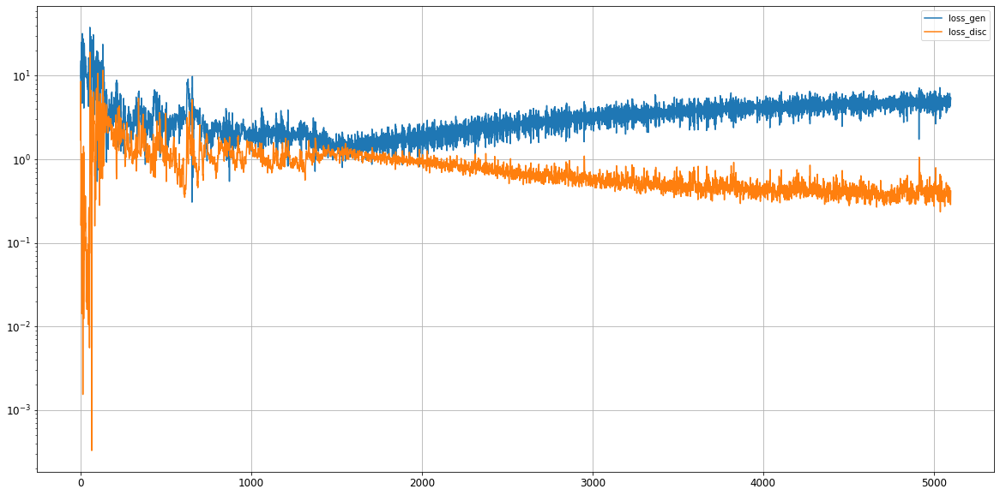

Epoch 5102/20000
0s
Epoch 5103/20000
0s
Epoch 5104/20000
0s
Epoch 5105/20000
0s
Epoch 5106/20000
0s
Epoch 5107/20000
0s
Epoch 5108/20000
0s
Epoch 5109/20000
0s
Epoch 5110/20000
0s
Epoch 5111/20000
0s
Epoch 5112/20000
0s
Epoch 5113/20000
0s
Epoch 5114/20000
0s
Epoch 5115/20000
0s
Epoch 5116/20000
0s
Epoch 5117/20000
0s
Epoch 5118/20000
0s
Epoch 5119/20000
0s
Epoch 5120/20000
0s
Epoch 5121/20000
0s
Epoch 5122/20000
0s
Epoch 5123/20000
0s
Epoch 5124/20000
0s
Epoch 5125/20000
0s
Epoch 5126/20000
0s
Epoch 5127/20000
0s
Epoch 5128/20000
0s
Epoch 5129/20000
0s
Epoch 5130/20000
0s
Epoch 5131/20000
0s
Epoch 5132/20000
0s
Epoch 5133/20000
0s
Epoch 5134/20000
0s
Epoch 5135/20000
0s
Epoch 5136/20000
0s
Epoch 5137/20000
0s
Epoch 5138/20000
0s
Epoch 5139/20000
0s
Epoch 5140/20000
0s
Epoch 5141/20000
0s
Epoch 5142/20000
0s
Epoch 5143/20000
0s
Epoch 5144/20000
0s
Epoch 5145/20000
0s
Epoch 5146/20000
0s
Epoch 5147/20000
0s
Epoch 5148/20000
0s
Epoch 5149/20000
0s
Epoch 5150/20000
0s
Epoch 5151/20000
0s


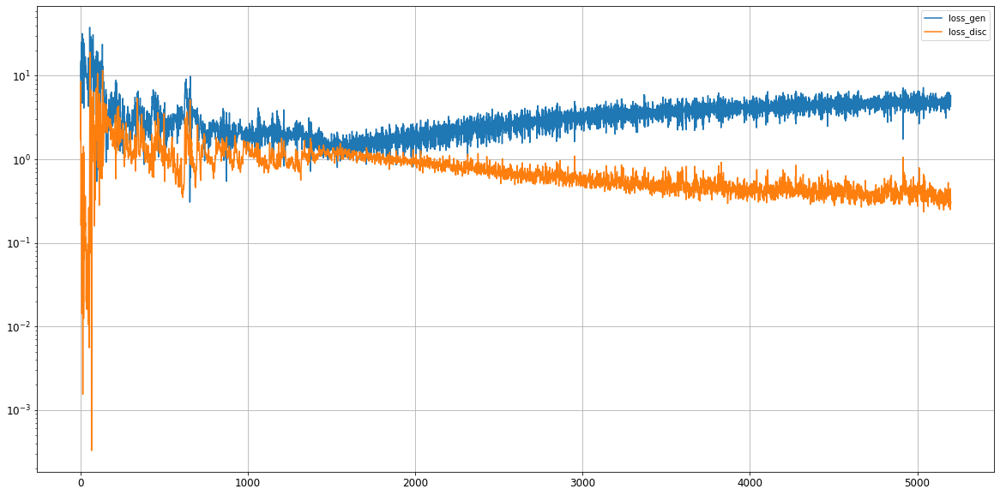

Epoch 5202/20000
0s
Epoch 5203/20000
0s
Epoch 5204/20000
0s
Epoch 5205/20000
0s
Epoch 5206/20000
0s
Epoch 5207/20000
0s
Epoch 5208/20000
0s
Epoch 5209/20000
0s
Epoch 5210/20000
0s
Epoch 5211/20000
0s
Epoch 5212/20000
0s
Epoch 5213/20000
0s
Epoch 5214/20000
0s
Epoch 5215/20000
0s
Epoch 5216/20000
0s
Epoch 5217/20000
0s
Epoch 5218/20000
0s
Epoch 5219/20000
0s
Epoch 5220/20000
0s
Epoch 5221/20000
0s
Epoch 5222/20000
0s
Epoch 5223/20000
0s
Epoch 5224/20000
0s
Epoch 5225/20000
0s
Epoch 5226/20000
0s
Epoch 5227/20000
0s
Epoch 5228/20000
0s
Epoch 5229/20000
0s
Epoch 5230/20000
0s
Epoch 5231/20000
0s
Epoch 5232/20000
0s
Epoch 5233/20000
0s
Epoch 5234/20000
0s
Epoch 5235/20000
0s
Epoch 5236/20000
0s
Epoch 5237/20000
0s
Epoch 5238/20000
0s
Epoch 5239/20000
0s
Epoch 5240/20000
0s
Epoch 5241/20000
0s
Epoch 5242/20000
0s
Epoch 5243/20000
0s
Epoch 5244/20000
0s
Epoch 5245/20000
0s
Epoch 5246/20000
0s
Epoch 5247/20000
0s
Epoch 5248/20000
0s
Epoch 5249/20000
0s
Epoch 5250/20000
0s
Epoch 5251/20000
0s


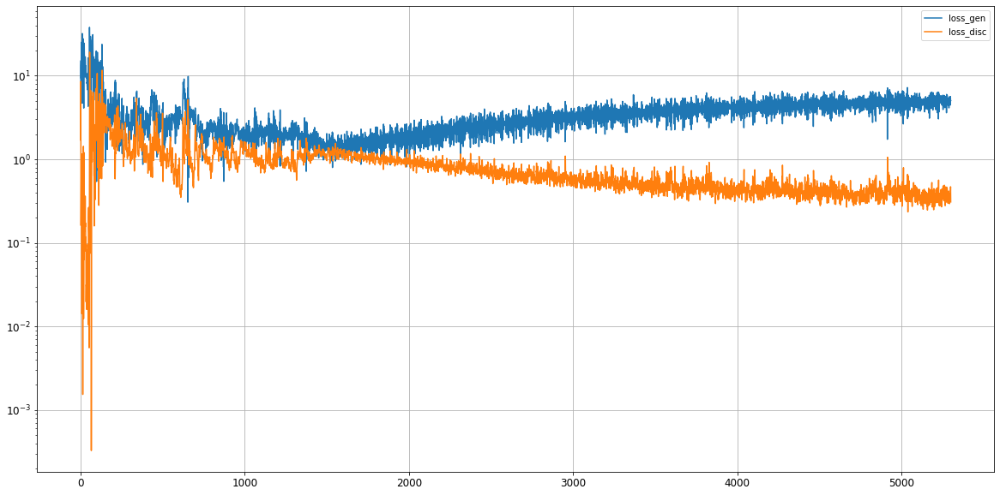

Epoch 5302/20000
0s
Epoch 5303/20000
0s
Epoch 5304/20000
0s
Epoch 5305/20000
0s
Epoch 5306/20000
0s
Epoch 5307/20000
0s
Epoch 5308/20000
0s
Epoch 5309/20000
0s
Epoch 5310/20000
0s
Epoch 5311/20000
0s
Epoch 5312/20000
0s
Epoch 5313/20000
0s
Epoch 5314/20000
0s
Epoch 5315/20000
0s
Epoch 5316/20000
0s
Epoch 5317/20000
0s
Epoch 5318/20000
0s
Epoch 5319/20000
0s
Epoch 5320/20000
0s
Epoch 5321/20000
0s
Epoch 5322/20000
0s
Epoch 5323/20000
0s
Epoch 5324/20000
0s
Epoch 5325/20000
0s
Epoch 5326/20000
0s
Epoch 5327/20000
0s
Epoch 5328/20000
0s
Epoch 5329/20000
0s
Epoch 5330/20000
0s
Epoch 5331/20000
0s
Epoch 5332/20000
0s
Epoch 5333/20000
0s
Epoch 5334/20000
0s
Epoch 5335/20000
0s
Epoch 5336/20000
0s
Epoch 5337/20000
0s
Epoch 5338/20000
0s
Epoch 5339/20000
0s
Epoch 5340/20000
0s
Epoch 5341/20000
0s
Epoch 5342/20000
0s
Epoch 5343/20000
0s
Epoch 5344/20000
0s
Epoch 5345/20000
0s
Epoch 5346/20000
0s
Epoch 5347/20000
0s
Epoch 5348/20000
0s
Epoch 5349/20000
0s
Epoch 5350/20000
0s
Epoch 5351/20000
0s


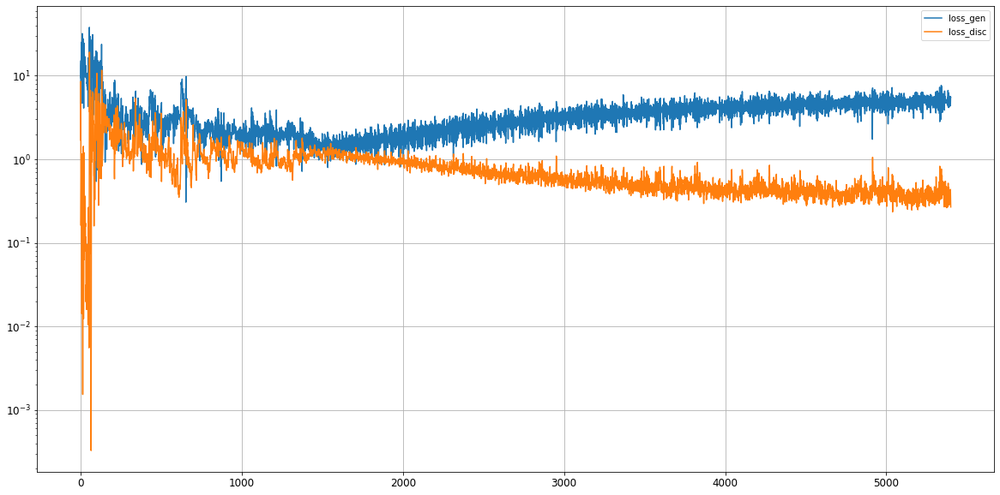

Epoch 5402/20000
0s
Epoch 5403/20000
0s
Epoch 5404/20000
0s
Epoch 5405/20000
0s
Epoch 5406/20000
0s
Epoch 5407/20000
0s
Epoch 5408/20000
0s
Epoch 5409/20000
0s
Epoch 5410/20000
0s
Epoch 5411/20000
0s
Epoch 5412/20000
0s
Epoch 5413/20000
0s
Epoch 5414/20000
0s
Epoch 5415/20000
0s
Epoch 5416/20000
0s
Epoch 5417/20000
0s
Epoch 5418/20000
0s
Epoch 5419/20000
0s
Epoch 5420/20000
0s
Epoch 5421/20000
0s
Epoch 5422/20000
0s
Epoch 5423/20000
0s
Epoch 5424/20000
0s
Epoch 5425/20000
0s
Epoch 5426/20000
0s
Epoch 5427/20000
0s
Epoch 5428/20000
0s
Epoch 5429/20000
0s
Epoch 5430/20000
0s
Epoch 5431/20000
0s
Epoch 5432/20000
0s
Epoch 5433/20000
0s
Epoch 5434/20000
0s
Epoch 5435/20000
0s
Epoch 5436/20000
0s
Epoch 5437/20000
0s
Epoch 5438/20000
0s
Epoch 5439/20000
0s
Epoch 5440/20000
0s
Epoch 5441/20000
0s
Epoch 5442/20000
0s
Epoch 5443/20000
0s
Epoch 5444/20000
0s
Epoch 5445/20000
0s
Epoch 5446/20000
0s
Epoch 5447/20000
0s
Epoch 5448/20000
0s
Epoch 5449/20000
0s
Epoch 5450/20000
0s
Epoch 5451/20000
0s


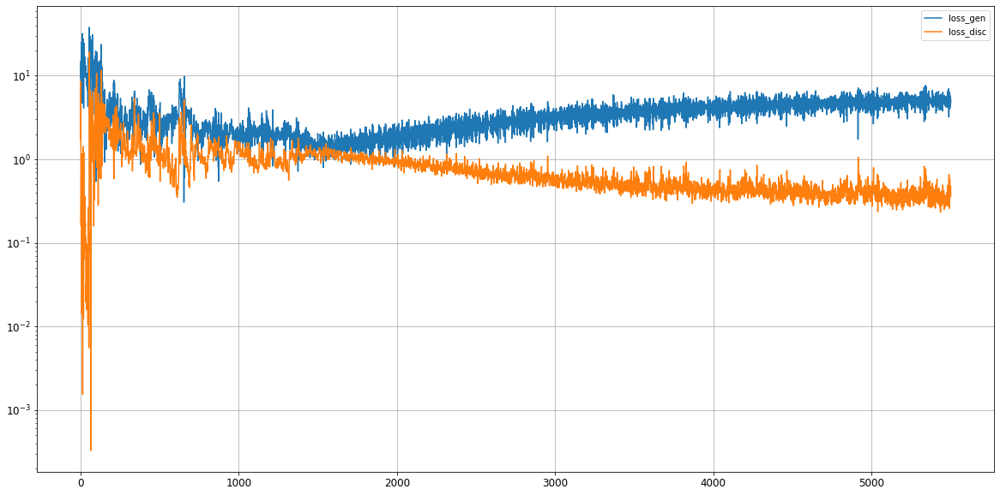

Epoch 5502/20000
0s
Epoch 5503/20000
0s
Epoch 5504/20000
0s
Epoch 5505/20000
0s
Epoch 5506/20000
0s
Epoch 5507/20000
0s
Epoch 5508/20000
0s
Epoch 5509/20000
0s
Epoch 5510/20000
0s
Epoch 5511/20000
0s
Epoch 5512/20000
0s
Epoch 5513/20000
0s
Epoch 5514/20000
0s
Epoch 5515/20000
0s
Epoch 5516/20000
0s
Epoch 5517/20000
0s
Epoch 5518/20000
0s
Epoch 5519/20000
0s
Epoch 5520/20000
0s
Epoch 5521/20000
0s
Epoch 5522/20000
0s
Epoch 5523/20000
0s
Epoch 5524/20000
0s
Epoch 5525/20000
0s
Epoch 5526/20000
0s
Epoch 5527/20000
0s
Epoch 5528/20000
0s
Epoch 5529/20000
0s
Epoch 5530/20000
0s
Epoch 5531/20000
0s
Epoch 5532/20000
0s
Epoch 5533/20000
0s
Epoch 5534/20000
0s
Epoch 5535/20000
0s
Epoch 5536/20000
0s
Epoch 5537/20000
0s
Epoch 5538/20000
0s
Epoch 5539/20000
0s
Epoch 5540/20000
0s
Epoch 5541/20000
0s
Epoch 5542/20000
0s
Epoch 5543/20000
0s
Epoch 5544/20000
0s
Epoch 5545/20000
0s
Epoch 5546/20000
0s
Epoch 5547/20000
0s
Epoch 5548/20000
0s
Epoch 5549/20000
0s
Epoch 5550/20000
0s
Epoch 5551/20000
0s


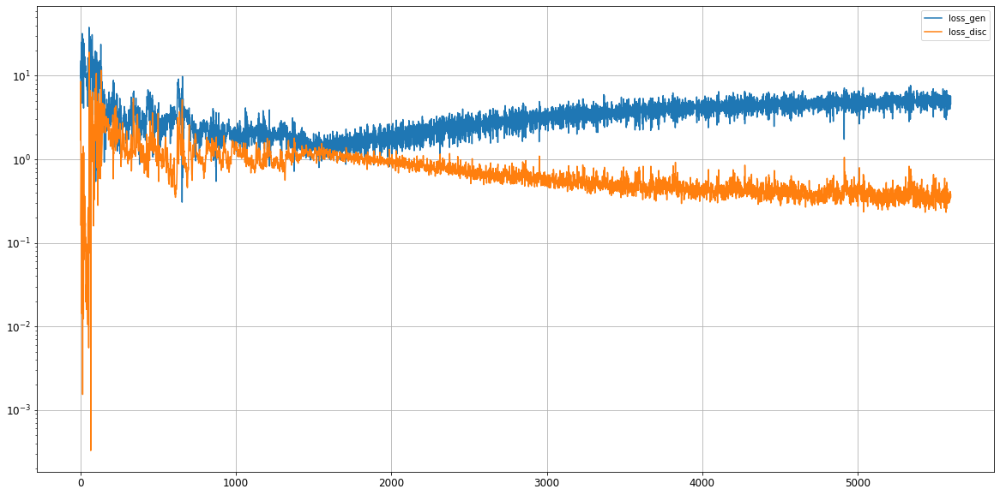

Epoch 5602/20000
0s
Epoch 5603/20000
0s
Epoch 5604/20000
0s
Epoch 5605/20000
0s
Epoch 5606/20000
0s
Epoch 5607/20000
0s
Epoch 5608/20000
0s
Epoch 5609/20000
0s
Epoch 5610/20000
0s
Epoch 5611/20000
0s
Epoch 5612/20000
0s
Epoch 5613/20000
0s
Epoch 5614/20000
0s
Epoch 5615/20000
0s
Epoch 5616/20000
0s
Epoch 5617/20000
0s
Epoch 5618/20000
0s
Epoch 5619/20000
0s
Epoch 5620/20000
0s
Epoch 5621/20000
0s
Epoch 5622/20000
0s
Epoch 5623/20000
0s
Epoch 5624/20000
0s
Epoch 5625/20000
0s
Epoch 5626/20000
0s
Epoch 5627/20000
0s
Epoch 5628/20000
0s
Epoch 5629/20000
0s
Epoch 5630/20000
0s
Epoch 5631/20000
0s
Epoch 5632/20000
0s
Epoch 5633/20000
0s
Epoch 5634/20000
0s
Epoch 5635/20000
0s
Epoch 5636/20000
0s
Epoch 5637/20000
0s
Epoch 5638/20000
0s
Epoch 5639/20000
0s
Epoch 5640/20000
0s
Epoch 5641/20000
0s
Epoch 5642/20000
0s
Epoch 5643/20000
0s
Epoch 5644/20000
0s
Epoch 5645/20000
0s
Epoch 5646/20000
0s
Epoch 5647/20000
0s
Epoch 5648/20000
0s
Epoch 5649/20000
0s
Epoch 5650/20000
0s
Epoch 5651/20000
0s


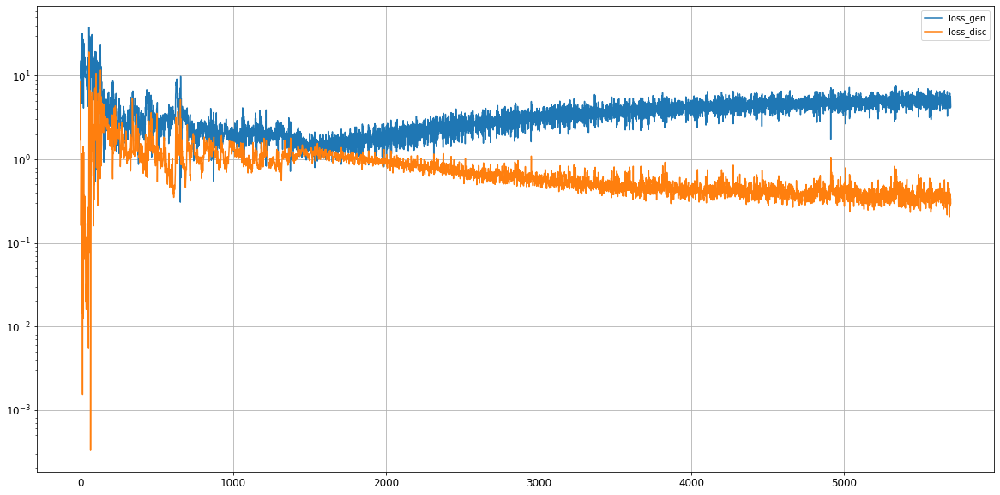

Epoch 5702/20000
0s
Epoch 5703/20000
0s
Epoch 5704/20000
0s
Epoch 5705/20000
0s
Epoch 5706/20000
0s
Epoch 5707/20000
0s
Epoch 5708/20000
0s
Epoch 5709/20000
0s
Epoch 5710/20000
0s
Epoch 5711/20000
0s
Epoch 5712/20000
0s
Epoch 5713/20000
0s
Epoch 5714/20000
0s
Epoch 5715/20000
0s
Epoch 5716/20000
0s
Epoch 5717/20000
0s
Epoch 5718/20000
0s
Epoch 5719/20000
0s
Epoch 5720/20000
0s
Epoch 5721/20000
0s
Epoch 5722/20000
0s
Epoch 5723/20000
0s
Epoch 5724/20000
0s
Epoch 5725/20000
0s
Epoch 5726/20000
0s
Epoch 5727/20000
0s
Epoch 5728/20000
0s
Epoch 5729/20000
0s
Epoch 5730/20000
0s
Epoch 5731/20000
0s
Epoch 5732/20000
0s
Epoch 5733/20000
0s
Epoch 5734/20000
0s
Epoch 5735/20000
0s
Epoch 5736/20000
0s
Epoch 5737/20000
0s
Epoch 5738/20000
0s
Epoch 5739/20000
0s
Epoch 5740/20000
0s
Epoch 5741/20000
0s
Epoch 5742/20000
0s
Epoch 5743/20000
0s
Epoch 5744/20000
0s
Epoch 5745/20000
0s
Epoch 5746/20000
0s
Epoch 5747/20000
0s
Epoch 5748/20000
0s
Epoch 5749/20000
0s
Epoch 5750/20000
0s
Epoch 5751/20000
0s


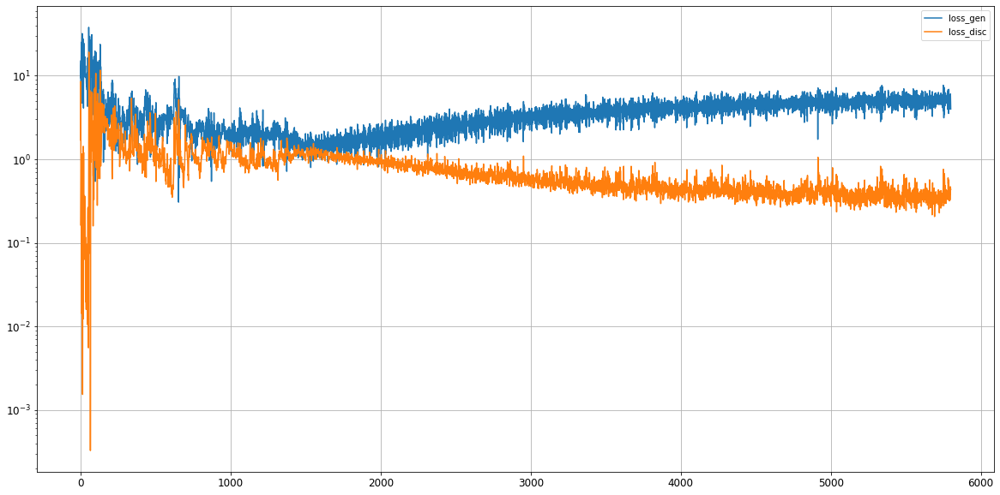

Epoch 5802/20000
0s
Epoch 5803/20000
0s
Epoch 5804/20000
0s
Epoch 5805/20000
0s
Epoch 5806/20000
0s
Epoch 5807/20000
0s
Epoch 5808/20000
0s
Epoch 5809/20000
0s
Epoch 5810/20000
0s
Epoch 5811/20000
0s
Epoch 5812/20000
0s
Epoch 5813/20000
0s
Epoch 5814/20000
0s
Epoch 5815/20000
0s
Epoch 5816/20000
0s
Epoch 5817/20000
0s
Epoch 5818/20000
0s
Epoch 5819/20000
0s
Epoch 5820/20000
0s
Epoch 5821/20000
0s
Epoch 5822/20000
0s
Epoch 5823/20000
0s
Epoch 5824/20000
0s
Epoch 5825/20000
0s
Epoch 5826/20000
0s
Epoch 5827/20000
0s
Epoch 5828/20000
0s
Epoch 5829/20000
0s
Epoch 5830/20000
0s
Epoch 5831/20000
0s
Epoch 5832/20000
0s
Epoch 5833/20000
0s
Epoch 5834/20000
0s
Epoch 5835/20000
0s
Epoch 5836/20000
0s
Epoch 5837/20000
0s
Epoch 5838/20000
0s
Epoch 5839/20000
0s
Epoch 5840/20000
0s
Epoch 5841/20000
0s
Epoch 5842/20000
0s
Epoch 5843/20000
0s
Epoch 5844/20000
0s
Epoch 5845/20000
0s
Epoch 5846/20000
0s
Epoch 5847/20000
0s
Epoch 5848/20000
0s
Epoch 5849/20000
0s
Epoch 5850/20000
0s
Epoch 5851/20000
0s


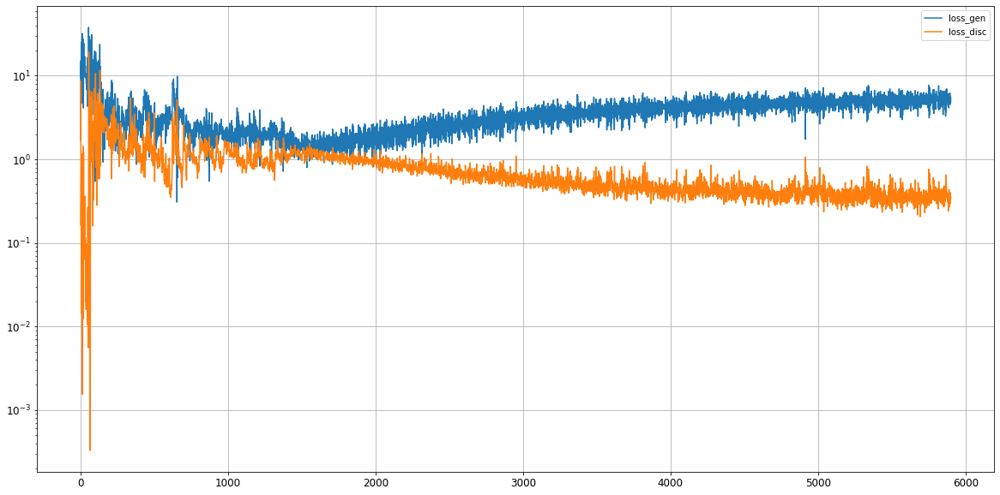

Epoch 5902/20000
0s
Epoch 5903/20000
0s
Epoch 5904/20000
0s
Epoch 5905/20000
0s
Epoch 5906/20000
0s
Epoch 5907/20000
0s
Epoch 5908/20000
0s
Epoch 5909/20000
0s
Epoch 5910/20000
0s
Epoch 5911/20000
0s
Epoch 5912/20000
0s
Epoch 5913/20000
0s
Epoch 5914/20000
0s
Epoch 5915/20000
0s
Epoch 5916/20000
0s
Epoch 5917/20000
0s
Epoch 5918/20000
0s
Epoch 5919/20000
0s
Epoch 5920/20000
0s
Epoch 5921/20000
0s
Epoch 5922/20000
0s
Epoch 5923/20000
0s
Epoch 5924/20000
0s
Epoch 5925/20000
0s
Epoch 5926/20000
0s
Epoch 5927/20000
0s
Epoch 5928/20000
0s
Epoch 5929/20000
0s
Epoch 5930/20000
0s
Epoch 5931/20000
0s
Epoch 5932/20000
0s
Epoch 5933/20000
0s
Epoch 5934/20000
0s
Epoch 5935/20000
0s
Epoch 5936/20000
0s
Epoch 5937/20000
0s
Epoch 5938/20000
0s
Epoch 5939/20000
0s
Epoch 5940/20000
0s
Epoch 5941/20000
0s
Epoch 5942/20000
0s
Epoch 5943/20000
0s
Epoch 5944/20000
0s
Epoch 5945/20000
0s
Epoch 5946/20000
0s
Epoch 5947/20000
0s
Epoch 5948/20000
0s
Epoch 5949/20000
0s
Epoch 5950/20000
0s
Epoch 5951/20000
0s


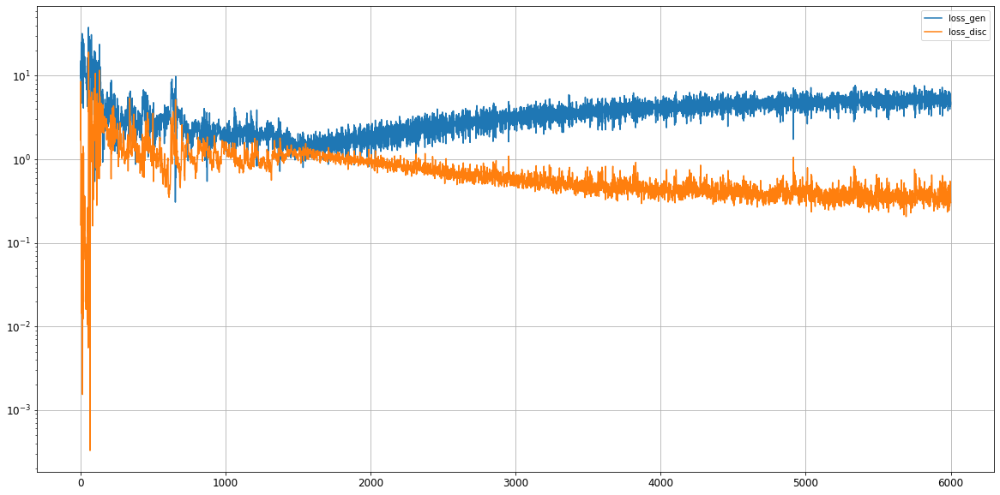

Epoch 6002/20000
0s
Epoch 6003/20000
0s
Epoch 6004/20000
0s
Epoch 6005/20000
0s
Epoch 6006/20000
0s
Epoch 6007/20000
0s
Epoch 6008/20000
0s
Epoch 6009/20000
0s
Epoch 6010/20000
0s
Epoch 6011/20000
0s
Epoch 6012/20000
0s
Epoch 6013/20000
0s
Epoch 6014/20000
0s
Epoch 6015/20000
0s
Epoch 6016/20000
0s
Epoch 6017/20000
0s
Epoch 6018/20000
0s
Epoch 6019/20000
0s
Epoch 6020/20000
0s
Epoch 6021/20000
0s
Epoch 6022/20000
0s
Epoch 6023/20000
0s
Epoch 6024/20000
0s
Epoch 6025/20000
0s
Epoch 6026/20000
0s
Epoch 6027/20000
0s
Epoch 6028/20000
0s
Epoch 6029/20000
0s
Epoch 6030/20000
0s
Epoch 6031/20000
0s
Epoch 6032/20000
0s
Epoch 6033/20000
0s
Epoch 6034/20000
0s
Epoch 6035/20000
0s
Epoch 6036/20000
0s
Epoch 6037/20000
0s
Epoch 6038/20000
0s
Epoch 6039/20000
0s
Epoch 6040/20000
0s
Epoch 6041/20000
0s
Epoch 6042/20000
0s
Epoch 6043/20000
0s
Epoch 6044/20000
0s
Epoch 6045/20000
0s
Epoch 6046/20000
0s
Epoch 6047/20000
0s
Epoch 6048/20000
0s
Epoch 6049/20000
0s
Epoch 6050/20000
0s
Epoch 6051/20000
0s


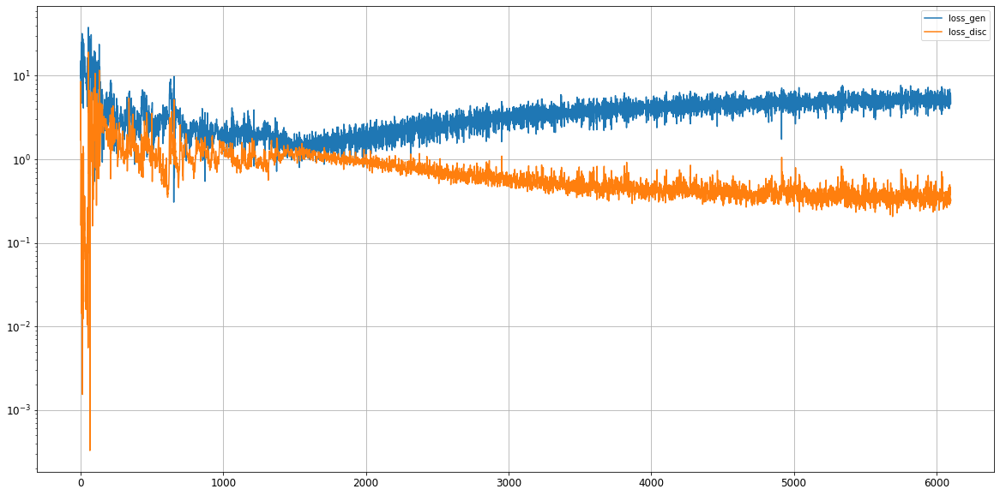

Epoch 6102/20000
0s
Epoch 6103/20000
0s
Epoch 6104/20000
0s
Epoch 6105/20000
0s
Epoch 6106/20000
0s
Epoch 6107/20000
0s
Epoch 6108/20000
0s
Epoch 6109/20000
0s
Epoch 6110/20000
0s
Epoch 6111/20000
0s
Epoch 6112/20000
0s
Epoch 6113/20000
0s
Epoch 6114/20000
0s
Epoch 6115/20000
0s
Epoch 6116/20000
0s
Epoch 6117/20000
0s
Epoch 6118/20000
0s
Epoch 6119/20000
0s
Epoch 6120/20000
0s
Epoch 6121/20000
0s
Epoch 6122/20000
0s
Epoch 6123/20000
0s
Epoch 6124/20000
0s
Epoch 6125/20000
0s
Epoch 6126/20000
0s
Epoch 6127/20000
0s
Epoch 6128/20000
0s
Epoch 6129/20000
0s
Epoch 6130/20000
0s
Epoch 6131/20000
0s
Epoch 6132/20000
0s
Epoch 6133/20000
0s
Epoch 6134/20000
0s
Epoch 6135/20000
0s
Epoch 6136/20000
0s
Epoch 6137/20000
0s
Epoch 6138/20000
0s
Epoch 6139/20000
0s
Epoch 6140/20000
0s
Epoch 6141/20000
0s
Epoch 6142/20000
0s
Epoch 6143/20000
0s
Epoch 6144/20000
0s
Epoch 6145/20000
0s
Epoch 6146/20000
0s
Epoch 6147/20000
0s
Epoch 6148/20000
0s
Epoch 6149/20000
0s
Epoch 6150/20000
0s
Epoch 6151/20000
0s


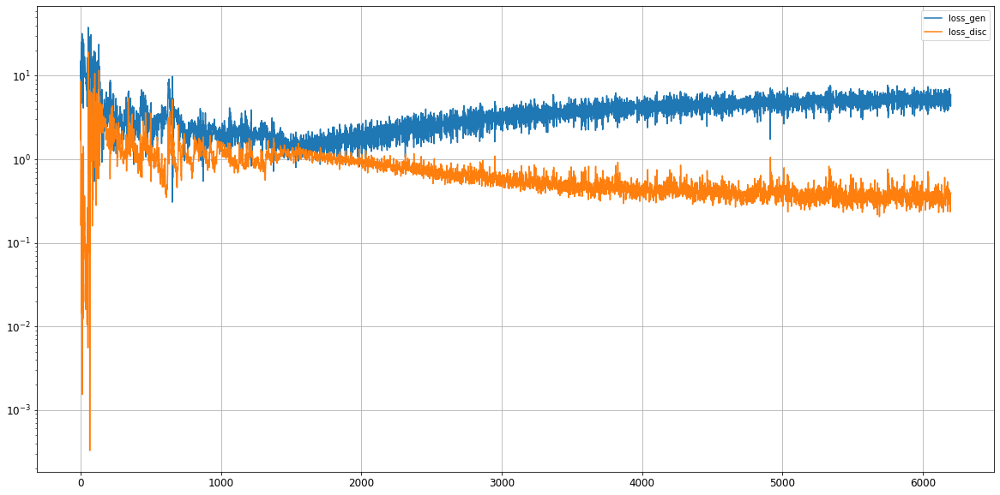

Epoch 6202/20000
0s
Epoch 6203/20000
0s
Epoch 6204/20000
0s
Epoch 6205/20000
0s
Epoch 6206/20000
0s
Epoch 6207/20000
0s
Epoch 6208/20000
0s
Epoch 6209/20000
0s
Epoch 6210/20000
0s
Epoch 6211/20000
0s
Epoch 6212/20000
0s
Epoch 6213/20000
0s
Epoch 6214/20000
0s
Epoch 6215/20000
0s
Epoch 6216/20000
0s
Epoch 6217/20000
0s
Epoch 6218/20000
0s
Epoch 6219/20000
0s
Epoch 6220/20000
0s
Epoch 6221/20000
0s
Epoch 6222/20000
0s
Epoch 6223/20000
0s
Epoch 6224/20000
0s
Epoch 6225/20000
0s
Epoch 6226/20000
0s
Epoch 6227/20000
0s
Epoch 6228/20000
0s
Epoch 6229/20000
0s
Epoch 6230/20000
0s
Epoch 6231/20000
0s
Epoch 6232/20000
0s
Epoch 6233/20000
0s
Epoch 6234/20000
0s
Epoch 6235/20000
0s
Epoch 6236/20000
0s
Epoch 6237/20000
0s
Epoch 6238/20000
0s
Epoch 6239/20000
0s
Epoch 6240/20000
0s
Epoch 6241/20000
0s
Epoch 6242/20000
0s
Epoch 6243/20000
0s
Epoch 6244/20000
0s
Epoch 6245/20000
0s
Epoch 6246/20000
0s
Epoch 6247/20000
0s
Epoch 6248/20000
0s
Epoch 6249/20000
0s
Epoch 6250/20000
0s
Epoch 6251/20000
0s


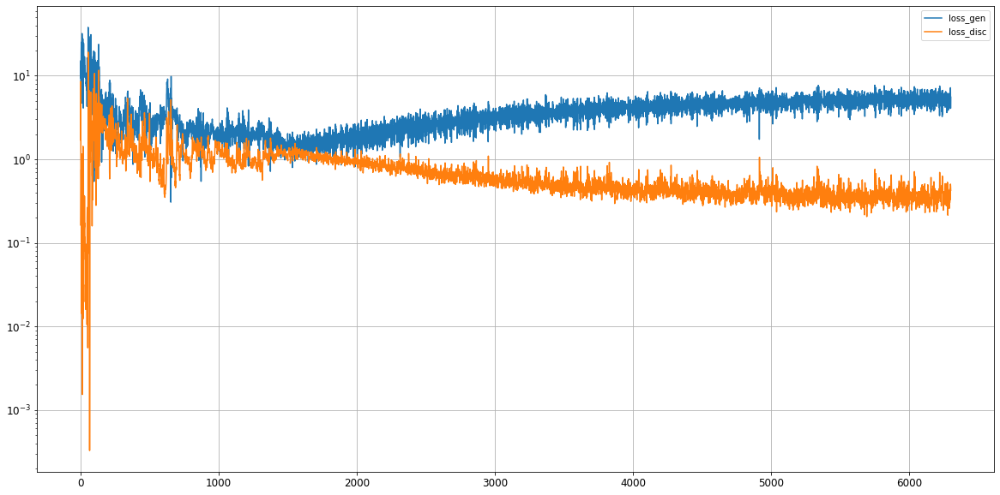

Epoch 6302/20000
0s
Epoch 6303/20000
0s
Epoch 6304/20000
0s
Epoch 6305/20000
0s
Epoch 6306/20000
0s
Epoch 6307/20000
0s
Epoch 6308/20000
0s
Epoch 6309/20000
0s
Epoch 6310/20000
0s
Epoch 6311/20000
0s
Epoch 6312/20000
0s
Epoch 6313/20000
0s
Epoch 6314/20000
0s
Epoch 6315/20000
0s
Epoch 6316/20000
0s
Epoch 6317/20000
0s
Epoch 6318/20000
0s
Epoch 6319/20000
0s
Epoch 6320/20000
0s
Epoch 6321/20000
0s
Epoch 6322/20000
0s
Epoch 6323/20000
0s
Epoch 6324/20000
0s
Epoch 6325/20000
0s
Epoch 6326/20000
0s
Epoch 6327/20000
0s
Epoch 6328/20000
0s
Epoch 6329/20000
0s
Epoch 6330/20000
0s
Epoch 6331/20000
0s
Epoch 6332/20000
0s
Epoch 6333/20000
0s
Epoch 6334/20000
0s
Epoch 6335/20000
0s
Epoch 6336/20000
0s
Epoch 6337/20000
0s
Epoch 6338/20000
0s
Epoch 6339/20000
0s
Epoch 6340/20000
0s
Epoch 6341/20000
0s
Epoch 6342/20000
0s
Epoch 6343/20000
0s
Epoch 6344/20000
0s
Epoch 6345/20000
0s
Epoch 6346/20000
0s
Epoch 6347/20000
0s
Epoch 6348/20000
0s
Epoch 6349/20000
0s
Epoch 6350/20000
0s
Epoch 6351/20000
0s


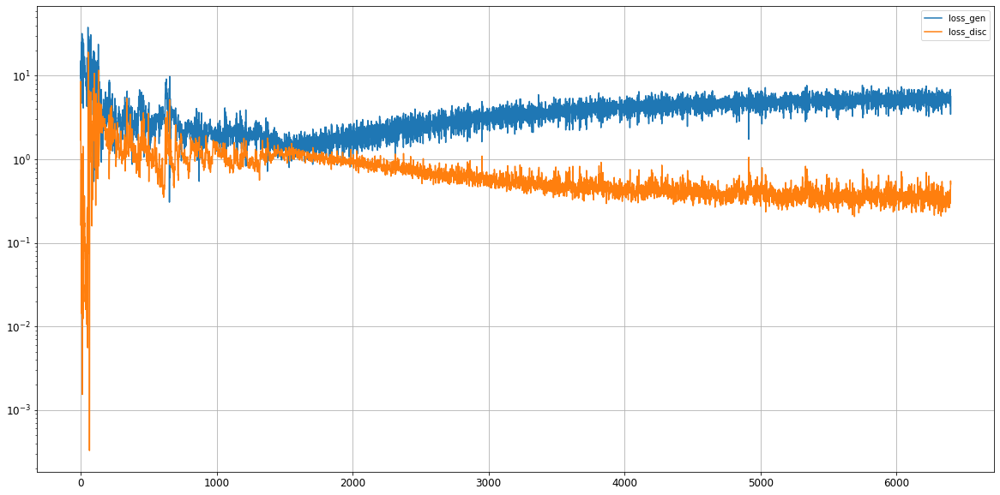

Epoch 6402/20000
0s
Epoch 6403/20000
0s
Epoch 6404/20000
0s
Epoch 6405/20000
0s
Epoch 6406/20000
0s
Epoch 6407/20000
0s
Epoch 6408/20000
0s
Epoch 6409/20000
0s
Epoch 6410/20000
0s
Epoch 6411/20000
0s
Epoch 6412/20000
0s
Epoch 6413/20000
0s
Epoch 6414/20000
0s
Epoch 6415/20000
0s
Epoch 6416/20000
0s
Epoch 6417/20000
0s
Epoch 6418/20000
0s
Epoch 6419/20000
0s
Epoch 6420/20000
0s
Epoch 6421/20000
0s
Epoch 6422/20000
0s
Epoch 6423/20000
0s
Epoch 6424/20000
0s
Epoch 6425/20000
0s
Epoch 6426/20000
0s
Epoch 6427/20000
0s
Epoch 6428/20000
0s
Epoch 6429/20000
0s
Epoch 6430/20000
0s
Epoch 6431/20000
0s
Epoch 6432/20000
0s
Epoch 6433/20000
0s
Epoch 6434/20000
0s
Epoch 6435/20000
0s
Epoch 6436/20000
0s
Epoch 6437/20000
0s
Epoch 6438/20000
0s
Epoch 6439/20000
0s
Epoch 6440/20000
0s
Epoch 6441/20000
0s
Epoch 6442/20000
0s
Epoch 6443/20000
0s
Epoch 6444/20000
0s
Epoch 6445/20000
0s
Epoch 6446/20000
0s
Epoch 6447/20000
0s
Epoch 6448/20000
0s
Epoch 6449/20000
0s
Epoch 6450/20000
0s
Epoch 6451/20000
0s


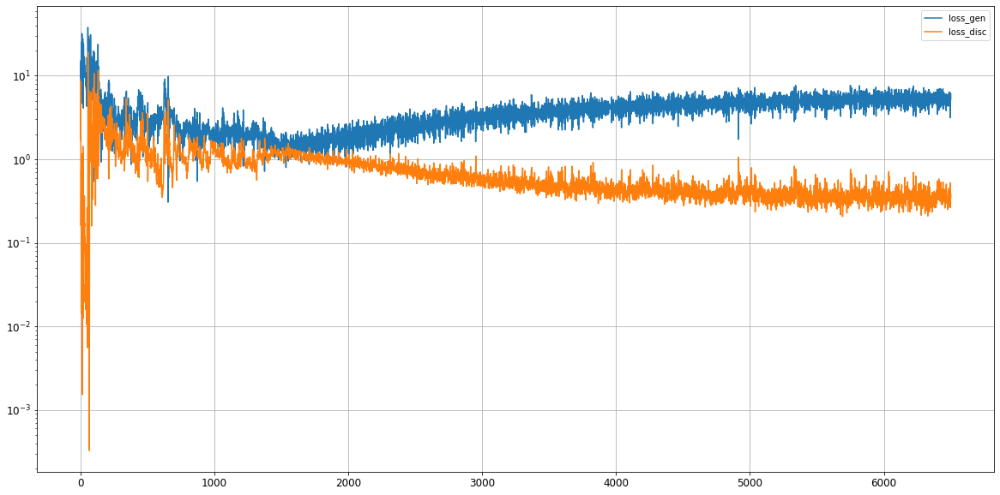

Epoch 6502/20000
0s
Epoch 6503/20000
0s
Epoch 6504/20000
0s
Epoch 6505/20000
0s
Epoch 6506/20000
0s
Epoch 6507/20000
0s
Epoch 6508/20000
0s
Epoch 6509/20000
0s
Epoch 6510/20000
0s
Epoch 6511/20000
0s
Epoch 6512/20000
0s
Epoch 6513/20000
0s
Epoch 6514/20000
0s
Epoch 6515/20000
0s
Epoch 6516/20000
0s
Epoch 6517/20000
0s
Epoch 6518/20000
0s
Epoch 6519/20000
0s
Epoch 6520/20000
0s
Epoch 6521/20000
0s
Epoch 6522/20000
0s
Epoch 6523/20000
0s
Epoch 6524/20000
0s
Epoch 6525/20000
0s
Epoch 6526/20000
0s
Epoch 6527/20000
0s
Epoch 6528/20000
0s
Epoch 6529/20000
0s
Epoch 6530/20000
0s
Epoch 6531/20000
0s
Epoch 6532/20000
0s
Epoch 6533/20000
0s
Epoch 6534/20000
0s
Epoch 6535/20000
0s
Epoch 6536/20000
0s
Epoch 6537/20000
0s
Epoch 6538/20000
0s
Epoch 6539/20000
0s
Epoch 6540/20000
0s
Epoch 6541/20000
0s
Epoch 6542/20000
0s
Epoch 6543/20000
0s
Epoch 6544/20000
0s
Epoch 6545/20000
0s
Epoch 6546/20000
0s
Epoch 6547/20000
0s
Epoch 6548/20000
0s
Epoch 6549/20000
0s
Epoch 6550/20000
0s
Epoch 6551/20000
0s


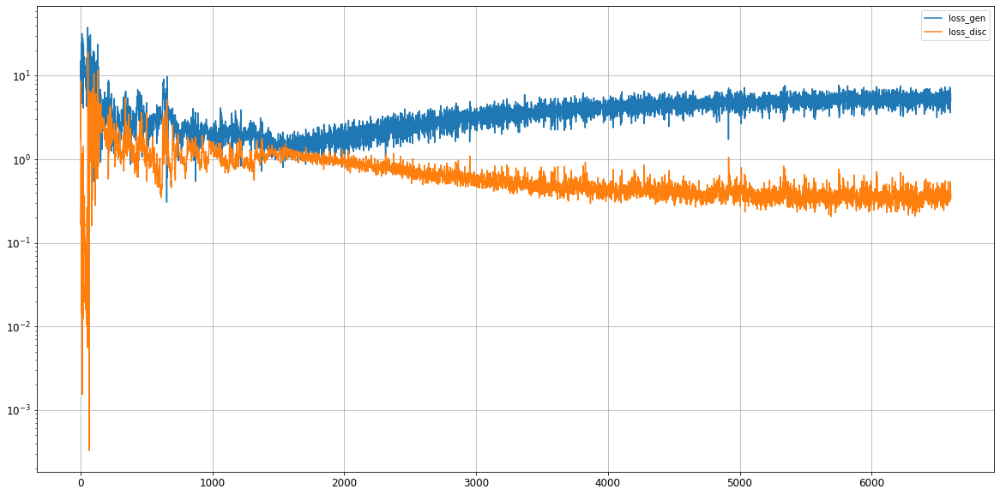

Epoch 6602/20000
0s
Epoch 6603/20000
0s
Epoch 6604/20000
0s
Epoch 6605/20000
0s
Epoch 6606/20000
0s
Epoch 6607/20000
0s
Epoch 6608/20000
0s
Epoch 6609/20000
0s
Epoch 6610/20000
0s
Epoch 6611/20000
0s
Epoch 6612/20000
0s
Epoch 6613/20000
0s
Epoch 6614/20000
0s
Epoch 6615/20000
0s
Epoch 6616/20000
0s
Epoch 6617/20000
0s
Epoch 6618/20000
0s
Epoch 6619/20000
0s
Epoch 6620/20000
0s
Epoch 6621/20000
0s
Epoch 6622/20000
0s
Epoch 6623/20000
0s
Epoch 6624/20000
0s
Epoch 6625/20000
0s
Epoch 6626/20000
0s
Epoch 6627/20000
0s
Epoch 6628/20000
0s
Epoch 6629/20000
0s
Epoch 6630/20000
0s
Epoch 6631/20000
0s
Epoch 6632/20000
0s
Epoch 6633/20000
0s
Epoch 6634/20000
0s
Epoch 6635/20000
0s
Epoch 6636/20000
0s
Epoch 6637/20000
0s
Epoch 6638/20000
0s
Epoch 6639/20000
0s
Epoch 6640/20000
0s
Epoch 6641/20000
0s
Epoch 6642/20000
0s
Epoch 6643/20000
0s
Epoch 6644/20000
0s
Epoch 6645/20000
0s
Epoch 6646/20000
0s
Epoch 6647/20000
0s
Epoch 6648/20000
0s
Epoch 6649/20000
0s
Epoch 6650/20000
0s
Epoch 6651/20000
0s


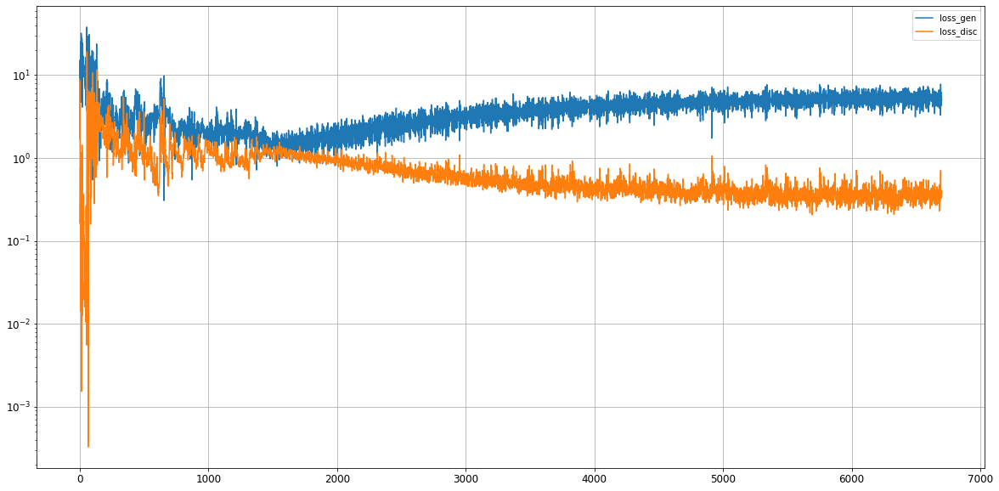

Epoch 6702/20000
0s
Epoch 6703/20000
0s
Epoch 6704/20000
0s
Epoch 6705/20000
0s
Epoch 6706/20000
0s
Epoch 6707/20000
0s
Epoch 6708/20000
0s
Epoch 6709/20000
0s
Epoch 6710/20000
0s
Epoch 6711/20000
0s
Epoch 6712/20000
0s
Epoch 6713/20000
0s
Epoch 6714/20000
0s
Epoch 6715/20000
0s
Epoch 6716/20000
0s
Epoch 6717/20000
0s
Epoch 6718/20000
0s
Epoch 6719/20000
0s
Epoch 6720/20000
0s
Epoch 6721/20000
0s
Epoch 6722/20000
0s
Epoch 6723/20000
0s
Epoch 6724/20000
0s
Epoch 6725/20000
0s
Epoch 6726/20000
0s
Epoch 6727/20000
0s
Epoch 6728/20000
0s
Epoch 6729/20000
0s
Epoch 6730/20000
0s
Epoch 6731/20000
0s
Epoch 6732/20000
0s
Epoch 6733/20000
0s
Epoch 6734/20000
0s
Epoch 6735/20000
0s
Epoch 6736/20000
0s
Epoch 6737/20000
0s
Epoch 6738/20000
0s
Epoch 6739/20000
0s
Epoch 6740/20000
0s
Epoch 6741/20000
0s
Epoch 6742/20000
0s
Epoch 6743/20000
0s
Epoch 6744/20000
0s
Epoch 6745/20000
0s
Epoch 6746/20000
0s
Epoch 6747/20000
0s
Epoch 6748/20000
0s
Epoch 6749/20000
0s
Epoch 6750/20000
0s
Epoch 6751/20000
0s


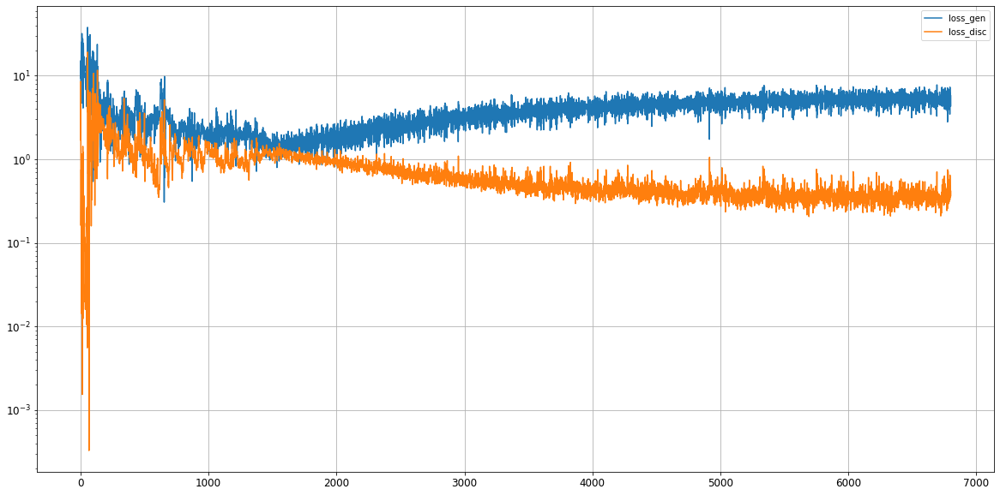

Epoch 6802/20000
0s
Epoch 6803/20000
0s
Epoch 6804/20000
0s
Epoch 6805/20000
0s
Epoch 6806/20000
0s
Epoch 6807/20000
0s
Epoch 6808/20000
0s
Epoch 6809/20000
0s
Epoch 6810/20000
0s
Epoch 6811/20000
0s
Epoch 6812/20000
0s
Epoch 6813/20000
0s
Epoch 6814/20000
0s
Epoch 6815/20000
0s
Epoch 6816/20000
0s
Epoch 6817/20000
0s
Epoch 6818/20000
0s
Epoch 6819/20000
0s
Epoch 6820/20000
0s
Epoch 6821/20000
0s
Epoch 6822/20000
0s
Epoch 6823/20000
0s
Epoch 6824/20000
0s
Epoch 6825/20000
0s
Epoch 6826/20000
0s
Epoch 6827/20000
0s
Epoch 6828/20000
0s
Epoch 6829/20000
0s
Epoch 6830/20000
0s
Epoch 6831/20000
0s
Epoch 6832/20000
0s
Epoch 6833/20000
0s
Epoch 6834/20000
0s
Epoch 6835/20000
0s
Epoch 6836/20000
0s
Epoch 6837/20000
0s
Epoch 6838/20000
0s
Epoch 6839/20000
0s
Epoch 6840/20000
0s
Epoch 6841/20000
0s
Epoch 6842/20000
0s
Epoch 6843/20000
0s
Epoch 6844/20000
0s
Epoch 6845/20000
0s
Epoch 6846/20000
0s
Epoch 6847/20000
0s
Epoch 6848/20000
0s
Epoch 6849/20000
0s
Epoch 6850/20000
0s
Epoch 6851/20000
0s


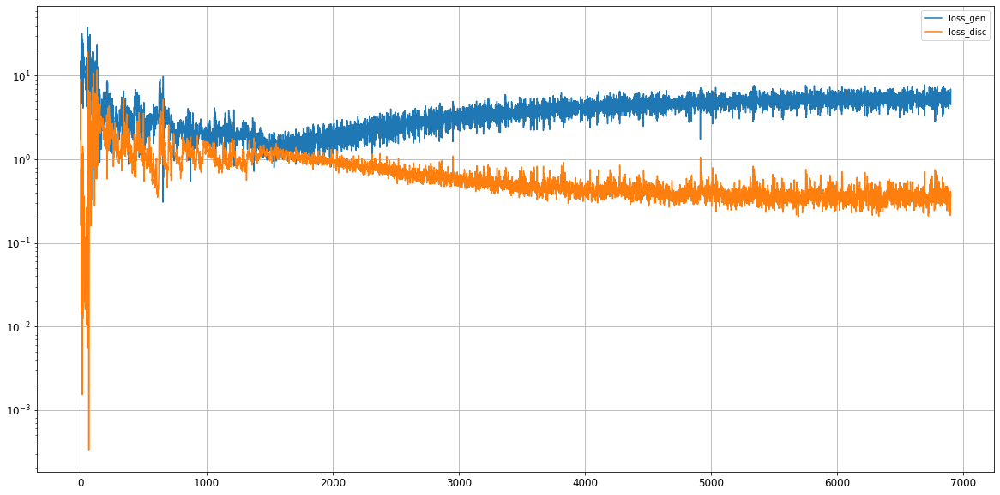

Epoch 6902/20000
0s
Epoch 6903/20000
0s
Epoch 6904/20000
0s
Epoch 6905/20000
0s
Epoch 6906/20000
0s
Epoch 6907/20000
0s
Epoch 6908/20000
0s
Epoch 6909/20000
0s
Epoch 6910/20000
0s
Epoch 6911/20000
0s
Epoch 6912/20000
0s
Epoch 6913/20000
0s
Epoch 6914/20000
0s
Epoch 6915/20000
0s
Epoch 6916/20000
0s
Epoch 6917/20000
0s
Epoch 6918/20000
0s
Epoch 6919/20000
0s
Epoch 6920/20000
0s
Epoch 6921/20000
0s
Epoch 6922/20000
0s
Epoch 6923/20000
0s
Epoch 6924/20000
0s
Epoch 6925/20000
0s
Epoch 6926/20000
0s
Epoch 6927/20000
0s
Epoch 6928/20000
0s
Epoch 6929/20000
0s
Epoch 6930/20000
0s
Epoch 6931/20000
0s
Epoch 6932/20000
0s
Epoch 6933/20000
0s
Epoch 6934/20000
0s
Epoch 6935/20000
0s
Epoch 6936/20000
0s
Epoch 6937/20000
0s
Epoch 6938/20000
0s
Epoch 6939/20000
0s
Epoch 6940/20000
0s
Epoch 6941/20000
0s
Epoch 6942/20000
0s
Epoch 6943/20000
0s
Epoch 6944/20000
0s
Epoch 6945/20000
0s
Epoch 6946/20000
0s
Epoch 6947/20000
0s
Epoch 6948/20000
0s
Epoch 6949/20000
0s
Epoch 6950/20000
0s
Epoch 6951/20000
0s


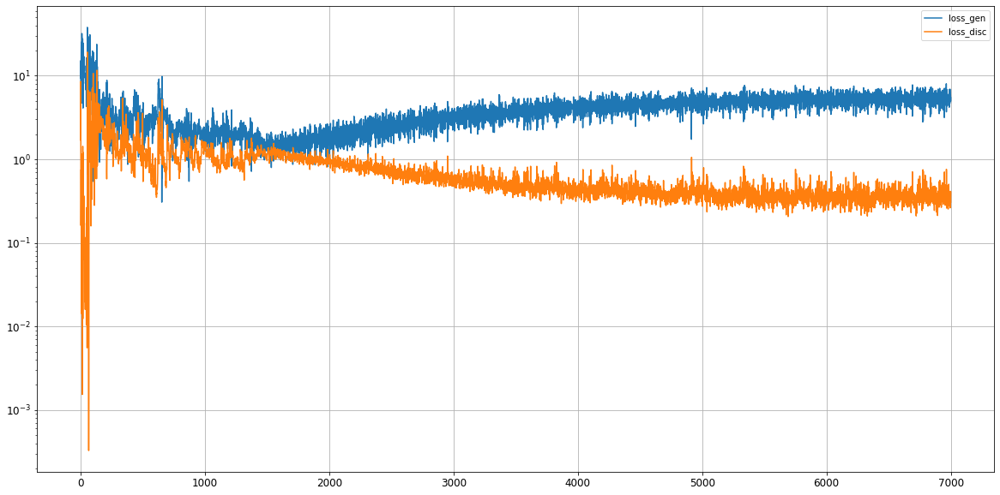

Epoch 7002/20000
0s
Epoch 7003/20000
0s
Epoch 7004/20000
0s
Epoch 7005/20000
0s
Epoch 7006/20000
0s
Epoch 7007/20000
0s
Epoch 7008/20000
0s
Epoch 7009/20000
0s
Epoch 7010/20000
0s
Epoch 7011/20000
0s
Epoch 7012/20000
0s
Epoch 7013/20000
0s
Epoch 7014/20000
0s
Epoch 7015/20000
0s
Epoch 7016/20000
0s
Epoch 7017/20000
0s
Epoch 7018/20000
0s
Epoch 7019/20000
0s
Epoch 7020/20000
0s
Epoch 7021/20000
0s
Epoch 7022/20000
0s
Epoch 7023/20000
0s
Epoch 7024/20000
0s
Epoch 7025/20000
0s
Epoch 7026/20000
0s
Epoch 7027/20000
0s
Epoch 7028/20000
0s
Epoch 7029/20000
0s
Epoch 7030/20000
0s
Epoch 7031/20000
0s
Epoch 7032/20000
0s
Epoch 7033/20000
0s
Epoch 7034/20000
0s
Epoch 7035/20000
0s
Epoch 7036/20000
0s
Epoch 7037/20000
0s
Epoch 7038/20000
0s
Epoch 7039/20000
0s
Epoch 7040/20000
0s
Epoch 7041/20000
0s
Epoch 7042/20000
0s
Epoch 7043/20000
0s
Epoch 7044/20000
0s
Epoch 7045/20000
0s
Epoch 7046/20000
0s
Epoch 7047/20000
0s
Epoch 7048/20000
0s
Epoch 7049/20000
0s
Epoch 7050/20000
0s
Epoch 7051/20000
0s


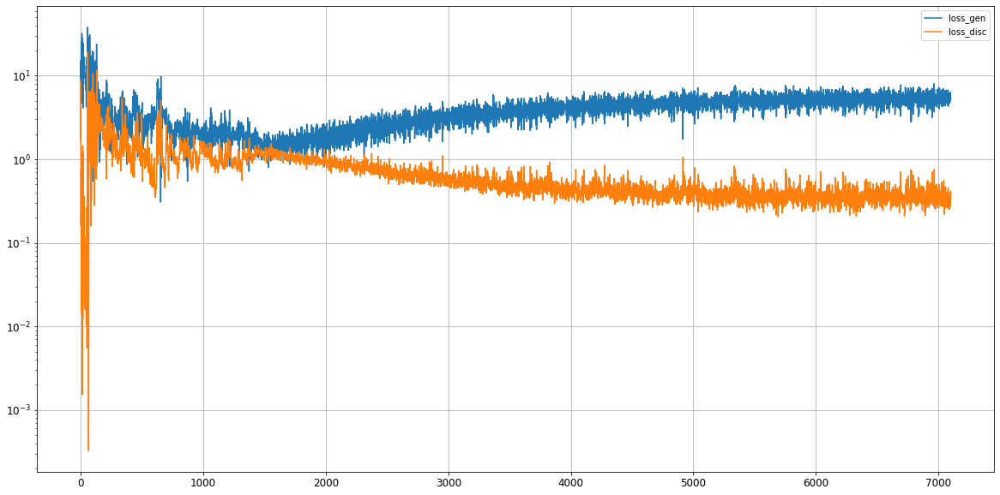

Epoch 7102/20000
0s
Epoch 7103/20000
0s
Epoch 7104/20000
0s
Epoch 7105/20000
0s
Epoch 7106/20000
0s
Epoch 7107/20000
0s
Epoch 7108/20000
0s
Epoch 7109/20000
0s
Epoch 7110/20000
0s
Epoch 7111/20000
0s
Epoch 7112/20000
0s
Epoch 7113/20000
0s
Epoch 7114/20000
0s
Epoch 7115/20000
0s
Epoch 7116/20000
0s
Epoch 7117/20000
0s
Epoch 7118/20000
0s
Epoch 7119/20000
0s
Epoch 7120/20000
0s
Epoch 7121/20000
0s
Epoch 7122/20000
0s
Epoch 7123/20000
0s
Epoch 7124/20000
0s
Epoch 7125/20000
0s
Epoch 7126/20000
0s
Epoch 7127/20000
0s
Epoch 7128/20000
0s
Epoch 7129/20000
0s
Epoch 7130/20000
0s
Epoch 7131/20000
0s
Epoch 7132/20000
0s
Epoch 7133/20000
0s
Epoch 7134/20000
0s
Epoch 7135/20000
0s
Epoch 7136/20000
0s
Epoch 7137/20000
0s
Epoch 7138/20000
0s
Epoch 7139/20000
0s
Epoch 7140/20000
0s
Epoch 7141/20000
0s
Epoch 7142/20000
0s
Epoch 7143/20000
0s
Epoch 7144/20000
0s
Epoch 7145/20000
0s
Epoch 7146/20000
0s
Epoch 7147/20000
0s
Epoch 7148/20000
0s
Epoch 7149/20000
0s
Epoch 7150/20000
0s
Epoch 7151/20000
0s


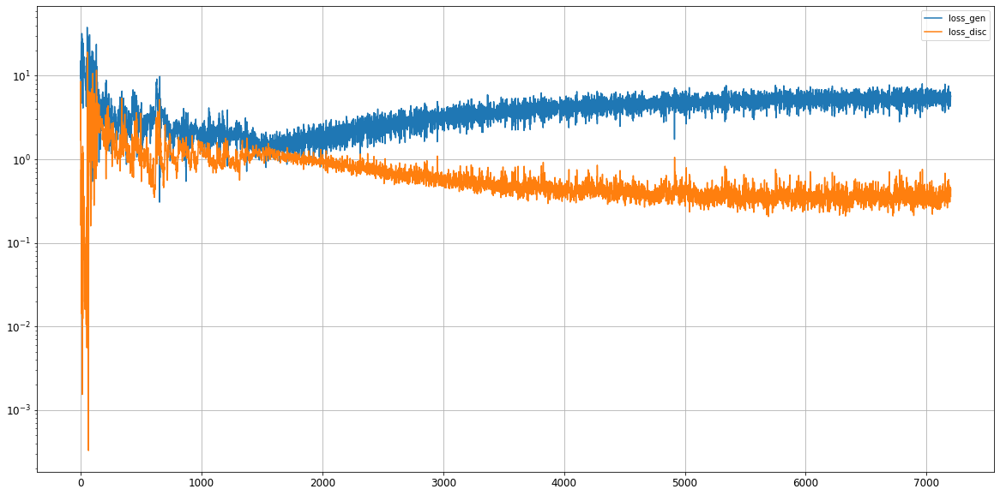

Epoch 7202/20000
0s
Epoch 7203/20000
0s
Epoch 7204/20000
0s
Epoch 7205/20000
0s
Epoch 7206/20000
0s
Epoch 7207/20000
0s
Epoch 7208/20000
0s
Epoch 7209/20000
0s
Epoch 7210/20000
0s
Epoch 7211/20000
0s
Epoch 7212/20000
0s
Epoch 7213/20000
0s
Epoch 7214/20000
0s
Epoch 7215/20000
0s
Epoch 7216/20000
0s
Epoch 7217/20000
0s
Epoch 7218/20000
0s
Epoch 7219/20000
0s
Epoch 7220/20000
0s
Epoch 7221/20000
0s
Epoch 7222/20000
0s
Epoch 7223/20000
0s
Epoch 7224/20000
0s
Epoch 7225/20000
0s
Epoch 7226/20000
0s
Epoch 7227/20000
0s
Epoch 7228/20000
0s
Epoch 7229/20000
0s
Epoch 7230/20000
0s
Epoch 7231/20000
0s
Epoch 7232/20000
0s
Epoch 7233/20000
0s
Epoch 7234/20000
0s
Epoch 7235/20000
0s
Epoch 7236/20000
0s
Epoch 7237/20000
0s
Epoch 7238/20000
0s
Epoch 7239/20000
0s
Epoch 7240/20000
0s
Epoch 7241/20000
0s
Epoch 7242/20000
0s
Epoch 7243/20000
0s
Epoch 7244/20000
0s
Epoch 7245/20000
0s
Epoch 7246/20000
0s
Epoch 7247/20000
0s
Epoch 7248/20000
0s
Epoch 7249/20000
0s
Epoch 7250/20000
0s
Epoch 7251/20000
0s


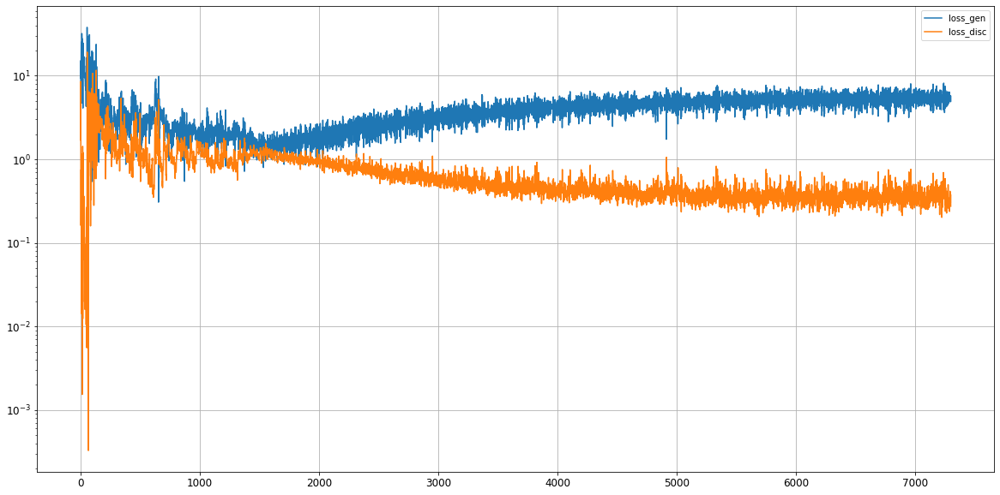

Epoch 7302/20000
0s
Epoch 7303/20000
0s
Epoch 7304/20000
0s
Epoch 7305/20000
0s
Epoch 7306/20000
0s
Epoch 7307/20000
0s
Epoch 7308/20000
0s
Epoch 7309/20000
0s
Epoch 7310/20000
0s
Epoch 7311/20000
0s
Epoch 7312/20000
0s
Epoch 7313/20000
0s
Epoch 7314/20000
0s
Epoch 7315/20000
0s
Epoch 7316/20000
0s
Epoch 7317/20000
0s
Epoch 7318/20000
0s
Epoch 7319/20000
0s
Epoch 7320/20000
0s
Epoch 7321/20000
0s
Epoch 7322/20000
0s
Epoch 7323/20000
0s
Epoch 7324/20000
0s
Epoch 7325/20000
0s
Epoch 7326/20000
0s
Epoch 7327/20000
0s
Epoch 7328/20000
0s
Epoch 7329/20000
0s
Epoch 7330/20000
0s
Epoch 7331/20000
0s
Epoch 7332/20000
0s
Epoch 7333/20000
0s
Epoch 7334/20000
0s
Epoch 7335/20000
0s
Epoch 7336/20000
0s
Epoch 7337/20000
0s
Epoch 7338/20000
0s
Epoch 7339/20000
0s
Epoch 7340/20000
0s
Epoch 7341/20000
0s
Epoch 7342/20000
0s
Epoch 7343/20000
0s
Epoch 7344/20000
0s
Epoch 7345/20000
0s
Epoch 7346/20000
0s
Epoch 7347/20000
0s
Epoch 7348/20000
0s
Epoch 7349/20000
0s
Epoch 7350/20000
0s
Epoch 7351/20000
0s


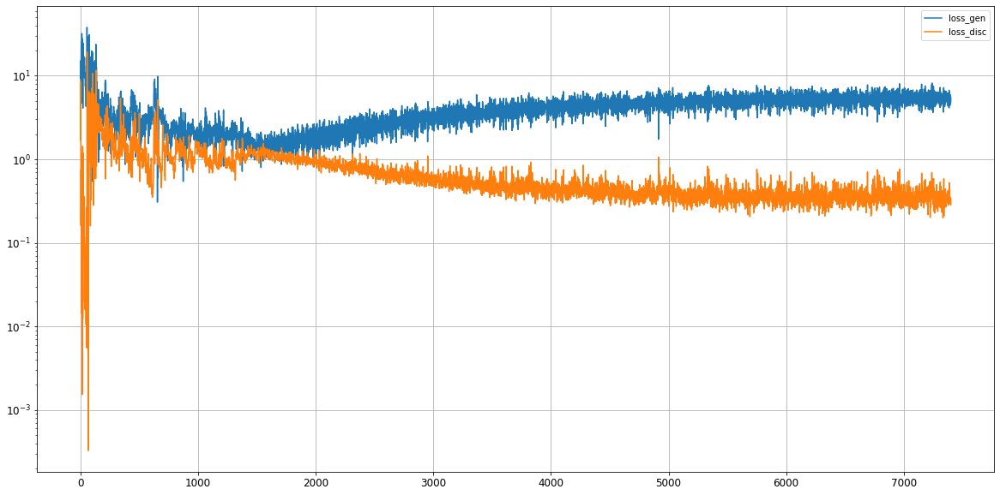

Epoch 7402/20000
0s
Epoch 7403/20000
0s
Epoch 7404/20000
0s
Epoch 7405/20000
0s
Epoch 7406/20000
0s
Epoch 7407/20000
0s
Epoch 7408/20000
0s
Epoch 7409/20000
0s
Epoch 7410/20000
0s
Epoch 7411/20000
0s
Epoch 7412/20000
0s
Epoch 7413/20000
0s
Epoch 7414/20000
0s
Epoch 7415/20000
0s
Epoch 7416/20000
0s
Epoch 7417/20000
0s
Epoch 7418/20000
0s
Epoch 7419/20000
0s
Epoch 7420/20000
0s
Epoch 7421/20000
0s
Epoch 7422/20000
0s
Epoch 7423/20000
0s
Epoch 7424/20000
0s
Epoch 7425/20000
0s
Epoch 7426/20000
0s
Epoch 7427/20000
0s
Epoch 7428/20000
0s
Epoch 7429/20000
0s
Epoch 7430/20000
0s
Epoch 7431/20000
0s
Epoch 7432/20000
0s
Epoch 7433/20000
0s
Epoch 7434/20000
0s
Epoch 7435/20000
0s
Epoch 7436/20000
0s
Epoch 7437/20000
0s
Epoch 7438/20000
0s
Epoch 7439/20000
0s
Epoch 7440/20000
0s
Epoch 7441/20000
0s
Epoch 7442/20000
0s
Epoch 7443/20000
0s
Epoch 7444/20000
0s
Epoch 7445/20000
0s
Epoch 7446/20000
0s
Epoch 7447/20000
0s
Epoch 7448/20000
0s
Epoch 7449/20000
0s
Epoch 7450/20000
0s
Epoch 7451/20000
0s


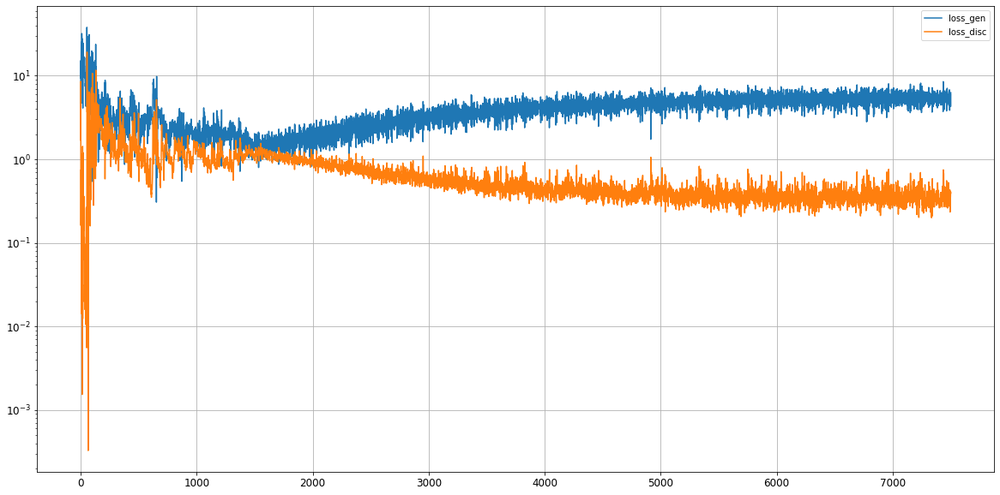

Epoch 7502/20000
0s
Epoch 7503/20000
0s
Epoch 7504/20000
0s
Epoch 7505/20000
0s
Epoch 7506/20000
0s
Epoch 7507/20000
0s
Epoch 7508/20000
0s
Epoch 7509/20000
0s
Epoch 7510/20000
0s
Epoch 7511/20000
0s
Epoch 7512/20000
0s
Epoch 7513/20000
0s
Epoch 7514/20000
0s
Epoch 7515/20000
0s
Epoch 7516/20000
0s
Epoch 7517/20000
0s
Epoch 7518/20000
0s
Epoch 7519/20000
0s
Epoch 7520/20000
0s
Epoch 7521/20000
0s
Epoch 7522/20000
0s
Epoch 7523/20000
0s
Epoch 7524/20000
0s
Epoch 7525/20000
0s
Epoch 7526/20000
0s
Epoch 7527/20000
0s
Epoch 7528/20000
0s
Epoch 7529/20000
0s
Epoch 7530/20000
0s
Epoch 7531/20000
0s
Epoch 7532/20000
0s
Epoch 7533/20000
0s
Epoch 7534/20000
0s
Epoch 7535/20000
0s
Epoch 7536/20000
0s
Epoch 7537/20000
0s
Epoch 7538/20000
0s
Epoch 7539/20000
0s
Epoch 7540/20000
0s
Epoch 7541/20000
0s
Epoch 7542/20000
0s
Epoch 7543/20000
0s
Epoch 7544/20000
0s
Epoch 7545/20000
0s
Epoch 7546/20000
0s
Epoch 7547/20000
0s
Epoch 7548/20000
0s
Epoch 7549/20000
0s
Epoch 7550/20000
0s
Epoch 7551/20000
0s


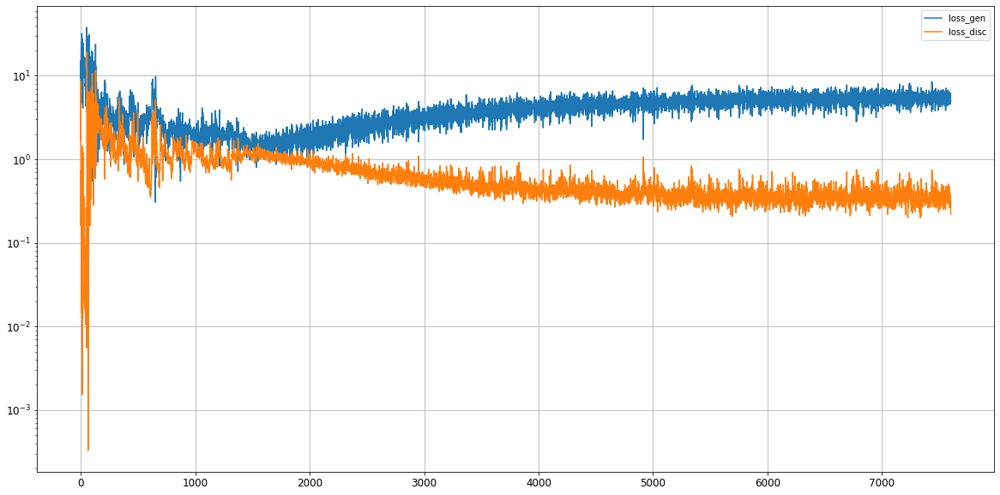

Epoch 7602/20000
0s
Epoch 7603/20000
0s
Epoch 7604/20000
0s
Epoch 7605/20000
0s
Epoch 7606/20000
0s
Epoch 7607/20000
0s
Epoch 7608/20000
0s
Epoch 7609/20000
0s
Epoch 7610/20000
0s
Epoch 7611/20000
0s
Epoch 7612/20000
0s
Epoch 7613/20000
0s
Epoch 7614/20000
0s
Epoch 7615/20000
0s
Epoch 7616/20000
0s
Epoch 7617/20000
0s
Epoch 7618/20000
0s
Epoch 7619/20000
0s
Epoch 7620/20000
0s
Epoch 7621/20000
0s
Epoch 7622/20000
0s
Epoch 7623/20000
0s
Epoch 7624/20000
0s
Epoch 7625/20000
0s
Epoch 7626/20000
0s
Epoch 7627/20000
0s
Epoch 7628/20000
0s
Epoch 7629/20000
0s
Epoch 7630/20000
0s
Epoch 7631/20000
0s
Epoch 7632/20000
0s
Epoch 7633/20000
0s
Epoch 7634/20000
0s
Epoch 7635/20000
0s
Epoch 7636/20000
0s
Epoch 7637/20000
0s
Epoch 7638/20000
0s
Epoch 7639/20000
0s
Epoch 7640/20000
0s
Epoch 7641/20000
0s
Epoch 7642/20000
0s
Epoch 7643/20000
0s
Epoch 7644/20000
0s
Epoch 7645/20000
0s
Epoch 7646/20000
0s
Epoch 7647/20000
0s
Epoch 7648/20000
0s
Epoch 7649/20000
0s
Epoch 7650/20000
0s
Epoch 7651/20000
0s


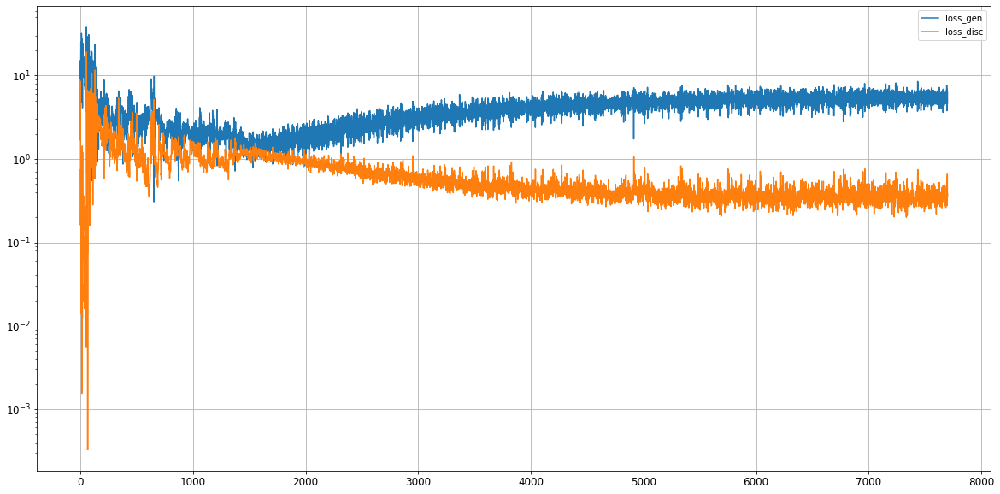

Epoch 7702/20000
0s
Epoch 7703/20000
0s
Epoch 7704/20000
0s
Epoch 7705/20000
0s
Epoch 7706/20000
0s
Epoch 7707/20000
0s
Epoch 7708/20000
0s
Epoch 7709/20000
0s
Epoch 7710/20000
0s
Epoch 7711/20000
0s
Epoch 7712/20000
0s
Epoch 7713/20000
0s
Epoch 7714/20000
0s
Epoch 7715/20000
0s
Epoch 7716/20000
0s
Epoch 7717/20000
0s
Epoch 7718/20000
0s
Epoch 7719/20000
0s
Epoch 7720/20000
0s
Epoch 7721/20000
0s
Epoch 7722/20000
0s
Epoch 7723/20000
0s
Epoch 7724/20000
0s
Epoch 7725/20000
0s
Epoch 7726/20000
0s
Epoch 7727/20000
0s
Epoch 7728/20000
0s
Epoch 7729/20000
0s
Epoch 7730/20000
0s
Epoch 7731/20000
0s
Epoch 7732/20000
0s
Epoch 7733/20000
0s
Epoch 7734/20000
0s
Epoch 7735/20000
0s
Epoch 7736/20000
0s
Epoch 7737/20000
0s
Epoch 7738/20000
0s
Epoch 7739/20000
0s
Epoch 7740/20000
0s
Epoch 7741/20000
0s
Epoch 7742/20000
0s
Epoch 7743/20000
0s
Epoch 7744/20000
0s
Epoch 7745/20000
0s
Epoch 7746/20000
0s
Epoch 7747/20000
0s
Epoch 7748/20000
0s
Epoch 7749/20000
0s
Epoch 7750/20000
0s
Epoch 7751/20000
0s


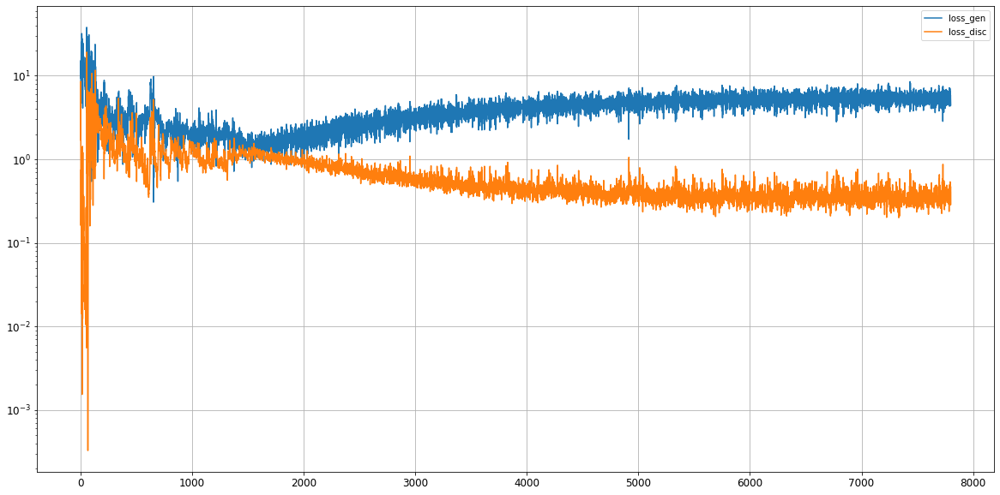

Epoch 7802/20000
0s
Epoch 7803/20000
0s
Epoch 7804/20000
0s
Epoch 7805/20000
0s
Epoch 7806/20000
0s
Epoch 7807/20000
0s
Epoch 7808/20000
0s
Epoch 7809/20000
0s
Epoch 7810/20000
0s
Epoch 7811/20000
0s
Epoch 7812/20000
0s
Epoch 7813/20000
0s
Epoch 7814/20000
0s
Epoch 7815/20000
0s
Epoch 7816/20000
0s
Epoch 7817/20000
0s
Epoch 7818/20000
0s
Epoch 7819/20000
0s
Epoch 7820/20000
0s
Epoch 7821/20000
0s
Epoch 7822/20000
0s
Epoch 7823/20000
0s
Epoch 7824/20000
0s
Epoch 7825/20000
0s
Epoch 7826/20000
0s
Epoch 7827/20000
0s
Epoch 7828/20000
0s
Epoch 7829/20000
0s
Epoch 7830/20000
0s
Epoch 7831/20000
0s
Epoch 7832/20000
0s
Epoch 7833/20000
0s
Epoch 7834/20000
0s
Epoch 7835/20000
0s
Epoch 7836/20000
0s
Epoch 7837/20000
0s
Epoch 7838/20000
0s
Epoch 7839/20000
0s
Epoch 7840/20000
0s
Epoch 7841/20000
0s
Epoch 7842/20000
0s
Epoch 7843/20000
0s
Epoch 7844/20000
0s
Epoch 7845/20000
0s
Epoch 7846/20000
0s
Epoch 7847/20000
0s
Epoch 7848/20000
0s
Epoch 7849/20000
0s
Epoch 7850/20000
0s
Epoch 7851/20000
0s


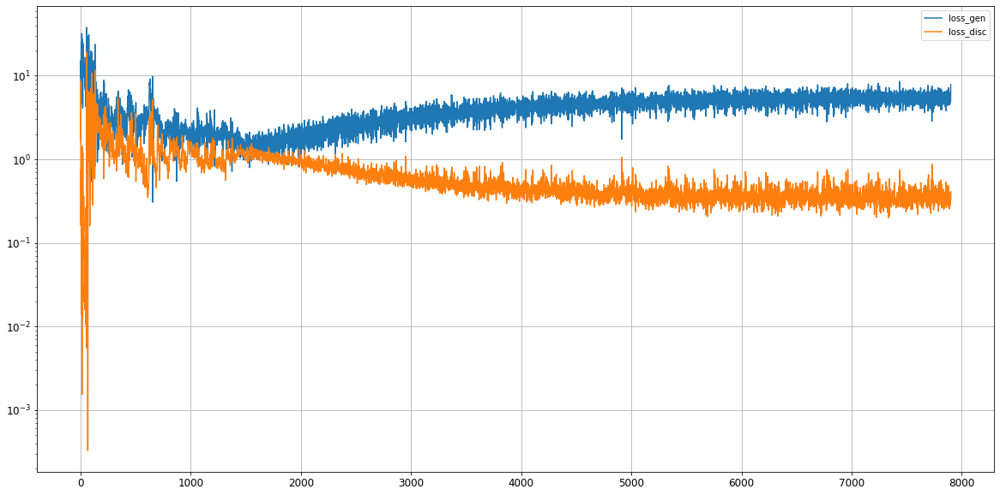

Epoch 7902/20000
0s
Epoch 7903/20000
0s
Epoch 7904/20000
0s
Epoch 7905/20000
0s
Epoch 7906/20000
0s
Epoch 7907/20000
0s
Epoch 7908/20000
0s
Epoch 7909/20000
0s
Epoch 7910/20000
0s
Epoch 7911/20000
0s
Epoch 7912/20000
0s
Epoch 7913/20000
0s
Epoch 7914/20000
0s
Epoch 7915/20000
0s
Epoch 7916/20000
0s
Epoch 7917/20000
0s
Epoch 7918/20000
0s
Epoch 7919/20000
0s
Epoch 7920/20000
0s
Epoch 7921/20000
0s
Epoch 7922/20000
0s
Epoch 7923/20000
0s
Epoch 7924/20000
0s
Epoch 7925/20000
0s
Epoch 7926/20000
0s
Epoch 7927/20000
0s
Epoch 7928/20000
0s
Epoch 7929/20000
0s
Epoch 7930/20000
0s
Epoch 7931/20000
0s
Epoch 7932/20000
0s
Epoch 7933/20000
0s
Epoch 7934/20000
0s
Epoch 7935/20000
0s
Epoch 7936/20000
0s
Epoch 7937/20000
0s
Epoch 7938/20000
0s
Epoch 7939/20000
0s
Epoch 7940/20000
0s
Epoch 7941/20000
0s
Epoch 7942/20000
0s
Epoch 7943/20000
0s
Epoch 7944/20000
0s
Epoch 7945/20000
0s
Epoch 7946/20000
0s
Epoch 7947/20000
0s
Epoch 7948/20000
0s
Epoch 7949/20000
0s
Epoch 7950/20000
0s
Epoch 7951/20000
0s


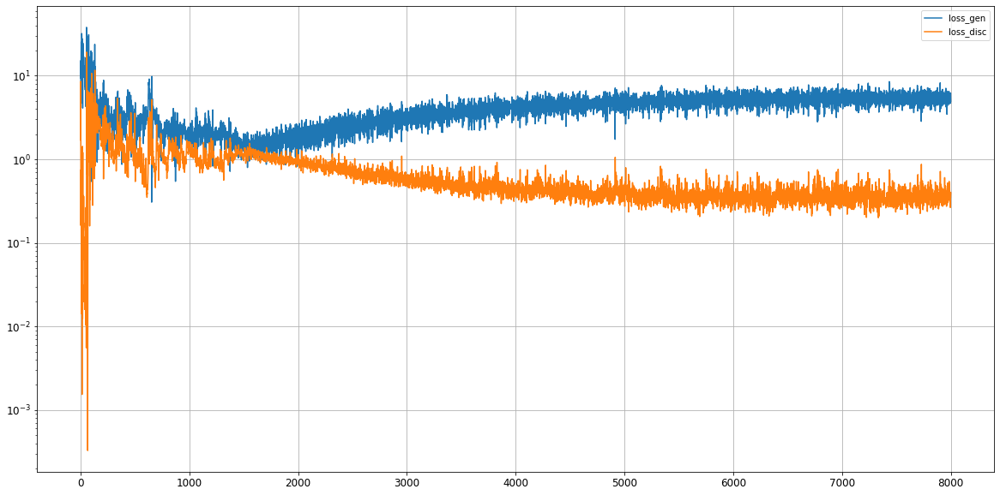

Epoch 8002/20000
0s
Epoch 8003/20000
0s
Epoch 8004/20000
0s
Epoch 8005/20000
0s
Epoch 8006/20000
0s
Epoch 8007/20000
0s
Epoch 8008/20000
0s
Epoch 8009/20000
0s
Epoch 8010/20000
0s
Epoch 8011/20000
0s
Epoch 8012/20000
0s
Epoch 8013/20000
0s
Epoch 8014/20000
0s
Epoch 8015/20000
0s
Epoch 8016/20000
0s
Epoch 8017/20000
0s
Epoch 8018/20000
0s
Epoch 8019/20000
0s
Epoch 8020/20000
0s
Epoch 8021/20000
0s
Epoch 8022/20000
0s
Epoch 8023/20000
0s
Epoch 8024/20000
0s
Epoch 8025/20000
0s
Epoch 8026/20000
0s
Epoch 8027/20000
0s
Epoch 8028/20000
0s
Epoch 8029/20000
0s
Epoch 8030/20000
0s
Epoch 8031/20000
0s
Epoch 8032/20000
0s
Epoch 8033/20000
0s
Epoch 8034/20000
0s
Epoch 8035/20000
0s
Epoch 8036/20000
0s
Epoch 8037/20000
0s
Epoch 8038/20000
0s
Epoch 8039/20000
0s
Epoch 8040/20000
0s
Epoch 8041/20000
0s
Epoch 8042/20000
0s
Epoch 8043/20000
0s
Epoch 8044/20000
0s
Epoch 8045/20000
0s
Epoch 8046/20000
0s
Epoch 8047/20000
0s
Epoch 8048/20000
0s
Epoch 8049/20000
0s
Epoch 8050/20000
0s
Epoch 8051/20000
0s


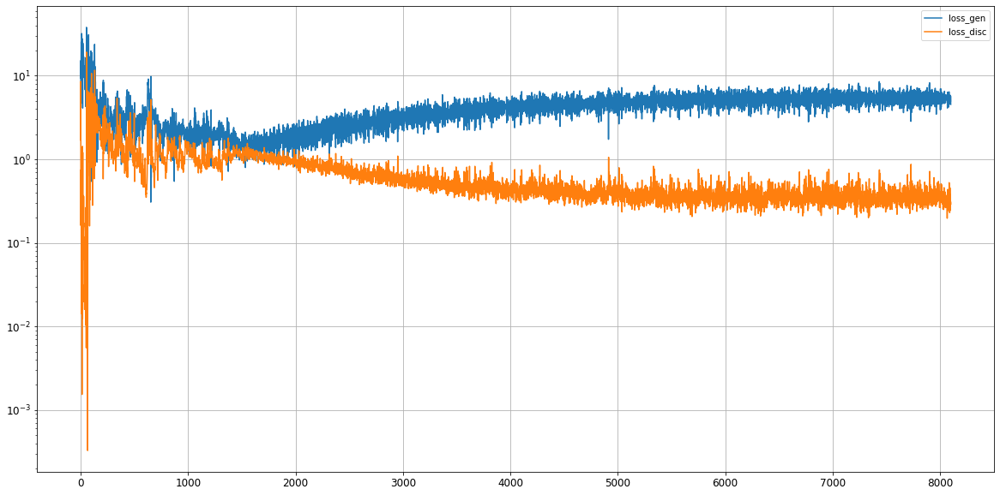

Epoch 8102/20000
0s
Epoch 8103/20000
0s
Epoch 8104/20000
0s
Epoch 8105/20000
0s
Epoch 8106/20000
0s
Epoch 8107/20000
0s
Epoch 8108/20000
0s
Epoch 8109/20000
0s
Epoch 8110/20000
0s
Epoch 8111/20000
0s
Epoch 8112/20000
0s
Epoch 8113/20000
0s
Epoch 8114/20000
0s
Epoch 8115/20000
0s
Epoch 8116/20000
0s
Epoch 8117/20000
0s
Epoch 8118/20000
0s
Epoch 8119/20000
0s
Epoch 8120/20000
0s
Epoch 8121/20000
0s
Epoch 8122/20000
0s
Epoch 8123/20000
0s
Epoch 8124/20000
0s
Epoch 8125/20000
0s
Epoch 8126/20000
0s
Epoch 8127/20000
0s
Epoch 8128/20000
0s
Epoch 8129/20000
0s
Epoch 8130/20000
0s
Epoch 8131/20000
0s
Epoch 8132/20000
0s
Epoch 8133/20000
0s
Epoch 8134/20000
0s
Epoch 8135/20000
0s
Epoch 8136/20000
0s
Epoch 8137/20000
0s
Epoch 8138/20000
0s
Epoch 8139/20000
0s
Epoch 8140/20000
0s
Epoch 8141/20000
0s
Epoch 8142/20000
0s
Epoch 8143/20000
0s
Epoch 8144/20000
0s
Epoch 8145/20000
0s
Epoch 8146/20000
0s
Epoch 8147/20000
0s
Epoch 8148/20000
0s
Epoch 8149/20000
0s
Epoch 8150/20000
0s
Epoch 8151/20000
0s


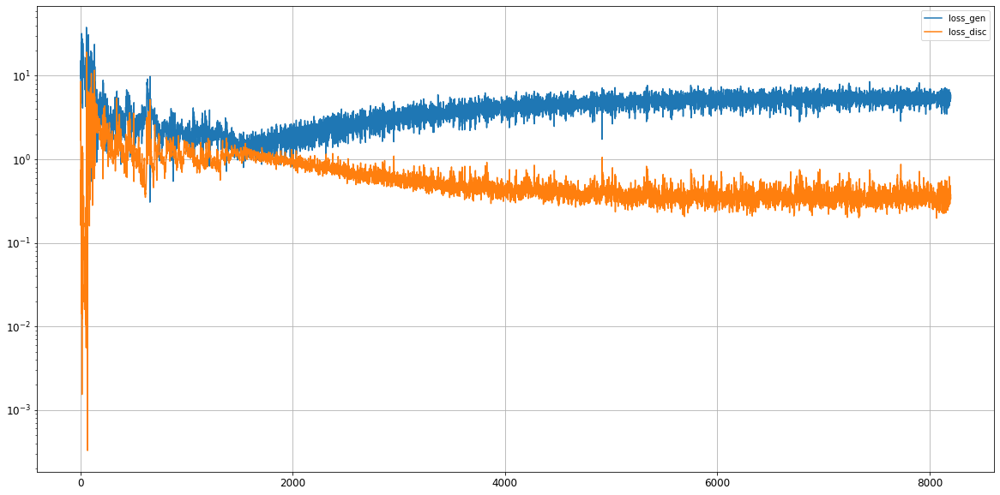

Epoch 8202/20000
0s
Epoch 8203/20000
0s
Epoch 8204/20000
0s
Epoch 8205/20000
0s
Epoch 8206/20000
0s
Epoch 8207/20000
0s
Epoch 8208/20000
0s
Epoch 8209/20000
0s
Epoch 8210/20000
0s
Epoch 8211/20000
0s
Epoch 8212/20000
0s
Epoch 8213/20000
0s
Epoch 8214/20000
0s
Epoch 8215/20000
0s
Epoch 8216/20000
0s
Epoch 8217/20000
0s
Epoch 8218/20000
0s
Epoch 8219/20000
0s
Epoch 8220/20000
0s
Epoch 8221/20000
0s
Epoch 8222/20000
0s
Epoch 8223/20000
0s
Epoch 8224/20000
0s
Epoch 8225/20000
0s
Epoch 8226/20000
0s
Epoch 8227/20000
0s
Epoch 8228/20000
0s
Epoch 8229/20000
0s
Epoch 8230/20000
0s
Epoch 8231/20000
0s
Epoch 8232/20000
0s
Epoch 8233/20000
0s
Epoch 8234/20000
0s
Epoch 8235/20000
0s
Epoch 8236/20000
0s
Epoch 8237/20000
0s
Epoch 8238/20000
0s
Epoch 8239/20000
0s
Epoch 8240/20000
0s
Epoch 8241/20000
0s
Epoch 8242/20000
0s
Epoch 8243/20000
0s
Epoch 8244/20000
0s
Epoch 8245/20000
0s
Epoch 8246/20000
0s
Epoch 8247/20000
0s
Epoch 8248/20000
0s
Epoch 8249/20000
0s
Epoch 8250/20000
0s
Epoch 8251/20000
0s


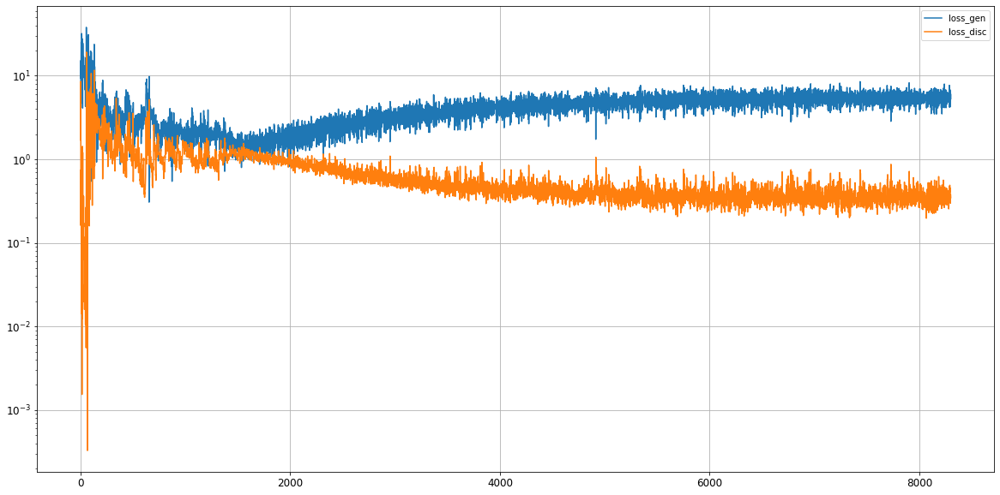

Epoch 8302/20000
0s
Epoch 8303/20000
0s
Epoch 8304/20000
0s
Epoch 8305/20000
0s
Epoch 8306/20000
0s
Epoch 8307/20000
0s
Epoch 8308/20000
0s
Epoch 8309/20000
0s
Epoch 8310/20000
0s
Epoch 8311/20000
0s
Epoch 8312/20000
0s
Epoch 8313/20000
0s
Epoch 8314/20000
0s
Epoch 8315/20000
0s
Epoch 8316/20000
0s
Epoch 8317/20000
0s
Epoch 8318/20000
0s
Epoch 8319/20000
0s
Epoch 8320/20000
0s
Epoch 8321/20000
0s
Epoch 8322/20000
0s
Epoch 8323/20000
0s
Epoch 8324/20000
0s
Epoch 8325/20000
0s
Epoch 8326/20000
0s
Epoch 8327/20000
0s
Epoch 8328/20000
0s
Epoch 8329/20000
0s
Epoch 8330/20000
0s
Epoch 8331/20000
0s
Epoch 8332/20000
0s
Epoch 8333/20000
0s
Epoch 8334/20000
0s
Epoch 8335/20000
0s
Epoch 8336/20000
0s
Epoch 8337/20000
0s
Epoch 8338/20000
0s
Epoch 8339/20000
0s
Epoch 8340/20000
0s
Epoch 8341/20000
0s
Epoch 8342/20000
0s
Epoch 8343/20000
0s
Epoch 8344/20000
0s
Epoch 8345/20000
0s
Epoch 8346/20000
0s
Epoch 8347/20000
0s
Epoch 8348/20000
0s
Epoch 8349/20000
0s
Epoch 8350/20000
0s
Epoch 8351/20000
0s


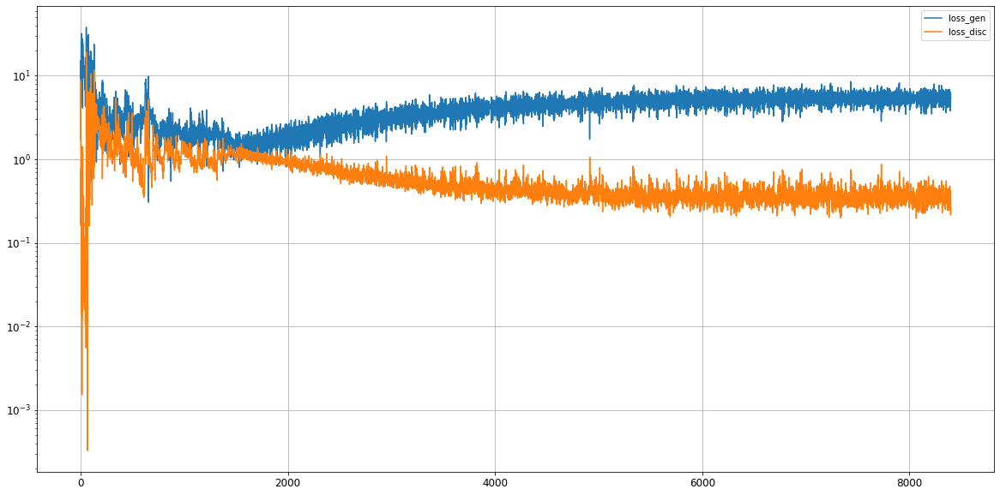

Epoch 8402/20000
0s
Epoch 8403/20000
0s
Epoch 8404/20000
0s
Epoch 8405/20000
0s
Epoch 8406/20000
0s
Epoch 8407/20000
0s
Epoch 8408/20000
0s
Epoch 8409/20000
0s
Epoch 8410/20000
0s
Epoch 8411/20000
0s
Epoch 8412/20000
0s
Epoch 8413/20000
0s
Epoch 8414/20000
0s
Epoch 8415/20000
0s
Epoch 8416/20000
0s
Epoch 8417/20000
0s
Epoch 8418/20000
0s
Epoch 8419/20000
0s
Epoch 8420/20000
0s
Epoch 8421/20000
0s
Epoch 8422/20000
0s
Epoch 8423/20000
0s
Epoch 8424/20000
0s
Epoch 8425/20000
0s
Epoch 8426/20000
0s
Epoch 8427/20000
0s
Epoch 8428/20000
0s
Epoch 8429/20000
0s
Epoch 8430/20000
0s
Epoch 8431/20000
0s
Epoch 8432/20000
0s
Epoch 8433/20000
0s
Epoch 8434/20000
0s
Epoch 8435/20000
0s
Epoch 8436/20000
0s
Epoch 8437/20000
0s
Epoch 8438/20000
0s
Epoch 8439/20000
0s
Epoch 8440/20000
0s
Epoch 8441/20000
0s
Epoch 8442/20000
0s
Epoch 8443/20000
0s
Epoch 8444/20000
0s
Epoch 8445/20000
0s
Epoch 8446/20000
0s
Epoch 8447/20000
0s
Epoch 8448/20000
0s
Epoch 8449/20000
0s
Epoch 8450/20000
0s
Epoch 8451/20000
0s


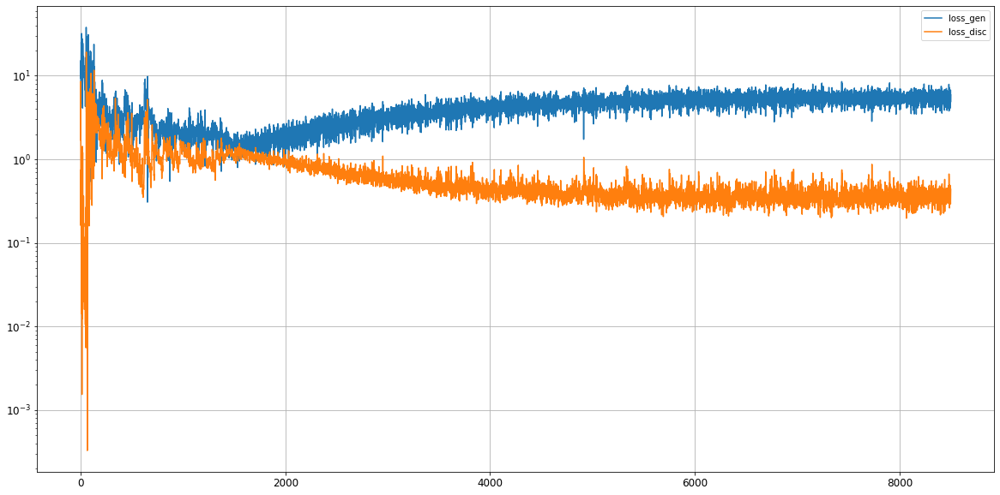

Epoch 8502/20000
0s
Epoch 8503/20000
0s
Epoch 8504/20000
0s
Epoch 8505/20000
0s
Epoch 8506/20000
0s
Epoch 8507/20000
0s
Epoch 8508/20000
0s
Epoch 8509/20000
0s
Epoch 8510/20000
0s
Epoch 8511/20000
0s
Epoch 8512/20000
0s
Epoch 8513/20000
0s
Epoch 8514/20000
0s
Epoch 8515/20000
0s
Epoch 8516/20000
0s
Epoch 8517/20000
0s
Epoch 8518/20000
0s
Epoch 8519/20000
0s
Epoch 8520/20000
0s
Epoch 8521/20000
0s
Epoch 8522/20000
0s
Epoch 8523/20000
0s
Epoch 8524/20000
0s
Epoch 8525/20000
0s
Epoch 8526/20000
0s
Epoch 8527/20000
0s
Epoch 8528/20000
0s
Epoch 8529/20000
0s
Epoch 8530/20000
0s
Epoch 8531/20000
0s
Epoch 8532/20000
0s
Epoch 8533/20000
0s
Epoch 8534/20000
0s
Epoch 8535/20000
0s
Epoch 8536/20000
0s
Epoch 8537/20000
0s
Epoch 8538/20000
0s
Epoch 8539/20000
0s
Epoch 8540/20000
0s
Epoch 8541/20000
0s
Epoch 8542/20000
0s
Epoch 8543/20000
0s
Epoch 8544/20000
0s
Epoch 8545/20000
0s
Epoch 8546/20000
0s
Epoch 8547/20000
0s
Epoch 8548/20000
0s
Epoch 8549/20000
0s
Epoch 8550/20000
0s
Epoch 8551/20000
0s


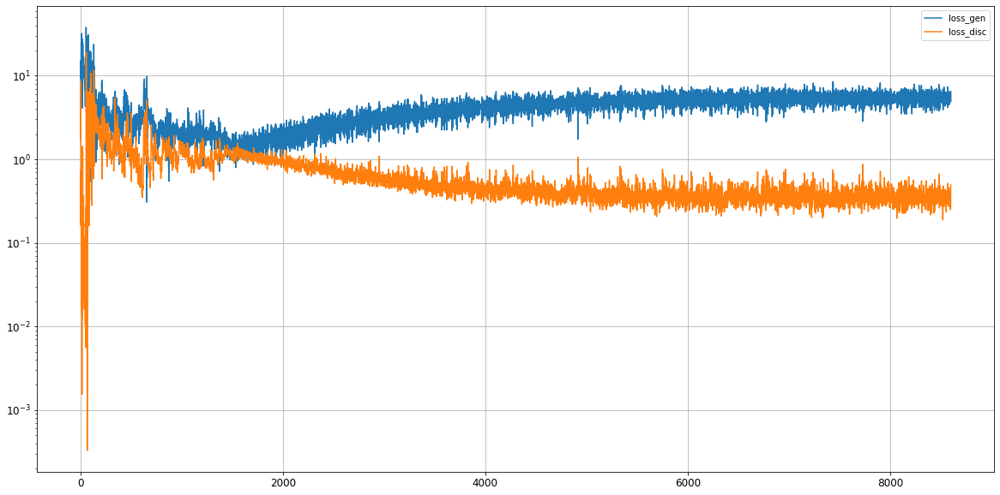

Epoch 8602/20000
0s
Epoch 8603/20000
0s
Epoch 8604/20000
0s
Epoch 8605/20000
0s
Epoch 8606/20000
0s
Epoch 8607/20000
0s
Epoch 8608/20000
0s
Epoch 8609/20000
0s
Epoch 8610/20000
0s
Epoch 8611/20000
0s
Epoch 8612/20000
0s
Epoch 8613/20000
0s
Epoch 8614/20000
0s
Epoch 8615/20000
0s
Epoch 8616/20000
0s
Epoch 8617/20000
0s
Epoch 8618/20000
0s
Epoch 8619/20000
0s
Epoch 8620/20000
0s
Epoch 8621/20000
0s
Epoch 8622/20000
0s
Epoch 8623/20000
0s
Epoch 8624/20000
0s
Epoch 8625/20000
0s
Epoch 8626/20000
0s
Epoch 8627/20000
0s
Epoch 8628/20000
0s
Epoch 8629/20000
0s
Epoch 8630/20000
0s
Epoch 8631/20000
0s
Epoch 8632/20000
0s
Epoch 8633/20000
0s
Epoch 8634/20000
0s
Epoch 8635/20000
0s
Epoch 8636/20000
0s
Epoch 8637/20000
0s
Epoch 8638/20000
0s
Epoch 8639/20000
0s
Epoch 8640/20000
0s
Epoch 8641/20000
0s
Epoch 8642/20000
0s
Epoch 8643/20000
0s
Epoch 8644/20000
0s
Epoch 8645/20000
0s
Epoch 8646/20000
0s
Epoch 8647/20000
0s
Epoch 8648/20000
0s
Epoch 8649/20000
0s
Epoch 8650/20000
0s
Epoch 8651/20000
0s


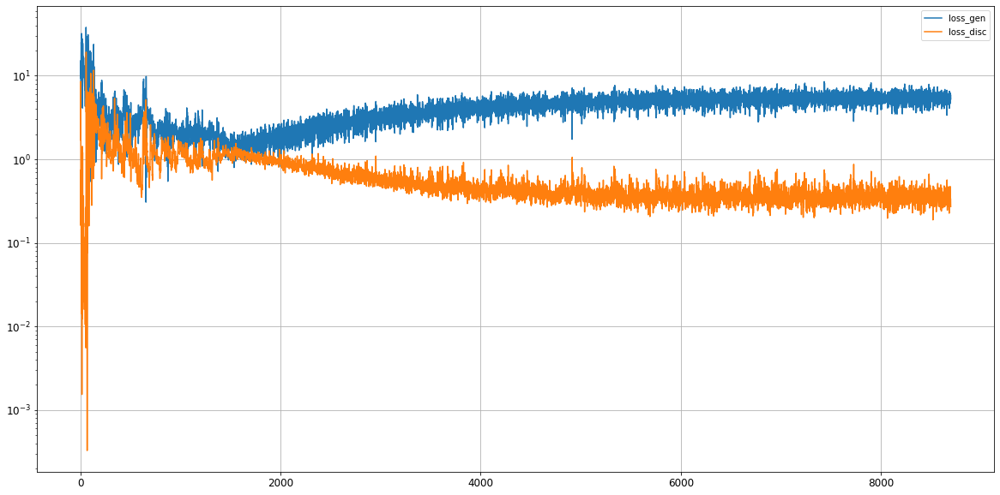

Epoch 8702/20000
0s
Epoch 8703/20000
0s
Epoch 8704/20000
0s
Epoch 8705/20000
0s
Epoch 8706/20000
0s
Epoch 8707/20000
0s
Epoch 8708/20000
0s
Epoch 8709/20000
0s
Epoch 8710/20000
0s
Epoch 8711/20000
0s
Epoch 8712/20000
0s
Epoch 8713/20000
0s
Epoch 8714/20000
0s
Epoch 8715/20000
0s
Epoch 8716/20000
0s
Epoch 8717/20000
0s
Epoch 8718/20000
0s
Epoch 8719/20000
0s
Epoch 8720/20000
0s
Epoch 8721/20000
0s
Epoch 8722/20000
0s
Epoch 8723/20000
0s
Epoch 8724/20000
0s
Epoch 8725/20000
0s
Epoch 8726/20000
0s
Epoch 8727/20000
0s
Epoch 8728/20000
0s
Epoch 8729/20000
0s
Epoch 8730/20000
0s
Epoch 8731/20000
0s
Epoch 8732/20000
0s
Epoch 8733/20000
0s
Epoch 8734/20000
0s
Epoch 8735/20000
0s
Epoch 8736/20000
0s
Epoch 8737/20000
0s
Epoch 8738/20000
0s
Epoch 8739/20000
0s
Epoch 8740/20000
0s
Epoch 8741/20000
0s
Epoch 8742/20000
0s
Epoch 8743/20000
0s
Epoch 8744/20000
0s
Epoch 8745/20000
0s
Epoch 8746/20000
0s
Epoch 8747/20000
0s
Epoch 8748/20000
0s
Epoch 8749/20000
0s
Epoch 8750/20000
0s
Epoch 8751/20000
0s


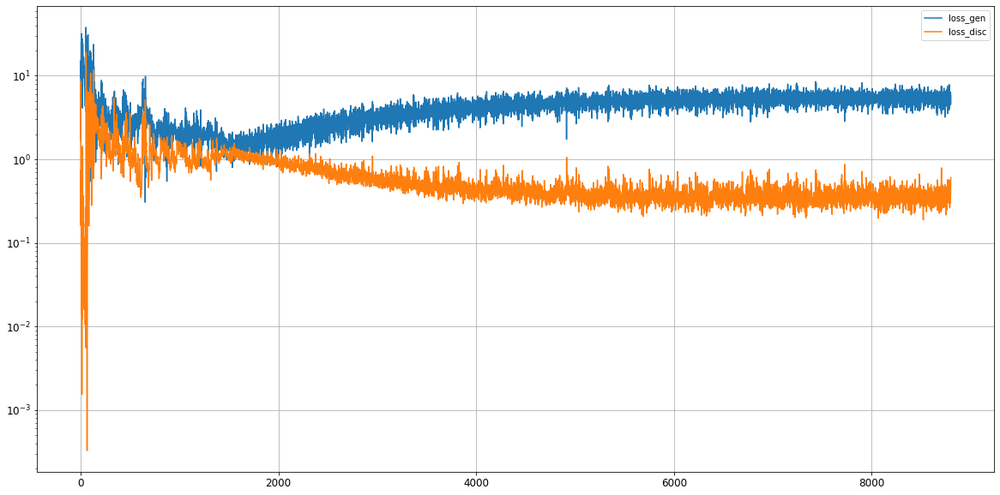

Epoch 8802/20000
0s
Epoch 8803/20000
0s
Epoch 8804/20000
0s
Epoch 8805/20000
0s
Epoch 8806/20000
0s
Epoch 8807/20000
0s
Epoch 8808/20000
0s
Epoch 8809/20000
0s
Epoch 8810/20000
0s
Epoch 8811/20000
0s
Epoch 8812/20000
0s
Epoch 8813/20000
0s
Epoch 8814/20000
0s
Epoch 8815/20000
0s
Epoch 8816/20000
0s
Epoch 8817/20000
0s
Epoch 8818/20000
0s
Epoch 8819/20000
0s
Epoch 8820/20000
0s
Epoch 8821/20000
0s
Epoch 8822/20000
0s
Epoch 8823/20000
0s
Epoch 8824/20000
0s
Epoch 8825/20000
0s
Epoch 8826/20000
0s
Epoch 8827/20000
0s
Epoch 8828/20000
0s
Epoch 8829/20000
0s
Epoch 8830/20000
0s
Epoch 8831/20000
0s
Epoch 8832/20000
0s
Epoch 8833/20000
0s
Epoch 8834/20000
0s
Epoch 8835/20000
0s
Epoch 8836/20000
0s
Epoch 8837/20000
0s
Epoch 8838/20000
0s
Epoch 8839/20000
0s
Epoch 8840/20000
0s
Epoch 8841/20000
0s
Epoch 8842/20000
0s
Epoch 8843/20000
0s
Epoch 8844/20000
0s
Epoch 8845/20000
0s
Epoch 8846/20000
0s
Epoch 8847/20000
0s
Epoch 8848/20000
0s
Epoch 8849/20000
0s
Epoch 8850/20000
0s
Epoch 8851/20000
0s


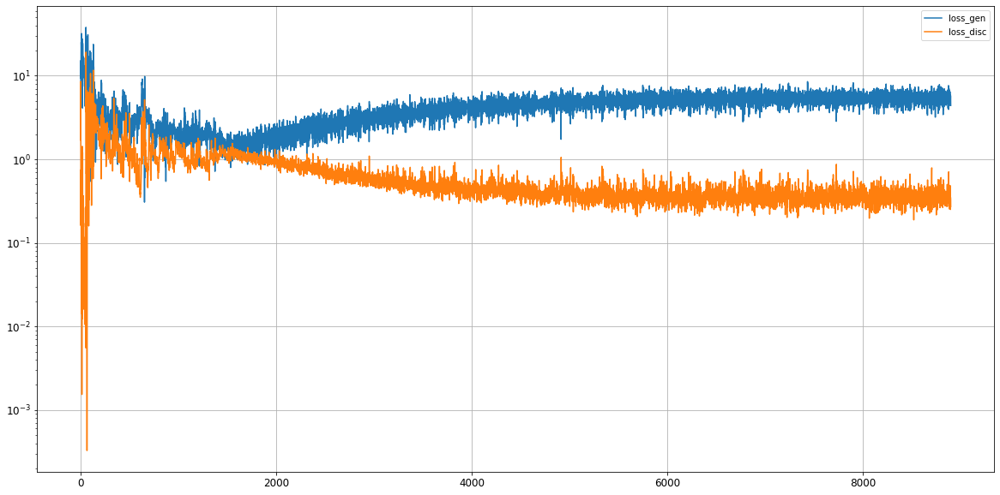

Epoch 8902/20000
0s
Epoch 8903/20000
0s
Epoch 8904/20000
0s
Epoch 8905/20000
0s
Epoch 8906/20000
0s
Epoch 8907/20000
0s
Epoch 8908/20000
0s
Epoch 8909/20000
0s
Epoch 8910/20000
0s
Epoch 8911/20000
0s
Epoch 8912/20000
0s
Epoch 8913/20000
0s
Epoch 8914/20000
0s
Epoch 8915/20000
0s
Epoch 8916/20000
0s
Epoch 8917/20000
0s
Epoch 8918/20000
0s
Epoch 8919/20000
0s
Epoch 8920/20000
0s
Epoch 8921/20000
0s
Epoch 8922/20000
0s
Epoch 8923/20000
0s
Epoch 8924/20000
0s
Epoch 8925/20000
0s
Epoch 8926/20000
0s
Epoch 8927/20000
0s
Epoch 8928/20000
0s
Epoch 8929/20000
0s
Epoch 8930/20000
0s
Epoch 8931/20000
0s
Epoch 8932/20000
0s
Epoch 8933/20000
0s
Epoch 8934/20000
0s
Epoch 8935/20000
0s
Epoch 8936/20000
0s
Epoch 8937/20000
0s
Epoch 8938/20000
0s
Epoch 8939/20000
0s
Epoch 8940/20000
0s
Epoch 8941/20000
0s
Epoch 8942/20000
0s
Epoch 8943/20000
0s
Epoch 8944/20000
0s
Epoch 8945/20000
0s
Epoch 8946/20000
0s
Epoch 8947/20000
0s
Epoch 8948/20000
0s
Epoch 8949/20000
0s
Epoch 8950/20000
0s
Epoch 8951/20000
0s


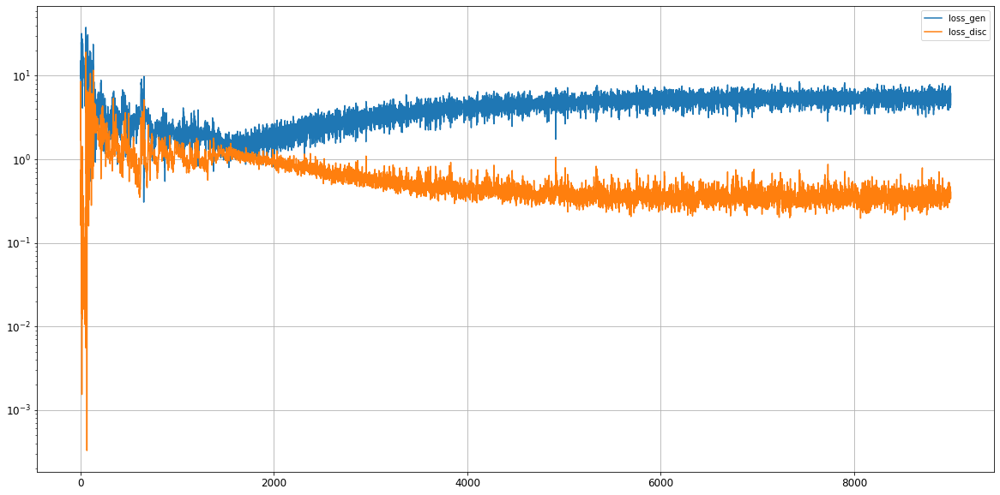

Epoch 9002/20000
0s
Epoch 9003/20000
0s
Epoch 9004/20000
0s
Epoch 9005/20000
0s
Epoch 9006/20000
0s
Epoch 9007/20000
0s
Epoch 9008/20000
0s
Epoch 9009/20000
0s
Epoch 9010/20000
0s
Epoch 9011/20000
0s
Epoch 9012/20000
0s
Epoch 9013/20000
0s
Epoch 9014/20000
0s
Epoch 9015/20000
0s
Epoch 9016/20000
0s
Epoch 9017/20000
0s
Epoch 9018/20000
0s
Epoch 9019/20000
0s
Epoch 9020/20000
0s
Epoch 9021/20000
0s
Epoch 9022/20000
0s
Epoch 9023/20000
0s
Epoch 9024/20000
0s
Epoch 9025/20000
0s
Epoch 9026/20000
0s
Epoch 9027/20000
0s
Epoch 9028/20000
0s
Epoch 9029/20000
0s
Epoch 9030/20000
0s
Epoch 9031/20000
0s
Epoch 9032/20000
0s
Epoch 9033/20000
0s
Epoch 9034/20000
0s
Epoch 9035/20000
0s
Epoch 9036/20000
0s
Epoch 9037/20000
0s
Epoch 9038/20000
0s
Epoch 9039/20000
0s
Epoch 9040/20000
0s
Epoch 9041/20000
0s
Epoch 9042/20000
0s
Epoch 9043/20000
0s
Epoch 9044/20000
0s
Epoch 9045/20000
0s
Epoch 9046/20000
0s
Epoch 9047/20000
0s
Epoch 9048/20000
0s
Epoch 9049/20000
0s
Epoch 9050/20000
0s
Epoch 9051/20000
0s


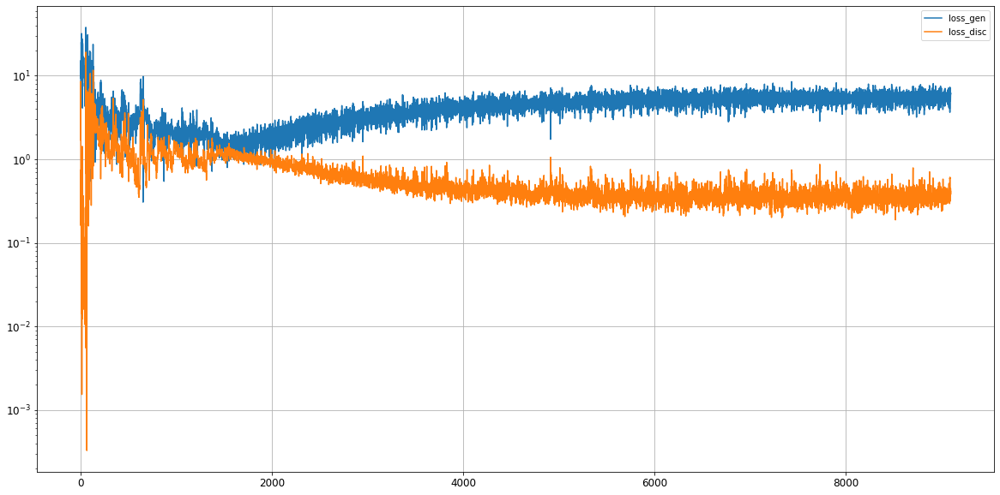

Epoch 9102/20000
0s
Epoch 9103/20000
0s
Epoch 9104/20000
0s
Epoch 9105/20000
0s
Epoch 9106/20000
0s
Epoch 9107/20000
0s
Epoch 9108/20000
0s
Epoch 9109/20000
0s
Epoch 9110/20000
0s
Epoch 9111/20000
0s
Epoch 9112/20000
0s
Epoch 9113/20000
0s
Epoch 9114/20000
0s
Epoch 9115/20000
0s
Epoch 9116/20000
0s
Epoch 9117/20000
0s
Epoch 9118/20000
0s
Epoch 9119/20000
0s
Epoch 9120/20000
0s
Epoch 9121/20000
0s
Epoch 9122/20000
0s
Epoch 9123/20000
0s
Epoch 9124/20000
0s
Epoch 9125/20000
0s
Epoch 9126/20000
0s
Epoch 9127/20000
0s
Epoch 9128/20000
0s
Epoch 9129/20000
0s
Epoch 9130/20000
0s
Epoch 9131/20000
0s
Epoch 9132/20000
0s
Epoch 9133/20000
0s
Epoch 9134/20000
0s
Epoch 9135/20000
0s
Epoch 9136/20000
0s
Epoch 9137/20000
0s
Epoch 9138/20000
0s
Epoch 9139/20000
0s
Epoch 9140/20000
0s
Epoch 9141/20000
0s
Epoch 9142/20000
0s
Epoch 9143/20000
0s
Epoch 9144/20000
0s
Epoch 9145/20000
0s
Epoch 9146/20000
0s
Epoch 9147/20000
0s
Epoch 9148/20000
0s
Epoch 9149/20000
0s
Epoch 9150/20000
0s
Epoch 9151/20000
0s


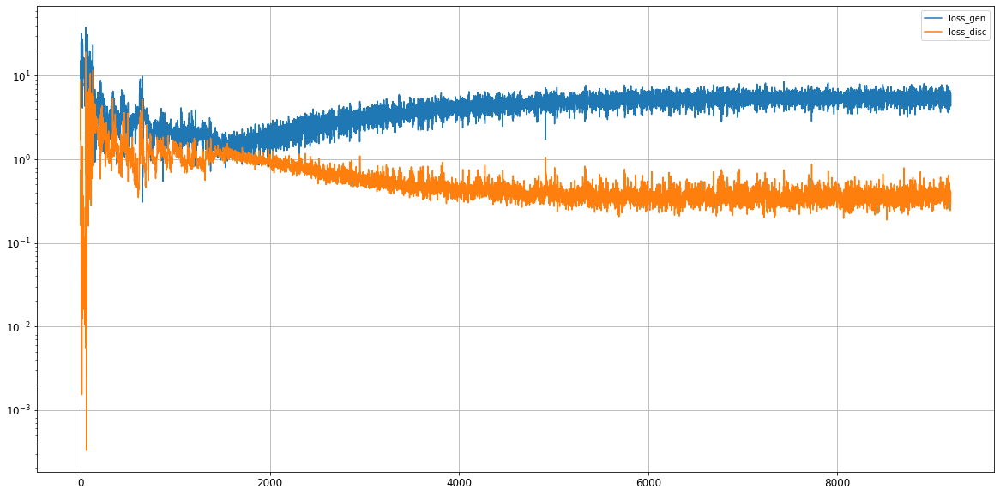

Epoch 9202/20000
0s
Epoch 9203/20000
0s
Epoch 9204/20000
0s
Epoch 9205/20000
0s
Epoch 9206/20000
0s
Epoch 9207/20000
0s
Epoch 9208/20000
0s
Epoch 9209/20000
0s
Epoch 9210/20000
0s
Epoch 9211/20000
0s
Epoch 9212/20000
0s
Epoch 9213/20000
0s
Epoch 9214/20000
0s
Epoch 9215/20000
0s
Epoch 9216/20000
0s
Epoch 9217/20000
0s
Epoch 9218/20000
0s
Epoch 9219/20000
0s
Epoch 9220/20000
0s
Epoch 9221/20000
0s
Epoch 9222/20000
0s
Epoch 9223/20000
0s
Epoch 9224/20000
0s
Epoch 9225/20000
0s
Epoch 9226/20000
0s
Epoch 9227/20000
0s
Epoch 9228/20000
0s
Epoch 9229/20000
0s
Epoch 9230/20000
0s
Epoch 9231/20000
0s
Epoch 9232/20000
0s
Epoch 9233/20000
0s
Epoch 9234/20000
0s
Epoch 9235/20000
0s
Epoch 9236/20000
0s
Epoch 9237/20000
0s
Epoch 9238/20000
0s
Epoch 9239/20000
0s
Epoch 9240/20000
0s
Epoch 9241/20000
0s
Epoch 9242/20000
0s
Epoch 9243/20000
0s
Epoch 9244/20000
0s
Epoch 9245/20000
0s
Epoch 9246/20000
0s
Epoch 9247/20000
0s
Epoch 9248/20000
0s
Epoch 9249/20000
0s
Epoch 9250/20000
0s
Epoch 9251/20000
0s


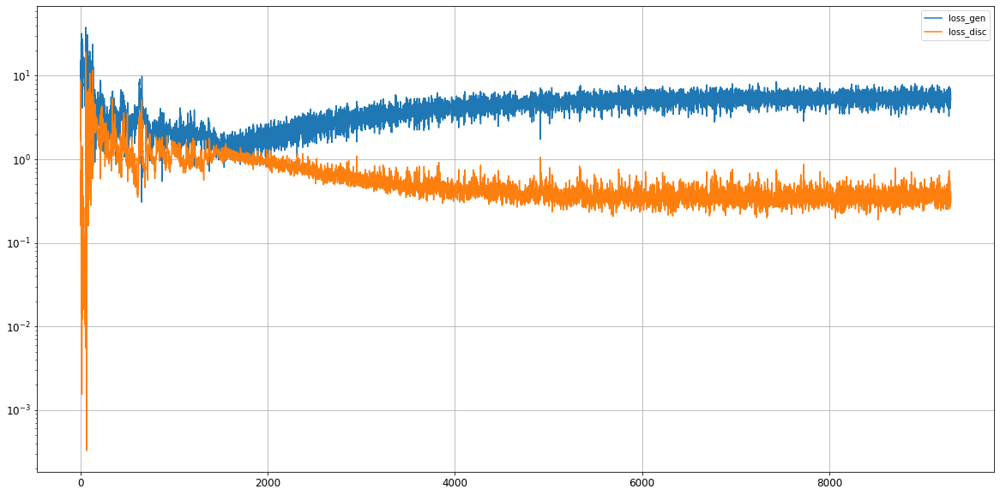

Epoch 9302/20000
0s
Epoch 9303/20000
0s
Epoch 9304/20000
0s
Epoch 9305/20000
0s
Epoch 9306/20000
0s
Epoch 9307/20000
0s
Epoch 9308/20000
0s
Epoch 9309/20000
0s
Epoch 9310/20000
0s
Epoch 9311/20000
0s
Epoch 9312/20000
0s
Epoch 9313/20000
0s
Epoch 9314/20000
0s
Epoch 9315/20000
0s
Epoch 9316/20000
0s
Epoch 9317/20000
0s
Epoch 9318/20000
0s
Epoch 9319/20000
0s
Epoch 9320/20000
0s
Epoch 9321/20000
0s
Epoch 9322/20000
0s
Epoch 9323/20000
0s
Epoch 9324/20000
0s
Epoch 9325/20000
0s
Epoch 9326/20000
0s
Epoch 9327/20000
0s
Epoch 9328/20000
0s
Epoch 9329/20000
0s
Epoch 9330/20000
0s
Epoch 9331/20000
0s
Epoch 9332/20000
0s
Epoch 9333/20000
0s
Epoch 9334/20000
0s
Epoch 9335/20000
0s
Epoch 9336/20000
0s
Epoch 9337/20000
0s
Epoch 9338/20000
0s
Epoch 9339/20000
0s
Epoch 9340/20000
0s
Epoch 9341/20000
0s
Epoch 9342/20000
0s
Epoch 9343/20000
0s
Epoch 9344/20000
0s
Epoch 9345/20000
0s
Epoch 9346/20000
0s
Epoch 9347/20000
0s
Epoch 9348/20000
0s
Epoch 9349/20000
0s
Epoch 9350/20000
0s
Epoch 9351/20000
0s


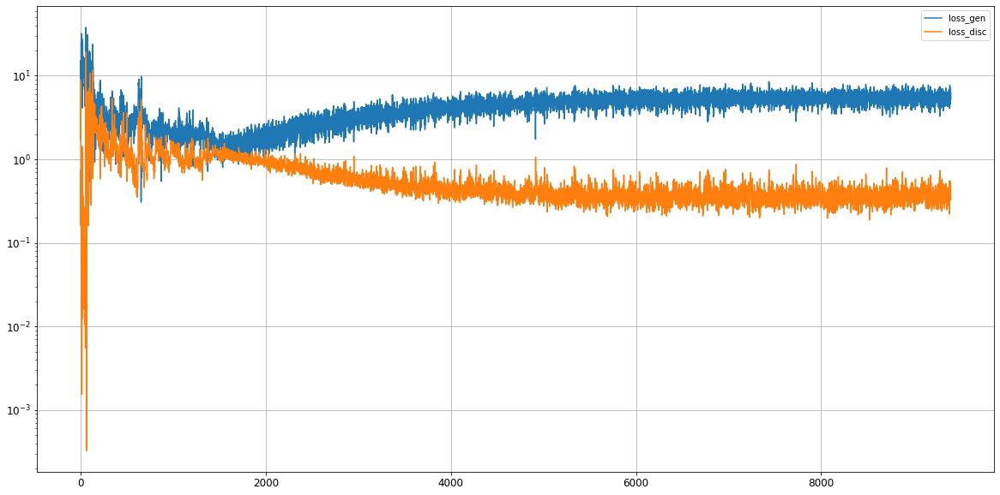

Epoch 9402/20000
0s
Epoch 9403/20000
0s
Epoch 9404/20000
0s
Epoch 9405/20000
0s
Epoch 9406/20000
0s
Epoch 9407/20000
0s
Epoch 9408/20000
0s
Epoch 9409/20000
0s
Epoch 9410/20000
0s
Epoch 9411/20000
0s
Epoch 9412/20000
0s
Epoch 9413/20000
0s
Epoch 9414/20000
0s
Epoch 9415/20000
0s
Epoch 9416/20000
0s
Epoch 9417/20000
0s
Epoch 9418/20000
0s
Epoch 9419/20000
0s
Epoch 9420/20000
0s
Epoch 9421/20000
0s
Epoch 9422/20000
0s
Epoch 9423/20000
0s
Epoch 9424/20000
0s
Epoch 9425/20000
0s
Epoch 9426/20000
0s
Epoch 9427/20000
0s
Epoch 9428/20000
0s
Epoch 9429/20000
0s
Epoch 9430/20000
0s
Epoch 9431/20000
0s
Epoch 9432/20000
0s
Epoch 9433/20000
0s
Epoch 9434/20000
0s
Epoch 9435/20000
0s
Epoch 9436/20000
0s
Epoch 9437/20000
0s
Epoch 9438/20000
0s
Epoch 9439/20000
0s
Epoch 9440/20000
0s
Epoch 9441/20000
0s
Epoch 9442/20000
0s
Epoch 9443/20000
0s
Epoch 9444/20000
0s
Epoch 9445/20000
0s
Epoch 9446/20000
0s
Epoch 9447/20000
0s
Epoch 9448/20000
0s
Epoch 9449/20000
0s
Epoch 9450/20000
0s
Epoch 9451/20000
0s


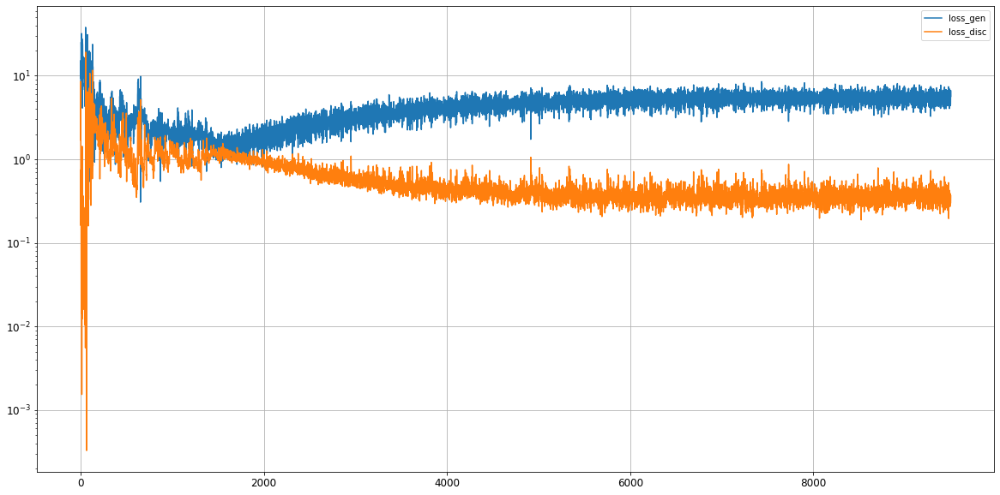

Epoch 9502/20000
0s
Epoch 9503/20000
0s
Epoch 9504/20000
0s
Epoch 9505/20000
0s
Epoch 9506/20000
0s
Epoch 9507/20000
0s
Epoch 9508/20000
0s
Epoch 9509/20000
0s
Epoch 9510/20000
0s
Epoch 9511/20000
0s
Epoch 9512/20000
0s
Epoch 9513/20000
0s
Epoch 9514/20000
0s
Epoch 9515/20000
0s
Epoch 9516/20000
0s
Epoch 9517/20000
0s
Epoch 9518/20000
0s
Epoch 9519/20000
0s
Epoch 9520/20000
0s
Epoch 9521/20000
0s
Epoch 9522/20000
0s
Epoch 9523/20000
0s
Epoch 9524/20000
0s
Epoch 9525/20000
0s
Epoch 9526/20000
0s
Epoch 9527/20000
0s
Epoch 9528/20000
0s
Epoch 9529/20000
0s
Epoch 9530/20000
0s
Epoch 9531/20000
0s
Epoch 9532/20000
0s
Epoch 9533/20000
0s
Epoch 9534/20000
0s
Epoch 9535/20000
0s
Epoch 9536/20000
0s
Epoch 9537/20000
0s
Epoch 9538/20000
0s
Epoch 9539/20000
0s
Epoch 9540/20000
0s
Epoch 9541/20000
0s
Epoch 9542/20000
0s
Epoch 9543/20000
0s
Epoch 9544/20000
0s
Epoch 9545/20000
0s
Epoch 9546/20000
0s
Epoch 9547/20000
0s
Epoch 9548/20000
0s
Epoch 9549/20000
0s
Epoch 9550/20000
0s
Epoch 9551/20000
0s


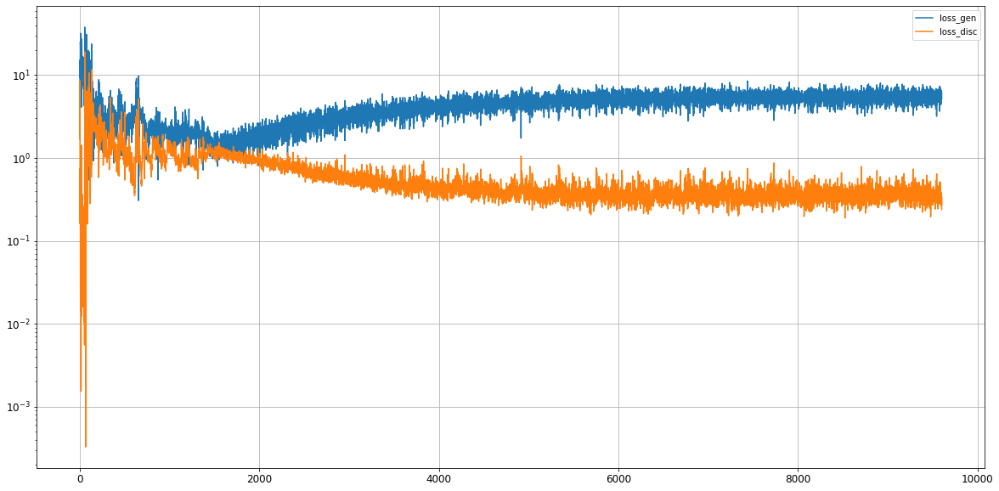

Epoch 9602/20000
0s
Epoch 9603/20000
0s
Epoch 9604/20000
0s
Epoch 9605/20000
0s
Epoch 9606/20000
0s
Epoch 9607/20000
0s
Epoch 9608/20000
0s
Epoch 9609/20000
0s
Epoch 9610/20000
0s
Epoch 9611/20000
0s
Epoch 9612/20000
0s
Epoch 9613/20000
0s
Epoch 9614/20000
0s
Epoch 9615/20000
0s
Epoch 9616/20000
0s
Epoch 9617/20000
0s
Epoch 9618/20000
0s
Epoch 9619/20000
0s
Epoch 9620/20000
0s
Epoch 9621/20000
0s
Epoch 9622/20000
0s
Epoch 9623/20000
0s
Epoch 9624/20000
0s
Epoch 9625/20000
0s
Epoch 9626/20000
0s
Epoch 9627/20000
0s
Epoch 9628/20000
0s
Epoch 9629/20000
0s
Epoch 9630/20000
0s
Epoch 9631/20000
0s
Epoch 9632/20000
0s
Epoch 9633/20000
0s
Epoch 9634/20000
0s
Epoch 9635/20000
0s
Epoch 9636/20000
0s
Epoch 9637/20000
0s
Epoch 9638/20000
0s
Epoch 9639/20000
0s
Epoch 9640/20000
0s
Epoch 9641/20000
0s
Epoch 9642/20000
0s
Epoch 9643/20000
0s
Epoch 9644/20000
0s
Epoch 9645/20000
0s
Epoch 9646/20000
0s
Epoch 9647/20000
0s
Epoch 9648/20000
0s
Epoch 9649/20000
0s
Epoch 9650/20000
0s
Epoch 9651/20000
0s


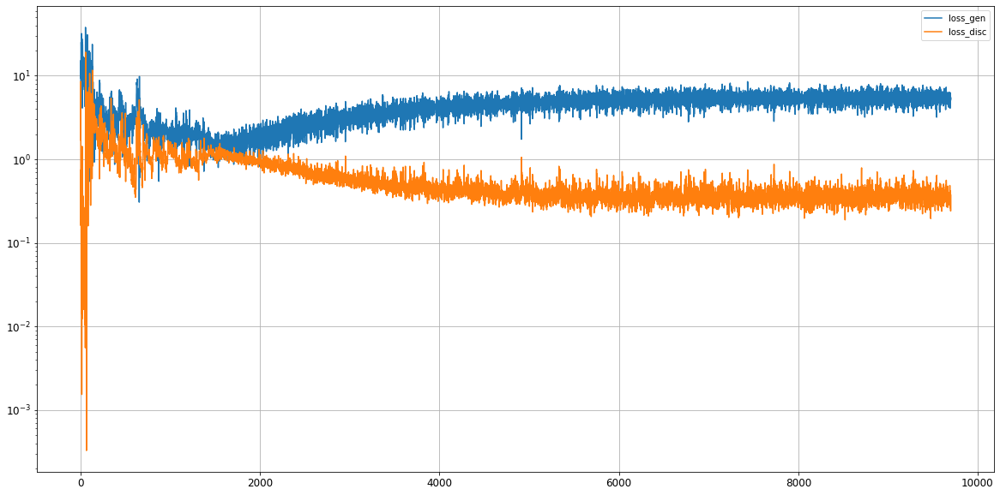

Epoch 9702/20000
0s
Epoch 9703/20000
0s
Epoch 9704/20000
0s
Epoch 9705/20000
0s
Epoch 9706/20000
0s
Epoch 9707/20000
0s
Epoch 9708/20000
0s
Epoch 9709/20000
0s
Epoch 9710/20000
0s
Epoch 9711/20000
0s
Epoch 9712/20000
0s
Epoch 9713/20000
0s
Epoch 9714/20000
0s
Epoch 9715/20000
0s
Epoch 9716/20000
0s
Epoch 9717/20000
0s
Epoch 9718/20000
0s
Epoch 9719/20000
0s
Epoch 9720/20000
0s
Epoch 9721/20000
0s
Epoch 9722/20000
0s
Epoch 9723/20000
0s
Epoch 9724/20000
0s
Epoch 9725/20000
0s
Epoch 9726/20000
0s
Epoch 9727/20000
0s
Epoch 9728/20000
0s
Epoch 9729/20000
0s
Epoch 9730/20000
0s
Epoch 9731/20000
0s
Epoch 9732/20000
0s
Epoch 9733/20000
0s
Epoch 9734/20000
0s
Epoch 9735/20000
0s
Epoch 9736/20000
0s
Epoch 9737/20000
0s
Epoch 9738/20000
0s
Epoch 9739/20000
0s
Epoch 9740/20000
0s
Epoch 9741/20000
0s
Epoch 9742/20000
0s
Epoch 9743/20000
0s
Epoch 9744/20000
0s
Epoch 9745/20000
0s
Epoch 9746/20000
0s
Epoch 9747/20000
0s
Epoch 9748/20000
0s
Epoch 9749/20000
0s
Epoch 9750/20000
0s
Epoch 9751/20000
0s


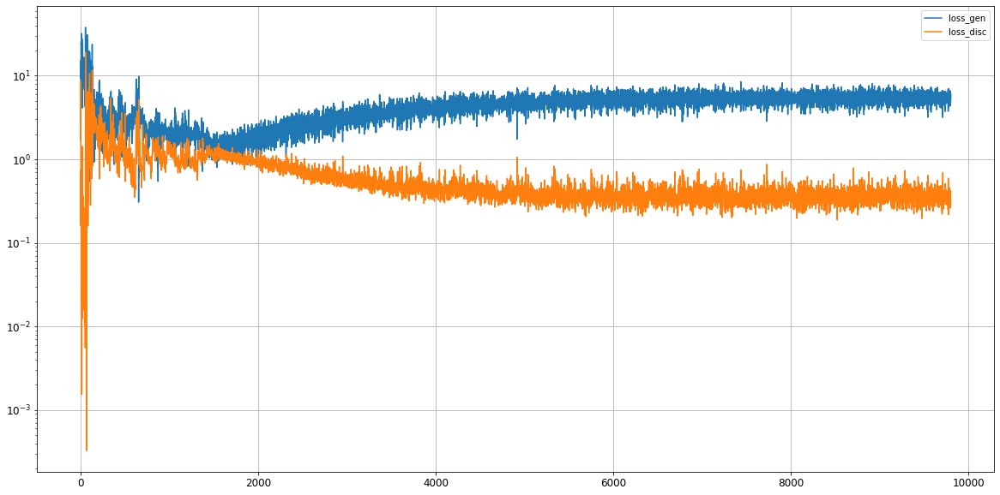

Epoch 9802/20000
0s
Epoch 9803/20000
0s
Epoch 9804/20000
0s
Epoch 9805/20000
0s
Epoch 9806/20000
0s
Epoch 9807/20000
0s
Epoch 9808/20000
0s
Epoch 9809/20000
0s
Epoch 9810/20000
0s
Epoch 9811/20000
0s
Epoch 9812/20000
0s
Epoch 9813/20000
0s
Epoch 9814/20000
0s
Epoch 9815/20000
0s
Epoch 9816/20000
0s
Epoch 9817/20000
0s
Epoch 9818/20000
0s
Epoch 9819/20000
0s
Epoch 9820/20000
0s
Epoch 9821/20000
0s
Epoch 9822/20000
0s
Epoch 9823/20000
0s
Epoch 9824/20000
0s
Epoch 9825/20000
0s
Epoch 9826/20000
0s
Epoch 9827/20000
0s
Epoch 9828/20000
0s
Epoch 9829/20000
0s
Epoch 9830/20000
0s
Epoch 9831/20000
0s
Epoch 9832/20000
0s
Epoch 9833/20000
0s
Epoch 9834/20000
0s
Epoch 9835/20000
0s
Epoch 9836/20000
0s
Epoch 9837/20000
0s
Epoch 9838/20000
0s
Epoch 9839/20000
0s
Epoch 9840/20000
0s
Epoch 9841/20000
0s
Epoch 9842/20000
0s
Epoch 9843/20000
0s
Epoch 9844/20000
0s
Epoch 9845/20000
0s
Epoch 9846/20000
0s
Epoch 9847/20000
0s
Epoch 9848/20000
0s
Epoch 9849/20000
0s
Epoch 9850/20000
0s
Epoch 9851/20000
0s


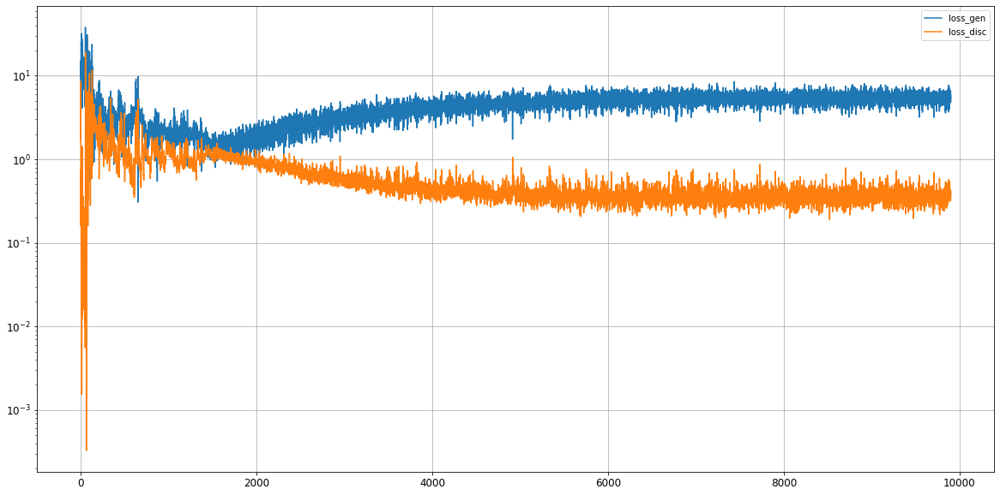

Epoch 9902/20000
0s
Epoch 9903/20000
0s
Epoch 9904/20000
0s
Epoch 9905/20000
0s
Epoch 9906/20000
0s
Epoch 9907/20000
0s
Epoch 9908/20000
0s
Epoch 9909/20000
0s
Epoch 9910/20000
0s
Epoch 9911/20000
0s
Epoch 9912/20000
0s
Epoch 9913/20000
0s
Epoch 9914/20000
0s
Epoch 9915/20000
0s
Epoch 9916/20000
0s
Epoch 9917/20000
0s
Epoch 9918/20000
0s
Epoch 9919/20000
0s
Epoch 9920/20000
0s
Epoch 9921/20000
0s
Epoch 9922/20000
0s
Epoch 9923/20000
0s
Epoch 9924/20000
0s
Epoch 9925/20000
0s
Epoch 9926/20000
0s
Epoch 9927/20000
0s
Epoch 9928/20000
0s
Epoch 9929/20000
0s
Epoch 9930/20000
0s
Epoch 9931/20000
0s
Epoch 9932/20000
0s
Epoch 9933/20000
0s
Epoch 9934/20000
0s
Epoch 9935/20000
0s
Epoch 9936/20000
0s
Epoch 9937/20000
0s
Epoch 9938/20000
0s
Epoch 9939/20000
0s
Epoch 9940/20000
0s
Epoch 9941/20000
0s
Epoch 9942/20000
0s
Epoch 9943/20000
0s
Epoch 9944/20000
0s
Epoch 9945/20000
0s
Epoch 9946/20000
0s
Epoch 9947/20000
0s
Epoch 9948/20000
0s
Epoch 9949/20000
0s
Epoch 9950/20000
0s
Epoch 9951/20000
0s


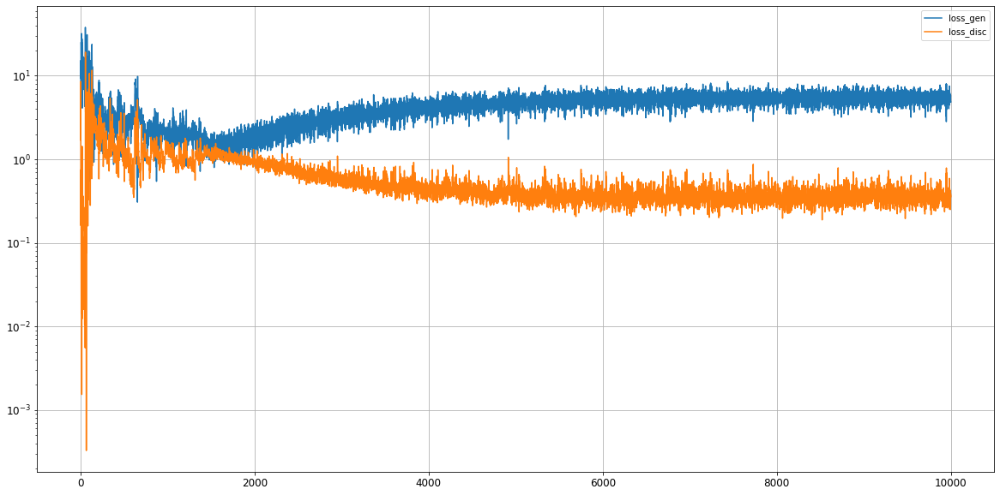

Epoch 10002/20000
0s
Epoch 10003/20000
0s
Epoch 10004/20000
0s
Epoch 10005/20000
0s
Epoch 10006/20000
0s
Epoch 10007/20000
0s
Epoch 10008/20000
0s
Epoch 10009/20000
0s
Epoch 10010/20000
0s
Epoch 10011/20000
0s
Epoch 10012/20000
0s
Epoch 10013/20000
0s
Epoch 10014/20000
0s
Epoch 10015/20000
0s
Epoch 10016/20000
0s
Epoch 10017/20000
0s
Epoch 10018/20000
0s
Epoch 10019/20000
0s
Epoch 10020/20000
0s
Epoch 10021/20000
0s
Epoch 10022/20000
0s
Epoch 10023/20000
0s
Epoch 10024/20000
0s
Epoch 10025/20000
0s
Epoch 10026/20000
0s
Epoch 10027/20000
0s
Epoch 10028/20000
0s
Epoch 10029/20000
0s
Epoch 10030/20000
0s
Epoch 10031/20000
0s
Epoch 10032/20000
0s
Epoch 10033/20000
0s
Epoch 10034/20000
0s
Epoch 10035/20000
0s
Epoch 10036/20000
0s
Epoch 10037/20000
0s
Epoch 10038/20000
0s
Epoch 10039/20000
0s
Epoch 10040/20000
0s
Epoch 10041/20000
0s
Epoch 10042/20000
0s
Epoch 10043/20000
0s
Epoch 10044/20000
0s
Epoch 10045/20000
0s
Epoch 10046/20000
0s
Epoch 10047/20000
0s
Epoch 10048/20000
0s
Epoch 10049/2

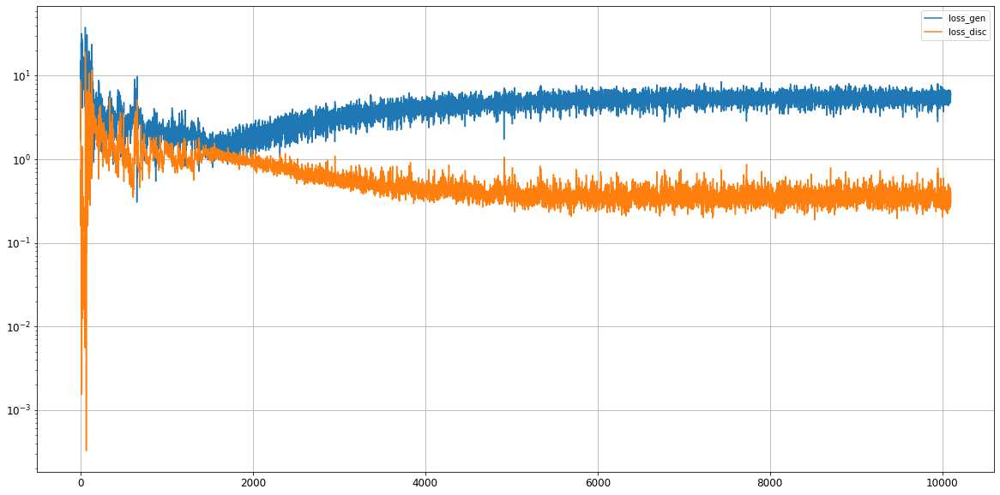

Epoch 10102/20000
0s
Epoch 10103/20000
0s
Epoch 10104/20000
0s
Epoch 10105/20000
0s
Epoch 10106/20000
0s
Epoch 10107/20000
0s
Epoch 10108/20000
0s
Epoch 10109/20000
0s
Epoch 10110/20000
0s
Epoch 10111/20000
0s
Epoch 10112/20000
0s
Epoch 10113/20000
0s
Epoch 10114/20000
0s
Epoch 10115/20000
0s
Epoch 10116/20000
0s
Epoch 10117/20000
0s
Epoch 10118/20000
0s
Epoch 10119/20000
0s
Epoch 10120/20000
0s
Epoch 10121/20000
0s
Epoch 10122/20000
0s
Epoch 10123/20000
0s
Epoch 10124/20000
0s
Epoch 10125/20000
0s
Epoch 10126/20000
0s
Epoch 10127/20000
0s
Epoch 10128/20000
0s
Epoch 10129/20000
0s
Epoch 10130/20000
0s
Epoch 10131/20000
0s
Epoch 10132/20000
0s
Epoch 10133/20000
0s
Epoch 10134/20000
0s
Epoch 10135/20000
0s
Epoch 10136/20000
0s
Epoch 10137/20000
0s
Epoch 10138/20000
0s
Epoch 10139/20000
0s
Epoch 10140/20000
0s
Epoch 10141/20000
0s
Epoch 10142/20000
0s
Epoch 10143/20000
0s
Epoch 10144/20000
0s
Epoch 10145/20000
0s
Epoch 10146/20000
0s
Epoch 10147/20000
0s
Epoch 10148/20000
0s
Epoch 10149/2

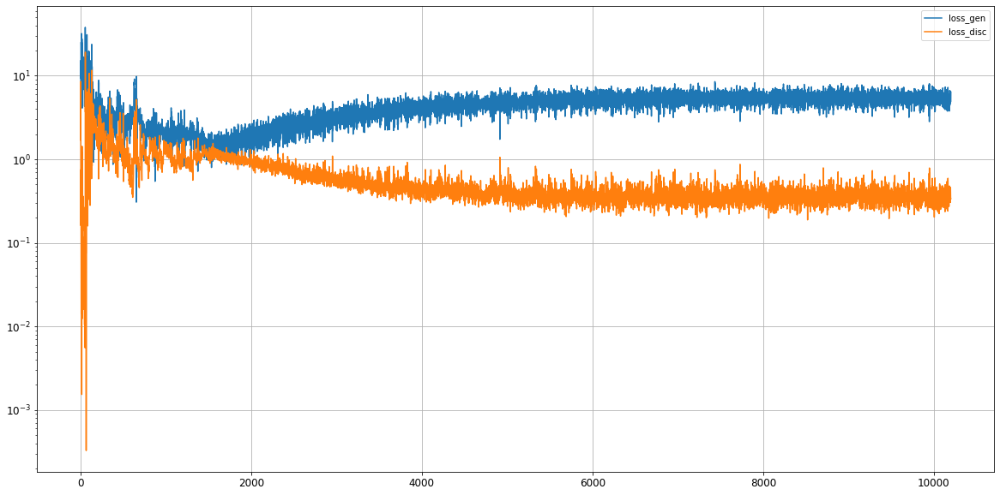

Epoch 10202/20000
0s
Epoch 10203/20000
0s
Epoch 10204/20000
0s
Epoch 10205/20000
0s
Epoch 10206/20000
0s
Epoch 10207/20000
0s
Epoch 10208/20000
0s
Epoch 10209/20000
0s
Epoch 10210/20000
0s
Epoch 10211/20000
0s
Epoch 10212/20000
0s
Epoch 10213/20000
0s
Epoch 10214/20000
0s
Epoch 10215/20000
0s
Epoch 10216/20000
0s
Epoch 10217/20000
0s
Epoch 10218/20000
0s
Epoch 10219/20000
0s
Epoch 10220/20000
0s
Epoch 10221/20000
0s
Epoch 10222/20000
0s
Epoch 10223/20000
0s
Epoch 10224/20000
0s
Epoch 10225/20000
0s
Epoch 10226/20000
0s
Epoch 10227/20000
0s
Epoch 10228/20000
0s
Epoch 10229/20000
0s
Epoch 10230/20000
0s
Epoch 10231/20000
0s
Epoch 10232/20000
0s
Epoch 10233/20000
0s
Epoch 10234/20000
0s
Epoch 10235/20000
0s
Epoch 10236/20000
0s
Epoch 10237/20000
0s
Epoch 10238/20000
0s
Epoch 10239/20000
0s
Epoch 10240/20000
0s
Epoch 10241/20000
0s
Epoch 10242/20000
0s
Epoch 10243/20000
0s
Epoch 10244/20000
0s
Epoch 10245/20000
0s
Epoch 10246/20000
0s
Epoch 10247/20000
0s
Epoch 10248/20000
0s
Epoch 10249/2

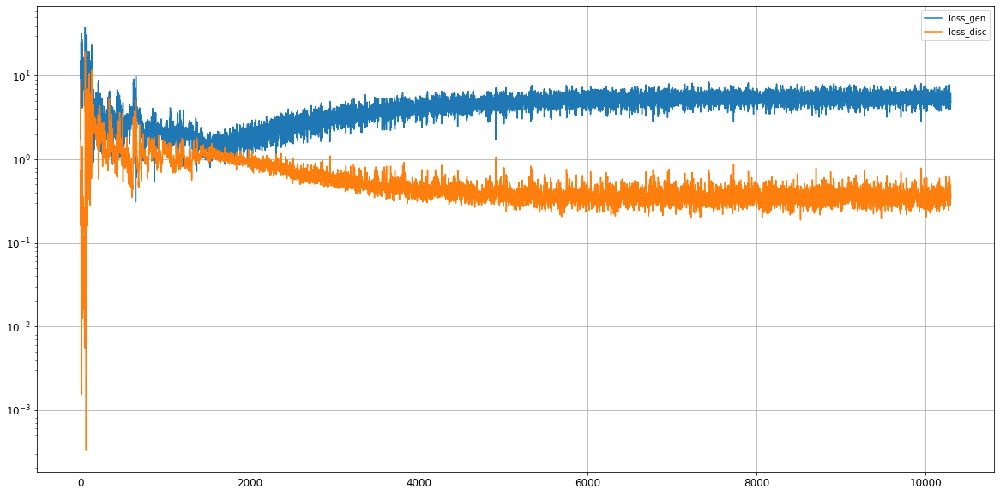

Epoch 10302/20000
0s
Epoch 10303/20000
0s
Epoch 10304/20000
0s
Epoch 10305/20000
0s
Epoch 10306/20000
0s
Epoch 10307/20000
0s
Epoch 10308/20000
0s
Epoch 10309/20000
0s
Epoch 10310/20000
0s
Epoch 10311/20000
0s
Epoch 10312/20000
0s
Epoch 10313/20000
0s
Epoch 10314/20000
0s
Epoch 10315/20000
0s
Epoch 10316/20000
0s
Epoch 10317/20000
0s
Epoch 10318/20000
0s
Epoch 10319/20000
0s
Epoch 10320/20000
0s
Epoch 10321/20000
0s
Epoch 10322/20000
0s
Epoch 10323/20000
0s
Epoch 10324/20000
0s
Epoch 10325/20000
0s
Epoch 10326/20000
0s
Epoch 10327/20000
0s
Epoch 10328/20000
0s
Epoch 10329/20000
0s
Epoch 10330/20000
0s
Epoch 10331/20000
0s
Epoch 10332/20000
0s
Epoch 10333/20000
0s
Epoch 10334/20000
0s
Epoch 10335/20000
0s
Epoch 10336/20000
0s
Epoch 10337/20000
0s
Epoch 10338/20000
0s
Epoch 10339/20000
0s
Epoch 10340/20000
0s
Epoch 10341/20000
0s
Epoch 10342/20000
0s
Epoch 10343/20000
0s
Epoch 10344/20000
0s
Epoch 10345/20000
0s
Epoch 10346/20000
0s
Epoch 10347/20000
0s
Epoch 10348/20000
0s
Epoch 10349/2

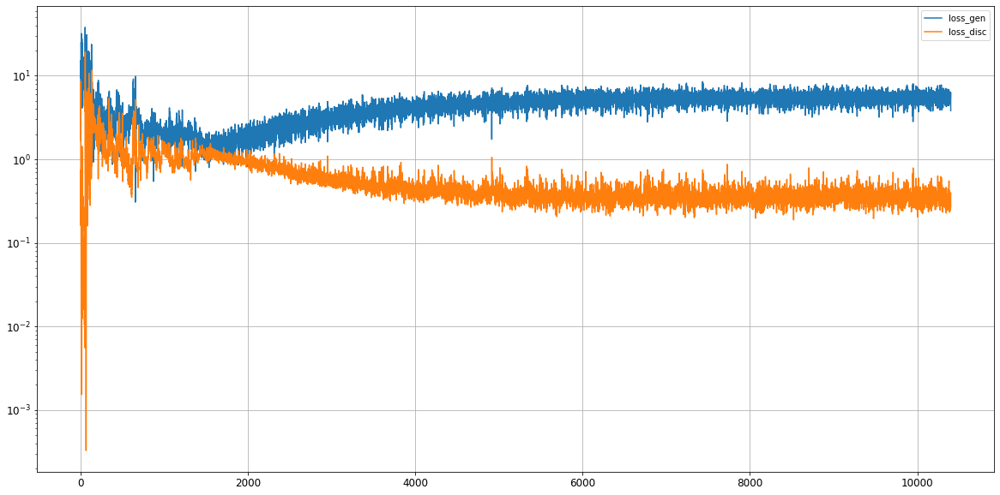

Epoch 10402/20000
0s
Epoch 10403/20000
0s
Epoch 10404/20000
0s
Epoch 10405/20000
0s
Epoch 10406/20000
0s
Epoch 10407/20000
0s
Epoch 10408/20000
0s
Epoch 10409/20000
0s
Epoch 10410/20000
0s
Epoch 10411/20000
0s
Epoch 10412/20000
0s
Epoch 10413/20000
0s
Epoch 10414/20000
0s
Epoch 10415/20000
0s
Epoch 10416/20000
0s
Epoch 10417/20000
0s
Epoch 10418/20000
0s
Epoch 10419/20000
0s
Epoch 10420/20000
0s
Epoch 10421/20000
0s
Epoch 10422/20000
0s
Epoch 10423/20000
0s
Epoch 10424/20000
0s
Epoch 10425/20000
0s
Epoch 10426/20000
0s
Epoch 10427/20000
0s
Epoch 10428/20000
0s
Epoch 10429/20000
0s
Epoch 10430/20000
0s
Epoch 10431/20000
0s
Epoch 10432/20000
0s
Epoch 10433/20000
0s
Epoch 10434/20000
0s
Epoch 10435/20000
0s
Epoch 10436/20000
0s
Epoch 10437/20000
0s
Epoch 10438/20000
0s
Epoch 10439/20000
0s
Epoch 10440/20000
0s
Epoch 10441/20000
0s
Epoch 10442/20000
0s
Epoch 10443/20000
0s
Epoch 10444/20000
0s
Epoch 10445/20000
0s
Epoch 10446/20000
0s
Epoch 10447/20000
0s
Epoch 10448/20000
0s
Epoch 10449/2

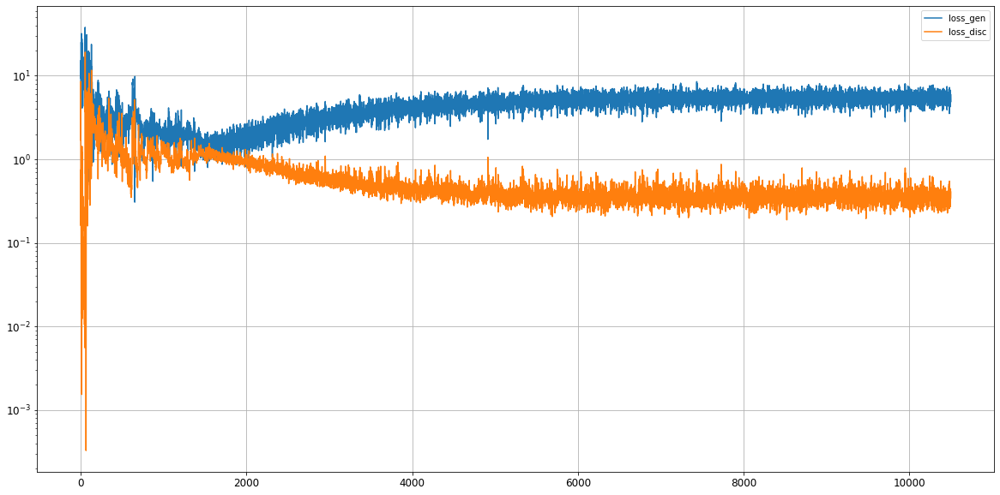

Epoch 10502/20000
0s
Epoch 10503/20000
0s
Epoch 10504/20000
0s
Epoch 10505/20000
0s
Epoch 10506/20000
0s
Epoch 10507/20000
0s
Epoch 10508/20000
0s
Epoch 10509/20000
0s
Epoch 10510/20000
0s
Epoch 10511/20000
0s
Epoch 10512/20000
0s
Epoch 10513/20000
0s
Epoch 10514/20000
0s
Epoch 10515/20000
0s
Epoch 10516/20000
0s
Epoch 10517/20000
0s
Epoch 10518/20000
0s
Epoch 10519/20000
0s
Epoch 10520/20000
0s
Epoch 10521/20000
0s
Epoch 10522/20000
0s
Epoch 10523/20000
0s
Epoch 10524/20000
0s
Epoch 10525/20000
0s
Epoch 10526/20000
0s
Epoch 10527/20000
0s
Epoch 10528/20000
0s
Epoch 10529/20000
0s
Epoch 10530/20000
0s
Epoch 10531/20000
0s
Epoch 10532/20000
0s
Epoch 10533/20000
0s
Epoch 10534/20000
0s
Epoch 10535/20000
0s
Epoch 10536/20000
0s
Epoch 10537/20000
0s
Epoch 10538/20000
0s
Epoch 10539/20000
0s
Epoch 10540/20000
0s
Epoch 10541/20000
0s
Epoch 10542/20000
0s
Epoch 10543/20000
0s
Epoch 10544/20000
0s
Epoch 10545/20000
0s
Epoch 10546/20000
0s
Epoch 10547/20000
0s
Epoch 10548/20000
0s
Epoch 10549/2

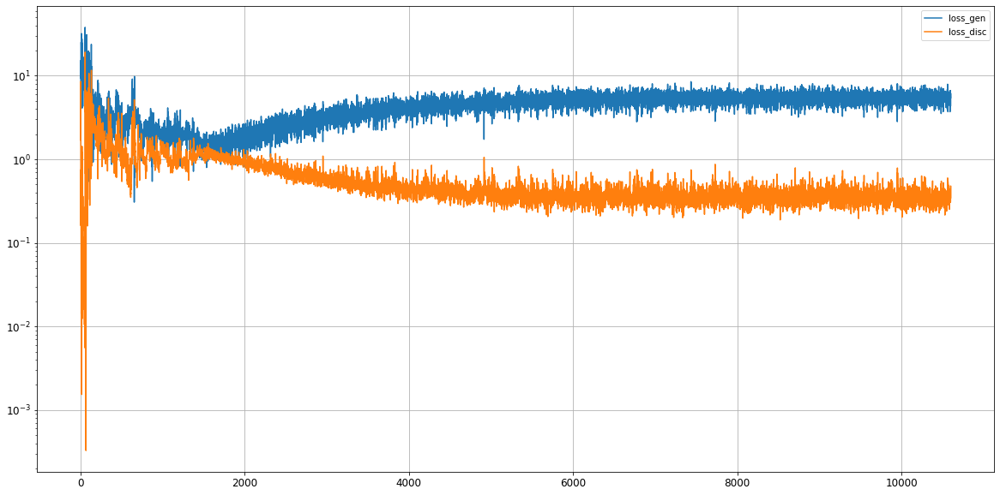

Epoch 10602/20000
0s
Epoch 10603/20000
0s
Epoch 10604/20000
0s
Epoch 10605/20000
0s
Epoch 10606/20000
0s
Epoch 10607/20000
0s
Epoch 10608/20000
0s
Epoch 10609/20000
0s
Epoch 10610/20000
0s
Epoch 10611/20000
0s
Epoch 10612/20000
0s
Epoch 10613/20000
0s
Epoch 10614/20000
0s
Epoch 10615/20000
0s
Epoch 10616/20000
0s
Epoch 10617/20000
0s
Epoch 10618/20000
0s
Epoch 10619/20000
0s
Epoch 10620/20000
0s
Epoch 10621/20000
0s
Epoch 10622/20000
0s
Epoch 10623/20000
0s
Epoch 10624/20000
0s
Epoch 10625/20000
0s
Epoch 10626/20000
0s
Epoch 10627/20000
0s
Epoch 10628/20000
0s
Epoch 10629/20000
0s
Epoch 10630/20000
0s
Epoch 10631/20000
0s
Epoch 10632/20000
0s
Epoch 10633/20000
0s
Epoch 10634/20000
0s
Epoch 10635/20000
0s
Epoch 10636/20000
0s
Epoch 10637/20000
0s
Epoch 10638/20000
0s
Epoch 10639/20000
0s
Epoch 10640/20000
0s
Epoch 10641/20000
0s
Epoch 10642/20000
0s
Epoch 10643/20000
0s
Epoch 10644/20000
0s
Epoch 10645/20000
0s
Epoch 10646/20000
0s
Epoch 10647/20000
0s
Epoch 10648/20000
0s
Epoch 10649/2

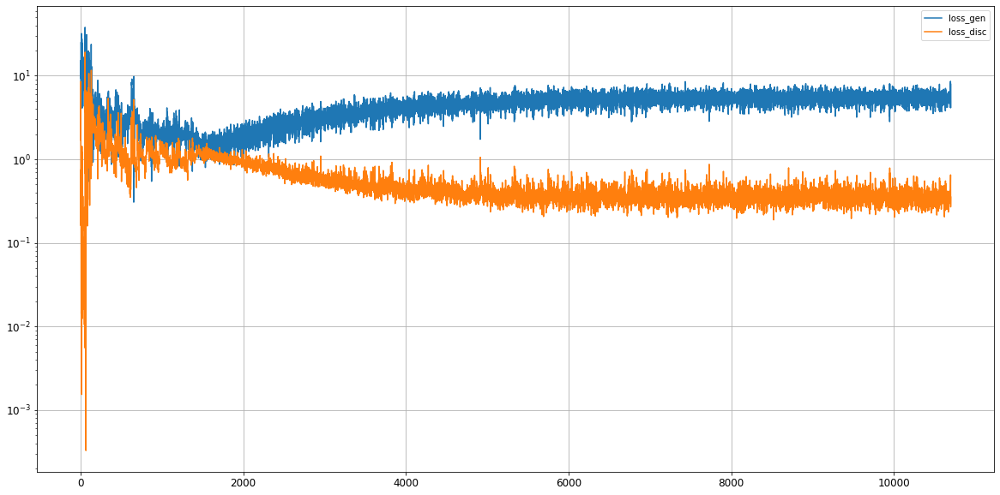

Epoch 10702/20000
0s
Epoch 10703/20000
0s
Epoch 10704/20000
0s
Epoch 10705/20000
0s
Epoch 10706/20000
0s
Epoch 10707/20000
0s
Epoch 10708/20000
0s
Epoch 10709/20000
0s
Epoch 10710/20000
0s
Epoch 10711/20000
0s
Epoch 10712/20000
0s
Epoch 10713/20000
0s
Epoch 10714/20000
0s
Epoch 10715/20000
0s
Epoch 10716/20000
0s
Epoch 10717/20000
0s
Epoch 10718/20000
0s
Epoch 10719/20000
0s
Epoch 10720/20000
0s
Epoch 10721/20000
0s
Epoch 10722/20000
0s
Epoch 10723/20000
0s
Epoch 10724/20000
0s
Epoch 10725/20000
0s
Epoch 10726/20000
0s
Epoch 10727/20000
0s
Epoch 10728/20000
0s
Epoch 10729/20000
0s
Epoch 10730/20000
0s
Epoch 10731/20000
0s
Epoch 10732/20000
0s
Epoch 10733/20000
0s
Epoch 10734/20000
0s
Epoch 10735/20000
0s
Epoch 10736/20000
0s
Epoch 10737/20000
0s
Epoch 10738/20000
0s
Epoch 10739/20000
0s
Epoch 10740/20000
0s
Epoch 10741/20000
0s
Epoch 10742/20000
0s
Epoch 10743/20000
0s
Epoch 10744/20000
0s
Epoch 10745/20000
0s
Epoch 10746/20000
0s
Epoch 10747/20000
0s
Epoch 10748/20000
0s
Epoch 10749/2

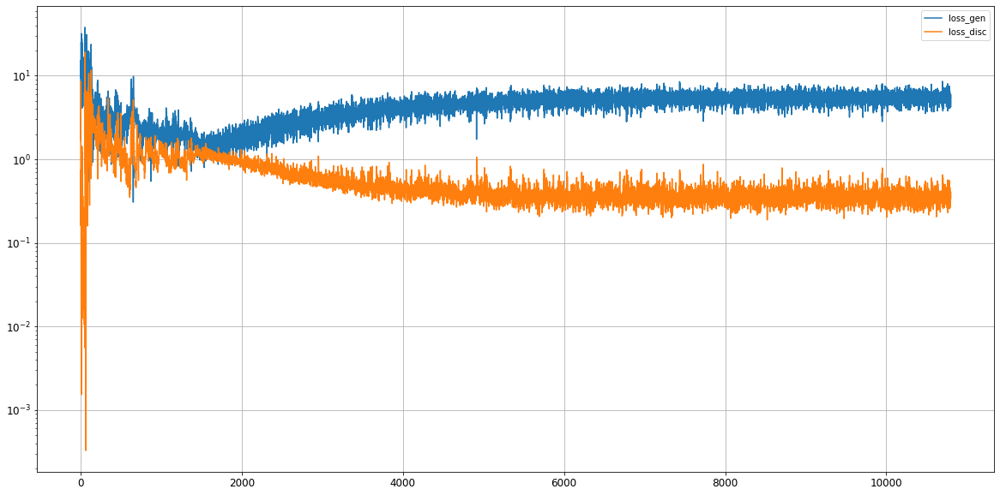

Epoch 10802/20000
0s
Epoch 10803/20000
0s
Epoch 10804/20000
0s
Epoch 10805/20000
0s
Epoch 10806/20000
0s
Epoch 10807/20000
0s
Epoch 10808/20000
0s
Epoch 10809/20000
0s
Epoch 10810/20000
0s
Epoch 10811/20000
0s
Epoch 10812/20000
0s
Epoch 10813/20000
0s
Epoch 10814/20000
0s
Epoch 10815/20000
0s
Epoch 10816/20000
0s
Epoch 10817/20000
0s
Epoch 10818/20000
0s
Epoch 10819/20000
0s
Epoch 10820/20000
0s
Epoch 10821/20000
0s
Epoch 10822/20000
0s
Epoch 10823/20000
0s
Epoch 10824/20000
0s
Epoch 10825/20000
0s
Epoch 10826/20000
0s
Epoch 10827/20000
0s
Epoch 10828/20000
0s
Epoch 10829/20000
0s
Epoch 10830/20000
0s
Epoch 10831/20000
0s
Epoch 10832/20000
0s
Epoch 10833/20000
0s
Epoch 10834/20000
0s
Epoch 10835/20000
0s
Epoch 10836/20000
0s
Epoch 10837/20000
0s
Epoch 10838/20000
0s
Epoch 10839/20000
0s
Epoch 10840/20000
0s
Epoch 10841/20000
0s
Epoch 10842/20000
0s
Epoch 10843/20000
0s
Epoch 10844/20000
0s
Epoch 10845/20000
0s
Epoch 10846/20000
0s
Epoch 10847/20000
0s
Epoch 10848/20000
0s
Epoch 10849/2

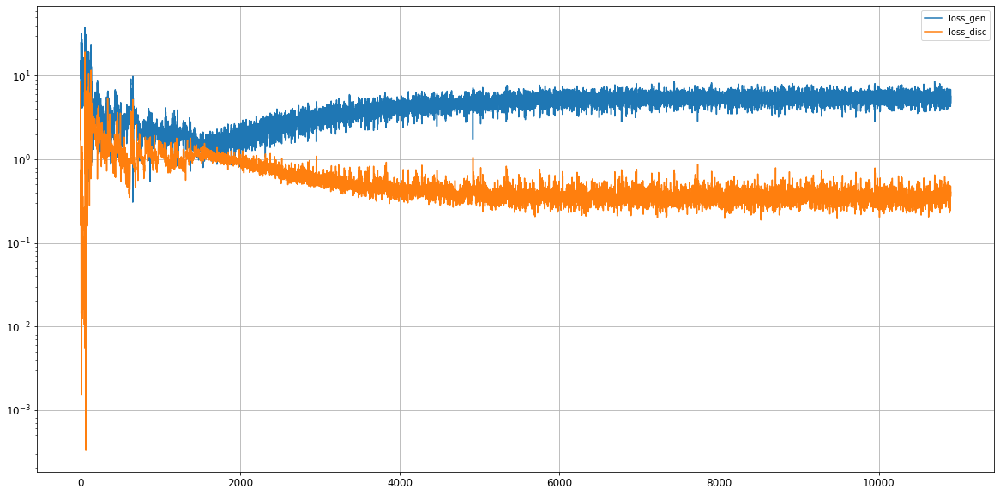

Epoch 10902/20000
0s
Epoch 10903/20000
0s
Epoch 10904/20000
0s
Epoch 10905/20000
0s
Epoch 10906/20000
0s
Epoch 10907/20000
0s
Epoch 10908/20000
0s
Epoch 10909/20000
0s
Epoch 10910/20000
0s
Epoch 10911/20000
0s
Epoch 10912/20000
0s
Epoch 10913/20000
0s
Epoch 10914/20000
0s
Epoch 10915/20000
0s
Epoch 10916/20000
0s
Epoch 10917/20000
0s
Epoch 10918/20000
0s
Epoch 10919/20000
0s
Epoch 10920/20000
0s
Epoch 10921/20000
0s
Epoch 10922/20000
0s
Epoch 10923/20000
0s
Epoch 10924/20000
0s
Epoch 10925/20000
0s
Epoch 10926/20000
0s
Epoch 10927/20000
0s
Epoch 10928/20000
0s
Epoch 10929/20000
0s
Epoch 10930/20000
0s
Epoch 10931/20000
0s
Epoch 10932/20000
0s
Epoch 10933/20000
0s
Epoch 10934/20000
0s
Epoch 10935/20000
0s
Epoch 10936/20000
0s
Epoch 10937/20000
0s
Epoch 10938/20000
0s
Epoch 10939/20000
0s
Epoch 10940/20000
0s
Epoch 10941/20000
0s
Epoch 10942/20000
0s
Epoch 10943/20000
0s
Epoch 10944/20000
0s
Epoch 10945/20000
0s
Epoch 10946/20000
0s
Epoch 10947/20000
0s
Epoch 10948/20000
0s
Epoch 10949/2

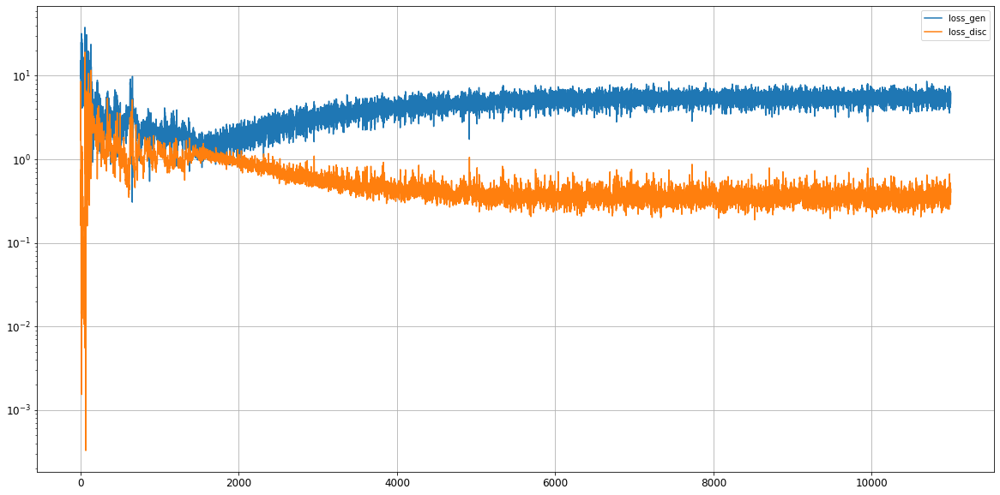

Epoch 11002/20000
0s
Epoch 11003/20000
0s
Epoch 11004/20000
0s
Epoch 11005/20000
0s
Epoch 11006/20000
0s
Epoch 11007/20000
0s
Epoch 11008/20000
0s
Epoch 11009/20000
0s
Epoch 11010/20000
0s
Epoch 11011/20000
0s
Epoch 11012/20000
0s
Epoch 11013/20000
0s
Epoch 11014/20000
0s
Epoch 11015/20000
0s
Epoch 11016/20000
0s
Epoch 11017/20000
0s
Epoch 11018/20000
0s
Epoch 11019/20000
0s
Epoch 11020/20000
0s
Epoch 11021/20000
0s
Epoch 11022/20000
0s
Epoch 11023/20000
0s
Epoch 11024/20000
0s
Epoch 11025/20000
0s
Epoch 11026/20000
0s
Epoch 11027/20000
0s
Epoch 11028/20000
0s
Epoch 11029/20000
0s
Epoch 11030/20000
0s
Epoch 11031/20000
0s
Epoch 11032/20000
0s
Epoch 11033/20000
0s
Epoch 11034/20000
0s
Epoch 11035/20000
0s
Epoch 11036/20000
0s
Epoch 11037/20000
0s
Epoch 11038/20000
0s
Epoch 11039/20000
0s
Epoch 11040/20000
0s
Epoch 11041/20000
0s
Epoch 11042/20000
0s
Epoch 11043/20000
0s
Epoch 11044/20000
0s
Epoch 11045/20000
0s
Epoch 11046/20000
0s
Epoch 11047/20000
0s
Epoch 11048/20000
0s
Epoch 11049/2

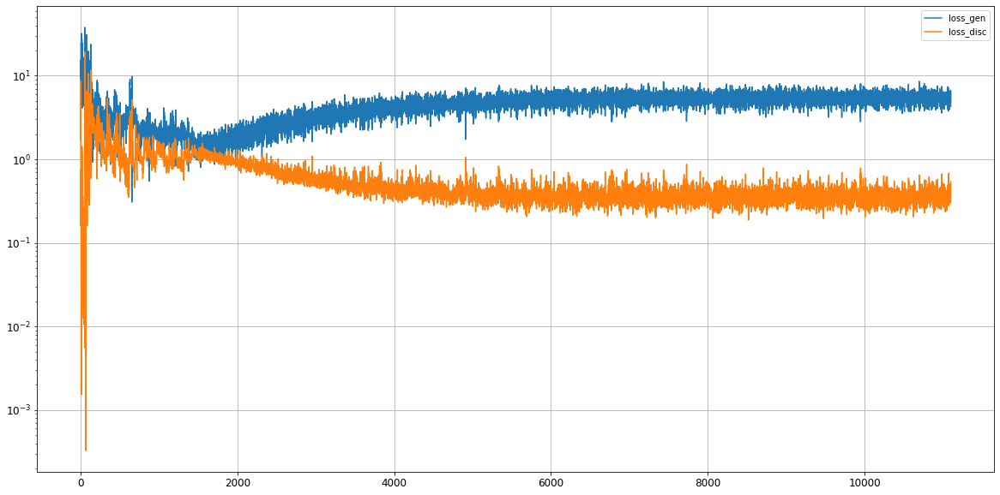

Epoch 11102/20000
0s
Epoch 11103/20000
0s
Epoch 11104/20000
0s
Epoch 11105/20000
0s
Epoch 11106/20000
0s
Epoch 11107/20000
0s
Epoch 11108/20000
0s
Epoch 11109/20000
0s
Epoch 11110/20000
0s
Epoch 11111/20000
0s
Epoch 11112/20000
0s
Epoch 11113/20000
0s
Epoch 11114/20000
0s
Epoch 11115/20000
0s
Epoch 11116/20000
0s
Epoch 11117/20000
0s
Epoch 11118/20000
0s
Epoch 11119/20000
0s
Epoch 11120/20000
0s
Epoch 11121/20000
0s
Epoch 11122/20000
0s
Epoch 11123/20000
0s
Epoch 11124/20000
0s
Epoch 11125/20000
0s
Epoch 11126/20000
0s
Epoch 11127/20000
0s
Epoch 11128/20000
0s
Epoch 11129/20000
0s
Epoch 11130/20000
0s
Epoch 11131/20000
0s
Epoch 11132/20000
0s
Epoch 11133/20000
0s
Epoch 11134/20000
0s
Epoch 11135/20000
0s
Epoch 11136/20000
0s
Epoch 11137/20000
0s
Epoch 11138/20000
0s
Epoch 11139/20000
0s
Epoch 11140/20000
0s
Epoch 11141/20000
0s
Epoch 11142/20000
0s
Epoch 11143/20000
0s
Epoch 11144/20000
0s
Epoch 11145/20000
0s
Epoch 11146/20000
0s
Epoch 11147/20000
0s
Epoch 11148/20000
0s
Epoch 11149/2

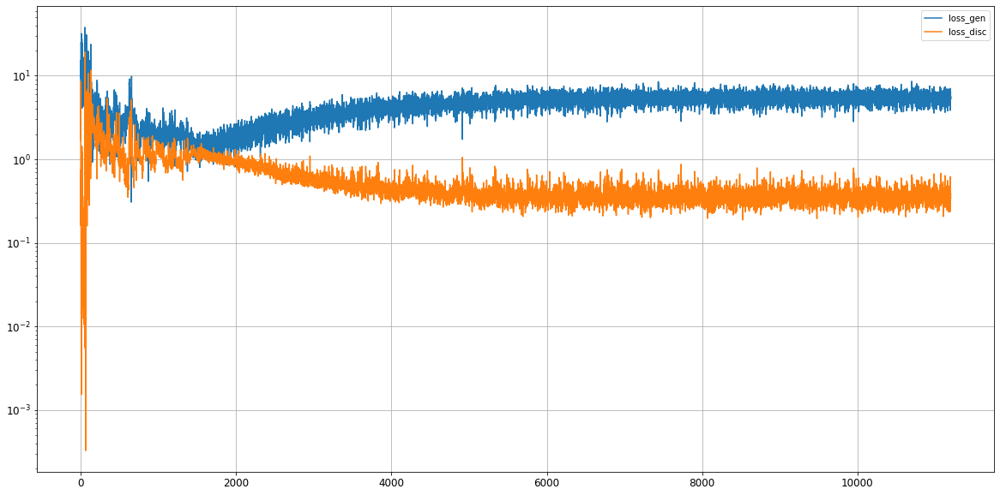

Epoch 11202/20000
0s
Epoch 11203/20000
0s
Epoch 11204/20000
0s
Epoch 11205/20000
0s
Epoch 11206/20000
0s
Epoch 11207/20000
0s
Epoch 11208/20000
0s
Epoch 11209/20000
0s
Epoch 11210/20000
0s
Epoch 11211/20000
0s
Epoch 11212/20000
0s
Epoch 11213/20000
0s
Epoch 11214/20000
0s
Epoch 11215/20000
0s
Epoch 11216/20000
0s
Epoch 11217/20000
0s
Epoch 11218/20000
0s
Epoch 11219/20000
0s
Epoch 11220/20000
0s
Epoch 11221/20000
0s
Epoch 11222/20000
0s
Epoch 11223/20000
0s
Epoch 11224/20000
0s
Epoch 11225/20000
0s
Epoch 11226/20000
0s
Epoch 11227/20000
0s
Epoch 11228/20000
0s
Epoch 11229/20000
0s
Epoch 11230/20000
0s
Epoch 11231/20000
0s
Epoch 11232/20000
0s
Epoch 11233/20000
0s
Epoch 11234/20000
0s
Epoch 11235/20000
0s
Epoch 11236/20000
0s
Epoch 11237/20000
0s
Epoch 11238/20000
0s
Epoch 11239/20000
0s
Epoch 11240/20000
0s
Epoch 11241/20000
0s
Epoch 11242/20000
0s
Epoch 11243/20000
0s
Epoch 11244/20000
0s
Epoch 11245/20000
0s
Epoch 11246/20000
0s
Epoch 11247/20000
0s
Epoch 11248/20000
0s
Epoch 11249/2

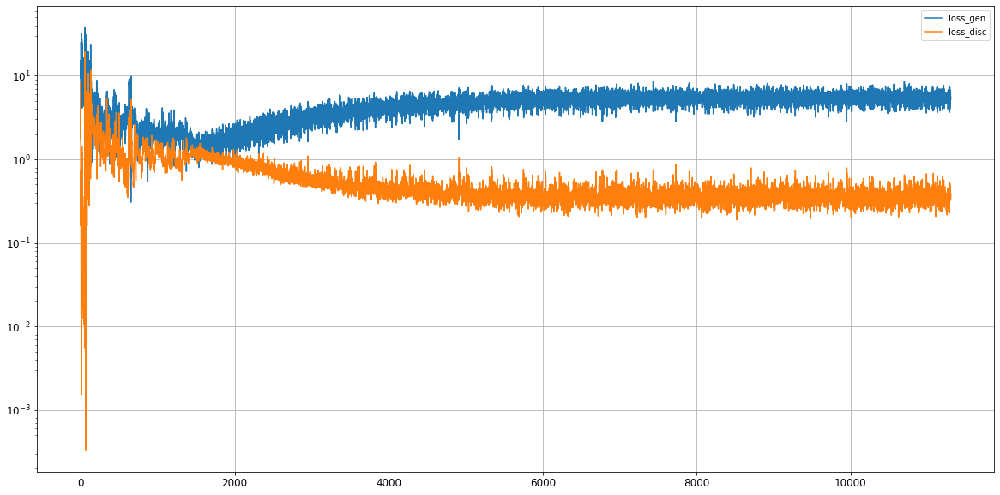

Epoch 11302/20000
0s
Epoch 11303/20000
0s
Epoch 11304/20000
0s
Epoch 11305/20000
0s
Epoch 11306/20000
0s
Epoch 11307/20000
0s
Epoch 11308/20000
0s
Epoch 11309/20000
0s
Epoch 11310/20000
0s
Epoch 11311/20000
0s
Epoch 11312/20000
0s
Epoch 11313/20000
0s
Epoch 11314/20000
0s
Epoch 11315/20000
0s
Epoch 11316/20000
0s
Epoch 11317/20000
0s
Epoch 11318/20000
0s
Epoch 11319/20000
0s
Epoch 11320/20000
0s
Epoch 11321/20000
0s
Epoch 11322/20000
0s
Epoch 11323/20000
0s
Epoch 11324/20000
0s
Epoch 11325/20000
0s
Epoch 11326/20000
0s
Epoch 11327/20000
0s
Epoch 11328/20000
0s
Epoch 11329/20000
0s
Epoch 11330/20000
0s
Epoch 11331/20000
0s
Epoch 11332/20000
0s
Epoch 11333/20000
0s
Epoch 11334/20000
0s
Epoch 11335/20000
0s
Epoch 11336/20000
0s
Epoch 11337/20000
0s
Epoch 11338/20000
0s
Epoch 11339/20000
0s
Epoch 11340/20000
0s
Epoch 11341/20000
0s
Epoch 11342/20000
0s
Epoch 11343/20000
0s
Epoch 11344/20000
0s
Epoch 11345/20000
0s
Epoch 11346/20000
0s
Epoch 11347/20000
0s
Epoch 11348/20000
0s
Epoch 11349/2

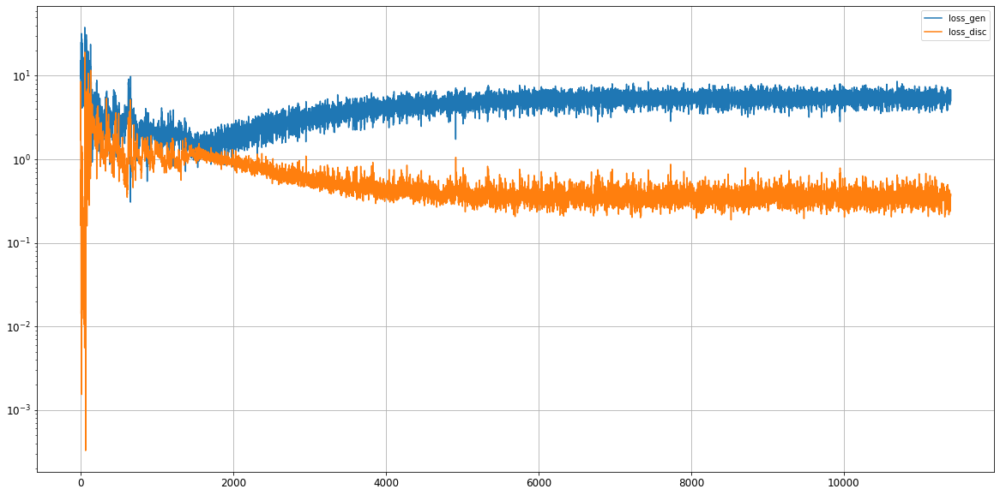

Epoch 11402/20000
0s
Epoch 11403/20000
0s
Epoch 11404/20000
0s
Epoch 11405/20000
0s
Epoch 11406/20000
0s
Epoch 11407/20000
0s
Epoch 11408/20000
0s
Epoch 11409/20000
0s
Epoch 11410/20000
0s
Epoch 11411/20000
0s
Epoch 11412/20000
0s
Epoch 11413/20000
0s
Epoch 11414/20000
0s
Epoch 11415/20000
0s
Epoch 11416/20000
0s
Epoch 11417/20000
0s
Epoch 11418/20000
0s
Epoch 11419/20000
0s
Epoch 11420/20000
0s
Epoch 11421/20000
0s
Epoch 11422/20000
0s
Epoch 11423/20000
0s
Epoch 11424/20000
0s
Epoch 11425/20000
0s
Epoch 11426/20000
0s
Epoch 11427/20000
0s
Epoch 11428/20000
0s
Epoch 11429/20000
0s
Epoch 11430/20000
0s
Epoch 11431/20000
0s
Epoch 11432/20000
0s
Epoch 11433/20000
0s
Epoch 11434/20000
0s
Epoch 11435/20000
0s
Epoch 11436/20000
0s
Epoch 11437/20000
0s
Epoch 11438/20000
0s
Epoch 11439/20000
0s
Epoch 11440/20000
0s
Epoch 11441/20000
0s
Epoch 11442/20000
0s
Epoch 11443/20000
0s
Epoch 11444/20000
0s
Epoch 11445/20000
0s
Epoch 11446/20000
0s
Epoch 11447/20000
0s
Epoch 11448/20000
0s
Epoch 11449/2

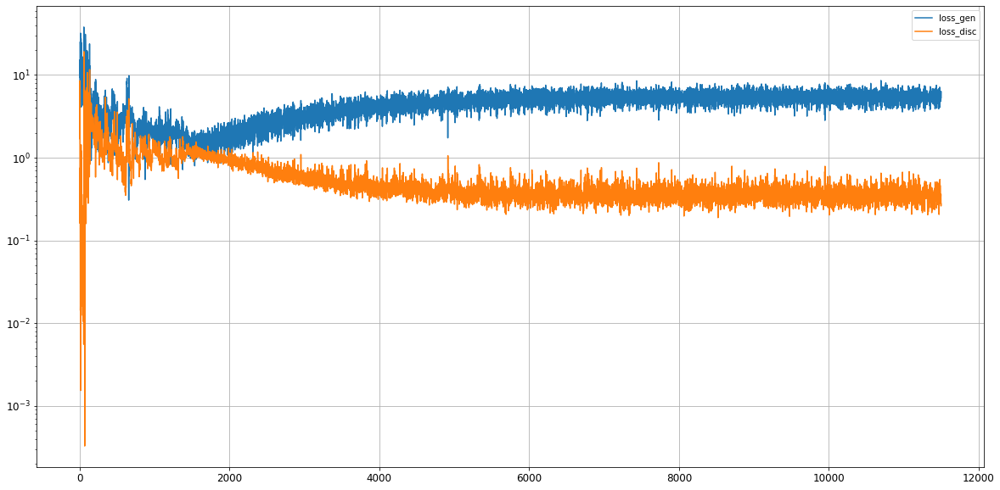

Epoch 11502/20000
0s
Epoch 11503/20000
0s
Epoch 11504/20000
0s
Epoch 11505/20000
0s
Epoch 11506/20000
0s
Epoch 11507/20000
0s
Epoch 11508/20000
0s
Epoch 11509/20000
0s
Epoch 11510/20000
0s
Epoch 11511/20000
0s
Epoch 11512/20000
0s
Epoch 11513/20000
0s
Epoch 11514/20000
0s
Epoch 11515/20000
0s
Epoch 11516/20000
0s
Epoch 11517/20000
0s
Epoch 11518/20000
0s
Epoch 11519/20000
0s
Epoch 11520/20000
0s
Epoch 11521/20000
0s
Epoch 11522/20000
0s
Epoch 11523/20000
0s
Epoch 11524/20000
0s
Epoch 11525/20000
0s
Epoch 11526/20000
0s
Epoch 11527/20000
0s
Epoch 11528/20000
0s
Epoch 11529/20000
0s
Epoch 11530/20000
0s
Epoch 11531/20000
0s
Epoch 11532/20000
0s
Epoch 11533/20000
0s
Epoch 11534/20000
0s
Epoch 11535/20000
0s
Epoch 11536/20000
0s
Epoch 11537/20000
0s
Epoch 11538/20000
0s
Epoch 11539/20000
0s
Epoch 11540/20000
0s
Epoch 11541/20000
0s
Epoch 11542/20000
0s
Epoch 11543/20000
0s
Epoch 11544/20000
0s
Epoch 11545/20000
0s
Epoch 11546/20000
0s
Epoch 11547/20000
0s
Epoch 11548/20000
0s
Epoch 11549/2

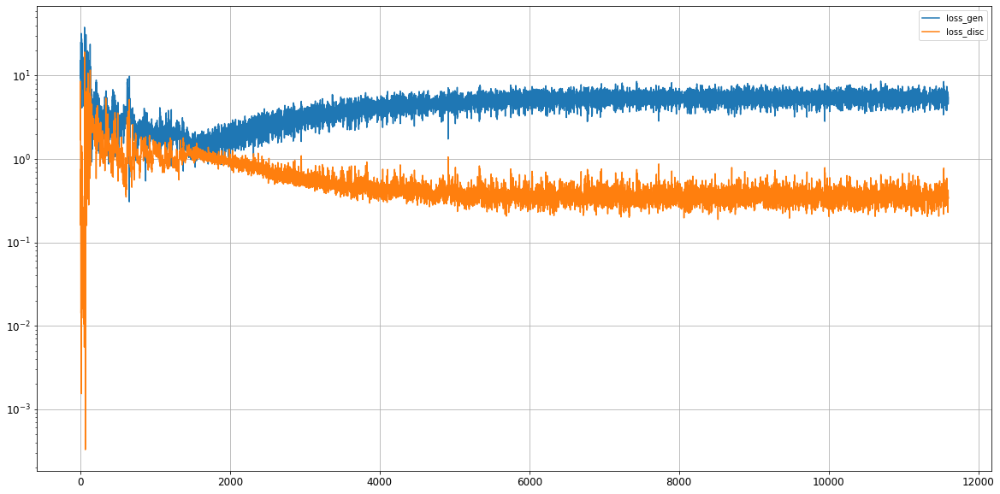

Epoch 11602/20000
0s
Epoch 11603/20000
0s
Epoch 11604/20000
0s
Epoch 11605/20000
0s
Epoch 11606/20000
0s
Epoch 11607/20000
0s
Epoch 11608/20000
0s
Epoch 11609/20000
0s
Epoch 11610/20000
0s
Epoch 11611/20000
0s
Epoch 11612/20000
0s
Epoch 11613/20000
0s
Epoch 11614/20000
0s
Epoch 11615/20000
0s
Epoch 11616/20000
0s
Epoch 11617/20000
0s
Epoch 11618/20000
0s
Epoch 11619/20000
0s
Epoch 11620/20000
0s
Epoch 11621/20000
0s
Epoch 11622/20000
0s
Epoch 11623/20000
0s
Epoch 11624/20000
0s
Epoch 11625/20000
0s
Epoch 11626/20000
0s
Epoch 11627/20000
0s
Epoch 11628/20000
0s
Epoch 11629/20000
0s
Epoch 11630/20000
0s
Epoch 11631/20000
0s
Epoch 11632/20000
0s
Epoch 11633/20000
0s
Epoch 11634/20000
0s
Epoch 11635/20000
0s
Epoch 11636/20000
0s
Epoch 11637/20000
0s
Epoch 11638/20000
0s
Epoch 11639/20000
0s
Epoch 11640/20000
0s
Epoch 11641/20000
0s
Epoch 11642/20000
0s
Epoch 11643/20000
0s
Epoch 11644/20000
0s
Epoch 11645/20000
0s
Epoch 11646/20000
0s
Epoch 11647/20000
0s
Epoch 11648/20000
0s
Epoch 11649/2

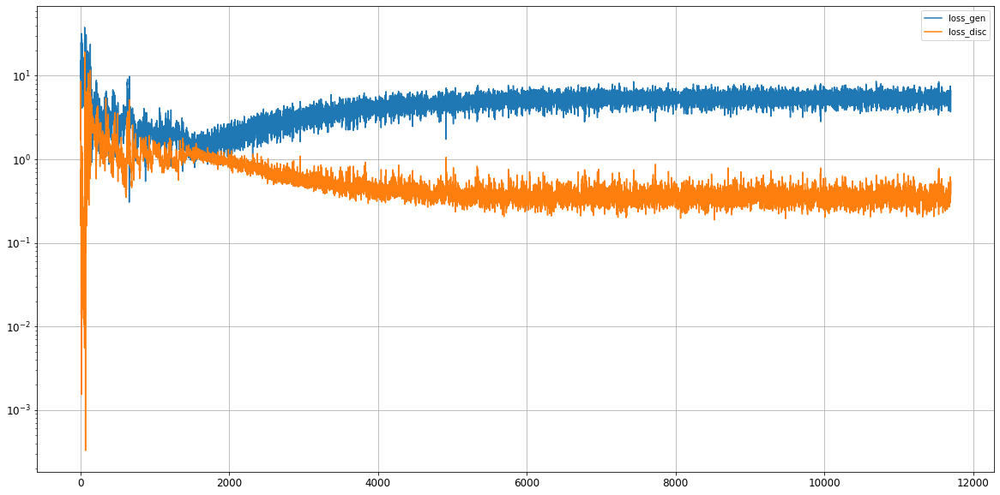

Epoch 11702/20000
0s
Epoch 11703/20000
0s
Epoch 11704/20000
0s
Epoch 11705/20000
0s
Epoch 11706/20000
0s
Epoch 11707/20000
0s
Epoch 11708/20000
0s
Epoch 11709/20000
0s
Epoch 11710/20000
0s
Epoch 11711/20000
0s
Epoch 11712/20000
0s
Epoch 11713/20000
0s
Epoch 11714/20000
0s
Epoch 11715/20000
0s
Epoch 11716/20000
0s
Epoch 11717/20000
0s
Epoch 11718/20000
0s
Epoch 11719/20000
0s
Epoch 11720/20000
0s
Epoch 11721/20000
0s
Epoch 11722/20000
0s
Epoch 11723/20000
0s
Epoch 11724/20000
0s
Epoch 11725/20000
0s
Epoch 11726/20000
0s
Epoch 11727/20000
0s
Epoch 11728/20000
0s
Epoch 11729/20000
0s
Epoch 11730/20000
0s
Epoch 11731/20000
0s
Epoch 11732/20000
0s
Epoch 11733/20000
0s
Epoch 11734/20000
0s
Epoch 11735/20000
0s
Epoch 11736/20000
0s
Epoch 11737/20000
0s
Epoch 11738/20000
0s
Epoch 11739/20000
0s
Epoch 11740/20000
0s
Epoch 11741/20000
0s
Epoch 11742/20000
0s
Epoch 11743/20000
0s
Epoch 11744/20000
0s
Epoch 11745/20000
0s
Epoch 11746/20000
0s
Epoch 11747/20000
0s
Epoch 11748/20000
0s
Epoch 11749/2

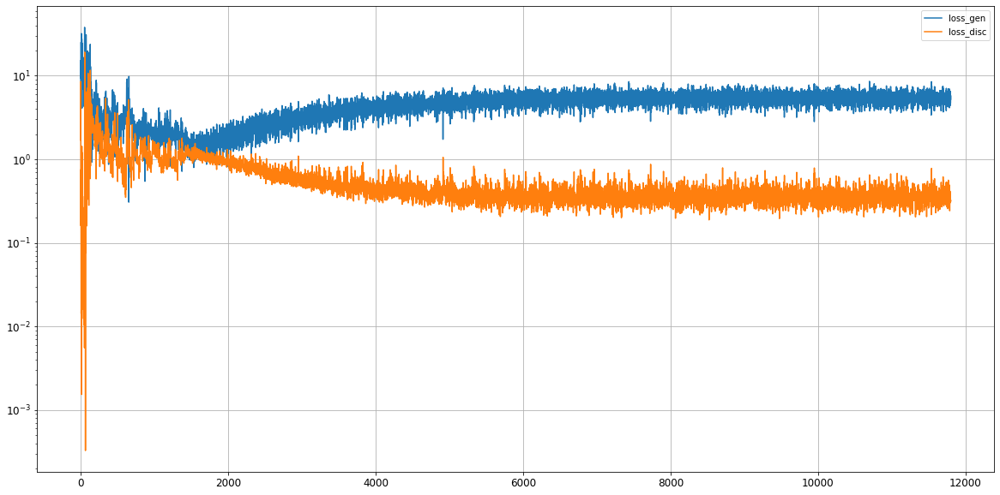

Epoch 11802/20000
0s
Epoch 11803/20000
0s
Epoch 11804/20000
0s
Epoch 11805/20000
0s
Epoch 11806/20000
0s
Epoch 11807/20000
0s
Epoch 11808/20000
0s
Epoch 11809/20000
0s
Epoch 11810/20000
0s
Epoch 11811/20000
0s
Epoch 11812/20000
0s
Epoch 11813/20000
0s
Epoch 11814/20000
0s
Epoch 11815/20000
0s
Epoch 11816/20000
0s
Epoch 11817/20000
0s
Epoch 11818/20000
0s
Epoch 11819/20000
0s
Epoch 11820/20000
0s
Epoch 11821/20000
0s
Epoch 11822/20000
0s
Epoch 11823/20000
0s
Epoch 11824/20000
0s
Epoch 11825/20000
0s
Epoch 11826/20000
0s
Epoch 11827/20000
0s
Epoch 11828/20000
0s
Epoch 11829/20000
0s
Epoch 11830/20000
0s
Epoch 11831/20000
0s
Epoch 11832/20000
0s
Epoch 11833/20000
0s
Epoch 11834/20000
0s
Epoch 11835/20000
0s
Epoch 11836/20000
0s
Epoch 11837/20000
0s
Epoch 11838/20000
0s
Epoch 11839/20000
0s
Epoch 11840/20000
0s
Epoch 11841/20000
0s
Epoch 11842/20000
0s
Epoch 11843/20000
0s
Epoch 11844/20000
0s
Epoch 11845/20000
0s
Epoch 11846/20000
0s
Epoch 11847/20000
0s
Epoch 11848/20000
0s
Epoch 11849/2

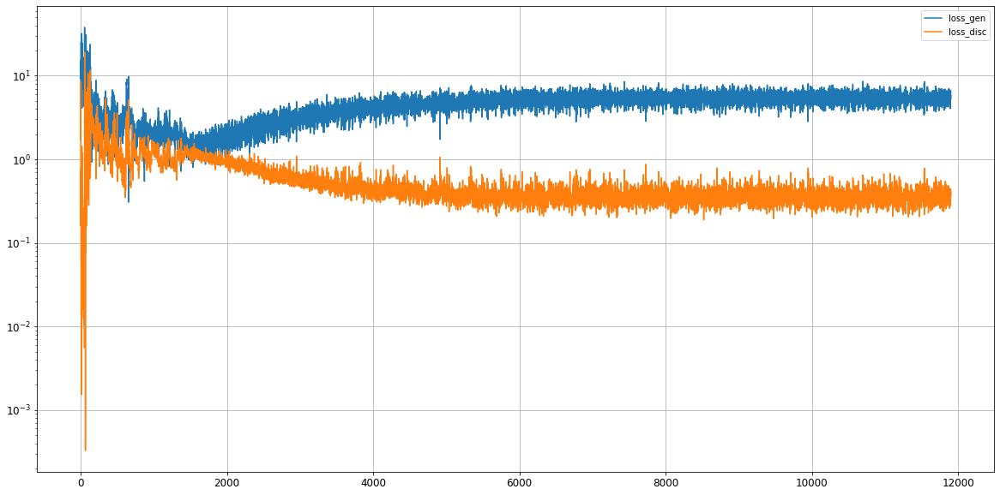

Epoch 11902/20000
0s
Epoch 11903/20000
0s
Epoch 11904/20000
0s
Epoch 11905/20000
0s
Epoch 11906/20000
0s
Epoch 11907/20000
0s
Epoch 11908/20000
0s
Epoch 11909/20000
0s
Epoch 11910/20000
0s
Epoch 11911/20000
0s
Epoch 11912/20000
0s
Epoch 11913/20000
0s
Epoch 11914/20000
0s
Epoch 11915/20000
0s
Epoch 11916/20000
0s
Epoch 11917/20000
0s
Epoch 11918/20000
0s
Epoch 11919/20000
0s
Epoch 11920/20000
0s
Epoch 11921/20000
0s
Epoch 11922/20000
0s
Epoch 11923/20000
0s
Epoch 11924/20000
0s
Epoch 11925/20000
0s
Epoch 11926/20000
0s
Epoch 11927/20000
0s
Epoch 11928/20000
0s
Epoch 11929/20000
0s
Epoch 11930/20000
0s
Epoch 11931/20000
0s
Epoch 11932/20000
0s
Epoch 11933/20000
0s
Epoch 11934/20000
0s
Epoch 11935/20000
0s
Epoch 11936/20000
0s
Epoch 11937/20000
0s
Epoch 11938/20000
0s
Epoch 11939/20000
0s
Epoch 11940/20000
0s
Epoch 11941/20000
0s
Epoch 11942/20000
0s
Epoch 11943/20000
0s
Epoch 11944/20000
0s
Epoch 11945/20000
0s
Epoch 11946/20000
0s
Epoch 11947/20000
0s
Epoch 11948/20000
0s
Epoch 11949/2

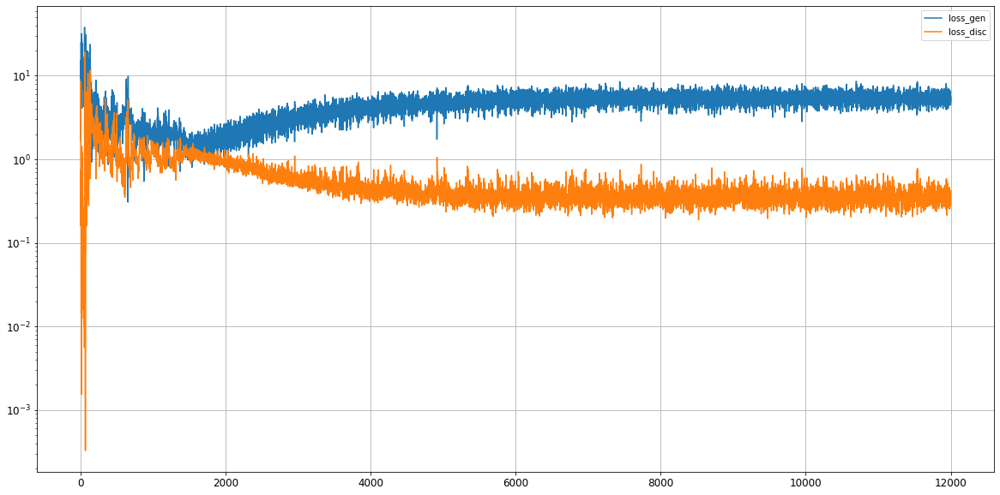

Epoch 12002/20000
0s
Epoch 12003/20000
0s
Epoch 12004/20000
0s
Epoch 12005/20000
0s
Epoch 12006/20000
0s
Epoch 12007/20000
0s
Epoch 12008/20000
0s
Epoch 12009/20000
0s
Epoch 12010/20000
0s
Epoch 12011/20000
0s
Epoch 12012/20000
0s
Epoch 12013/20000
0s
Epoch 12014/20000
0s
Epoch 12015/20000
0s
Epoch 12016/20000
0s
Epoch 12017/20000
0s
Epoch 12018/20000
0s
Epoch 12019/20000
0s
Epoch 12020/20000
0s
Epoch 12021/20000
0s
Epoch 12022/20000
0s
Epoch 12023/20000
0s
Epoch 12024/20000
0s
Epoch 12025/20000
0s
Epoch 12026/20000
0s
Epoch 12027/20000
0s
Epoch 12028/20000
0s
Epoch 12029/20000
0s
Epoch 12030/20000
0s
Epoch 12031/20000
0s
Epoch 12032/20000
0s
Epoch 12033/20000
0s
Epoch 12034/20000
0s
Epoch 12035/20000
0s
Epoch 12036/20000
0s
Epoch 12037/20000
0s
Epoch 12038/20000
0s
Epoch 12039/20000
0s
Epoch 12040/20000
0s
Epoch 12041/20000
0s
Epoch 12042/20000
0s
Epoch 12043/20000
0s
Epoch 12044/20000
0s
Epoch 12045/20000
0s
Epoch 12046/20000
0s
Epoch 12047/20000
0s
Epoch 12048/20000
0s
Epoch 12049/2

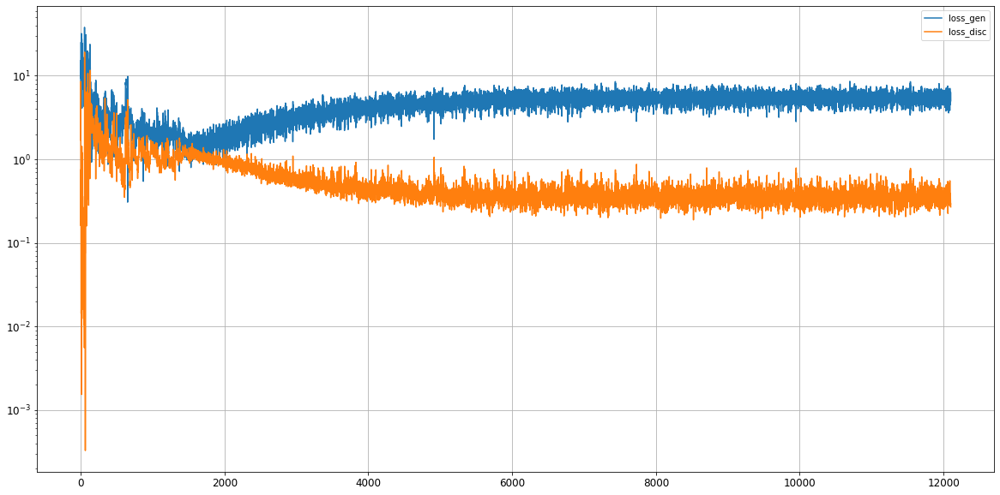

Epoch 12102/20000
0s
Epoch 12103/20000
0s
Epoch 12104/20000
0s
Epoch 12105/20000
0s
Epoch 12106/20000
0s
Epoch 12107/20000
0s
Epoch 12108/20000
0s
Epoch 12109/20000
0s
Epoch 12110/20000
0s
Epoch 12111/20000
0s
Epoch 12112/20000
0s
Epoch 12113/20000
0s
Epoch 12114/20000
0s
Epoch 12115/20000
0s
Epoch 12116/20000
0s
Epoch 12117/20000
0s
Epoch 12118/20000
0s
Epoch 12119/20000
0s
Epoch 12120/20000
0s
Epoch 12121/20000
0s
Epoch 12122/20000
0s
Epoch 12123/20000
0s
Epoch 12124/20000
0s
Epoch 12125/20000
0s
Epoch 12126/20000
0s
Epoch 12127/20000
0s
Epoch 12128/20000
0s
Epoch 12129/20000
0s
Epoch 12130/20000
0s
Epoch 12131/20000
0s
Epoch 12132/20000
0s
Epoch 12133/20000
0s
Epoch 12134/20000
0s
Epoch 12135/20000
0s
Epoch 12136/20000
0s
Epoch 12137/20000
0s
Epoch 12138/20000
0s
Epoch 12139/20000
0s
Epoch 12140/20000
0s
Epoch 12141/20000
0s
Epoch 12142/20000
0s
Epoch 12143/20000
0s
Epoch 12144/20000
0s
Epoch 12145/20000
0s
Epoch 12146/20000
0s
Epoch 12147/20000
0s
Epoch 12148/20000
0s
Epoch 12149/2

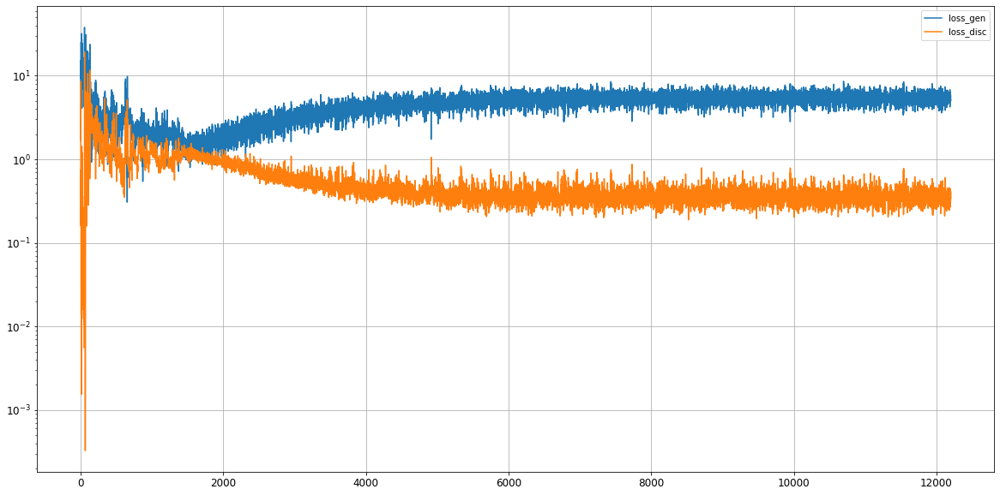

Epoch 12202/20000
0s
Epoch 12203/20000
0s
Epoch 12204/20000
0s
Epoch 12205/20000
0s
Epoch 12206/20000
0s
Epoch 12207/20000
0s
Epoch 12208/20000
0s
Epoch 12209/20000
0s
Epoch 12210/20000
0s
Epoch 12211/20000
0s
Epoch 12212/20000
0s
Epoch 12213/20000
0s
Epoch 12214/20000
0s
Epoch 12215/20000
0s
Epoch 12216/20000
0s
Epoch 12217/20000
0s
Epoch 12218/20000
0s
Epoch 12219/20000
0s
Epoch 12220/20000
0s
Epoch 12221/20000
0s
Epoch 12222/20000
0s
Epoch 12223/20000
0s
Epoch 12224/20000
0s
Epoch 12225/20000
0s
Epoch 12226/20000
0s
Epoch 12227/20000
0s
Epoch 12228/20000
0s
Epoch 12229/20000
0s
Epoch 12230/20000
0s
Epoch 12231/20000
0s
Epoch 12232/20000
0s
Epoch 12233/20000
0s
Epoch 12234/20000
0s
Epoch 12235/20000
0s
Epoch 12236/20000
0s
Epoch 12237/20000
0s
Epoch 12238/20000
0s
Epoch 12239/20000
0s
Epoch 12240/20000
0s
Epoch 12241/20000
0s
Epoch 12242/20000
0s
Epoch 12243/20000
0s
Epoch 12244/20000
0s
Epoch 12245/20000
0s
Epoch 12246/20000
0s
Epoch 12247/20000
0s
Epoch 12248/20000
0s
Epoch 12249/2

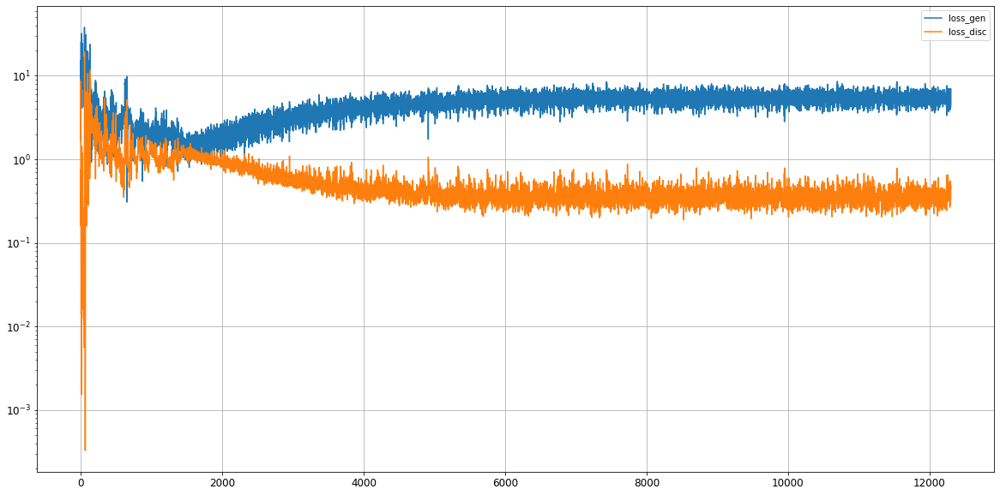

Epoch 12302/20000
0s
Epoch 12303/20000
0s
Epoch 12304/20000
0s
Epoch 12305/20000
0s
Epoch 12306/20000
0s
Epoch 12307/20000
0s
Epoch 12308/20000
0s
Epoch 12309/20000
0s
Epoch 12310/20000
0s
Epoch 12311/20000
0s
Epoch 12312/20000
0s
Epoch 12313/20000
0s
Epoch 12314/20000
0s
Epoch 12315/20000
0s
Epoch 12316/20000
0s
Epoch 12317/20000
0s
Epoch 12318/20000
0s
Epoch 12319/20000
0s
Epoch 12320/20000
0s
Epoch 12321/20000
0s
Epoch 12322/20000
0s
Epoch 12323/20000
0s
Epoch 12324/20000
0s
Epoch 12325/20000
0s
Epoch 12326/20000
0s
Epoch 12327/20000
0s
Epoch 12328/20000
0s
Epoch 12329/20000
0s
Epoch 12330/20000
0s
Epoch 12331/20000
0s
Epoch 12332/20000
0s
Epoch 12333/20000
0s
Epoch 12334/20000
0s
Epoch 12335/20000
0s
Epoch 12336/20000
0s
Epoch 12337/20000
0s
Epoch 12338/20000
0s
Epoch 12339/20000
0s
Epoch 12340/20000
0s
Epoch 12341/20000
0s
Epoch 12342/20000
0s
Epoch 12343/20000
0s
Epoch 12344/20000
0s
Epoch 12345/20000
0s
Epoch 12346/20000
0s
Epoch 12347/20000
0s
Epoch 12348/20000
0s
Epoch 12349/2

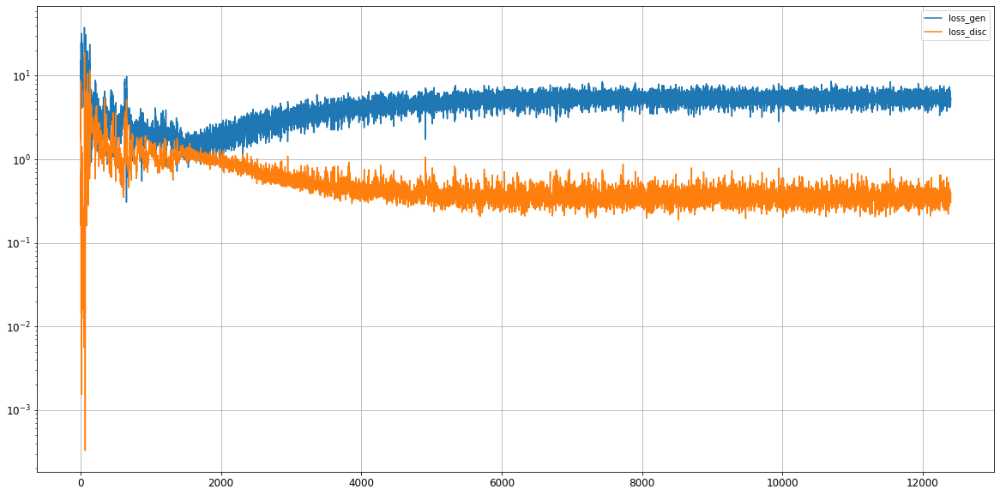

Epoch 12402/20000
0s
Epoch 12403/20000
0s
Epoch 12404/20000
0s
Epoch 12405/20000
0s
Epoch 12406/20000
0s
Epoch 12407/20000
0s
Epoch 12408/20000
0s
Epoch 12409/20000
0s
Epoch 12410/20000
0s
Epoch 12411/20000
0s
Epoch 12412/20000
0s
Epoch 12413/20000
0s
Epoch 12414/20000
0s
Epoch 12415/20000
0s
Epoch 12416/20000
0s
Epoch 12417/20000
0s
Epoch 12418/20000
0s
Epoch 12419/20000
0s
Epoch 12420/20000
0s
Epoch 12421/20000
0s
Epoch 12422/20000
0s
Epoch 12423/20000
0s
Epoch 12424/20000
0s
Epoch 12425/20000
0s
Epoch 12426/20000
0s
Epoch 12427/20000
0s
Epoch 12428/20000
0s
Epoch 12429/20000
0s
Epoch 12430/20000
0s
Epoch 12431/20000
0s
Epoch 12432/20000
0s
Epoch 12433/20000
0s
Epoch 12434/20000
0s
Epoch 12435/20000
0s
Epoch 12436/20000
0s
Epoch 12437/20000
0s
Epoch 12438/20000
0s
Epoch 12439/20000
0s
Epoch 12440/20000
0s
Epoch 12441/20000
0s
Epoch 12442/20000
0s
Epoch 12443/20000
0s
Epoch 12444/20000
0s
Epoch 12445/20000
0s
Epoch 12446/20000
0s
Epoch 12447/20000
0s
Epoch 12448/20000
0s
Epoch 12449/2

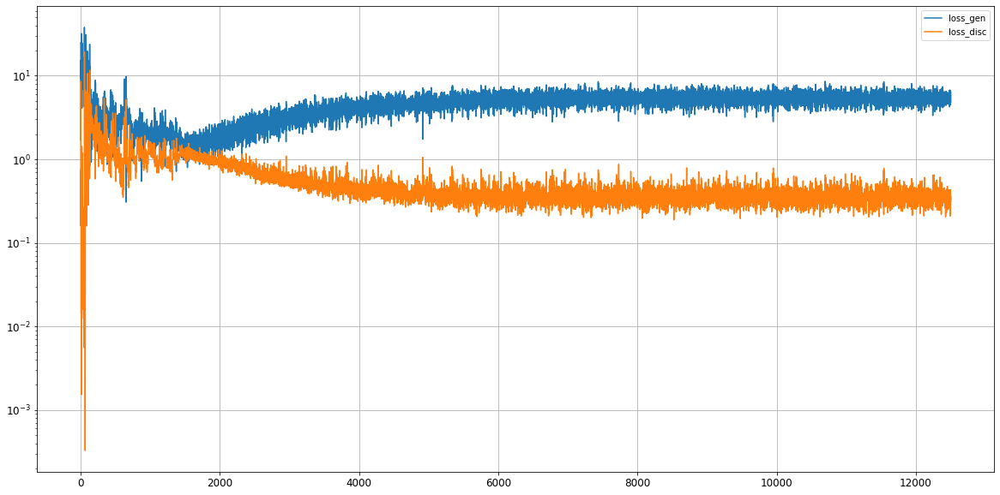

Epoch 12502/20000
0s
Epoch 12503/20000
0s
Epoch 12504/20000
0s
Epoch 12505/20000
0s
Epoch 12506/20000
0s
Epoch 12507/20000
0s
Epoch 12508/20000
0s
Epoch 12509/20000
0s
Epoch 12510/20000
0s
Epoch 12511/20000
0s
Epoch 12512/20000
0s
Epoch 12513/20000
0s
Epoch 12514/20000
0s
Epoch 12515/20000
0s
Epoch 12516/20000
0s
Epoch 12517/20000
0s
Epoch 12518/20000
0s
Epoch 12519/20000
0s
Epoch 12520/20000
0s
Epoch 12521/20000
0s
Epoch 12522/20000
0s
Epoch 12523/20000
0s
Epoch 12524/20000
0s
Epoch 12525/20000
0s
Epoch 12526/20000
0s
Epoch 12527/20000
0s
Epoch 12528/20000
0s
Epoch 12529/20000
0s
Epoch 12530/20000
0s
Epoch 12531/20000
0s
Epoch 12532/20000
0s
Epoch 12533/20000
0s
Epoch 12534/20000
0s
Epoch 12535/20000
0s
Epoch 12536/20000
0s
Epoch 12537/20000
0s
Epoch 12538/20000
0s
Epoch 12539/20000
0s
Epoch 12540/20000
0s
Epoch 12541/20000
0s
Epoch 12542/20000
0s
Epoch 12543/20000
0s
Epoch 12544/20000
0s
Epoch 12545/20000
0s
Epoch 12546/20000
0s
Epoch 12547/20000
0s
Epoch 12548/20000
0s
Epoch 12549/2

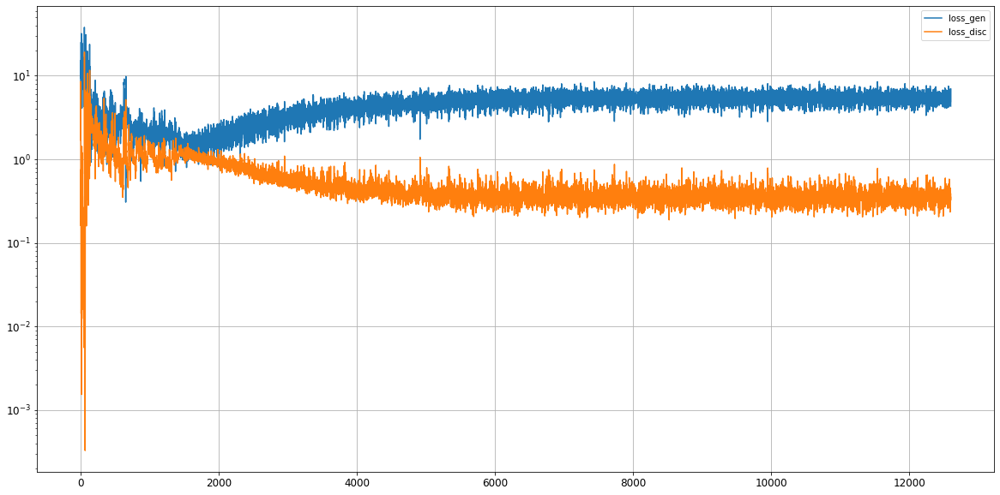

Epoch 12602/20000
0s
Epoch 12603/20000
0s
Epoch 12604/20000
0s
Epoch 12605/20000
0s
Epoch 12606/20000
0s
Epoch 12607/20000
0s
Epoch 12608/20000
0s
Epoch 12609/20000
0s
Epoch 12610/20000
0s
Epoch 12611/20000
0s
Epoch 12612/20000
0s
Epoch 12613/20000
0s
Epoch 12614/20000
0s
Epoch 12615/20000
0s
Epoch 12616/20000
0s
Epoch 12617/20000
0s
Epoch 12618/20000
0s
Epoch 12619/20000
0s
Epoch 12620/20000
0s
Epoch 12621/20000
0s
Epoch 12622/20000
0s
Epoch 12623/20000
0s
Epoch 12624/20000
0s
Epoch 12625/20000
0s
Epoch 12626/20000
0s
Epoch 12627/20000
0s
Epoch 12628/20000
0s
Epoch 12629/20000
0s
Epoch 12630/20000
0s
Epoch 12631/20000
0s
Epoch 12632/20000
0s
Epoch 12633/20000
0s
Epoch 12634/20000
0s
Epoch 12635/20000
0s
Epoch 12636/20000
0s
Epoch 12637/20000
0s
Epoch 12638/20000
0s
Epoch 12639/20000
0s
Epoch 12640/20000
0s
Epoch 12641/20000
0s
Epoch 12642/20000
0s
Epoch 12643/20000
0s
Epoch 12644/20000
0s
Epoch 12645/20000
0s
Epoch 12646/20000
0s
Epoch 12647/20000
0s
Epoch 12648/20000
0s
Epoch 12649/2

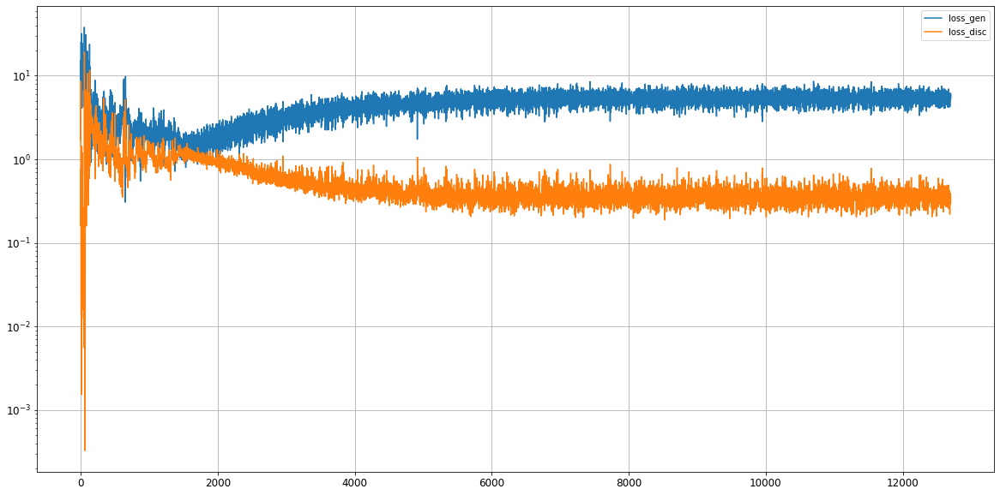

Epoch 12702/20000
0s
Epoch 12703/20000
0s
Epoch 12704/20000
0s
Epoch 12705/20000
0s
Epoch 12706/20000
0s
Epoch 12707/20000
0s
Epoch 12708/20000
0s
Epoch 12709/20000
0s
Epoch 12710/20000
0s
Epoch 12711/20000
0s
Epoch 12712/20000
0s
Epoch 12713/20000
0s
Epoch 12714/20000
0s
Epoch 12715/20000
0s
Epoch 12716/20000
0s
Epoch 12717/20000
0s
Epoch 12718/20000
0s
Epoch 12719/20000
0s
Epoch 12720/20000
0s
Epoch 12721/20000
0s
Epoch 12722/20000
0s
Epoch 12723/20000
0s
Epoch 12724/20000
0s
Epoch 12725/20000
0s
Epoch 12726/20000
0s
Epoch 12727/20000
0s
Epoch 12728/20000
0s
Epoch 12729/20000
0s
Epoch 12730/20000
0s
Epoch 12731/20000
0s
Epoch 12732/20000
0s
Epoch 12733/20000
0s
Epoch 12734/20000
0s
Epoch 12735/20000
0s
Epoch 12736/20000
0s
Epoch 12737/20000
0s
Epoch 12738/20000
0s
Epoch 12739/20000
0s
Epoch 12740/20000
0s
Epoch 12741/20000
0s
Epoch 12742/20000
0s
Epoch 12743/20000
0s
Epoch 12744/20000
0s
Epoch 12745/20000
0s
Epoch 12746/20000
0s
Epoch 12747/20000
0s
Epoch 12748/20000
0s
Epoch 12749/2

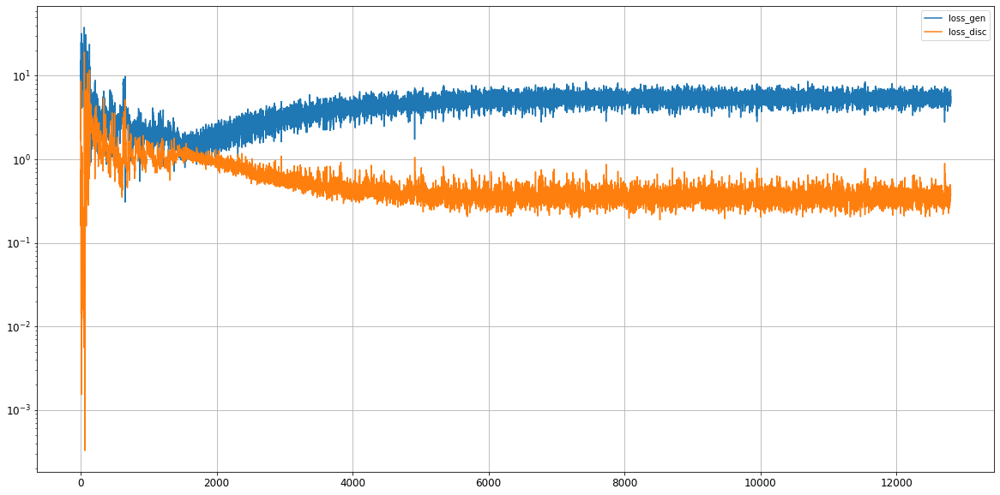

Epoch 12802/20000
0s
Epoch 12803/20000
0s
Epoch 12804/20000
0s
Epoch 12805/20000
0s
Epoch 12806/20000
0s
Epoch 12807/20000
0s
Epoch 12808/20000
0s
Epoch 12809/20000
0s
Epoch 12810/20000
0s
Epoch 12811/20000
0s
Epoch 12812/20000
0s
Epoch 12813/20000
0s
Epoch 12814/20000
0s
Epoch 12815/20000
0s
Epoch 12816/20000
0s
Epoch 12817/20000
0s
Epoch 12818/20000
0s
Epoch 12819/20000
0s
Epoch 12820/20000
0s
Epoch 12821/20000
0s
Epoch 12822/20000
0s
Epoch 12823/20000
0s
Epoch 12824/20000
0s
Epoch 12825/20000
0s
Epoch 12826/20000
0s
Epoch 12827/20000
0s
Epoch 12828/20000
0s
Epoch 12829/20000
0s
Epoch 12830/20000
0s
Epoch 12831/20000
0s
Epoch 12832/20000
0s
Epoch 12833/20000
0s
Epoch 12834/20000
0s
Epoch 12835/20000
0s
Epoch 12836/20000
0s
Epoch 12837/20000
0s
Epoch 12838/20000
0s
Epoch 12839/20000
0s
Epoch 12840/20000
0s
Epoch 12841/20000
0s
Epoch 12842/20000
0s
Epoch 12843/20000
0s
Epoch 12844/20000
0s
Epoch 12845/20000
0s
Epoch 12846/20000
0s
Epoch 12847/20000
0s
Epoch 12848/20000
0s
Epoch 12849/2

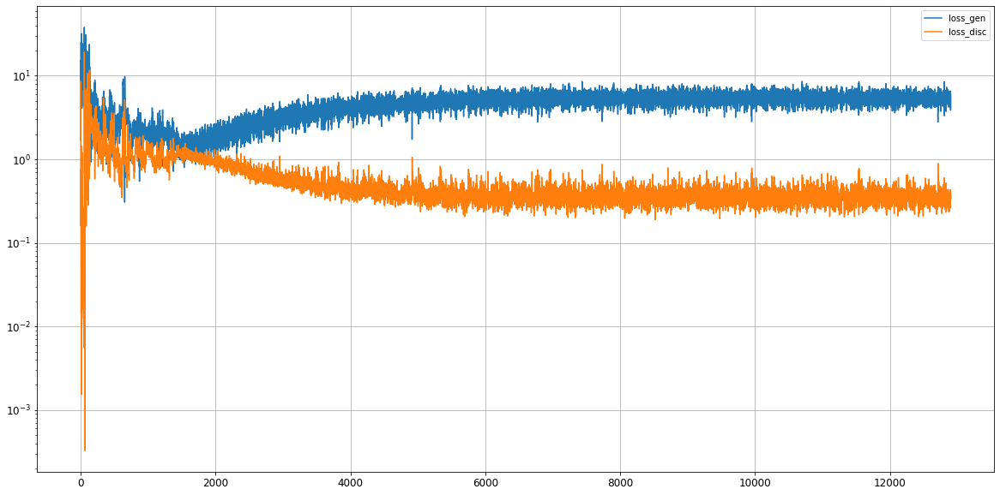

Epoch 12902/20000
0s
Epoch 12903/20000
0s
Epoch 12904/20000
0s
Epoch 12905/20000
0s
Epoch 12906/20000
0s
Epoch 12907/20000
0s
Epoch 12908/20000
0s
Epoch 12909/20000
0s
Epoch 12910/20000
0s
Epoch 12911/20000
0s
Epoch 12912/20000
0s
Epoch 12913/20000
0s
Epoch 12914/20000
0s
Epoch 12915/20000
0s
Epoch 12916/20000
0s
Epoch 12917/20000
0s
Epoch 12918/20000
0s
Epoch 12919/20000
0s
Epoch 12920/20000
0s
Epoch 12921/20000
0s
Epoch 12922/20000
0s
Epoch 12923/20000
0s
Epoch 12924/20000
0s
Epoch 12925/20000
0s
Epoch 12926/20000
0s
Epoch 12927/20000
0s
Epoch 12928/20000
0s
Epoch 12929/20000
0s
Epoch 12930/20000
0s
Epoch 12931/20000
0s
Epoch 12932/20000
0s
Epoch 12933/20000
0s
Epoch 12934/20000
0s
Epoch 12935/20000
0s
Epoch 12936/20000
0s
Epoch 12937/20000
0s
Epoch 12938/20000
0s
Epoch 12939/20000
0s
Epoch 12940/20000
0s
Epoch 12941/20000
0s
Epoch 12942/20000
0s
Epoch 12943/20000
0s
Epoch 12944/20000
0s
Epoch 12945/20000
0s
Epoch 12946/20000
0s
Epoch 12947/20000
0s
Epoch 12948/20000
0s
Epoch 12949/2

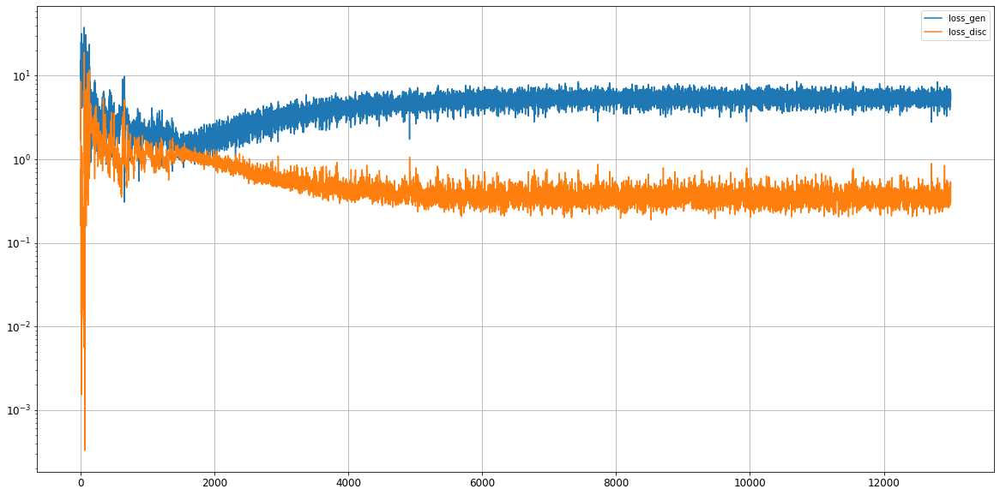

Epoch 13002/20000
0s
Epoch 13003/20000
0s
Epoch 13004/20000
0s
Epoch 13005/20000
0s
Epoch 13006/20000
0s
Epoch 13007/20000
0s
Epoch 13008/20000
0s
Epoch 13009/20000
0s
Epoch 13010/20000
0s
Epoch 13011/20000
0s
Epoch 13012/20000
0s
Epoch 13013/20000
0s
Epoch 13014/20000
0s
Epoch 13015/20000
0s
Epoch 13016/20000
0s
Epoch 13017/20000
0s
Epoch 13018/20000
0s
Epoch 13019/20000
0s
Epoch 13020/20000
0s
Epoch 13021/20000
0s
Epoch 13022/20000
0s
Epoch 13023/20000
0s
Epoch 13024/20000
0s
Epoch 13025/20000
0s
Epoch 13026/20000
0s
Epoch 13027/20000
0s
Epoch 13028/20000
0s
Epoch 13029/20000
0s
Epoch 13030/20000
0s
Epoch 13031/20000
0s
Epoch 13032/20000
0s
Epoch 13033/20000
0s
Epoch 13034/20000
0s
Epoch 13035/20000
0s
Epoch 13036/20000
0s
Epoch 13037/20000
0s
Epoch 13038/20000
0s
Epoch 13039/20000
0s
Epoch 13040/20000
0s
Epoch 13041/20000
0s
Epoch 13042/20000
0s
Epoch 13043/20000
0s
Epoch 13044/20000
0s
Epoch 13045/20000
0s
Epoch 13046/20000
0s
Epoch 13047/20000
0s
Epoch 13048/20000
0s
Epoch 13049/2

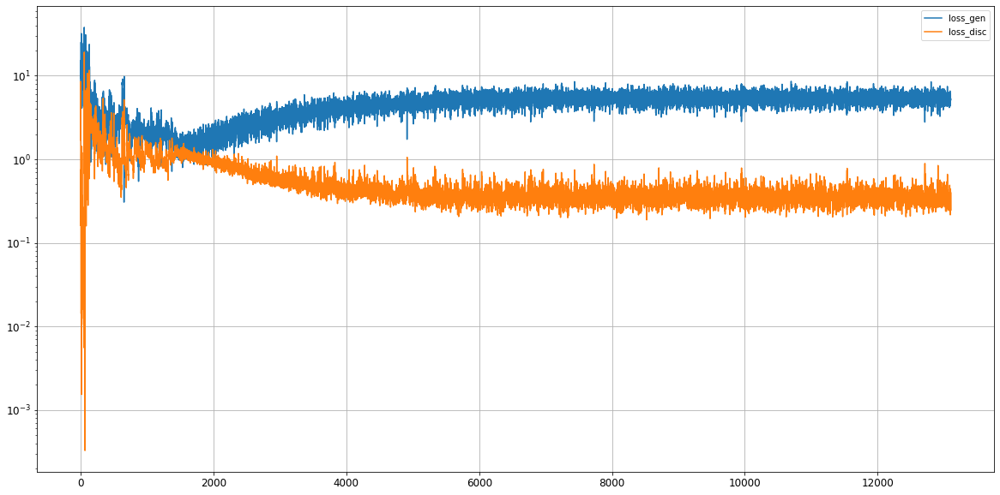

Epoch 13102/20000
0s
Epoch 13103/20000
0s
Epoch 13104/20000
0s
Epoch 13105/20000
0s
Epoch 13106/20000
0s
Epoch 13107/20000
0s
Epoch 13108/20000
0s
Epoch 13109/20000
0s
Epoch 13110/20000
0s
Epoch 13111/20000
0s
Epoch 13112/20000
0s
Epoch 13113/20000
0s
Epoch 13114/20000
0s
Epoch 13115/20000
0s
Epoch 13116/20000
0s
Epoch 13117/20000
0s
Epoch 13118/20000
0s
Epoch 13119/20000
0s
Epoch 13120/20000
0s
Epoch 13121/20000
0s
Epoch 13122/20000
0s
Epoch 13123/20000
0s
Epoch 13124/20000
0s
Epoch 13125/20000
0s
Epoch 13126/20000
0s
Epoch 13127/20000
0s
Epoch 13128/20000
0s
Epoch 13129/20000
0s
Epoch 13130/20000
0s
Epoch 13131/20000
0s
Epoch 13132/20000
0s
Epoch 13133/20000
0s
Epoch 13134/20000
0s
Epoch 13135/20000
0s
Epoch 13136/20000
0s
Epoch 13137/20000
0s
Epoch 13138/20000
0s
Epoch 13139/20000
0s
Epoch 13140/20000
0s
Epoch 13141/20000
0s
Epoch 13142/20000
0s
Epoch 13143/20000
0s
Epoch 13144/20000
0s
Epoch 13145/20000
0s
Epoch 13146/20000
0s
Epoch 13147/20000
0s
Epoch 13148/20000
0s
Epoch 13149/2

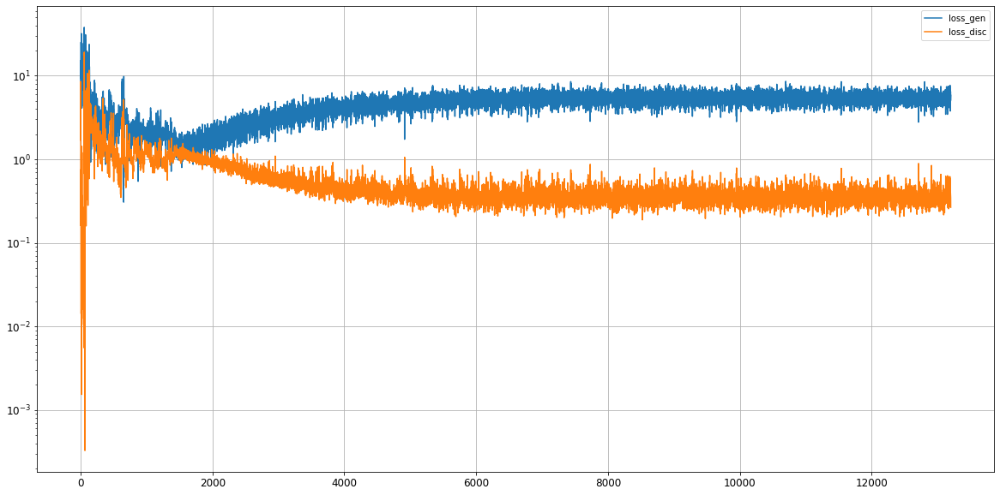

Epoch 13202/20000
0s
Epoch 13203/20000
0s
Epoch 13204/20000
0s
Epoch 13205/20000
0s
Epoch 13206/20000
0s
Epoch 13207/20000
0s
Epoch 13208/20000
0s
Epoch 13209/20000
0s
Epoch 13210/20000
0s
Epoch 13211/20000
0s
Epoch 13212/20000
0s
Epoch 13213/20000
0s
Epoch 13214/20000
0s
Epoch 13215/20000
0s
Epoch 13216/20000
0s
Epoch 13217/20000
0s
Epoch 13218/20000
0s
Epoch 13219/20000
0s
Epoch 13220/20000
0s
Epoch 13221/20000
0s
Epoch 13222/20000
0s
Epoch 13223/20000
0s
Epoch 13224/20000
0s
Epoch 13225/20000
0s
Epoch 13226/20000
0s
Epoch 13227/20000
0s
Epoch 13228/20000
0s
Epoch 13229/20000
0s
Epoch 13230/20000
0s
Epoch 13231/20000
0s
Epoch 13232/20000
0s
Epoch 13233/20000
0s
Epoch 13234/20000
0s
Epoch 13235/20000
0s
Epoch 13236/20000
0s
Epoch 13237/20000
0s
Epoch 13238/20000
0s
Epoch 13239/20000
0s
Epoch 13240/20000
0s
Epoch 13241/20000
0s
Epoch 13242/20000
0s
Epoch 13243/20000
0s
Epoch 13244/20000
0s
Epoch 13245/20000
0s
Epoch 13246/20000
0s
Epoch 13247/20000
0s
Epoch 13248/20000
0s
Epoch 13249/2

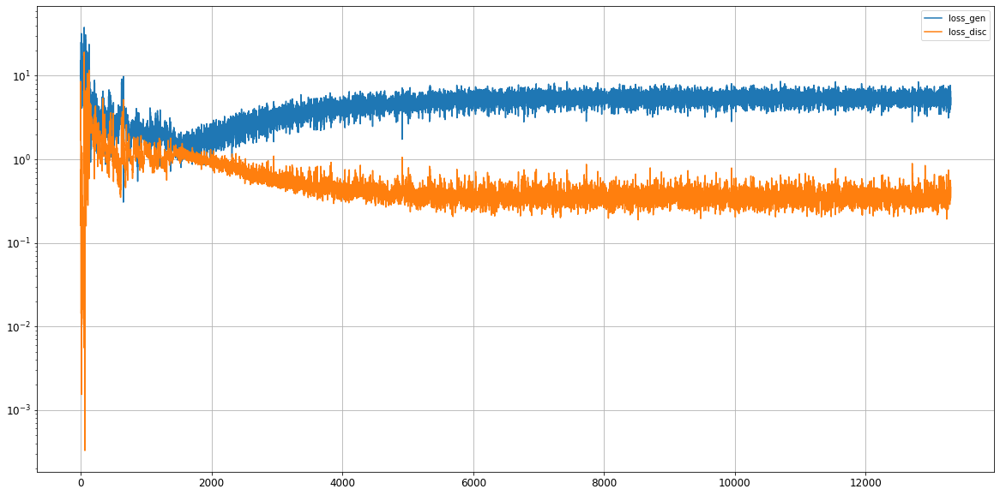

Epoch 13302/20000
0s
Epoch 13303/20000
0s
Epoch 13304/20000
0s
Epoch 13305/20000
0s
Epoch 13306/20000
0s
Epoch 13307/20000
0s
Epoch 13308/20000
0s
Epoch 13309/20000
0s
Epoch 13310/20000
0s
Epoch 13311/20000
0s
Epoch 13312/20000
0s
Epoch 13313/20000
0s
Epoch 13314/20000
0s
Epoch 13315/20000
0s
Epoch 13316/20000
0s
Epoch 13317/20000
0s
Epoch 13318/20000
0s
Epoch 13319/20000
0s
Epoch 13320/20000
0s
Epoch 13321/20000
0s
Epoch 13322/20000
0s
Epoch 13323/20000
0s
Epoch 13324/20000
0s
Epoch 13325/20000
0s
Epoch 13326/20000
0s
Epoch 13327/20000
0s
Epoch 13328/20000
0s
Epoch 13329/20000
0s
Epoch 13330/20000
0s
Epoch 13331/20000
0s
Epoch 13332/20000
0s
Epoch 13333/20000
0s
Epoch 13334/20000
0s
Epoch 13335/20000
0s
Epoch 13336/20000
0s
Epoch 13337/20000
0s
Epoch 13338/20000
0s
Epoch 13339/20000
0s
Epoch 13340/20000
0s
Epoch 13341/20000
0s
Epoch 13342/20000
0s
Epoch 13343/20000
0s
Epoch 13344/20000
0s
Epoch 13345/20000
0s
Epoch 13346/20000
0s
Epoch 13347/20000
0s
Epoch 13348/20000
0s
Epoch 13349/2

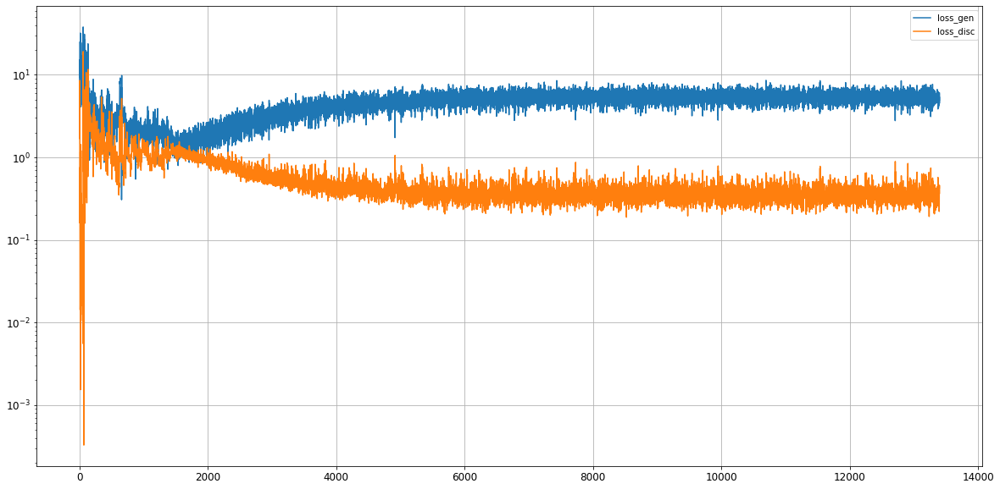

Epoch 13402/20000
0s
Epoch 13403/20000
0s
Epoch 13404/20000
0s
Epoch 13405/20000
0s
Epoch 13406/20000
0s
Epoch 13407/20000
0s
Epoch 13408/20000
0s
Epoch 13409/20000
0s
Epoch 13410/20000
0s
Epoch 13411/20000
0s
Epoch 13412/20000
0s
Epoch 13413/20000
0s
Epoch 13414/20000
0s
Epoch 13415/20000
0s
Epoch 13416/20000
0s
Epoch 13417/20000
0s
Epoch 13418/20000
0s
Epoch 13419/20000
0s
Epoch 13420/20000
0s
Epoch 13421/20000
0s
Epoch 13422/20000
0s
Epoch 13423/20000
0s
Epoch 13424/20000
0s
Epoch 13425/20000
0s
Epoch 13426/20000
0s
Epoch 13427/20000
0s
Epoch 13428/20000
0s
Epoch 13429/20000
0s
Epoch 13430/20000
0s
Epoch 13431/20000
0s
Epoch 13432/20000
0s
Epoch 13433/20000
0s
Epoch 13434/20000
0s
Epoch 13435/20000
0s
Epoch 13436/20000
0s
Epoch 13437/20000
0s
Epoch 13438/20000
0s
Epoch 13439/20000
0s
Epoch 13440/20000
0s
Epoch 13441/20000
0s
Epoch 13442/20000
0s
Epoch 13443/20000
0s
Epoch 13444/20000
0s
Epoch 13445/20000
0s
Epoch 13446/20000
0s
Epoch 13447/20000
0s
Epoch 13448/20000
0s
Epoch 13449/2

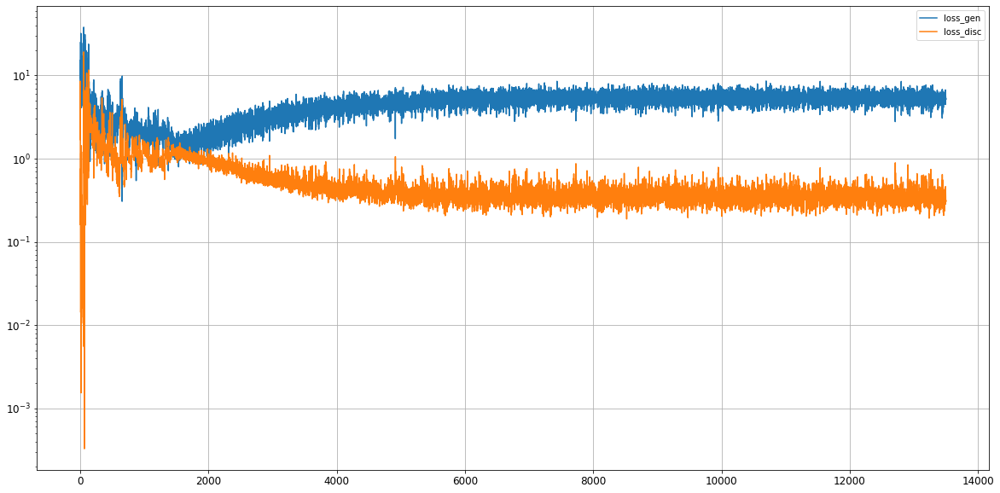

Epoch 13502/20000
0s
Epoch 13503/20000
0s
Epoch 13504/20000
0s
Epoch 13505/20000
0s
Epoch 13506/20000
0s
Epoch 13507/20000
0s
Epoch 13508/20000
0s
Epoch 13509/20000
0s
Epoch 13510/20000
0s
Epoch 13511/20000
0s
Epoch 13512/20000
0s
Epoch 13513/20000
0s
Epoch 13514/20000
0s
Epoch 13515/20000
0s
Epoch 13516/20000
0s
Epoch 13517/20000
0s
Epoch 13518/20000
0s
Epoch 13519/20000
0s
Epoch 13520/20000
0s
Epoch 13521/20000
0s
Epoch 13522/20000
0s
Epoch 13523/20000
0s
Epoch 13524/20000
0s
Epoch 13525/20000
0s
Epoch 13526/20000
0s
Epoch 13527/20000
0s
Epoch 13528/20000
0s
Epoch 13529/20000
0s
Epoch 13530/20000
0s
Epoch 13531/20000
0s
Epoch 13532/20000
0s
Epoch 13533/20000
0s
Epoch 13534/20000
0s
Epoch 13535/20000
0s
Epoch 13536/20000
0s
Epoch 13537/20000
0s
Epoch 13538/20000
0s
Epoch 13539/20000
0s
Epoch 13540/20000
0s
Epoch 13541/20000
0s
Epoch 13542/20000
0s
Epoch 13543/20000
0s
Epoch 13544/20000
0s
Epoch 13545/20000
0s
Epoch 13546/20000
0s
Epoch 13547/20000
0s
Epoch 13548/20000
0s
Epoch 13549/2

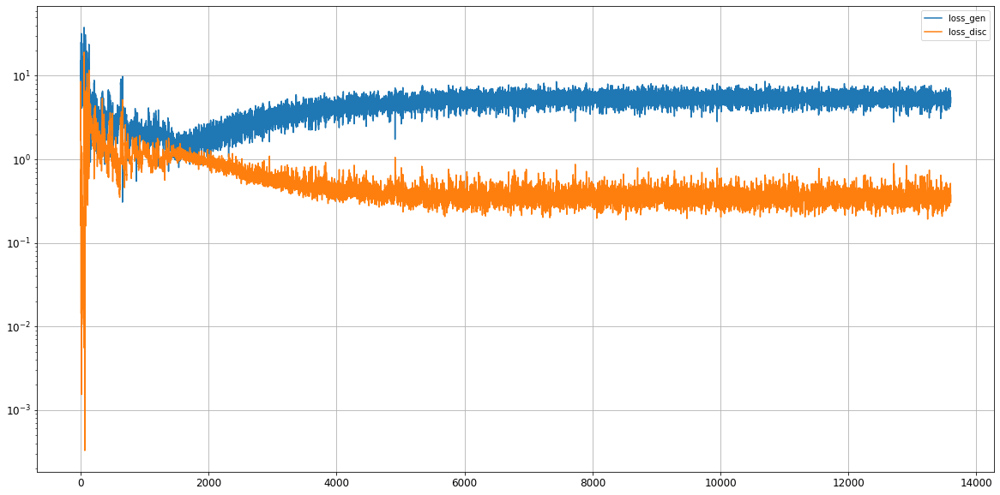

Epoch 13602/20000
0s
Epoch 13603/20000
0s
Epoch 13604/20000
0s
Epoch 13605/20000
0s
Epoch 13606/20000
0s
Epoch 13607/20000
0s
Epoch 13608/20000
0s
Epoch 13609/20000
0s
Epoch 13610/20000
0s
Epoch 13611/20000
0s
Epoch 13612/20000
0s
Epoch 13613/20000
0s
Epoch 13614/20000
0s
Epoch 13615/20000
0s
Epoch 13616/20000
0s
Epoch 13617/20000
0s
Epoch 13618/20000
0s
Epoch 13619/20000
0s
Epoch 13620/20000
0s
Epoch 13621/20000
0s
Epoch 13622/20000
0s
Epoch 13623/20000
0s
Epoch 13624/20000
0s
Epoch 13625/20000
0s
Epoch 13626/20000
0s
Epoch 13627/20000
0s
Epoch 13628/20000
0s
Epoch 13629/20000
0s
Epoch 13630/20000
0s
Epoch 13631/20000
0s
Epoch 13632/20000
0s
Epoch 13633/20000
0s
Epoch 13634/20000
0s
Epoch 13635/20000
0s
Epoch 13636/20000
0s
Epoch 13637/20000
0s
Epoch 13638/20000
0s
Epoch 13639/20000
0s
Epoch 13640/20000
0s
Epoch 13641/20000
0s
Epoch 13642/20000
0s
Epoch 13643/20000
0s
Epoch 13644/20000
0s
Epoch 13645/20000
0s
Epoch 13646/20000
0s
Epoch 13647/20000
0s
Epoch 13648/20000
0s
Epoch 13649/2

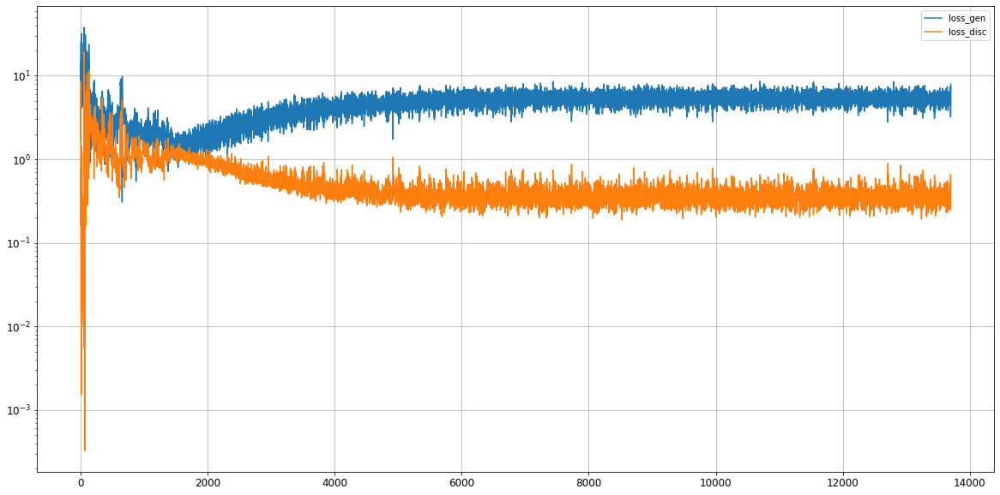

Epoch 13702/20000
0s
Epoch 13703/20000
0s
Epoch 13704/20000
0s
Epoch 13705/20000
0s
Epoch 13706/20000
0s
Epoch 13707/20000
0s
Epoch 13708/20000
0s
Epoch 13709/20000
0s
Epoch 13710/20000
0s
Epoch 13711/20000
0s
Epoch 13712/20000
0s
Epoch 13713/20000
0s
Epoch 13714/20000
0s
Epoch 13715/20000
0s
Epoch 13716/20000
0s
Epoch 13717/20000
0s
Epoch 13718/20000
0s
Epoch 13719/20000
0s
Epoch 13720/20000
0s
Epoch 13721/20000
0s
Epoch 13722/20000
0s
Epoch 13723/20000
0s
Epoch 13724/20000
0s
Epoch 13725/20000
0s
Epoch 13726/20000
0s
Epoch 13727/20000
0s
Epoch 13728/20000
0s
Epoch 13729/20000
0s
Epoch 13730/20000
0s
Epoch 13731/20000
0s
Epoch 13732/20000
0s
Epoch 13733/20000
0s
Epoch 13734/20000
0s
Epoch 13735/20000
0s
Epoch 13736/20000
0s
Epoch 13737/20000
0s
Epoch 13738/20000
0s
Epoch 13739/20000
0s
Epoch 13740/20000
0s
Epoch 13741/20000
0s
Epoch 13742/20000
0s
Epoch 13743/20000
0s
Epoch 13744/20000
0s
Epoch 13745/20000
0s
Epoch 13746/20000
0s
Epoch 13747/20000
0s
Epoch 13748/20000
0s
Epoch 13749/2

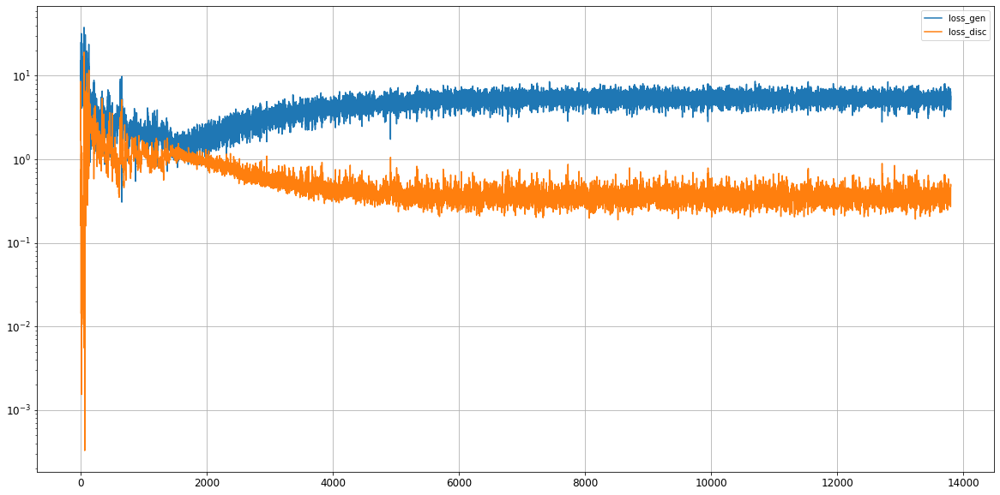

Epoch 13802/20000
0s
Epoch 13803/20000
0s
Epoch 13804/20000
0s
Epoch 13805/20000
0s
Epoch 13806/20000
0s
Epoch 13807/20000
0s
Epoch 13808/20000
0s
Epoch 13809/20000
0s
Epoch 13810/20000
0s
Epoch 13811/20000
0s
Epoch 13812/20000
0s
Epoch 13813/20000
0s
Epoch 13814/20000
0s
Epoch 13815/20000
0s
Epoch 13816/20000
0s
Epoch 13817/20000
0s
Epoch 13818/20000
0s
Epoch 13819/20000
0s
Epoch 13820/20000
0s
Epoch 13821/20000
0s
Epoch 13822/20000
0s
Epoch 13823/20000
0s
Epoch 13824/20000
0s
Epoch 13825/20000
0s
Epoch 13826/20000
0s
Epoch 13827/20000
0s
Epoch 13828/20000
0s
Epoch 13829/20000
0s
Epoch 13830/20000
0s
Epoch 13831/20000
0s
Epoch 13832/20000
0s
Epoch 13833/20000
0s
Epoch 13834/20000
0s
Epoch 13835/20000
0s
Epoch 13836/20000
0s
Epoch 13837/20000
0s
Epoch 13838/20000
0s
Epoch 13839/20000
0s
Epoch 13840/20000
0s
Epoch 13841/20000
0s
Epoch 13842/20000
0s
Epoch 13843/20000
0s
Epoch 13844/20000
0s
Epoch 13845/20000
0s
Epoch 13846/20000
0s
Epoch 13847/20000
0s
Epoch 13848/20000
0s
Epoch 13849/2

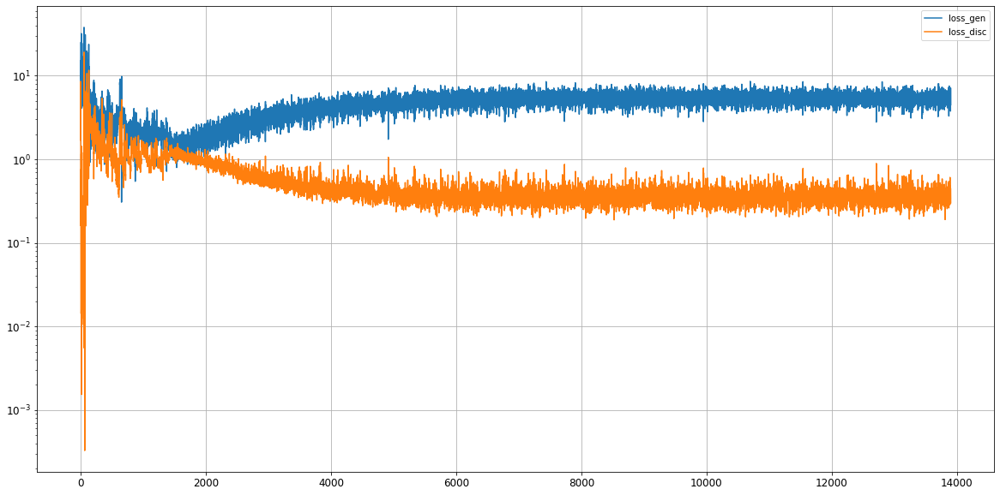

Epoch 13902/20000
0s
Epoch 13903/20000
0s
Epoch 13904/20000
0s
Epoch 13905/20000
0s
Epoch 13906/20000
0s
Epoch 13907/20000
0s
Epoch 13908/20000
0s
Epoch 13909/20000
0s
Epoch 13910/20000
0s
Epoch 13911/20000
0s
Epoch 13912/20000
0s
Epoch 13913/20000
0s
Epoch 13914/20000
0s
Epoch 13915/20000
0s
Epoch 13916/20000
0s
Epoch 13917/20000
0s
Epoch 13918/20000
0s
Epoch 13919/20000
0s
Epoch 13920/20000
0s
Epoch 13921/20000
0s
Epoch 13922/20000
0s
Epoch 13923/20000
0s
Epoch 13924/20000
0s
Epoch 13925/20000
0s
Epoch 13926/20000
0s
Epoch 13927/20000
0s
Epoch 13928/20000
0s
Epoch 13929/20000
0s
Epoch 13930/20000
0s
Epoch 13931/20000
0s
Epoch 13932/20000
0s
Epoch 13933/20000
0s
Epoch 13934/20000
0s
Epoch 13935/20000
0s
Epoch 13936/20000
0s
Epoch 13937/20000
0s
Epoch 13938/20000
0s
Epoch 13939/20000
0s
Epoch 13940/20000
0s
Epoch 13941/20000
0s
Epoch 13942/20000
0s
Epoch 13943/20000
0s
Epoch 13944/20000
0s
Epoch 13945/20000
0s
Epoch 13946/20000
0s
Epoch 13947/20000
0s
Epoch 13948/20000
0s
Epoch 13949/2

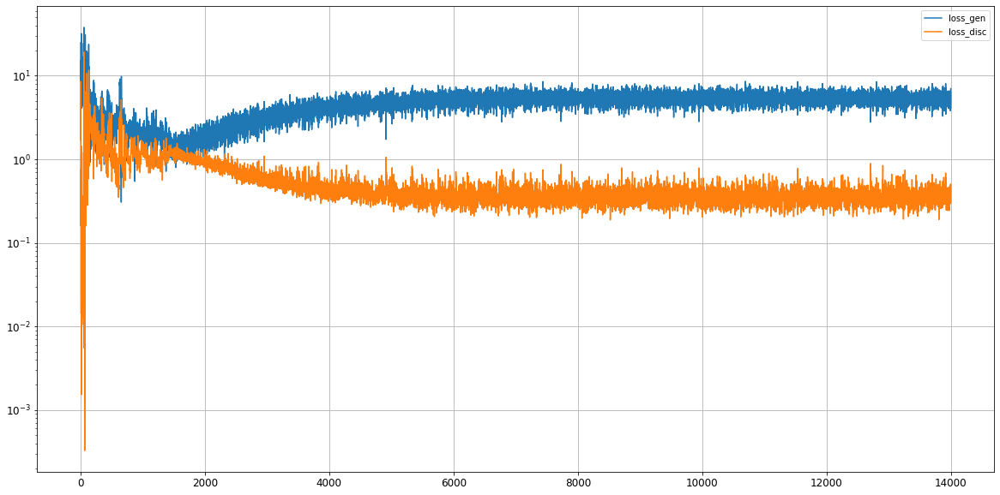

Epoch 14002/20000
0s
Epoch 14003/20000
0s
Epoch 14004/20000
0s
Epoch 14005/20000
0s
Epoch 14006/20000
0s
Epoch 14007/20000
0s
Epoch 14008/20000
0s
Epoch 14009/20000
0s
Epoch 14010/20000
0s
Epoch 14011/20000
0s
Epoch 14012/20000
0s
Epoch 14013/20000
0s
Epoch 14014/20000
0s
Epoch 14015/20000
0s
Epoch 14016/20000
0s
Epoch 14017/20000
0s
Epoch 14018/20000
0s
Epoch 14019/20000
0s
Epoch 14020/20000
0s
Epoch 14021/20000
0s
Epoch 14022/20000
0s
Epoch 14023/20000
0s
Epoch 14024/20000
0s
Epoch 14025/20000
0s
Epoch 14026/20000
0s
Epoch 14027/20000
0s
Epoch 14028/20000
0s
Epoch 14029/20000
0s
Epoch 14030/20000
0s
Epoch 14031/20000
0s
Epoch 14032/20000
0s
Epoch 14033/20000
0s
Epoch 14034/20000
0s
Epoch 14035/20000
0s
Epoch 14036/20000
0s
Epoch 14037/20000
0s
Epoch 14038/20000
0s
Epoch 14039/20000
0s
Epoch 14040/20000
0s
Epoch 14041/20000
0s
Epoch 14042/20000
0s
Epoch 14043/20000
0s
Epoch 14044/20000
0s
Epoch 14045/20000
0s
Epoch 14046/20000
0s
Epoch 14047/20000
0s
Epoch 14048/20000
0s
Epoch 14049/2

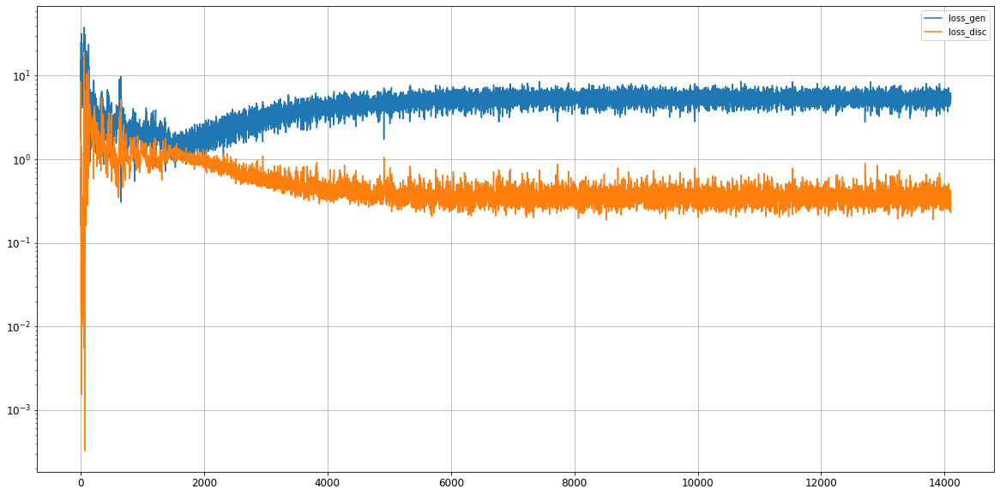

Epoch 14102/20000
0s
Epoch 14103/20000
0s
Epoch 14104/20000
0s
Epoch 14105/20000
0s
Epoch 14106/20000
0s
Epoch 14107/20000
0s
Epoch 14108/20000
0s
Epoch 14109/20000
0s
Epoch 14110/20000
0s
Epoch 14111/20000
0s
Epoch 14112/20000
0s
Epoch 14113/20000
0s
Epoch 14114/20000
0s
Epoch 14115/20000
0s
Epoch 14116/20000
0s
Epoch 14117/20000
0s
Epoch 14118/20000
0s
Epoch 14119/20000
0s
Epoch 14120/20000
0s
Epoch 14121/20000
0s
Epoch 14122/20000
0s
Epoch 14123/20000
0s
Epoch 14124/20000
0s
Epoch 14125/20000
0s
Epoch 14126/20000
0s
Epoch 14127/20000
0s
Epoch 14128/20000
0s
Epoch 14129/20000
0s
Epoch 14130/20000
0s
Epoch 14131/20000
0s
Epoch 14132/20000
0s
Epoch 14133/20000
0s
Epoch 14134/20000
0s
Epoch 14135/20000
0s
Epoch 14136/20000
0s
Epoch 14137/20000
0s
Epoch 14138/20000
0s
Epoch 14139/20000
0s
Epoch 14140/20000
0s
Epoch 14141/20000
0s
Epoch 14142/20000
0s
Epoch 14143/20000
0s
Epoch 14144/20000
0s
Epoch 14145/20000
0s
Epoch 14146/20000
0s
Epoch 14147/20000
0s
Epoch 14148/20000
0s
Epoch 14149/2

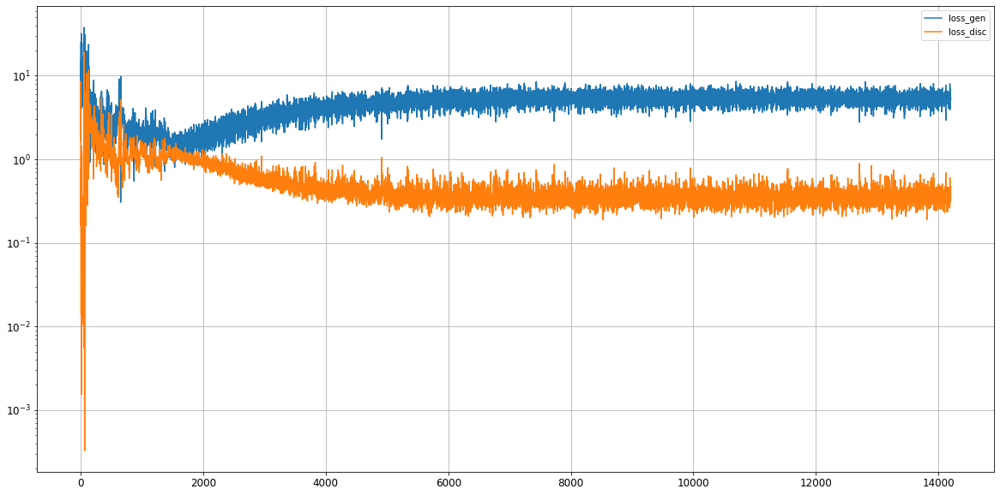

Epoch 14202/20000
0s
Epoch 14203/20000
0s
Epoch 14204/20000
0s
Epoch 14205/20000
0s
Epoch 14206/20000
0s
Epoch 14207/20000
0s
Epoch 14208/20000
0s
Epoch 14209/20000
0s
Epoch 14210/20000
0s
Epoch 14211/20000
0s
Epoch 14212/20000
0s
Epoch 14213/20000
0s
Epoch 14214/20000
0s
Epoch 14215/20000
0s
Epoch 14216/20000
0s
Epoch 14217/20000
0s
Epoch 14218/20000
0s
Epoch 14219/20000
0s
Epoch 14220/20000
0s
Epoch 14221/20000
0s
Epoch 14222/20000
0s
Epoch 14223/20000
0s
Epoch 14224/20000
0s
Epoch 14225/20000
0s
Epoch 14226/20000
0s
Epoch 14227/20000
0s
Epoch 14228/20000
0s
Epoch 14229/20000
0s
Epoch 14230/20000
0s
Epoch 14231/20000
0s
Epoch 14232/20000
0s
Epoch 14233/20000
0s
Epoch 14234/20000
0s
Epoch 14235/20000
0s
Epoch 14236/20000
0s
Epoch 14237/20000
0s
Epoch 14238/20000
0s
Epoch 14239/20000
0s
Epoch 14240/20000
0s
Epoch 14241/20000
0s
Epoch 14242/20000
0s
Epoch 14243/20000
0s
Epoch 14244/20000
0s
Epoch 14245/20000
0s
Epoch 14246/20000
0s
Epoch 14247/20000
0s
Epoch 14248/20000
0s
Epoch 14249/2

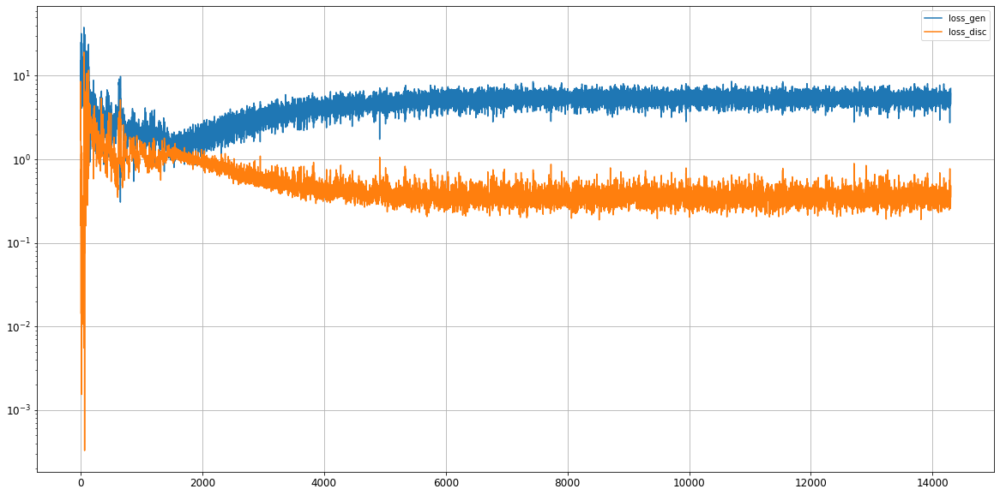

Epoch 14302/20000
0s
Epoch 14303/20000
0s
Epoch 14304/20000
0s
Epoch 14305/20000
0s
Epoch 14306/20000
0s
Epoch 14307/20000
0s
Epoch 14308/20000
0s
Epoch 14309/20000
0s
Epoch 14310/20000
0s
Epoch 14311/20000
0s
Epoch 14312/20000
0s
Epoch 14313/20000
0s
Epoch 14314/20000
0s
Epoch 14315/20000
0s
Epoch 14316/20000
0s
Epoch 14317/20000
0s
Epoch 14318/20000
0s
Epoch 14319/20000
0s
Epoch 14320/20000
0s
Epoch 14321/20000
0s
Epoch 14322/20000
0s
Epoch 14323/20000
0s
Epoch 14324/20000
0s
Epoch 14325/20000
0s
Epoch 14326/20000
0s
Epoch 14327/20000
0s
Epoch 14328/20000
0s
Epoch 14329/20000
0s
Epoch 14330/20000
0s
Epoch 14331/20000
0s
Epoch 14332/20000
0s
Epoch 14333/20000
0s
Epoch 14334/20000
0s
Epoch 14335/20000
0s
Epoch 14336/20000
0s
Epoch 14337/20000
0s
Epoch 14338/20000
0s
Epoch 14339/20000
0s
Epoch 14340/20000
0s
Epoch 14341/20000
0s
Epoch 14342/20000
0s
Epoch 14343/20000
0s
Epoch 14344/20000
0s
Epoch 14345/20000
0s
Epoch 14346/20000
0s
Epoch 14347/20000
0s
Epoch 14348/20000
0s
Epoch 14349/2

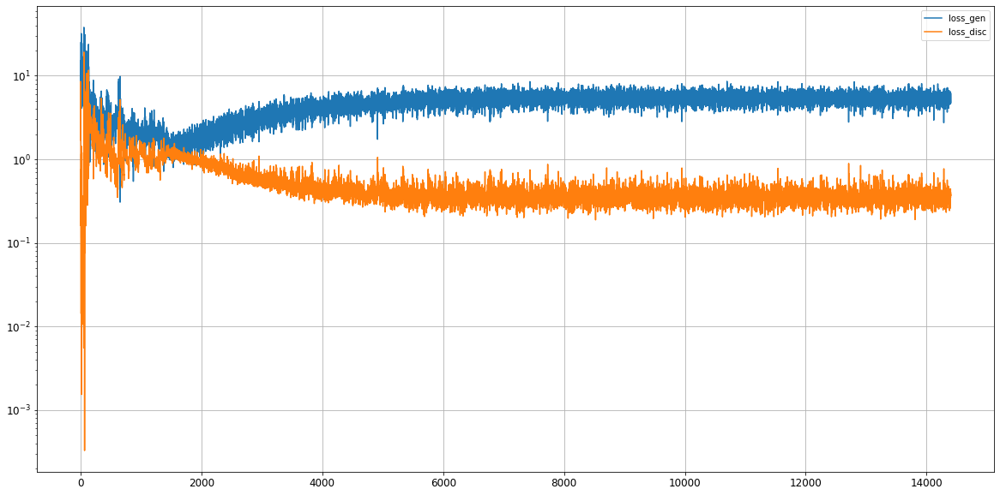

Epoch 14402/20000
0s
Epoch 14403/20000
0s
Epoch 14404/20000
0s
Epoch 14405/20000
0s
Epoch 14406/20000
0s
Epoch 14407/20000
0s
Epoch 14408/20000
0s
Epoch 14409/20000
0s
Epoch 14410/20000
0s
Epoch 14411/20000
0s
Epoch 14412/20000
0s
Epoch 14413/20000
0s
Epoch 14414/20000
0s
Epoch 14415/20000
0s
Epoch 14416/20000
0s
Epoch 14417/20000
0s
Epoch 14418/20000
0s
Epoch 14419/20000
0s
Epoch 14420/20000
0s
Epoch 14421/20000
0s
Epoch 14422/20000
0s
Epoch 14423/20000
0s
Epoch 14424/20000
0s
Epoch 14425/20000
0s
Epoch 14426/20000
0s
Epoch 14427/20000
0s
Epoch 14428/20000
0s
Epoch 14429/20000
0s
Epoch 14430/20000
0s
Epoch 14431/20000
0s
Epoch 14432/20000
0s
Epoch 14433/20000
0s
Epoch 14434/20000
0s
Epoch 14435/20000
0s
Epoch 14436/20000
0s
Epoch 14437/20000
0s
Epoch 14438/20000
0s
Epoch 14439/20000
0s
Epoch 14440/20000
0s
Epoch 14441/20000
0s
Epoch 14442/20000
0s
Epoch 14443/20000
0s
Epoch 14444/20000
0s
Epoch 14445/20000
0s
Epoch 14446/20000
0s
Epoch 14447/20000
0s
Epoch 14448/20000
0s
Epoch 14449/2

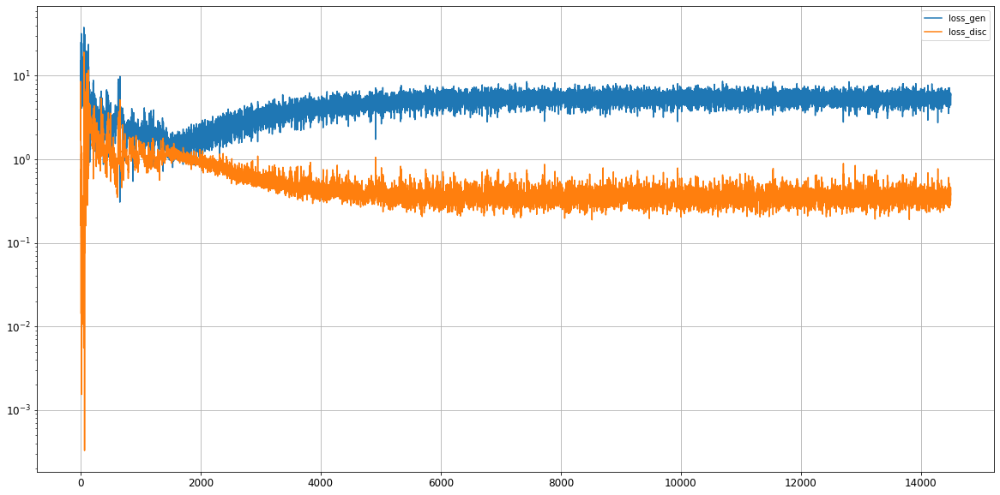

Epoch 14502/20000
0s
Epoch 14503/20000
0s
Epoch 14504/20000
0s
Epoch 14505/20000
0s
Epoch 14506/20000
0s
Epoch 14507/20000
0s
Epoch 14508/20000
0s
Epoch 14509/20000
0s
Epoch 14510/20000
0s
Epoch 14511/20000
0s
Epoch 14512/20000
0s
Epoch 14513/20000
0s
Epoch 14514/20000
0s
Epoch 14515/20000
0s
Epoch 14516/20000
0s
Epoch 14517/20000
0s
Epoch 14518/20000
0s
Epoch 14519/20000
0s
Epoch 14520/20000
0s
Epoch 14521/20000
0s
Epoch 14522/20000
0s
Epoch 14523/20000
0s
Epoch 14524/20000
0s
Epoch 14525/20000
0s
Epoch 14526/20000
0s
Epoch 14527/20000
0s
Epoch 14528/20000
0s
Epoch 14529/20000
0s
Epoch 14530/20000
0s
Epoch 14531/20000
0s
Epoch 14532/20000
0s
Epoch 14533/20000
0s
Epoch 14534/20000
0s
Epoch 14535/20000
0s
Epoch 14536/20000
0s
Epoch 14537/20000
0s
Epoch 14538/20000
0s
Epoch 14539/20000
0s
Epoch 14540/20000
0s
Epoch 14541/20000
0s
Epoch 14542/20000
0s
Epoch 14543/20000
0s
Epoch 14544/20000
0s
Epoch 14545/20000
0s
Epoch 14546/20000
0s
Epoch 14547/20000
0s
Epoch 14548/20000
0s
Epoch 14549/2

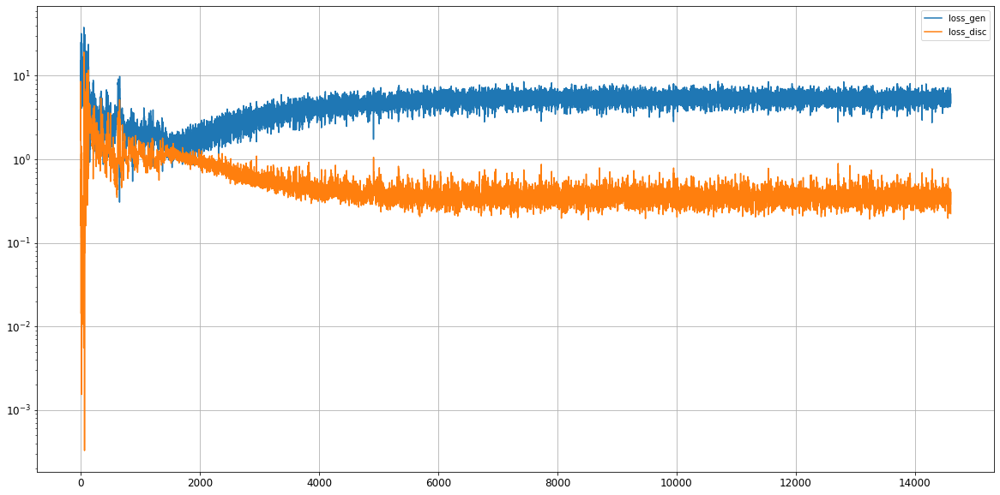

Epoch 14602/20000
0s
Epoch 14603/20000
0s
Epoch 14604/20000
0s
Epoch 14605/20000
0s
Epoch 14606/20000
0s
Epoch 14607/20000
0s
Epoch 14608/20000
0s
Epoch 14609/20000
0s
Epoch 14610/20000
0s
Epoch 14611/20000
0s
Epoch 14612/20000
0s
Epoch 14613/20000
0s
Epoch 14614/20000
0s
Epoch 14615/20000
0s
Epoch 14616/20000
0s
Epoch 14617/20000
0s
Epoch 14618/20000
0s
Epoch 14619/20000
0s
Epoch 14620/20000
0s
Epoch 14621/20000
0s
Epoch 14622/20000
0s
Epoch 14623/20000
0s
Epoch 14624/20000
0s
Epoch 14625/20000
0s
Epoch 14626/20000
0s
Epoch 14627/20000
0s
Epoch 14628/20000
0s
Epoch 14629/20000
0s
Epoch 14630/20000
0s
Epoch 14631/20000
0s
Epoch 14632/20000
0s
Epoch 14633/20000
0s
Epoch 14634/20000
0s
Epoch 14635/20000
0s
Epoch 14636/20000
0s
Epoch 14637/20000
0s
Epoch 14638/20000
0s
Epoch 14639/20000
0s
Epoch 14640/20000
0s
Epoch 14641/20000
0s
Epoch 14642/20000
0s
Epoch 14643/20000
0s
Epoch 14644/20000
0s
Epoch 14645/20000
0s
Epoch 14646/20000
0s
Epoch 14647/20000
0s
Epoch 14648/20000
0s
Epoch 14649/2

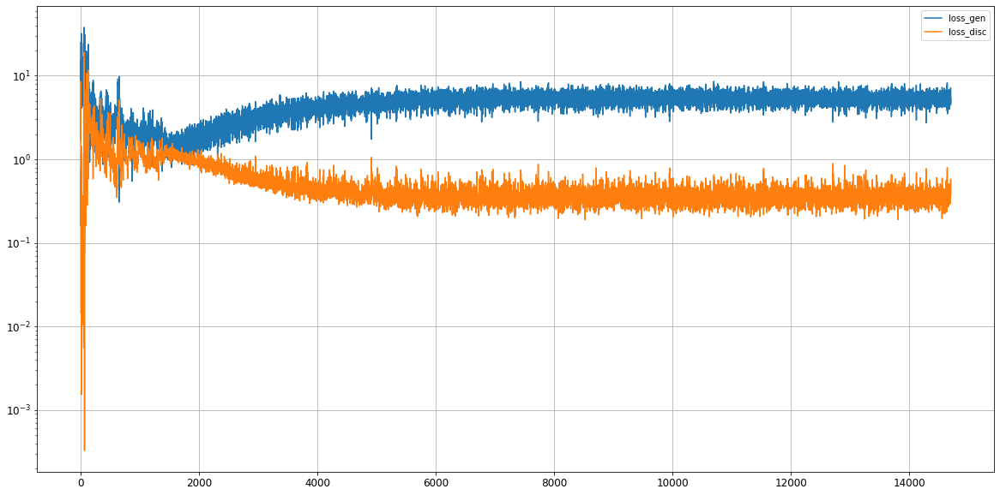

Epoch 14702/20000
0s
Epoch 14703/20000
0s
Epoch 14704/20000
0s
Epoch 14705/20000
0s
Epoch 14706/20000
0s
Epoch 14707/20000
0s
Epoch 14708/20000
0s
Epoch 14709/20000
0s
Epoch 14710/20000
0s
Epoch 14711/20000
0s
Epoch 14712/20000
0s
Epoch 14713/20000
0s
Epoch 14714/20000
0s
Epoch 14715/20000
0s
Epoch 14716/20000
0s
Epoch 14717/20000
0s
Epoch 14718/20000
0s
Epoch 14719/20000
0s
Epoch 14720/20000
0s
Epoch 14721/20000
0s
Epoch 14722/20000
0s
Epoch 14723/20000
0s
Epoch 14724/20000
0s
Epoch 14725/20000
0s
Epoch 14726/20000
0s
Epoch 14727/20000
0s
Epoch 14728/20000
0s
Epoch 14729/20000
0s
Epoch 14730/20000
0s
Epoch 14731/20000
0s
Epoch 14732/20000
0s
Epoch 14733/20000
0s
Epoch 14734/20000
0s
Epoch 14735/20000
0s
Epoch 14736/20000
0s
Epoch 14737/20000
0s
Epoch 14738/20000
0s
Epoch 14739/20000
0s
Epoch 14740/20000
0s
Epoch 14741/20000
0s
Epoch 14742/20000
0s
Epoch 14743/20000
0s
Epoch 14744/20000
0s
Epoch 14745/20000
0s
Epoch 14746/20000
0s
Epoch 14747/20000
0s
Epoch 14748/20000
0s
Epoch 14749/2

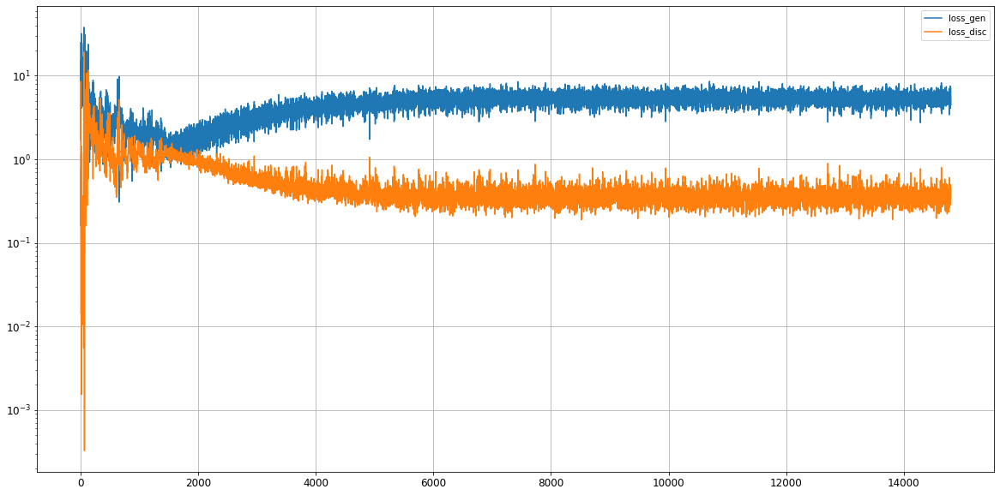

Epoch 14802/20000
0s
Epoch 14803/20000
0s
Epoch 14804/20000
0s
Epoch 14805/20000
0s
Epoch 14806/20000
0s
Epoch 14807/20000
0s
Epoch 14808/20000
0s
Epoch 14809/20000
0s
Epoch 14810/20000
0s
Epoch 14811/20000
0s
Epoch 14812/20000
0s
Epoch 14813/20000
0s
Epoch 14814/20000
0s
Epoch 14815/20000
0s
Epoch 14816/20000
0s
Epoch 14817/20000
0s
Epoch 14818/20000
0s
Epoch 14819/20000
0s
Epoch 14820/20000
0s
Epoch 14821/20000
0s
Epoch 14822/20000
0s
Epoch 14823/20000
0s
Epoch 14824/20000
0s
Epoch 14825/20000
0s
Epoch 14826/20000
0s
Epoch 14827/20000
0s
Epoch 14828/20000
0s
Epoch 14829/20000
0s
Epoch 14830/20000
0s
Epoch 14831/20000
0s
Epoch 14832/20000
0s
Epoch 14833/20000
0s
Epoch 14834/20000
0s
Epoch 14835/20000
0s
Epoch 14836/20000
0s
Epoch 14837/20000
0s
Epoch 14838/20000
0s
Epoch 14839/20000
0s
Epoch 14840/20000
0s
Epoch 14841/20000
0s
Epoch 14842/20000
0s
Epoch 14843/20000
0s
Epoch 14844/20000
0s
Epoch 14845/20000
0s
Epoch 14846/20000
0s
Epoch 14847/20000
0s
Epoch 14848/20000
0s
Epoch 14849/2

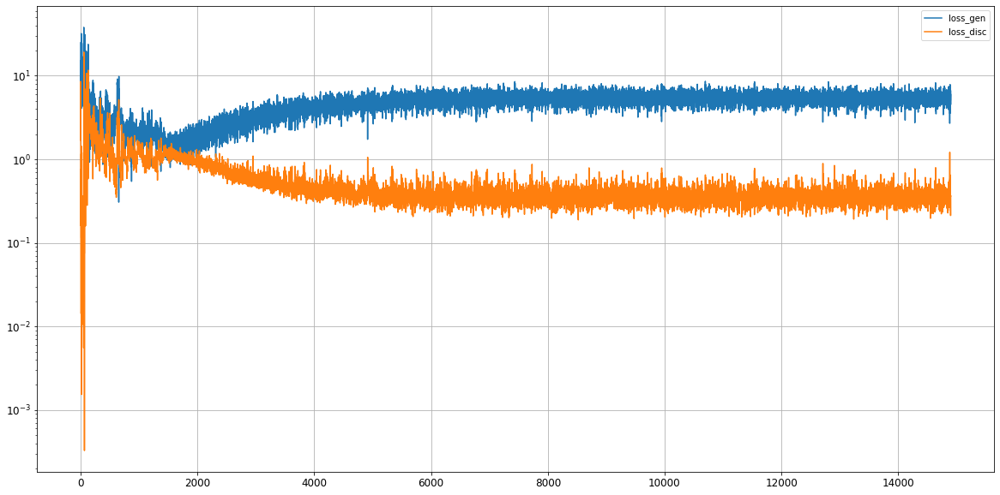

Epoch 14902/20000
0s
Epoch 14903/20000
0s
Epoch 14904/20000
0s
Epoch 14905/20000
0s
Epoch 14906/20000
0s
Epoch 14907/20000
0s
Epoch 14908/20000
0s
Epoch 14909/20000
0s
Epoch 14910/20000
0s
Epoch 14911/20000
0s
Epoch 14912/20000
0s
Epoch 14913/20000
0s
Epoch 14914/20000
0s
Epoch 14915/20000
0s
Epoch 14916/20000
0s
Epoch 14917/20000
0s
Epoch 14918/20000
0s
Epoch 14919/20000
0s
Epoch 14920/20000
0s
Epoch 14921/20000
0s
Epoch 14922/20000
0s
Epoch 14923/20000
0s
Epoch 14924/20000
0s
Epoch 14925/20000
0s
Epoch 14926/20000
0s
Epoch 14927/20000
0s
Epoch 14928/20000
0s
Epoch 14929/20000
0s
Epoch 14930/20000
0s
Epoch 14931/20000
0s
Epoch 14932/20000
0s
Epoch 14933/20000
0s
Epoch 14934/20000
0s
Epoch 14935/20000
0s
Epoch 14936/20000
0s
Epoch 14937/20000
0s
Epoch 14938/20000
0s
Epoch 14939/20000
0s
Epoch 14940/20000
0s
Epoch 14941/20000
0s
Epoch 14942/20000
0s
Epoch 14943/20000
0s
Epoch 14944/20000
0s
Epoch 14945/20000
0s
Epoch 14946/20000
0s
Epoch 14947/20000
0s
Epoch 14948/20000
0s
Epoch 14949/2

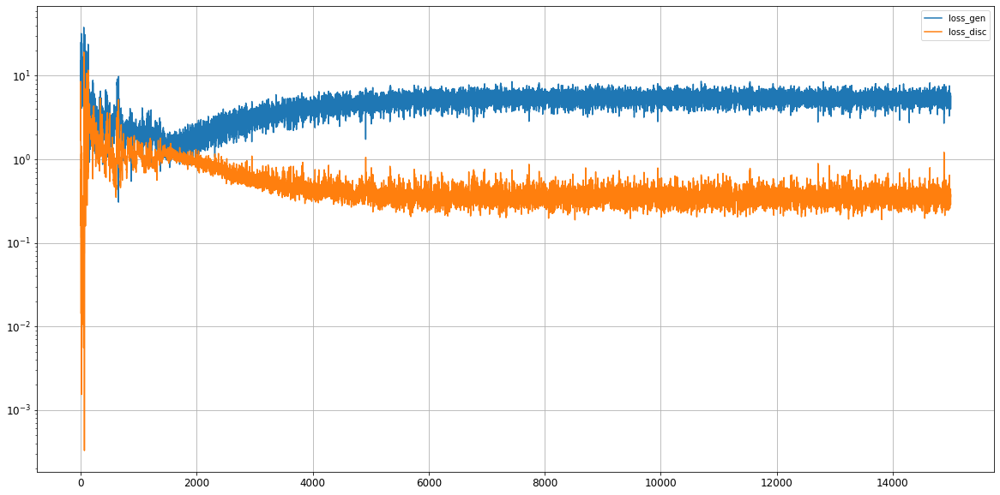

Epoch 15002/20000
0s
Epoch 15003/20000
0s
Epoch 15004/20000
0s
Epoch 15005/20000
0s
Epoch 15006/20000
0s
Epoch 15007/20000
0s
Epoch 15008/20000
0s
Epoch 15009/20000
0s
Epoch 15010/20000
0s
Epoch 15011/20000
0s
Epoch 15012/20000
0s
Epoch 15013/20000
0s
Epoch 15014/20000
0s
Epoch 15015/20000
0s
Epoch 15016/20000
0s
Epoch 15017/20000
0s
Epoch 15018/20000
0s
Epoch 15019/20000
0s
Epoch 15020/20000
0s
Epoch 15021/20000
0s
Epoch 15022/20000
0s
Epoch 15023/20000
0s
Epoch 15024/20000
0s
Epoch 15025/20000
0s
Epoch 15026/20000
0s
Epoch 15027/20000
0s
Epoch 15028/20000
0s
Epoch 15029/20000
0s
Epoch 15030/20000
0s
Epoch 15031/20000
0s
Epoch 15032/20000
0s
Epoch 15033/20000
0s
Epoch 15034/20000
0s
Epoch 15035/20000
0s
Epoch 15036/20000
0s
Epoch 15037/20000
0s
Epoch 15038/20000
0s
Epoch 15039/20000
0s
Epoch 15040/20000
0s
Epoch 15041/20000
0s
Epoch 15042/20000
0s
Epoch 15043/20000
0s
Epoch 15044/20000
0s
Epoch 15045/20000
0s
Epoch 15046/20000
0s
Epoch 15047/20000
0s
Epoch 15048/20000
0s
Epoch 15049/2

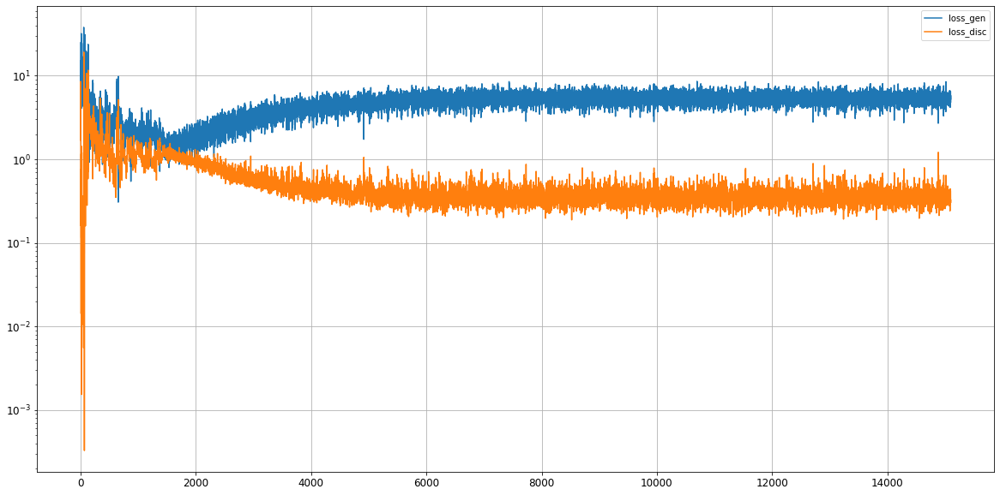

Epoch 15102/20000
0s
Epoch 15103/20000
0s
Epoch 15104/20000
0s
Epoch 15105/20000
0s
Epoch 15106/20000
0s
Epoch 15107/20000
0s
Epoch 15108/20000
0s
Epoch 15109/20000
0s
Epoch 15110/20000
0s
Epoch 15111/20000
0s
Epoch 15112/20000
0s
Epoch 15113/20000
0s
Epoch 15114/20000
0s
Epoch 15115/20000
0s
Epoch 15116/20000
0s
Epoch 15117/20000
0s
Epoch 15118/20000
0s
Epoch 15119/20000
0s
Epoch 15120/20000
0s
Epoch 15121/20000
0s
Epoch 15122/20000
0s
Epoch 15123/20000
0s
Epoch 15124/20000
0s
Epoch 15125/20000
0s
Epoch 15126/20000
0s
Epoch 15127/20000
0s
Epoch 15128/20000
0s
Epoch 15129/20000
0s
Epoch 15130/20000
0s
Epoch 15131/20000
0s
Epoch 15132/20000
0s
Epoch 15133/20000
0s
Epoch 15134/20000
0s
Epoch 15135/20000
0s
Epoch 15136/20000
0s
Epoch 15137/20000
0s
Epoch 15138/20000
0s
Epoch 15139/20000
0s
Epoch 15140/20000
0s
Epoch 15141/20000
0s
Epoch 15142/20000
0s
Epoch 15143/20000
0s
Epoch 15144/20000
0s
Epoch 15145/20000
0s
Epoch 15146/20000
0s
Epoch 15147/20000
0s
Epoch 15148/20000
0s
Epoch 15149/2

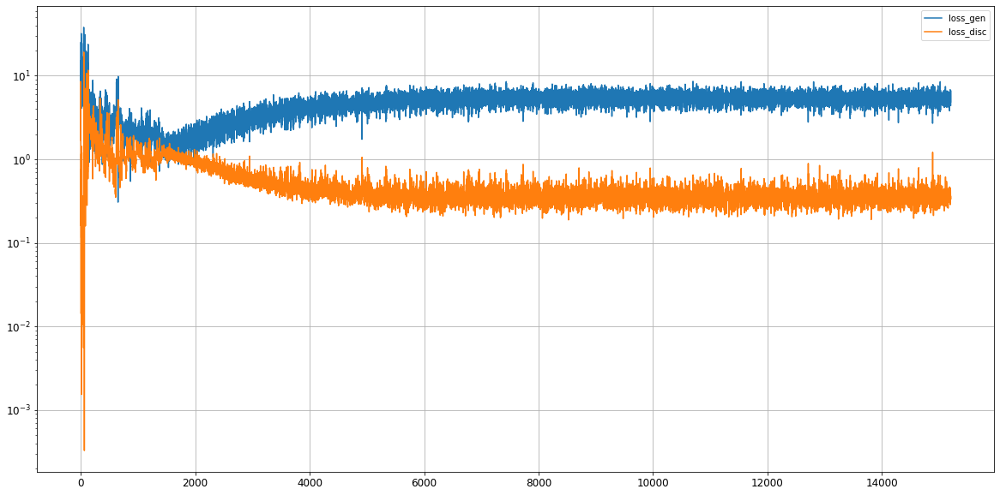

Epoch 15202/20000
0s
Epoch 15203/20000
0s
Epoch 15204/20000
0s
Epoch 15205/20000
0s
Epoch 15206/20000
0s
Epoch 15207/20000
0s
Epoch 15208/20000
0s
Epoch 15209/20000
0s
Epoch 15210/20000
0s
Epoch 15211/20000
0s
Epoch 15212/20000
0s
Epoch 15213/20000
0s
Epoch 15214/20000
0s
Epoch 15215/20000
0s
Epoch 15216/20000
0s
Epoch 15217/20000
0s
Epoch 15218/20000
0s
Epoch 15219/20000
0s
Epoch 15220/20000
0s
Epoch 15221/20000
0s
Epoch 15222/20000
0s
Epoch 15223/20000
0s
Epoch 15224/20000
0s
Epoch 15225/20000
0s
Epoch 15226/20000
0s
Epoch 15227/20000
0s
Epoch 15228/20000
0s
Epoch 15229/20000
0s
Epoch 15230/20000
0s
Epoch 15231/20000
0s
Epoch 15232/20000
0s
Epoch 15233/20000
0s
Epoch 15234/20000
0s
Epoch 15235/20000
0s
Epoch 15236/20000
0s
Epoch 15237/20000
0s
Epoch 15238/20000
0s
Epoch 15239/20000
0s
Epoch 15240/20000
0s
Epoch 15241/20000
0s
Epoch 15242/20000
0s
Epoch 15243/20000
0s
Epoch 15244/20000
0s
Epoch 15245/20000
0s
Epoch 15246/20000
0s
Epoch 15247/20000
0s
Epoch 15248/20000
0s
Epoch 15249/2

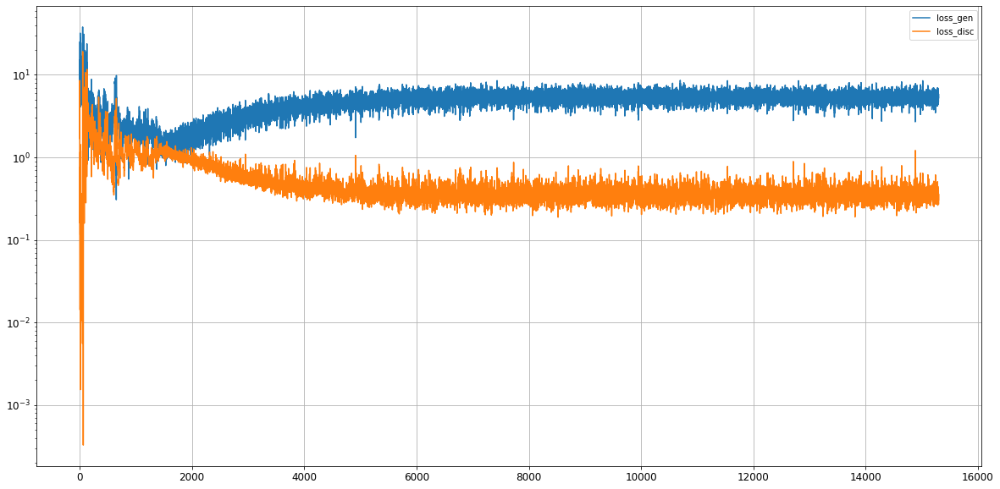

Epoch 15302/20000
0s
Epoch 15303/20000
0s
Epoch 15304/20000
0s
Epoch 15305/20000
0s
Epoch 15306/20000
0s
Epoch 15307/20000
0s
Epoch 15308/20000
0s
Epoch 15309/20000
0s
Epoch 15310/20000
0s
Epoch 15311/20000
0s
Epoch 15312/20000
0s
Epoch 15313/20000
0s
Epoch 15314/20000
0s
Epoch 15315/20000
0s
Epoch 15316/20000
0s
Epoch 15317/20000
0s
Epoch 15318/20000
0s
Epoch 15319/20000
0s
Epoch 15320/20000
0s
Epoch 15321/20000
0s
Epoch 15322/20000
0s
Epoch 15323/20000
0s
Epoch 15324/20000
0s
Epoch 15325/20000
0s
Epoch 15326/20000
0s
Epoch 15327/20000
0s
Epoch 15328/20000
0s
Epoch 15329/20000
0s
Epoch 15330/20000
0s
Epoch 15331/20000
0s
Epoch 15332/20000
0s
Epoch 15333/20000
0s
Epoch 15334/20000
0s
Epoch 15335/20000
0s
Epoch 15336/20000
0s
Epoch 15337/20000
0s
Epoch 15338/20000
0s
Epoch 15339/20000
0s
Epoch 15340/20000
0s
Epoch 15341/20000
0s
Epoch 15342/20000
0s
Epoch 15343/20000
0s
Epoch 15344/20000
0s
Epoch 15345/20000
0s
Epoch 15346/20000
0s
Epoch 15347/20000
0s
Epoch 15348/20000
0s
Epoch 15349/2

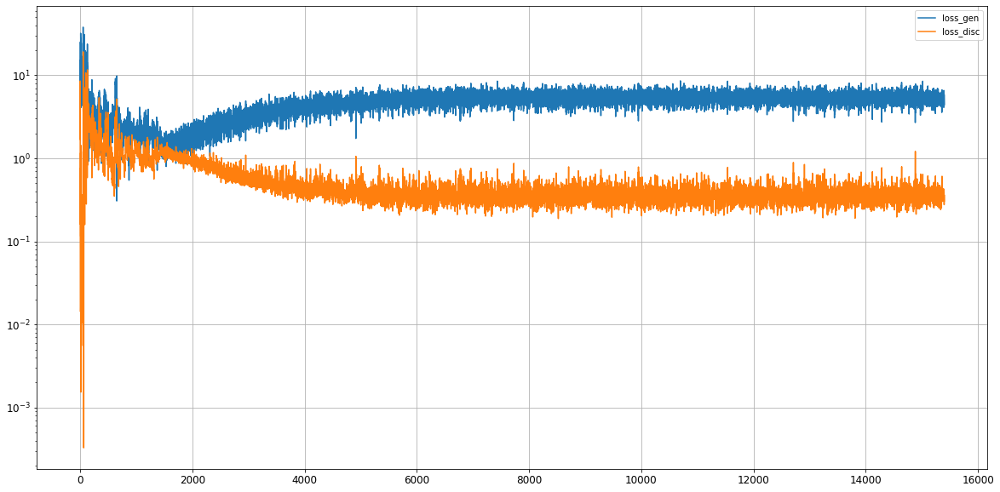

Epoch 15402/20000
0s
Epoch 15403/20000
0s
Epoch 15404/20000
0s
Epoch 15405/20000
0s
Epoch 15406/20000
0s
Epoch 15407/20000
0s
Epoch 15408/20000
0s
Epoch 15409/20000
0s
Epoch 15410/20000
0s
Epoch 15411/20000
0s
Epoch 15412/20000
0s
Epoch 15413/20000
0s
Epoch 15414/20000
0s
Epoch 15415/20000
0s
Epoch 15416/20000
0s
Epoch 15417/20000
0s
Epoch 15418/20000
0s
Epoch 15419/20000
0s
Epoch 15420/20000
0s
Epoch 15421/20000
0s
Epoch 15422/20000
0s
Epoch 15423/20000
0s
Epoch 15424/20000
0s
Epoch 15425/20000
0s
Epoch 15426/20000
0s
Epoch 15427/20000
0s
Epoch 15428/20000
0s
Epoch 15429/20000
0s
Epoch 15430/20000
0s
Epoch 15431/20000
0s
Epoch 15432/20000
0s
Epoch 15433/20000
0s
Epoch 15434/20000
0s
Epoch 15435/20000
0s
Epoch 15436/20000
0s
Epoch 15437/20000
0s
Epoch 15438/20000
0s
Epoch 15439/20000
0s
Epoch 15440/20000
0s
Epoch 15441/20000
0s
Epoch 15442/20000
0s
Epoch 15443/20000
0s
Epoch 15444/20000
0s
Epoch 15445/20000
0s
Epoch 15446/20000
0s
Epoch 15447/20000
0s
Epoch 15448/20000
0s
Epoch 15449/2

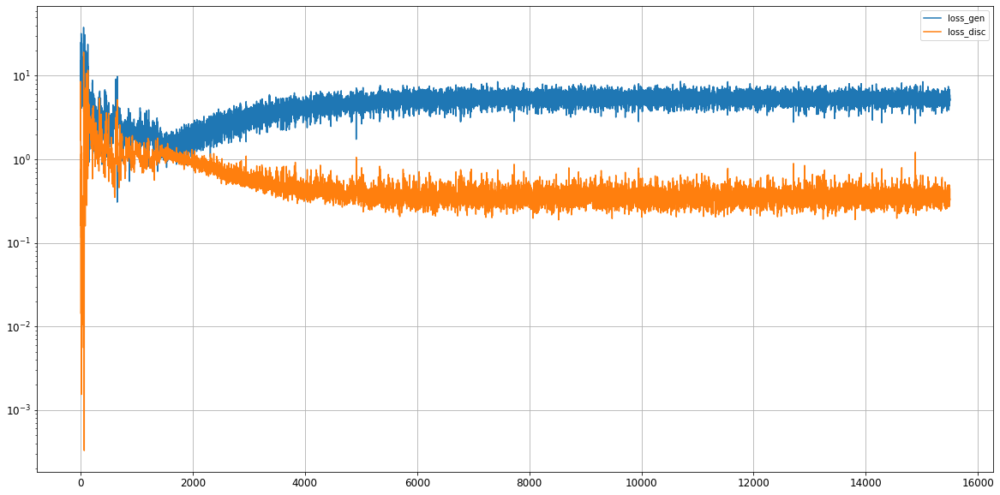

Epoch 15502/20000
0s
Epoch 15503/20000
0s
Epoch 15504/20000
0s
Epoch 15505/20000
0s
Epoch 15506/20000
0s
Epoch 15507/20000
0s
Epoch 15508/20000
0s
Epoch 15509/20000
0s
Epoch 15510/20000
0s
Epoch 15511/20000
0s
Epoch 15512/20000
0s
Epoch 15513/20000
0s
Epoch 15514/20000
0s
Epoch 15515/20000
0s
Epoch 15516/20000
0s
Epoch 15517/20000
0s
Epoch 15518/20000
0s
Epoch 15519/20000
0s
Epoch 15520/20000
0s
Epoch 15521/20000
0s
Epoch 15522/20000
0s
Epoch 15523/20000
0s
Epoch 15524/20000
0s
Epoch 15525/20000
0s
Epoch 15526/20000
0s
Epoch 15527/20000
0s
Epoch 15528/20000
0s
Epoch 15529/20000
0s
Epoch 15530/20000
0s
Epoch 15531/20000
0s
Epoch 15532/20000
0s
Epoch 15533/20000
0s
Epoch 15534/20000
0s
Epoch 15535/20000
0s
Epoch 15536/20000
0s
Epoch 15537/20000
0s
Epoch 15538/20000
0s
Epoch 15539/20000
0s
Epoch 15540/20000
0s
Epoch 15541/20000
0s
Epoch 15542/20000
0s
Epoch 15543/20000
0s
Epoch 15544/20000
0s
Epoch 15545/20000
0s
Epoch 15546/20000
0s
Epoch 15547/20000
0s
Epoch 15548/20000
0s
Epoch 15549/2

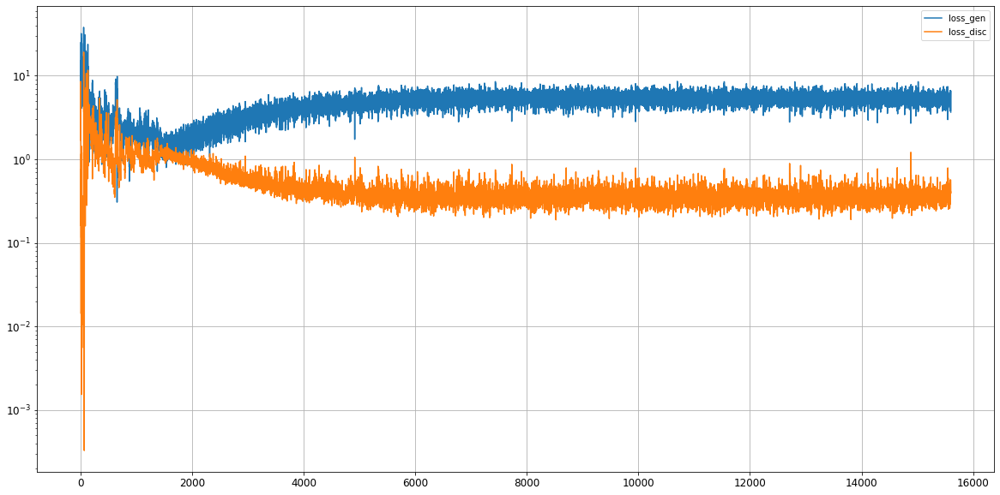

Epoch 15602/20000
0s
Epoch 15603/20000
0s
Epoch 15604/20000
0s
Epoch 15605/20000
0s
Epoch 15606/20000
0s
Epoch 15607/20000
0s
Epoch 15608/20000
0s
Epoch 15609/20000
0s
Epoch 15610/20000
0s
Epoch 15611/20000
0s
Epoch 15612/20000
0s
Epoch 15613/20000
0s
Epoch 15614/20000
0s
Epoch 15615/20000
0s
Epoch 15616/20000
0s
Epoch 15617/20000
0s
Epoch 15618/20000
0s
Epoch 15619/20000
0s
Epoch 15620/20000
0s
Epoch 15621/20000
0s
Epoch 15622/20000
0s
Epoch 15623/20000
0s
Epoch 15624/20000
0s
Epoch 15625/20000
0s
Epoch 15626/20000
0s
Epoch 15627/20000
0s
Epoch 15628/20000
0s
Epoch 15629/20000
0s
Epoch 15630/20000
0s
Epoch 15631/20000
0s
Epoch 15632/20000
0s
Epoch 15633/20000
0s
Epoch 15634/20000
0s
Epoch 15635/20000
0s
Epoch 15636/20000
0s
Epoch 15637/20000
0s
Epoch 15638/20000
0s
Epoch 15639/20000
0s
Epoch 15640/20000
0s
Epoch 15641/20000
0s
Epoch 15642/20000
0s
Epoch 15643/20000
0s
Epoch 15644/20000
0s
Epoch 15645/20000
0s
Epoch 15646/20000
0s
Epoch 15647/20000
0s
Epoch 15648/20000
0s
Epoch 15649/2

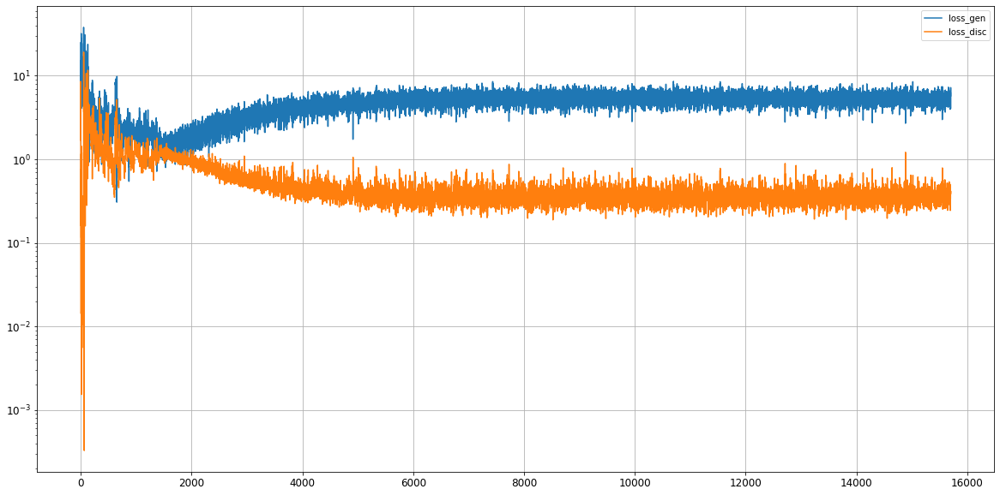

Epoch 15702/20000
0s
Epoch 15703/20000
0s
Epoch 15704/20000
0s
Epoch 15705/20000
0s
Epoch 15706/20000
0s
Epoch 15707/20000
0s
Epoch 15708/20000
0s
Epoch 15709/20000
0s
Epoch 15710/20000
0s
Epoch 15711/20000
0s
Epoch 15712/20000
0s
Epoch 15713/20000
0s
Epoch 15714/20000
0s
Epoch 15715/20000
0s
Epoch 15716/20000
0s
Epoch 15717/20000
0s
Epoch 15718/20000
0s
Epoch 15719/20000
0s
Epoch 15720/20000
0s
Epoch 15721/20000
0s
Epoch 15722/20000
0s
Epoch 15723/20000
0s
Epoch 15724/20000
0s
Epoch 15725/20000
0s
Epoch 15726/20000
0s
Epoch 15727/20000
0s
Epoch 15728/20000
0s
Epoch 15729/20000
0s
Epoch 15730/20000
0s
Epoch 15731/20000
0s
Epoch 15732/20000
0s
Epoch 15733/20000
0s
Epoch 15734/20000
0s
Epoch 15735/20000
0s
Epoch 15736/20000
0s
Epoch 15737/20000
0s
Epoch 15738/20000
0s
Epoch 15739/20000
0s
Epoch 15740/20000
0s
Epoch 15741/20000
0s
Epoch 15742/20000
0s
Epoch 15743/20000
0s
Epoch 15744/20000
0s
Epoch 15745/20000
0s
Epoch 15746/20000
0s
Epoch 15747/20000
0s
Epoch 15748/20000
0s
Epoch 15749/2

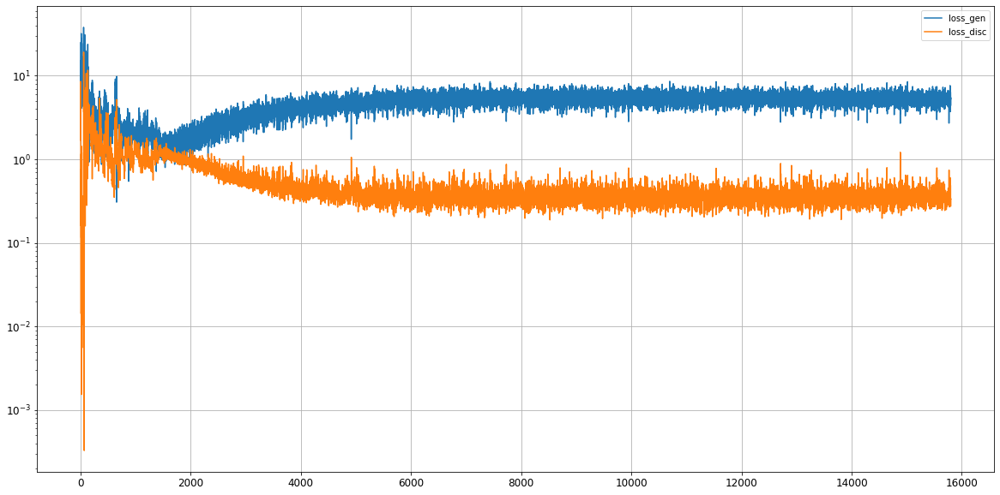

Epoch 15802/20000
0s
Epoch 15803/20000
0s
Epoch 15804/20000
0s
Epoch 15805/20000
0s
Epoch 15806/20000
0s
Epoch 15807/20000
0s
Epoch 15808/20000
0s
Epoch 15809/20000
0s
Epoch 15810/20000
0s
Epoch 15811/20000
0s
Epoch 15812/20000
0s
Epoch 15813/20000
0s
Epoch 15814/20000
0s
Epoch 15815/20000
0s
Epoch 15816/20000
0s
Epoch 15817/20000
0s
Epoch 15818/20000
0s
Epoch 15819/20000
0s
Epoch 15820/20000
0s
Epoch 15821/20000
0s
Epoch 15822/20000
0s
Epoch 15823/20000
0s
Epoch 15824/20000
0s
Epoch 15825/20000
0s
Epoch 15826/20000
0s
Epoch 15827/20000
0s
Epoch 15828/20000
0s
Epoch 15829/20000
0s
Epoch 15830/20000
0s
Epoch 15831/20000
0s
Epoch 15832/20000
0s
Epoch 15833/20000
0s
Epoch 15834/20000
0s
Epoch 15835/20000
0s
Epoch 15836/20000
0s
Epoch 15837/20000
0s
Epoch 15838/20000
0s
Epoch 15839/20000
0s
Epoch 15840/20000
0s
Epoch 15841/20000
0s
Epoch 15842/20000
0s
Epoch 15843/20000
0s
Epoch 15844/20000
0s
Epoch 15845/20000
0s
Epoch 15846/20000
0s
Epoch 15847/20000
0s
Epoch 15848/20000
0s
Epoch 15849/2

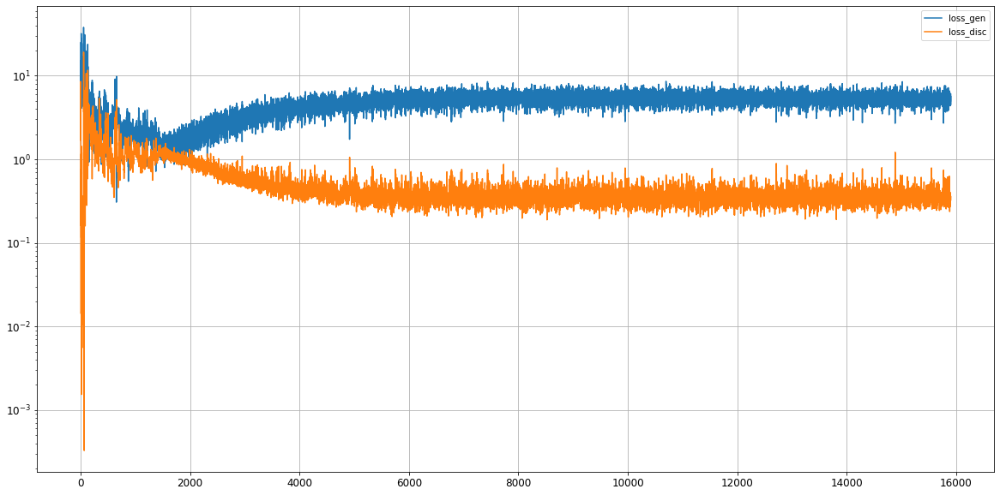

Epoch 15902/20000
0s
Epoch 15903/20000
0s
Epoch 15904/20000
0s
Epoch 15905/20000
0s
Epoch 15906/20000
0s
Epoch 15907/20000
0s
Epoch 15908/20000
0s
Epoch 15909/20000
0s
Epoch 15910/20000
0s
Epoch 15911/20000
0s
Epoch 15912/20000
0s
Epoch 15913/20000
0s
Epoch 15914/20000
0s
Epoch 15915/20000
0s
Epoch 15916/20000
0s
Epoch 15917/20000
0s
Epoch 15918/20000
0s
Epoch 15919/20000
0s
Epoch 15920/20000
0s
Epoch 15921/20000
0s
Epoch 15922/20000
0s
Epoch 15923/20000
0s
Epoch 15924/20000
0s
Epoch 15925/20000
0s
Epoch 15926/20000
0s
Epoch 15927/20000
0s
Epoch 15928/20000
0s
Epoch 15929/20000
0s
Epoch 15930/20000
0s
Epoch 15931/20000
0s
Epoch 15932/20000
0s
Epoch 15933/20000
0s
Epoch 15934/20000
0s
Epoch 15935/20000
0s
Epoch 15936/20000
0s
Epoch 15937/20000
0s
Epoch 15938/20000
0s
Epoch 15939/20000
0s
Epoch 15940/20000
0s
Epoch 15941/20000
0s
Epoch 15942/20000
0s
Epoch 15943/20000
0s
Epoch 15944/20000
0s
Epoch 15945/20000
0s
Epoch 15946/20000
0s
Epoch 15947/20000
0s
Epoch 15948/20000
0s
Epoch 15949/2

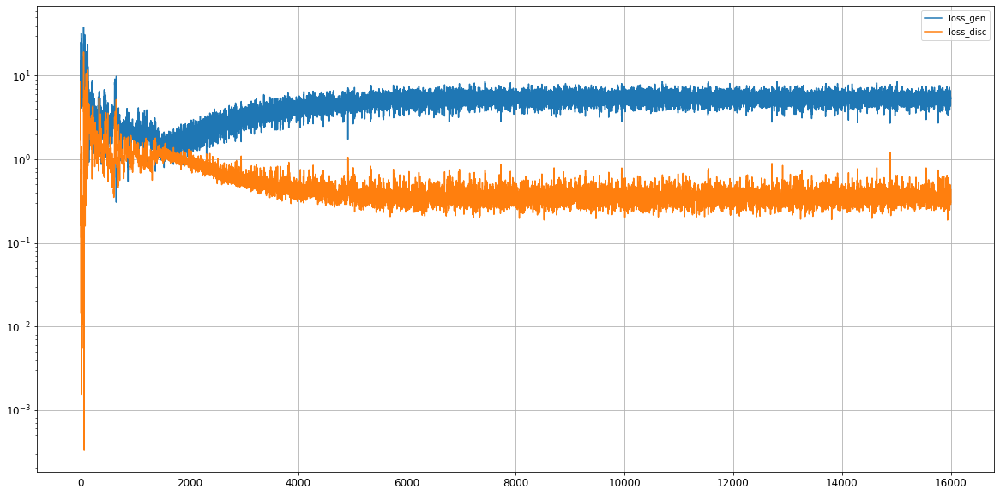

Epoch 16002/20000
0s
Epoch 16003/20000
0s
Epoch 16004/20000
0s
Epoch 16005/20000
0s
Epoch 16006/20000
0s
Epoch 16007/20000
0s
Epoch 16008/20000
0s
Epoch 16009/20000
0s
Epoch 16010/20000
0s
Epoch 16011/20000
0s
Epoch 16012/20000
0s
Epoch 16013/20000
0s
Epoch 16014/20000
0s
Epoch 16015/20000
0s
Epoch 16016/20000
0s
Epoch 16017/20000
0s
Epoch 16018/20000
0s
Epoch 16019/20000
0s
Epoch 16020/20000
0s
Epoch 16021/20000
0s
Epoch 16022/20000
0s
Epoch 16023/20000
0s
Epoch 16024/20000
0s
Epoch 16025/20000
0s
Epoch 16026/20000
0s
Epoch 16027/20000
0s
Epoch 16028/20000
0s
Epoch 16029/20000
0s
Epoch 16030/20000
0s
Epoch 16031/20000
0s
Epoch 16032/20000
0s
Epoch 16033/20000
0s
Epoch 16034/20000
0s
Epoch 16035/20000
0s
Epoch 16036/20000
0s
Epoch 16037/20000
0s
Epoch 16038/20000
0s
Epoch 16039/20000
0s
Epoch 16040/20000
0s
Epoch 16041/20000
0s
Epoch 16042/20000
0s
Epoch 16043/20000
0s
Epoch 16044/20000
0s
Epoch 16045/20000
0s
Epoch 16046/20000
0s
Epoch 16047/20000
0s
Epoch 16048/20000
0s
Epoch 16049/2

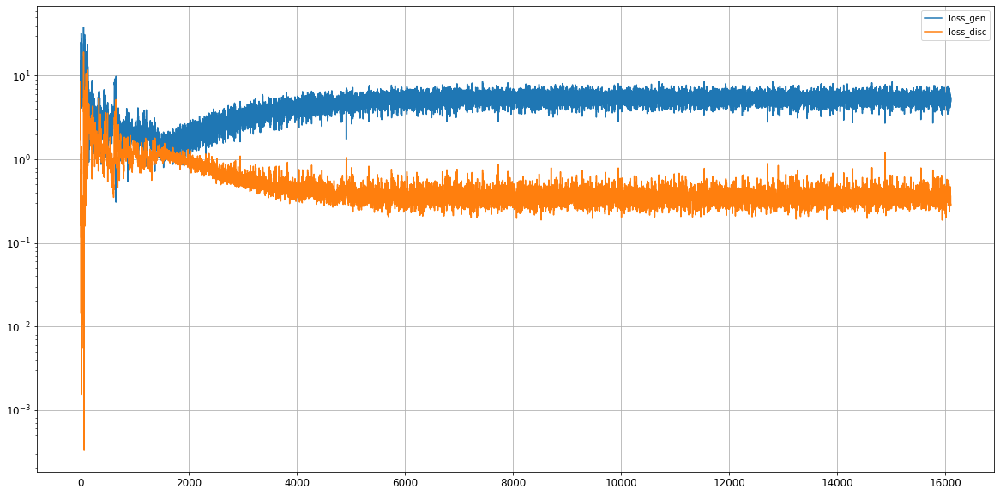

Epoch 16102/20000
0s
Epoch 16103/20000
0s
Epoch 16104/20000
0s
Epoch 16105/20000
0s
Epoch 16106/20000
0s
Epoch 16107/20000
0s
Epoch 16108/20000
0s
Epoch 16109/20000
0s
Epoch 16110/20000
0s
Epoch 16111/20000
0s
Epoch 16112/20000
0s
Epoch 16113/20000
0s
Epoch 16114/20000
0s
Epoch 16115/20000
0s
Epoch 16116/20000
0s
Epoch 16117/20000
0s
Epoch 16118/20000
0s
Epoch 16119/20000
0s
Epoch 16120/20000
0s
Epoch 16121/20000
0s
Epoch 16122/20000
0s
Epoch 16123/20000
0s
Epoch 16124/20000
0s
Epoch 16125/20000
0s
Epoch 16126/20000
0s
Epoch 16127/20000
0s
Epoch 16128/20000
0s
Epoch 16129/20000
0s
Epoch 16130/20000
0s
Epoch 16131/20000
0s
Epoch 16132/20000
0s
Epoch 16133/20000
0s
Epoch 16134/20000
0s
Epoch 16135/20000
0s
Epoch 16136/20000
0s
Epoch 16137/20000
0s
Epoch 16138/20000
0s
Epoch 16139/20000
0s
Epoch 16140/20000
0s
Epoch 16141/20000
0s
Epoch 16142/20000
0s
Epoch 16143/20000
0s
Epoch 16144/20000
0s
Epoch 16145/20000
0s
Epoch 16146/20000
0s
Epoch 16147/20000
0s
Epoch 16148/20000
0s
Epoch 16149/2

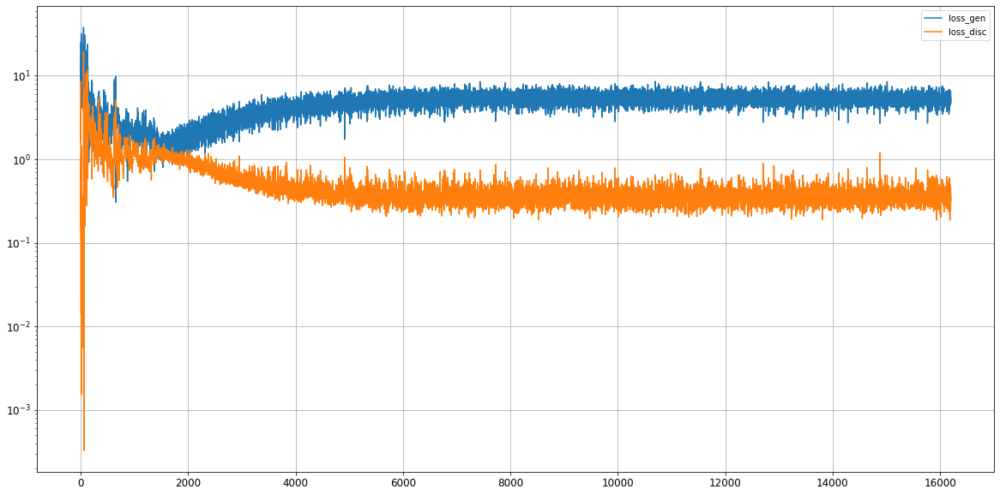

Epoch 16202/20000
0s
Epoch 16203/20000
0s
Epoch 16204/20000
0s
Epoch 16205/20000
0s
Epoch 16206/20000
0s
Epoch 16207/20000
0s
Epoch 16208/20000
0s
Epoch 16209/20000
0s
Epoch 16210/20000
0s
Epoch 16211/20000
0s
Epoch 16212/20000
0s
Epoch 16213/20000
0s
Epoch 16214/20000
0s
Epoch 16215/20000
0s
Epoch 16216/20000
0s
Epoch 16217/20000
0s
Epoch 16218/20000
0s
Epoch 16219/20000
0s
Epoch 16220/20000
0s
Epoch 16221/20000
0s
Epoch 16222/20000
0s
Epoch 16223/20000
0s
Epoch 16224/20000
0s
Epoch 16225/20000
0s
Epoch 16226/20000
0s
Epoch 16227/20000
0s
Epoch 16228/20000
0s
Epoch 16229/20000
0s
Epoch 16230/20000
0s
Epoch 16231/20000
0s
Epoch 16232/20000
0s
Epoch 16233/20000
0s
Epoch 16234/20000
0s
Epoch 16235/20000
0s
Epoch 16236/20000
0s
Epoch 16237/20000
0s
Epoch 16238/20000
0s
Epoch 16239/20000
0s
Epoch 16240/20000
0s
Epoch 16241/20000
0s
Epoch 16242/20000
0s
Epoch 16243/20000
0s
Epoch 16244/20000
0s
Epoch 16245/20000
0s
Epoch 16246/20000
0s
Epoch 16247/20000
0s
Epoch 16248/20000
0s
Epoch 16249/2

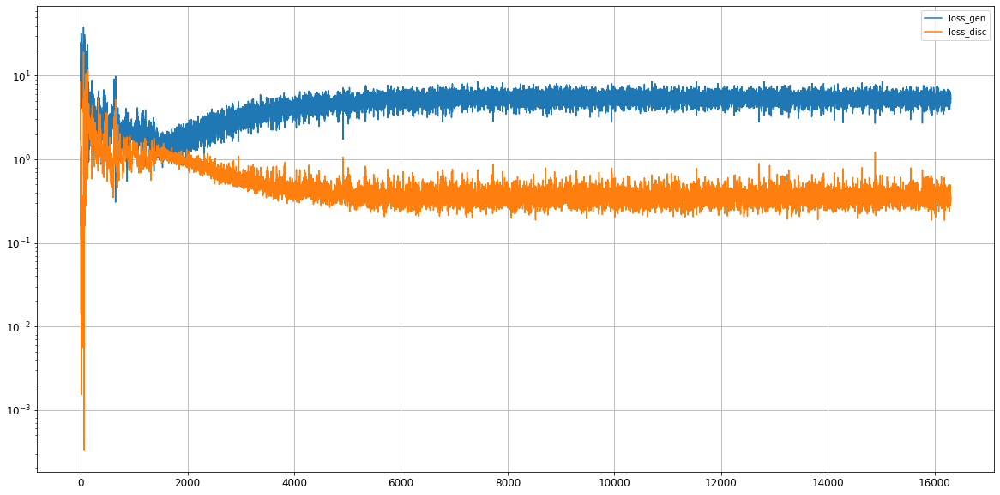

Epoch 16302/20000
0s
Epoch 16303/20000
0s
Epoch 16304/20000
0s
Epoch 16305/20000
0s
Epoch 16306/20000
0s
Epoch 16307/20000
0s
Epoch 16308/20000
0s
Epoch 16309/20000
0s
Epoch 16310/20000
0s
Epoch 16311/20000
0s
Epoch 16312/20000
0s
Epoch 16313/20000
0s
Epoch 16314/20000
0s
Epoch 16315/20000
0s
Epoch 16316/20000
0s
Epoch 16317/20000
0s
Epoch 16318/20000
0s
Epoch 16319/20000
0s
Epoch 16320/20000
0s
Epoch 16321/20000
0s
Epoch 16322/20000
0s
Epoch 16323/20000
0s
Epoch 16324/20000
0s
Epoch 16325/20000
0s
Epoch 16326/20000
0s
Epoch 16327/20000
0s
Epoch 16328/20000
0s
Epoch 16329/20000
0s
Epoch 16330/20000
0s
Epoch 16331/20000
0s
Epoch 16332/20000
0s
Epoch 16333/20000
0s
Epoch 16334/20000
0s
Epoch 16335/20000
0s
Epoch 16336/20000
0s
Epoch 16337/20000
0s
Epoch 16338/20000
0s
Epoch 16339/20000
0s
Epoch 16340/20000
0s
Epoch 16341/20000
0s
Epoch 16342/20000
0s
Epoch 16343/20000
0s
Epoch 16344/20000
0s
Epoch 16345/20000
0s
Epoch 16346/20000
0s
Epoch 16347/20000
0s
Epoch 16348/20000
0s
Epoch 16349/2

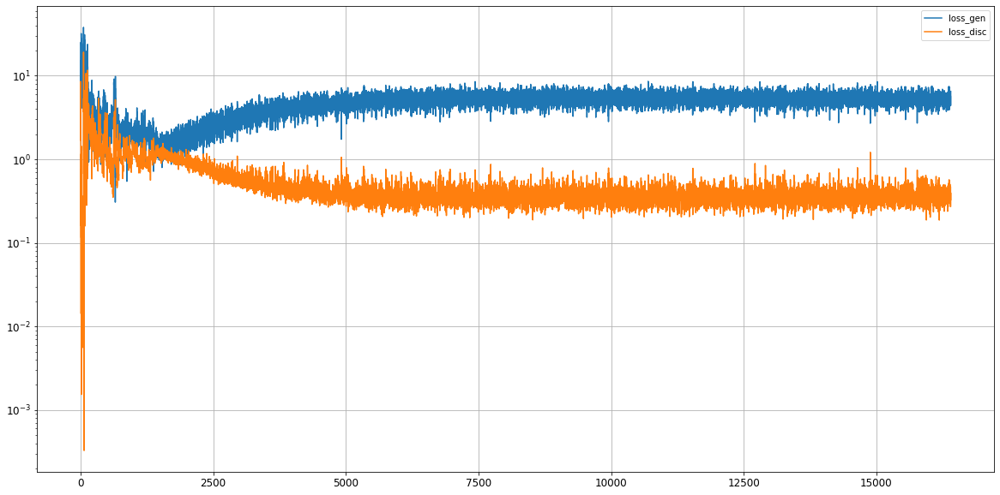

Epoch 16402/20000
0s
Epoch 16403/20000
0s
Epoch 16404/20000
0s
Epoch 16405/20000
0s
Epoch 16406/20000
0s
Epoch 16407/20000
0s
Epoch 16408/20000
0s
Epoch 16409/20000
0s
Epoch 16410/20000
0s
Epoch 16411/20000
0s
Epoch 16412/20000
0s
Epoch 16413/20000
0s
Epoch 16414/20000
0s
Epoch 16415/20000
0s
Epoch 16416/20000
0s
Epoch 16417/20000
0s
Epoch 16418/20000
0s
Epoch 16419/20000
0s
Epoch 16420/20000
0s
Epoch 16421/20000
0s
Epoch 16422/20000
0s
Epoch 16423/20000
0s
Epoch 16424/20000
0s
Epoch 16425/20000
0s
Epoch 16426/20000
0s
Epoch 16427/20000
0s
Epoch 16428/20000
0s
Epoch 16429/20000
0s
Epoch 16430/20000
0s
Epoch 16431/20000
0s
Epoch 16432/20000
0s
Epoch 16433/20000
0s
Epoch 16434/20000
0s
Epoch 16435/20000
0s
Epoch 16436/20000
0s
Epoch 16437/20000
0s
Epoch 16438/20000
0s
Epoch 16439/20000
0s
Epoch 16440/20000
0s
Epoch 16441/20000
0s
Epoch 16442/20000
0s
Epoch 16443/20000
0s
Epoch 16444/20000
0s
Epoch 16445/20000
0s
Epoch 16446/20000
0s
Epoch 16447/20000
0s
Epoch 16448/20000
0s
Epoch 16449/2

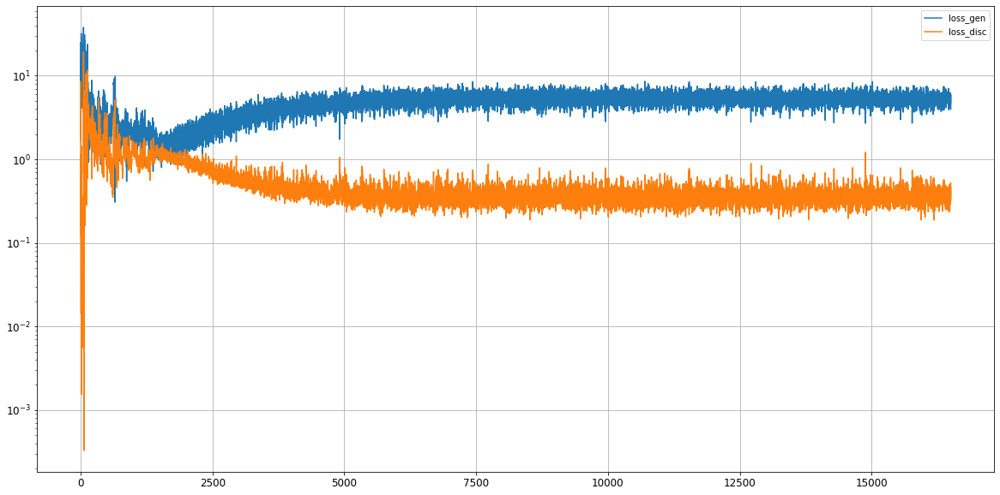

Epoch 16502/20000
0s
Epoch 16503/20000
0s
Epoch 16504/20000
0s
Epoch 16505/20000
0s
Epoch 16506/20000
0s
Epoch 16507/20000
0s
Epoch 16508/20000
0s
Epoch 16509/20000
0s
Epoch 16510/20000
0s
Epoch 16511/20000
0s
Epoch 16512/20000
0s
Epoch 16513/20000
0s
Epoch 16514/20000
0s
Epoch 16515/20000
0s
Epoch 16516/20000
0s
Epoch 16517/20000
0s
Epoch 16518/20000
0s
Epoch 16519/20000
0s
Epoch 16520/20000
0s
Epoch 16521/20000
0s
Epoch 16522/20000
0s
Epoch 16523/20000
0s
Epoch 16524/20000
0s
Epoch 16525/20000
0s
Epoch 16526/20000
0s
Epoch 16527/20000
0s
Epoch 16528/20000
0s
Epoch 16529/20000
0s
Epoch 16530/20000
0s
Epoch 16531/20000
0s
Epoch 16532/20000
0s
Epoch 16533/20000
0s
Epoch 16534/20000
0s
Epoch 16535/20000
0s
Epoch 16536/20000
0s
Epoch 16537/20000
0s
Epoch 16538/20000
0s
Epoch 16539/20000
0s
Epoch 16540/20000
0s
Epoch 16541/20000
0s
Epoch 16542/20000
0s
Epoch 16543/20000
0s
Epoch 16544/20000
0s
Epoch 16545/20000
0s
Epoch 16546/20000
0s
Epoch 16547/20000
0s
Epoch 16548/20000
0s
Epoch 16549/2

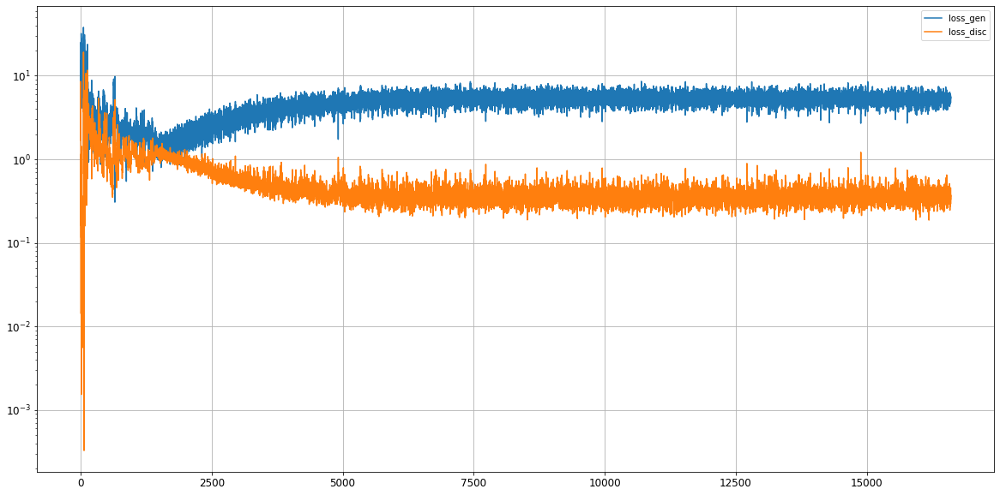

Epoch 16602/20000
0s
Epoch 16603/20000
0s
Epoch 16604/20000
0s
Epoch 16605/20000
0s
Epoch 16606/20000
0s
Epoch 16607/20000
0s
Epoch 16608/20000
0s
Epoch 16609/20000
0s
Epoch 16610/20000
0s
Epoch 16611/20000
0s
Epoch 16612/20000
0s
Epoch 16613/20000
0s
Epoch 16614/20000
0s
Epoch 16615/20000
0s
Epoch 16616/20000
0s
Epoch 16617/20000
0s
Epoch 16618/20000
0s
Epoch 16619/20000
0s
Epoch 16620/20000
0s
Epoch 16621/20000
0s
Epoch 16622/20000
0s
Epoch 16623/20000
0s
Epoch 16624/20000
0s
Epoch 16625/20000
0s
Epoch 16626/20000
0s
Epoch 16627/20000
0s
Epoch 16628/20000
0s
Epoch 16629/20000
0s
Epoch 16630/20000
0s
Epoch 16631/20000
0s
Epoch 16632/20000
0s
Epoch 16633/20000
0s
Epoch 16634/20000
0s
Epoch 16635/20000
0s
Epoch 16636/20000
0s
Epoch 16637/20000
0s
Epoch 16638/20000
0s
Epoch 16639/20000
0s
Epoch 16640/20000
0s
Epoch 16641/20000
0s
Epoch 16642/20000
0s
Epoch 16643/20000
0s
Epoch 16644/20000
0s
Epoch 16645/20000
0s
Epoch 16646/20000
0s
Epoch 16647/20000
0s
Epoch 16648/20000
0s
Epoch 16649/2

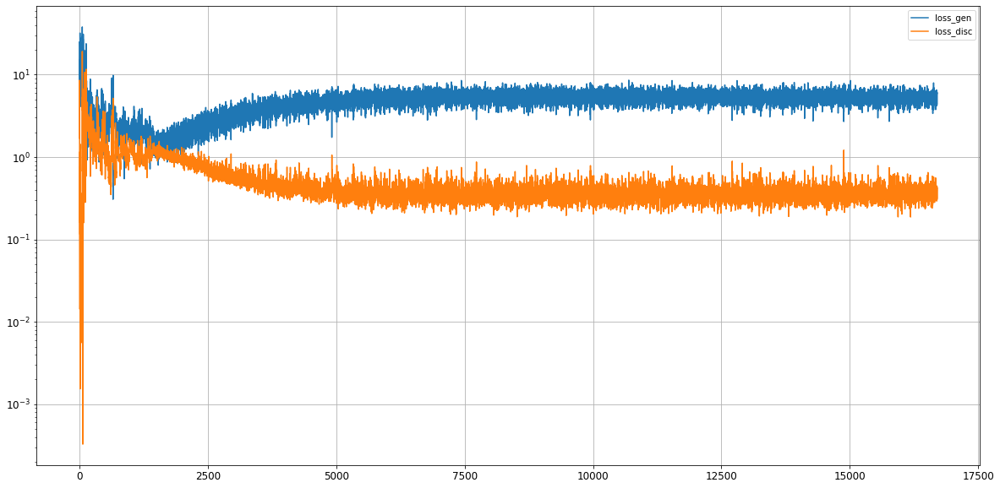

Epoch 16702/20000
0s
Epoch 16703/20000
0s
Epoch 16704/20000
0s
Epoch 16705/20000
0s
Epoch 16706/20000
0s
Epoch 16707/20000
0s
Epoch 16708/20000
0s
Epoch 16709/20000
0s
Epoch 16710/20000
0s
Epoch 16711/20000
0s
Epoch 16712/20000
0s
Epoch 16713/20000
0s
Epoch 16714/20000
0s
Epoch 16715/20000
0s
Epoch 16716/20000
0s
Epoch 16717/20000
0s
Epoch 16718/20000
0s
Epoch 16719/20000
0s
Epoch 16720/20000
0s
Epoch 16721/20000
0s
Epoch 16722/20000
0s
Epoch 16723/20000
0s
Epoch 16724/20000
0s
Epoch 16725/20000
0s
Epoch 16726/20000
0s
Epoch 16727/20000
0s
Epoch 16728/20000
0s
Epoch 16729/20000
0s
Epoch 16730/20000
0s
Epoch 16731/20000
0s
Epoch 16732/20000
0s
Epoch 16733/20000
0s
Epoch 16734/20000
0s
Epoch 16735/20000
0s
Epoch 16736/20000
0s
Epoch 16737/20000
0s
Epoch 16738/20000
0s
Epoch 16739/20000
0s
Epoch 16740/20000
0s
Epoch 16741/20000
0s
Epoch 16742/20000
0s
Epoch 16743/20000
0s
Epoch 16744/20000
0s
Epoch 16745/20000
0s
Epoch 16746/20000
0s
Epoch 16747/20000
0s
Epoch 16748/20000
0s
Epoch 16749/2

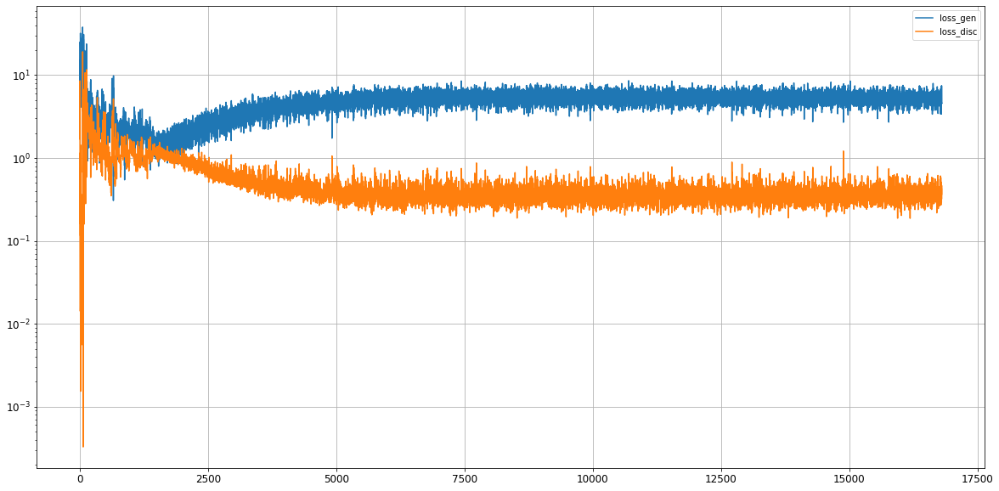

Epoch 16802/20000
0s
Epoch 16803/20000
0s
Epoch 16804/20000
0s
Epoch 16805/20000
0s
Epoch 16806/20000
0s
Epoch 16807/20000
0s
Epoch 16808/20000
0s
Epoch 16809/20000
0s
Epoch 16810/20000
0s
Epoch 16811/20000
0s
Epoch 16812/20000
0s
Epoch 16813/20000
0s
Epoch 16814/20000
0s
Epoch 16815/20000
0s
Epoch 16816/20000
0s
Epoch 16817/20000
0s
Epoch 16818/20000
0s
Epoch 16819/20000
0s
Epoch 16820/20000
0s
Epoch 16821/20000
0s
Epoch 16822/20000
0s
Epoch 16823/20000
0s
Epoch 16824/20000
0s
Epoch 16825/20000
0s
Epoch 16826/20000
0s
Epoch 16827/20000
0s
Epoch 16828/20000
0s
Epoch 16829/20000
0s
Epoch 16830/20000
0s
Epoch 16831/20000
0s
Epoch 16832/20000
0s
Epoch 16833/20000
0s
Epoch 16834/20000
0s
Epoch 16835/20000
0s
Epoch 16836/20000
0s
Epoch 16837/20000
0s
Epoch 16838/20000
0s
Epoch 16839/20000
0s
Epoch 16840/20000
0s
Epoch 16841/20000
0s
Epoch 16842/20000
0s
Epoch 16843/20000
0s
Epoch 16844/20000
0s
Epoch 16845/20000
0s
Epoch 16846/20000
0s
Epoch 16847/20000
0s
Epoch 16848/20000
0s
Epoch 16849/2

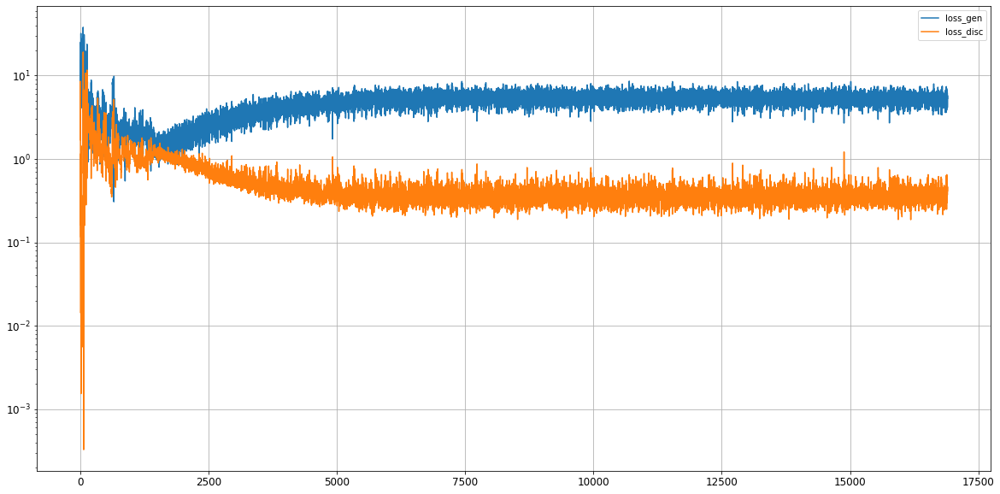

Epoch 16902/20000
0s
Epoch 16903/20000
0s
Epoch 16904/20000
0s
Epoch 16905/20000
0s
Epoch 16906/20000
0s
Epoch 16907/20000
0s
Epoch 16908/20000
0s
Epoch 16909/20000
0s
Epoch 16910/20000
0s
Epoch 16911/20000
0s
Epoch 16912/20000
0s
Epoch 16913/20000
0s
Epoch 16914/20000
0s
Epoch 16915/20000
0s
Epoch 16916/20000
0s
Epoch 16917/20000
0s
Epoch 16918/20000
0s
Epoch 16919/20000
0s
Epoch 16920/20000
0s
Epoch 16921/20000
0s
Epoch 16922/20000
0s
Epoch 16923/20000
0s
Epoch 16924/20000
0s
Epoch 16925/20000
0s
Epoch 16926/20000
0s
Epoch 16927/20000
0s
Epoch 16928/20000
0s
Epoch 16929/20000
0s
Epoch 16930/20000
0s
Epoch 16931/20000
0s
Epoch 16932/20000
0s
Epoch 16933/20000
0s
Epoch 16934/20000
0s
Epoch 16935/20000
0s
Epoch 16936/20000
0s
Epoch 16937/20000
0s
Epoch 16938/20000
0s
Epoch 16939/20000
0s
Epoch 16940/20000
0s
Epoch 16941/20000
0s
Epoch 16942/20000
0s
Epoch 16943/20000
0s
Epoch 16944/20000
0s
Epoch 16945/20000
0s
Epoch 16946/20000
0s
Epoch 16947/20000
0s
Epoch 16948/20000
0s
Epoch 16949/2

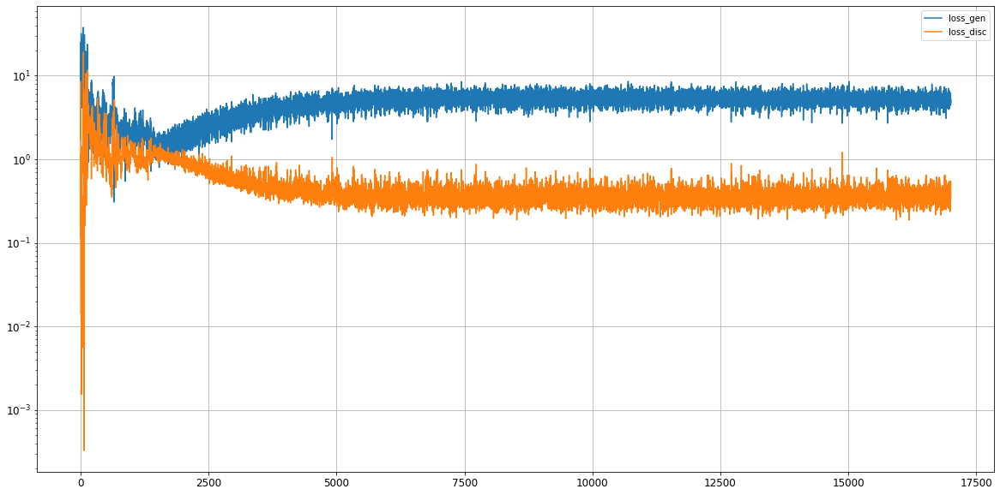

Epoch 17002/20000
0s
Epoch 17003/20000
0s
Epoch 17004/20000
0s
Epoch 17005/20000
0s
Epoch 17006/20000
0s
Epoch 17007/20000
0s
Epoch 17008/20000
0s
Epoch 17009/20000
0s
Epoch 17010/20000
0s
Epoch 17011/20000
0s
Epoch 17012/20000
0s
Epoch 17013/20000
0s
Epoch 17014/20000
0s
Epoch 17015/20000
0s
Epoch 17016/20000
0s
Epoch 17017/20000
0s
Epoch 17018/20000
0s
Epoch 17019/20000
0s
Epoch 17020/20000
0s
Epoch 17021/20000
0s
Epoch 17022/20000
0s
Epoch 17023/20000
0s
Epoch 17024/20000
0s
Epoch 17025/20000
0s
Epoch 17026/20000
0s
Epoch 17027/20000
0s
Epoch 17028/20000
0s
Epoch 17029/20000
0s
Epoch 17030/20000
0s
Epoch 17031/20000
0s
Epoch 17032/20000
0s
Epoch 17033/20000
0s
Epoch 17034/20000
0s
Epoch 17035/20000
0s
Epoch 17036/20000
0s
Epoch 17037/20000
0s
Epoch 17038/20000
0s
Epoch 17039/20000
0s
Epoch 17040/20000
0s
Epoch 17041/20000
0s
Epoch 17042/20000
0s
Epoch 17043/20000
0s
Epoch 17044/20000
0s
Epoch 17045/20000
0s
Epoch 17046/20000
0s
Epoch 17047/20000
0s
Epoch 17048/20000
0s
Epoch 17049/2

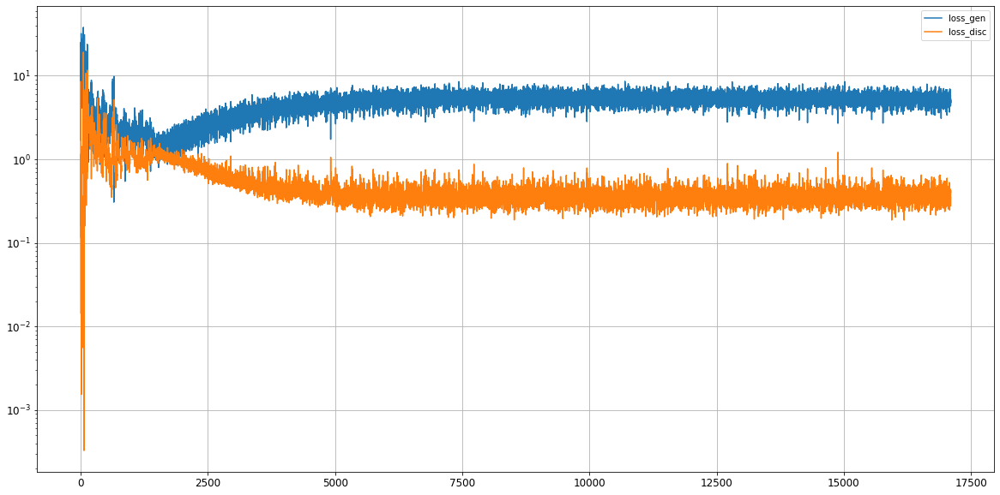

Epoch 17102/20000
0s
Epoch 17103/20000
0s
Epoch 17104/20000
0s
Epoch 17105/20000
0s
Epoch 17106/20000
0s
Epoch 17107/20000
0s
Epoch 17108/20000
0s
Epoch 17109/20000
0s
Epoch 17110/20000
0s
Epoch 17111/20000
0s
Epoch 17112/20000
0s
Epoch 17113/20000
0s
Epoch 17114/20000
0s
Epoch 17115/20000
0s
Epoch 17116/20000
0s
Epoch 17117/20000
0s
Epoch 17118/20000
0s
Epoch 17119/20000
0s
Epoch 17120/20000
0s
Epoch 17121/20000
0s
Epoch 17122/20000
0s
Epoch 17123/20000
0s
Epoch 17124/20000
0s
Epoch 17125/20000
0s
Epoch 17126/20000
0s
Epoch 17127/20000
0s
Epoch 17128/20000
0s
Epoch 17129/20000
0s
Epoch 17130/20000
0s
Epoch 17131/20000
0s
Epoch 17132/20000
0s
Epoch 17133/20000
0s
Epoch 17134/20000
0s
Epoch 17135/20000
0s
Epoch 17136/20000
0s
Epoch 17137/20000
0s
Epoch 17138/20000
0s
Epoch 17139/20000
0s
Epoch 17140/20000
0s
Epoch 17141/20000
0s
Epoch 17142/20000
0s
Epoch 17143/20000
0s
Epoch 17144/20000
0s
Epoch 17145/20000
0s
Epoch 17146/20000
0s
Epoch 17147/20000
0s
Epoch 17148/20000
0s
Epoch 17149/2

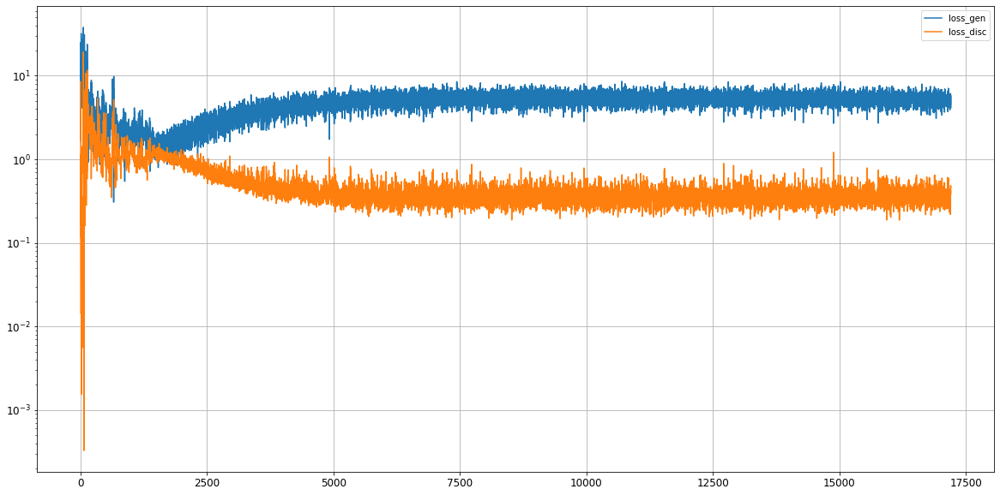

Epoch 17202/20000
0s
Epoch 17203/20000
0s
Epoch 17204/20000
0s
Epoch 17205/20000
0s
Epoch 17206/20000
0s
Epoch 17207/20000
0s
Epoch 17208/20000
0s
Epoch 17209/20000
0s
Epoch 17210/20000
0s
Epoch 17211/20000
0s
Epoch 17212/20000
0s
Epoch 17213/20000
0s
Epoch 17214/20000
0s
Epoch 17215/20000
0s
Epoch 17216/20000
0s
Epoch 17217/20000
0s
Epoch 17218/20000
0s
Epoch 17219/20000
0s
Epoch 17220/20000
0s
Epoch 17221/20000
0s
Epoch 17222/20000
0s
Epoch 17223/20000
0s
Epoch 17224/20000
0s
Epoch 17225/20000
0s
Epoch 17226/20000
0s
Epoch 17227/20000
0s
Epoch 17228/20000
0s
Epoch 17229/20000
0s
Epoch 17230/20000
0s
Epoch 17231/20000
0s
Epoch 17232/20000
0s
Epoch 17233/20000
0s
Epoch 17234/20000
0s
Epoch 17235/20000
0s
Epoch 17236/20000
0s
Epoch 17237/20000
0s
Epoch 17238/20000
0s
Epoch 17239/20000
0s
Epoch 17240/20000
0s
Epoch 17241/20000
0s
Epoch 17242/20000
0s
Epoch 17243/20000
0s
Epoch 17244/20000
0s
Epoch 17245/20000
0s
Epoch 17246/20000
0s
Epoch 17247/20000
0s
Epoch 17248/20000
0s
Epoch 17249/2

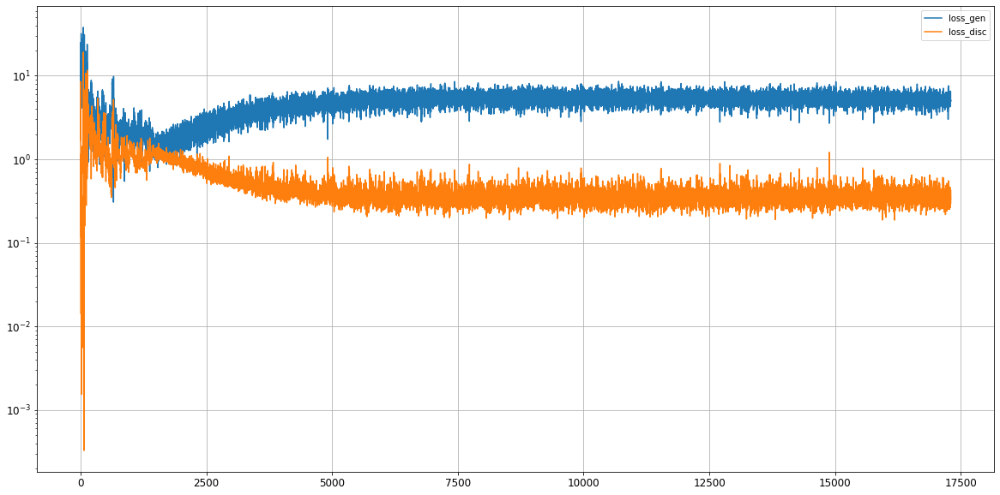

Epoch 17302/20000
0s
Epoch 17303/20000
0s
Epoch 17304/20000
0s
Epoch 17305/20000
0s
Epoch 17306/20000
0s
Epoch 17307/20000
0s
Epoch 17308/20000
0s
Epoch 17309/20000
0s
Epoch 17310/20000
0s
Epoch 17311/20000
0s
Epoch 17312/20000
0s
Epoch 17313/20000
0s
Epoch 17314/20000
0s
Epoch 17315/20000
0s
Epoch 17316/20000
0s
Epoch 17317/20000
0s
Epoch 17318/20000
0s
Epoch 17319/20000
0s
Epoch 17320/20000
0s
Epoch 17321/20000
0s
Epoch 17322/20000
0s
Epoch 17323/20000
0s
Epoch 17324/20000
0s
Epoch 17325/20000
0s
Epoch 17326/20000
0s
Epoch 17327/20000
0s
Epoch 17328/20000
0s
Epoch 17329/20000
0s
Epoch 17330/20000
0s
Epoch 17331/20000
0s
Epoch 17332/20000
0s
Epoch 17333/20000
0s
Epoch 17334/20000
0s
Epoch 17335/20000
0s
Epoch 17336/20000
0s
Epoch 17337/20000
0s
Epoch 17338/20000
0s
Epoch 17339/20000
0s
Epoch 17340/20000
0s
Epoch 17341/20000
0s
Epoch 17342/20000
0s
Epoch 17343/20000
0s
Epoch 17344/20000
0s
Epoch 17345/20000
0s
Epoch 17346/20000
0s
Epoch 17347/20000
0s
Epoch 17348/20000
0s
Epoch 17349/2

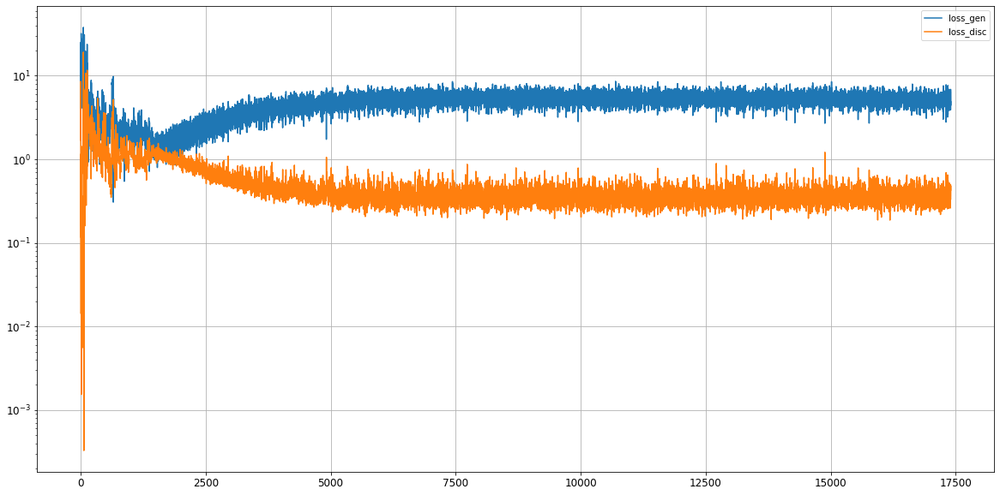

Epoch 17402/20000
0s
Epoch 17403/20000
0s
Epoch 17404/20000
0s
Epoch 17405/20000
0s
Epoch 17406/20000
0s
Epoch 17407/20000
0s
Epoch 17408/20000
0s
Epoch 17409/20000
0s
Epoch 17410/20000
0s
Epoch 17411/20000
0s
Epoch 17412/20000
0s
Epoch 17413/20000
0s
Epoch 17414/20000
0s
Epoch 17415/20000
0s
Epoch 17416/20000
0s
Epoch 17417/20000
0s
Epoch 17418/20000
0s
Epoch 17419/20000
0s
Epoch 17420/20000
0s
Epoch 17421/20000
0s
Epoch 17422/20000
0s
Epoch 17423/20000
0s
Epoch 17424/20000
0s
Epoch 17425/20000
0s
Epoch 17426/20000
0s
Epoch 17427/20000
0s
Epoch 17428/20000
0s
Epoch 17429/20000
0s
Epoch 17430/20000
0s
Epoch 17431/20000
0s
Epoch 17432/20000
0s
Epoch 17433/20000
0s
Epoch 17434/20000
0s
Epoch 17435/20000
0s
Epoch 17436/20000
0s
Epoch 17437/20000
0s
Epoch 17438/20000
0s
Epoch 17439/20000
0s
Epoch 17440/20000
0s
Epoch 17441/20000
0s
Epoch 17442/20000
0s
Epoch 17443/20000
0s
Epoch 17444/20000
0s
Epoch 17445/20000
0s
Epoch 17446/20000
0s
Epoch 17447/20000
0s
Epoch 17448/20000
0s
Epoch 17449/2

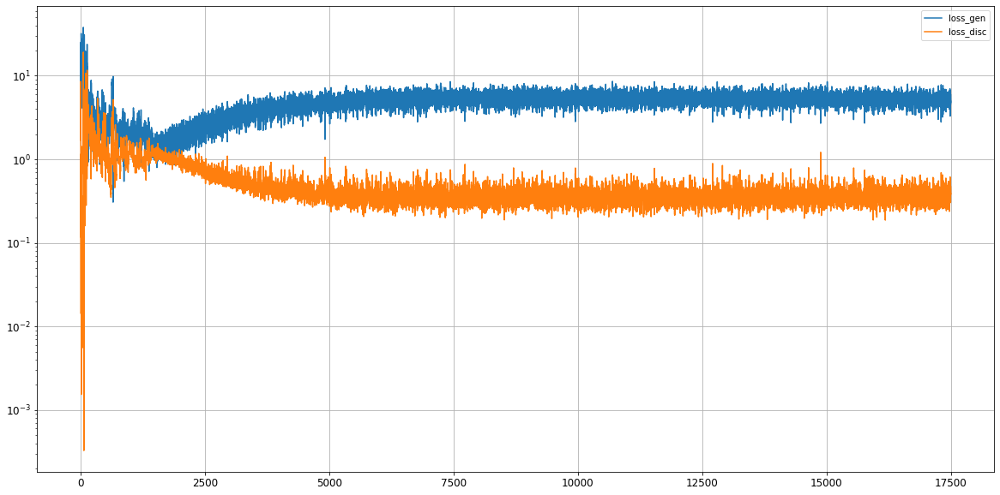

Epoch 17502/20000
0s
Epoch 17503/20000
0s
Epoch 17504/20000
0s
Epoch 17505/20000
0s
Epoch 17506/20000
0s
Epoch 17507/20000
0s
Epoch 17508/20000
0s
Epoch 17509/20000
0s
Epoch 17510/20000
0s
Epoch 17511/20000
0s
Epoch 17512/20000
0s
Epoch 17513/20000
0s
Epoch 17514/20000
0s
Epoch 17515/20000
0s
Epoch 17516/20000
0s
Epoch 17517/20000
0s
Epoch 17518/20000
0s
Epoch 17519/20000
0s
Epoch 17520/20000
0s
Epoch 17521/20000
0s
Epoch 17522/20000
0s
Epoch 17523/20000
0s
Epoch 17524/20000
0s
Epoch 17525/20000
0s
Epoch 17526/20000
0s
Epoch 17527/20000
0s
Epoch 17528/20000
0s
Epoch 17529/20000
0s
Epoch 17530/20000
0s
Epoch 17531/20000
0s
Epoch 17532/20000
0s
Epoch 17533/20000
0s
Epoch 17534/20000
0s
Epoch 17535/20000
0s
Epoch 17536/20000
0s
Epoch 17537/20000
0s
Epoch 17538/20000
0s
Epoch 17539/20000
0s
Epoch 17540/20000
0s
Epoch 17541/20000
0s
Epoch 17542/20000
0s
Epoch 17543/20000
0s
Epoch 17544/20000
0s
Epoch 17545/20000
0s
Epoch 17546/20000
0s
Epoch 17547/20000
0s
Epoch 17548/20000
0s
Epoch 17549/2

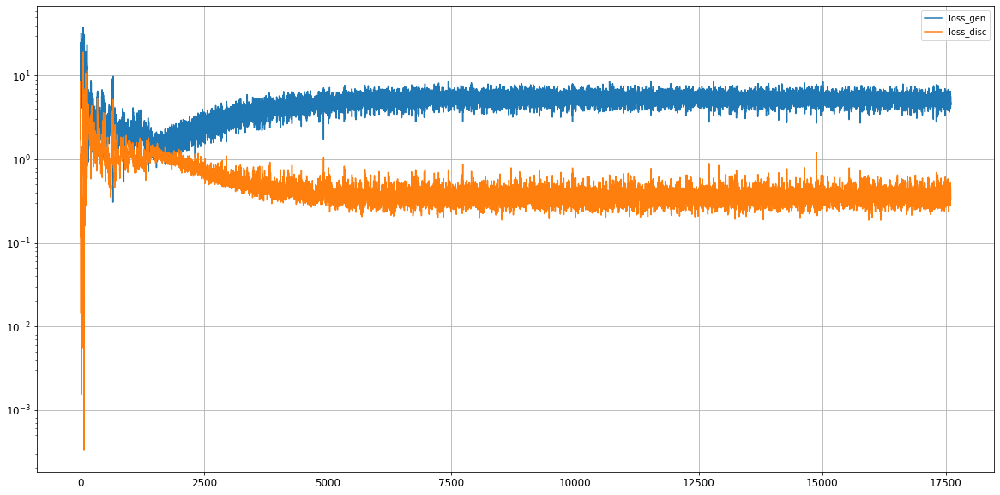

Epoch 17602/20000
0s
Epoch 17603/20000
0s
Epoch 17604/20000
0s
Epoch 17605/20000
0s
Epoch 17606/20000
0s
Epoch 17607/20000
0s
Epoch 17608/20000
0s
Epoch 17609/20000
0s
Epoch 17610/20000
0s
Epoch 17611/20000
0s
Epoch 17612/20000
0s
Epoch 17613/20000
0s
Epoch 17614/20000
0s
Epoch 17615/20000
0s
Epoch 17616/20000
0s
Epoch 17617/20000
0s
Epoch 17618/20000
0s
Epoch 17619/20000
0s
Epoch 17620/20000
0s
Epoch 17621/20000
0s
Epoch 17622/20000
0s
Epoch 17623/20000
0s
Epoch 17624/20000
0s
Epoch 17625/20000
0s
Epoch 17626/20000
0s
Epoch 17627/20000
0s
Epoch 17628/20000
0s
Epoch 17629/20000
0s
Epoch 17630/20000
0s
Epoch 17631/20000
0s
Epoch 17632/20000
0s
Epoch 17633/20000
0s
Epoch 17634/20000
0s
Epoch 17635/20000
0s
Epoch 17636/20000
0s
Epoch 17637/20000
0s
Epoch 17638/20000
0s
Epoch 17639/20000
0s
Epoch 17640/20000
0s
Epoch 17641/20000
0s
Epoch 17642/20000
0s
Epoch 17643/20000
0s
Epoch 17644/20000
0s
Epoch 17645/20000
0s
Epoch 17646/20000
0s
Epoch 17647/20000
0s
Epoch 17648/20000
0s
Epoch 17649/2

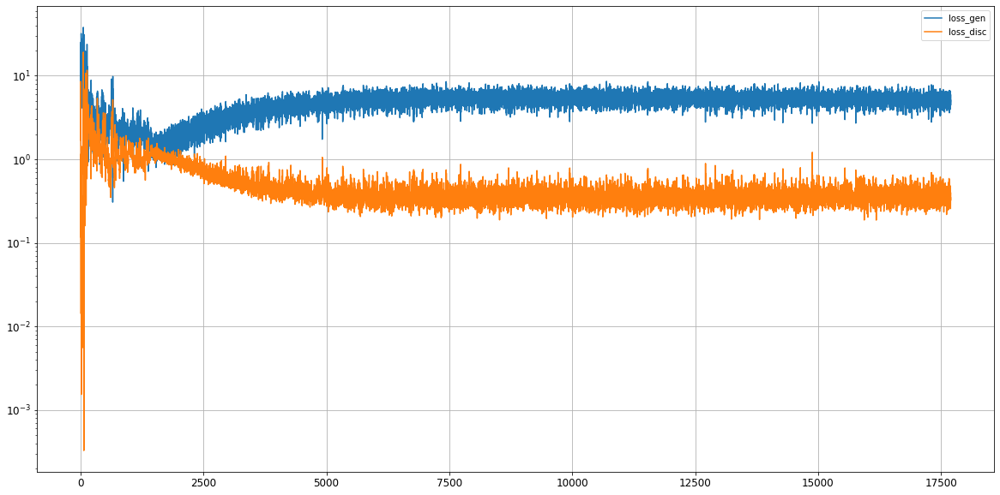

Epoch 17702/20000
0s
Epoch 17703/20000
0s
Epoch 17704/20000
0s
Epoch 17705/20000
0s
Epoch 17706/20000
0s
Epoch 17707/20000
0s
Epoch 17708/20000
0s
Epoch 17709/20000
0s
Epoch 17710/20000
0s
Epoch 17711/20000
0s
Epoch 17712/20000
0s
Epoch 17713/20000
0s
Epoch 17714/20000
0s
Epoch 17715/20000
0s
Epoch 17716/20000
0s
Epoch 17717/20000
0s
Epoch 17718/20000
0s
Epoch 17719/20000
0s
Epoch 17720/20000
0s
Epoch 17721/20000
0s
Epoch 17722/20000
0s
Epoch 17723/20000
0s
Epoch 17724/20000
0s
Epoch 17725/20000
0s
Epoch 17726/20000
0s
Epoch 17727/20000
0s
Epoch 17728/20000
0s
Epoch 17729/20000
0s
Epoch 17730/20000
0s
Epoch 17731/20000
0s
Epoch 17732/20000
0s
Epoch 17733/20000
0s
Epoch 17734/20000
0s
Epoch 17735/20000
0s
Epoch 17736/20000
0s
Epoch 17737/20000
0s
Epoch 17738/20000
0s
Epoch 17739/20000
0s
Epoch 17740/20000
0s
Epoch 17741/20000
0s
Epoch 17742/20000
0s
Epoch 17743/20000
0s
Epoch 17744/20000
0s
Epoch 17745/20000
0s
Epoch 17746/20000
0s
Epoch 17747/20000
0s
Epoch 17748/20000
0s
Epoch 17749/2

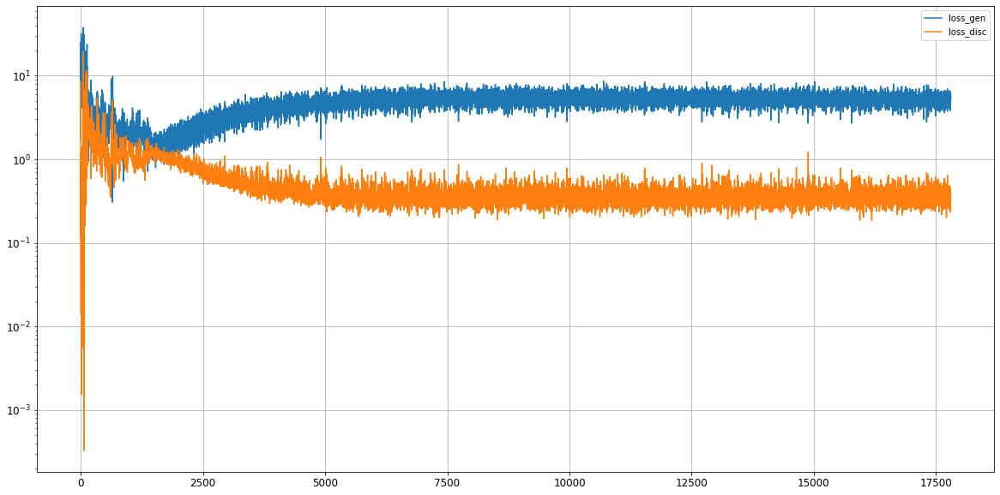

Epoch 17802/20000
0s
Epoch 17803/20000
0s
Epoch 17804/20000
0s
Epoch 17805/20000
0s
Epoch 17806/20000
0s
Epoch 17807/20000
0s
Epoch 17808/20000
0s
Epoch 17809/20000
0s
Epoch 17810/20000
0s
Epoch 17811/20000
0s
Epoch 17812/20000
0s
Epoch 17813/20000
0s
Epoch 17814/20000
0s
Epoch 17815/20000
0s
Epoch 17816/20000
0s
Epoch 17817/20000
0s
Epoch 17818/20000
0s
Epoch 17819/20000
0s
Epoch 17820/20000
0s
Epoch 17821/20000
0s
Epoch 17822/20000
0s
Epoch 17823/20000
0s
Epoch 17824/20000
0s
Epoch 17825/20000
0s
Epoch 17826/20000
0s
Epoch 17827/20000
0s
Epoch 17828/20000
0s
Epoch 17829/20000
0s
Epoch 17830/20000
0s
Epoch 17831/20000
0s
Epoch 17832/20000
0s
Epoch 17833/20000
0s
Epoch 17834/20000
0s
Epoch 17835/20000
0s
Epoch 17836/20000
0s
Epoch 17837/20000
0s
Epoch 17838/20000
0s
Epoch 17839/20000
0s
Epoch 17840/20000
0s
Epoch 17841/20000
0s
Epoch 17842/20000
0s
Epoch 17843/20000
0s
Epoch 17844/20000
0s
Epoch 17845/20000
0s
Epoch 17846/20000
0s
Epoch 17847/20000
0s
Epoch 17848/20000
0s
Epoch 17849/2

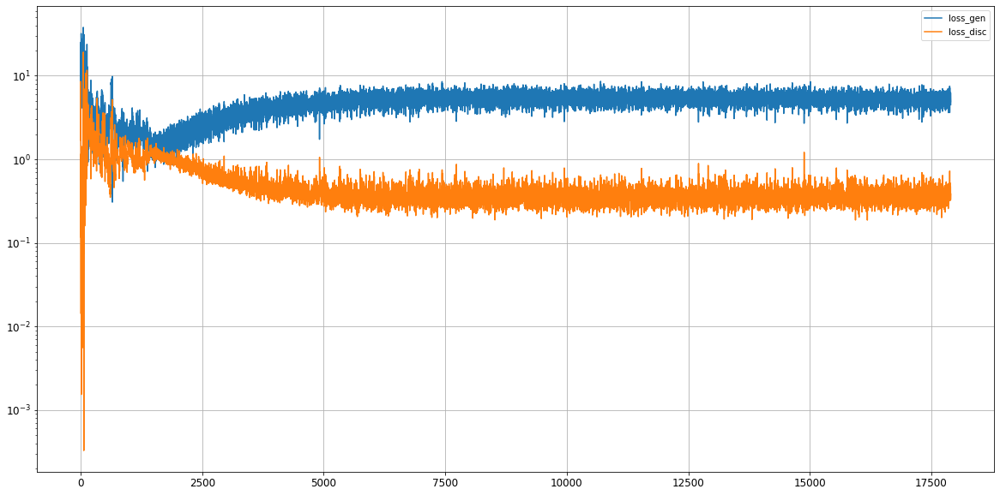

Epoch 17902/20000
0s
Epoch 17903/20000
0s
Epoch 17904/20000
0s
Epoch 17905/20000
0s
Epoch 17906/20000
0s
Epoch 17907/20000
0s
Epoch 17908/20000
0s
Epoch 17909/20000
0s
Epoch 17910/20000
0s
Epoch 17911/20000
0s
Epoch 17912/20000
0s
Epoch 17913/20000
0s
Epoch 17914/20000
0s
Epoch 17915/20000
0s
Epoch 17916/20000
0s
Epoch 17917/20000
0s
Epoch 17918/20000
0s
Epoch 17919/20000
0s
Epoch 17920/20000
0s
Epoch 17921/20000
0s
Epoch 17922/20000
0s
Epoch 17923/20000
0s
Epoch 17924/20000
0s
Epoch 17925/20000
0s
Epoch 17926/20000
0s
Epoch 17927/20000
0s
Epoch 17928/20000
0s
Epoch 17929/20000
0s
Epoch 17930/20000
0s
Epoch 17931/20000
0s
Epoch 17932/20000
0s
Epoch 17933/20000
0s
Epoch 17934/20000
0s
Epoch 17935/20000
0s
Epoch 17936/20000
0s
Epoch 17937/20000
0s
Epoch 17938/20000
0s
Epoch 17939/20000
0s
Epoch 17940/20000
0s
Epoch 17941/20000
0s
Epoch 17942/20000
0s
Epoch 17943/20000
0s
Epoch 17944/20000
0s
Epoch 17945/20000
0s
Epoch 17946/20000
0s
Epoch 17947/20000
0s
Epoch 17948/20000
0s
Epoch 17949/2

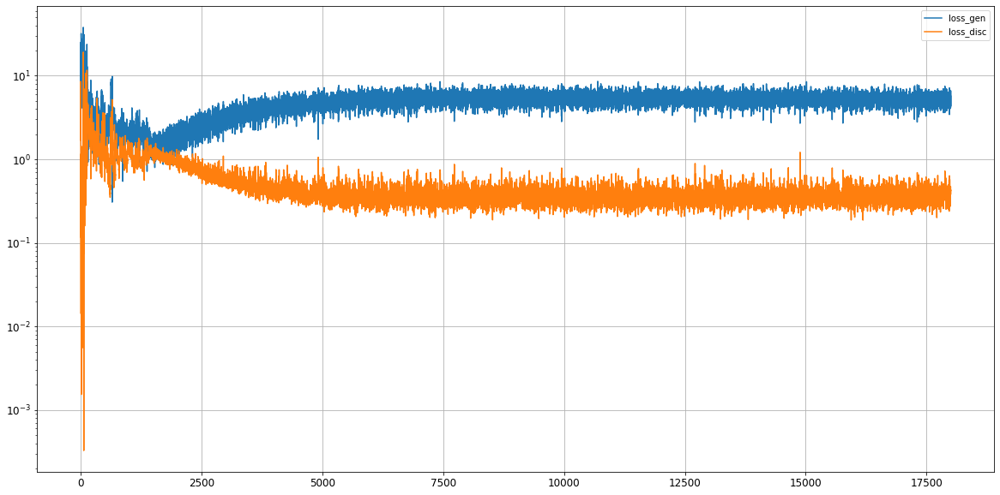

Epoch 18002/20000
0s
Epoch 18003/20000
0s
Epoch 18004/20000
0s
Epoch 18005/20000
0s
Epoch 18006/20000
0s
Epoch 18007/20000
0s
Epoch 18008/20000
0s
Epoch 18009/20000
0s
Epoch 18010/20000
0s
Epoch 18011/20000
0s
Epoch 18012/20000
0s
Epoch 18013/20000
0s
Epoch 18014/20000
0s
Epoch 18015/20000
0s
Epoch 18016/20000
0s
Epoch 18017/20000
0s
Epoch 18018/20000
0s
Epoch 18019/20000
0s
Epoch 18020/20000
0s
Epoch 18021/20000
0s
Epoch 18022/20000
0s
Epoch 18023/20000
0s
Epoch 18024/20000
0s
Epoch 18025/20000
0s
Epoch 18026/20000
0s
Epoch 18027/20000
0s
Epoch 18028/20000
0s
Epoch 18029/20000
0s
Epoch 18030/20000
0s
Epoch 18031/20000
0s
Epoch 18032/20000
0s
Epoch 18033/20000
0s
Epoch 18034/20000
0s
Epoch 18035/20000
0s
Epoch 18036/20000
0s
Epoch 18037/20000
0s
Epoch 18038/20000
0s
Epoch 18039/20000
0s
Epoch 18040/20000
0s
Epoch 18041/20000
0s
Epoch 18042/20000
0s
Epoch 18043/20000
0s
Epoch 18044/20000
0s
Epoch 18045/20000
0s
Epoch 18046/20000
0s
Epoch 18047/20000
0s
Epoch 18048/20000
0s
Epoch 18049/2

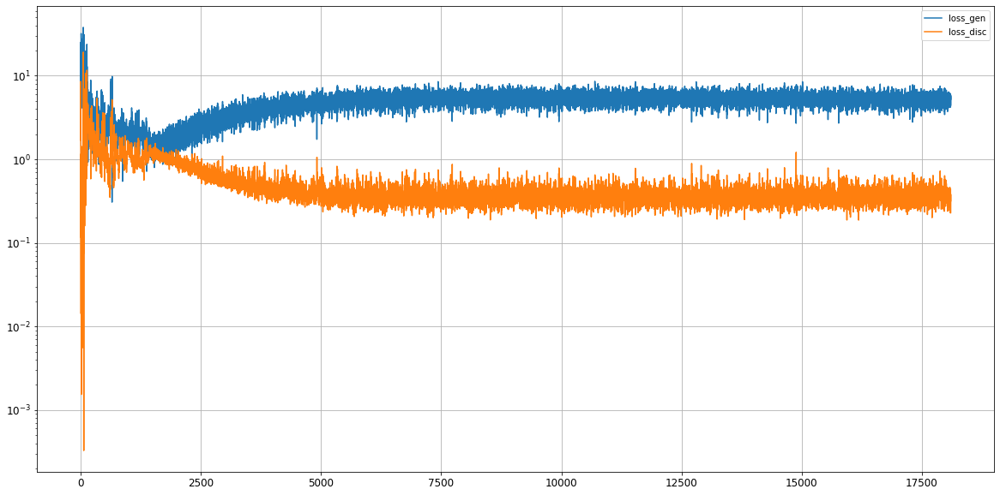

Epoch 18102/20000
0s
Epoch 18103/20000
0s
Epoch 18104/20000
0s
Epoch 18105/20000
0s
Epoch 18106/20000
0s
Epoch 18107/20000
0s
Epoch 18108/20000
0s
Epoch 18109/20000
0s
Epoch 18110/20000
0s
Epoch 18111/20000
0s
Epoch 18112/20000
0s
Epoch 18113/20000
0s
Epoch 18114/20000
0s
Epoch 18115/20000
0s
Epoch 18116/20000
0s
Epoch 18117/20000
0s
Epoch 18118/20000
0s
Epoch 18119/20000
0s
Epoch 18120/20000
0s
Epoch 18121/20000
0s
Epoch 18122/20000
0s
Epoch 18123/20000
0s
Epoch 18124/20000
0s
Epoch 18125/20000
0s
Epoch 18126/20000
0s
Epoch 18127/20000
0s
Epoch 18128/20000
0s
Epoch 18129/20000
0s
Epoch 18130/20000
0s
Epoch 18131/20000
0s
Epoch 18132/20000
0s
Epoch 18133/20000
0s
Epoch 18134/20000
0s
Epoch 18135/20000
0s
Epoch 18136/20000
0s
Epoch 18137/20000
0s
Epoch 18138/20000
0s
Epoch 18139/20000
0s
Epoch 18140/20000
0s
Epoch 18141/20000
0s
Epoch 18142/20000
0s
Epoch 18143/20000
0s
Epoch 18144/20000
0s
Epoch 18145/20000
0s
Epoch 18146/20000
0s
Epoch 18147/20000
0s
Epoch 18148/20000
0s
Epoch 18149/2

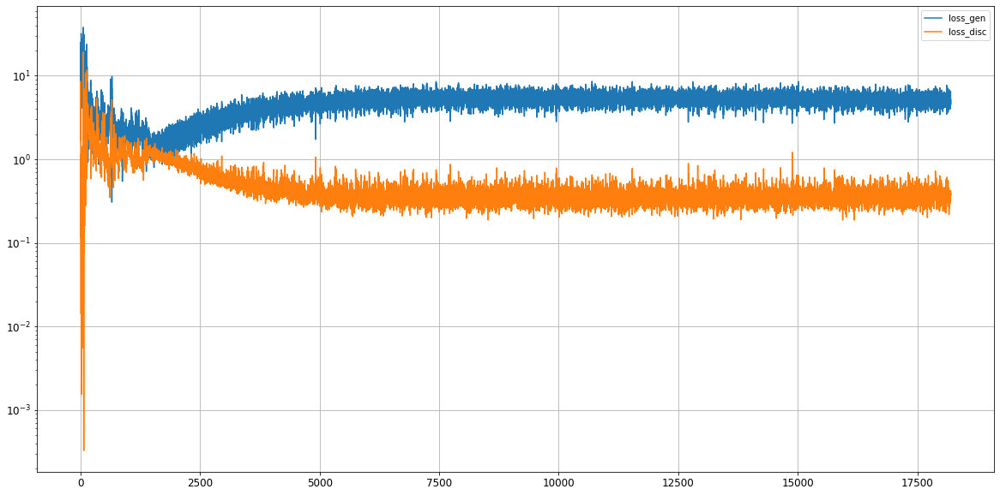

Epoch 18202/20000
0s
Epoch 18203/20000
0s
Epoch 18204/20000
0s
Epoch 18205/20000
0s
Epoch 18206/20000
0s
Epoch 18207/20000
0s
Epoch 18208/20000
0s
Epoch 18209/20000
0s
Epoch 18210/20000
0s
Epoch 18211/20000
0s
Epoch 18212/20000
0s
Epoch 18213/20000
0s
Epoch 18214/20000
0s
Epoch 18215/20000
0s
Epoch 18216/20000
0s
Epoch 18217/20000
0s
Epoch 18218/20000
0s
Epoch 18219/20000
0s
Epoch 18220/20000
0s
Epoch 18221/20000
0s
Epoch 18222/20000
0s
Epoch 18223/20000
0s
Epoch 18224/20000
0s
Epoch 18225/20000
0s
Epoch 18226/20000
0s
Epoch 18227/20000
0s
Epoch 18228/20000
0s
Epoch 18229/20000
0s
Epoch 18230/20000
0s
Epoch 18231/20000
0s
Epoch 18232/20000
0s
Epoch 18233/20000
0s
Epoch 18234/20000
0s
Epoch 18235/20000
0s
Epoch 18236/20000
0s
Epoch 18237/20000
0s
Epoch 18238/20000
0s
Epoch 18239/20000
0s
Epoch 18240/20000
0s
Epoch 18241/20000
0s
Epoch 18242/20000
0s
Epoch 18243/20000
0s
Epoch 18244/20000
0s
Epoch 18245/20000
0s
Epoch 18246/20000
0s
Epoch 18247/20000
0s
Epoch 18248/20000
0s
Epoch 18249/2

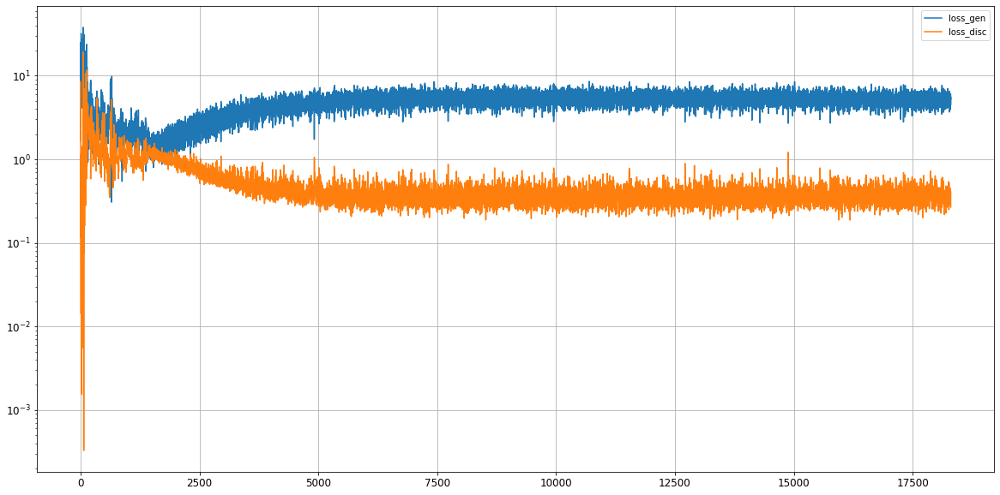

Epoch 18302/20000
0s
Epoch 18303/20000
0s
Epoch 18304/20000
0s
Epoch 18305/20000
0s
Epoch 18306/20000
0s
Epoch 18307/20000
0s
Epoch 18308/20000
0s
Epoch 18309/20000
0s
Epoch 18310/20000
0s
Epoch 18311/20000
0s
Epoch 18312/20000
0s
Epoch 18313/20000
0s
Epoch 18314/20000
0s
Epoch 18315/20000
0s
Epoch 18316/20000
0s
Epoch 18317/20000
0s
Epoch 18318/20000
0s
Epoch 18319/20000
0s
Epoch 18320/20000
0s
Epoch 18321/20000
0s
Epoch 18322/20000
0s
Epoch 18323/20000
0s
Epoch 18324/20000
0s
Epoch 18325/20000
0s
Epoch 18326/20000
0s
Epoch 18327/20000
0s
Epoch 18328/20000
0s
Epoch 18329/20000
0s
Epoch 18330/20000
0s
Epoch 18331/20000
0s
Epoch 18332/20000
0s
Epoch 18333/20000
0s
Epoch 18334/20000
0s
Epoch 18335/20000
0s
Epoch 18336/20000
0s
Epoch 18337/20000
0s
Epoch 18338/20000
0s
Epoch 18339/20000
0s
Epoch 18340/20000
0s
Epoch 18341/20000
0s
Epoch 18342/20000
0s
Epoch 18343/20000
0s
Epoch 18344/20000
0s
Epoch 18345/20000
0s
Epoch 18346/20000
0s
Epoch 18347/20000
0s
Epoch 18348/20000
0s
Epoch 18349/2

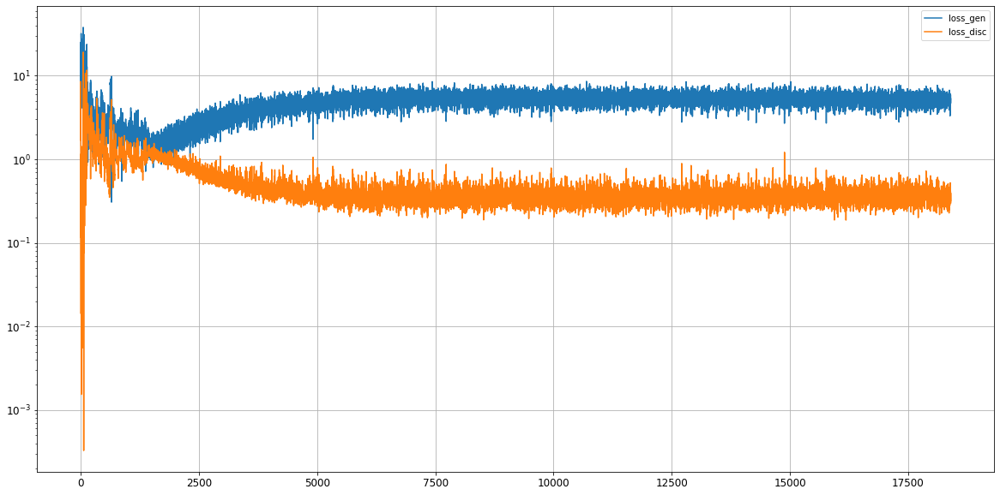

Epoch 18402/20000
0s
Epoch 18403/20000
0s
Epoch 18404/20000
0s
Epoch 18405/20000
0s
Epoch 18406/20000
0s
Epoch 18407/20000
0s
Epoch 18408/20000
0s
Epoch 18409/20000
0s
Epoch 18410/20000
0s
Epoch 18411/20000
0s
Epoch 18412/20000
0s
Epoch 18413/20000
0s
Epoch 18414/20000
0s
Epoch 18415/20000
0s
Epoch 18416/20000
0s
Epoch 18417/20000
0s
Epoch 18418/20000
0s
Epoch 18419/20000
0s
Epoch 18420/20000
0s
Epoch 18421/20000
0s
Epoch 18422/20000
0s
Epoch 18423/20000
0s
Epoch 18424/20000
0s
Epoch 18425/20000
0s
Epoch 18426/20000
0s
Epoch 18427/20000
0s
Epoch 18428/20000
0s
Epoch 18429/20000
0s
Epoch 18430/20000
0s
Epoch 18431/20000
0s
Epoch 18432/20000
0s
Epoch 18433/20000
0s
Epoch 18434/20000
0s
Epoch 18435/20000
0s
Epoch 18436/20000
0s
Epoch 18437/20000
0s
Epoch 18438/20000
0s
Epoch 18439/20000
0s
Epoch 18440/20000
0s
Epoch 18441/20000
0s
Epoch 18442/20000
0s
Epoch 18443/20000
0s
Epoch 18444/20000
0s
Epoch 18445/20000
0s
Epoch 18446/20000
0s
Epoch 18447/20000
0s
Epoch 18448/20000
0s
Epoch 18449/2

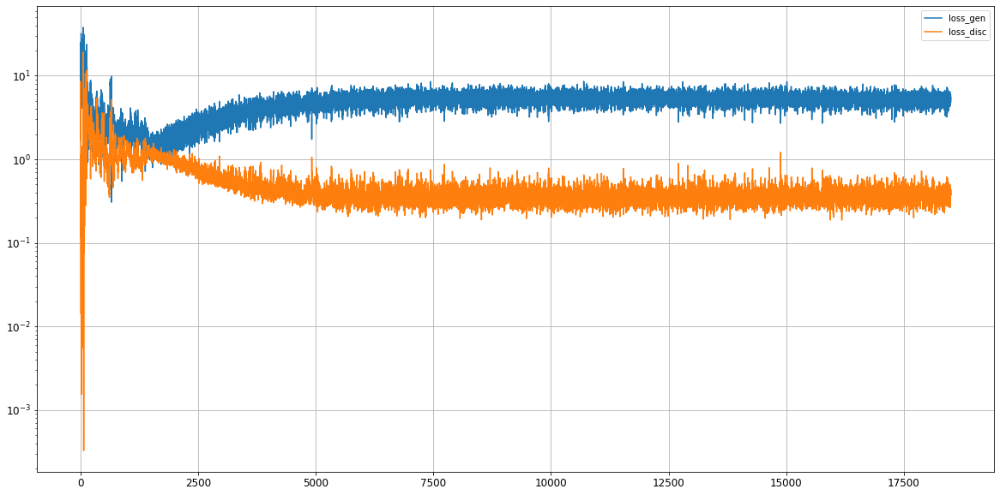

Epoch 18502/20000
0s
Epoch 18503/20000
0s
Epoch 18504/20000
0s
Epoch 18505/20000
0s
Epoch 18506/20000
0s
Epoch 18507/20000
0s
Epoch 18508/20000
0s
Epoch 18509/20000
0s
Epoch 18510/20000
0s
Epoch 18511/20000
0s
Epoch 18512/20000
0s
Epoch 18513/20000
0s
Epoch 18514/20000
0s
Epoch 18515/20000
0s
Epoch 18516/20000
0s
Epoch 18517/20000
0s
Epoch 18518/20000
0s
Epoch 18519/20000
0s
Epoch 18520/20000
0s
Epoch 18521/20000
0s
Epoch 18522/20000
0s
Epoch 18523/20000
0s
Epoch 18524/20000
0s
Epoch 18525/20000
0s
Epoch 18526/20000
0s
Epoch 18527/20000
0s
Epoch 18528/20000
0s
Epoch 18529/20000
0s
Epoch 18530/20000
0s
Epoch 18531/20000
0s
Epoch 18532/20000
0s
Epoch 18533/20000
0s
Epoch 18534/20000
0s
Epoch 18535/20000
0s
Epoch 18536/20000
0s
Epoch 18537/20000
0s
Epoch 18538/20000
0s
Epoch 18539/20000
0s
Epoch 18540/20000
0s
Epoch 18541/20000
0s
Epoch 18542/20000
0s
Epoch 18543/20000
0s
Epoch 18544/20000
0s
Epoch 18545/20000
0s
Epoch 18546/20000
0s
Epoch 18547/20000
0s
Epoch 18548/20000
0s
Epoch 18549/2

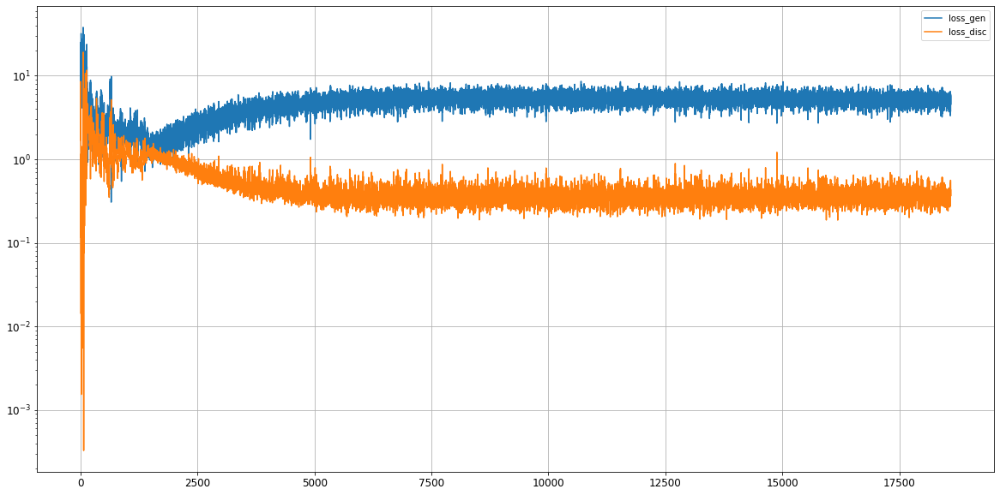

Epoch 18602/20000
0s
Epoch 18603/20000
0s
Epoch 18604/20000
0s
Epoch 18605/20000
0s
Epoch 18606/20000
0s
Epoch 18607/20000
0s
Epoch 18608/20000
0s
Epoch 18609/20000
0s
Epoch 18610/20000
0s
Epoch 18611/20000
0s
Epoch 18612/20000
0s
Epoch 18613/20000
0s
Epoch 18614/20000
0s
Epoch 18615/20000
0s
Epoch 18616/20000
0s
Epoch 18617/20000
0s
Epoch 18618/20000
0s
Epoch 18619/20000
0s
Epoch 18620/20000
0s
Epoch 18621/20000
0s
Epoch 18622/20000
0s
Epoch 18623/20000
0s
Epoch 18624/20000
0s
Epoch 18625/20000
0s
Epoch 18626/20000
0s
Epoch 18627/20000
0s
Epoch 18628/20000
0s
Epoch 18629/20000
0s
Epoch 18630/20000
0s
Epoch 18631/20000
0s
Epoch 18632/20000
0s
Epoch 18633/20000
0s
Epoch 18634/20000
0s
Epoch 18635/20000
0s
Epoch 18636/20000
0s
Epoch 18637/20000
0s
Epoch 18638/20000
0s
Epoch 18639/20000
0s
Epoch 18640/20000
0s
Epoch 18641/20000
0s
Epoch 18642/20000
0s
Epoch 18643/20000
0s
Epoch 18644/20000
0s
Epoch 18645/20000
0s
Epoch 18646/20000
0s
Epoch 18647/20000
0s
Epoch 18648/20000
0s
Epoch 18649/2

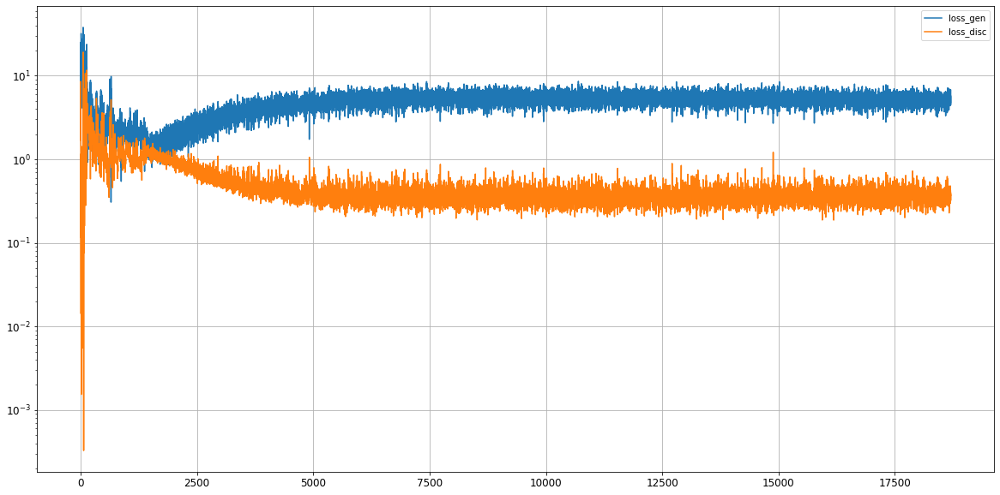

Epoch 18702/20000
0s
Epoch 18703/20000
0s
Epoch 18704/20000
0s
Epoch 18705/20000
0s
Epoch 18706/20000
0s
Epoch 18707/20000
0s
Epoch 18708/20000
0s
Epoch 18709/20000
0s
Epoch 18710/20000
0s
Epoch 18711/20000
0s
Epoch 18712/20000
0s
Epoch 18713/20000
0s
Epoch 18714/20000
0s
Epoch 18715/20000
0s
Epoch 18716/20000
0s
Epoch 18717/20000
0s
Epoch 18718/20000
0s
Epoch 18719/20000
0s
Epoch 18720/20000
0s
Epoch 18721/20000
0s
Epoch 18722/20000
0s
Epoch 18723/20000
0s
Epoch 18724/20000
0s
Epoch 18725/20000
0s
Epoch 18726/20000
0s
Epoch 18727/20000
0s
Epoch 18728/20000
0s
Epoch 18729/20000
0s
Epoch 18730/20000
0s
Epoch 18731/20000
0s
Epoch 18732/20000
0s
Epoch 18733/20000
0s
Epoch 18734/20000
0s
Epoch 18735/20000
0s
Epoch 18736/20000
0s
Epoch 18737/20000
0s
Epoch 18738/20000
0s
Epoch 18739/20000
0s
Epoch 18740/20000
0s
Epoch 18741/20000
0s
Epoch 18742/20000
0s
Epoch 18743/20000
0s
Epoch 18744/20000
0s
Epoch 18745/20000
0s
Epoch 18746/20000
0s
Epoch 18747/20000
0s
Epoch 18748/20000
0s
Epoch 18749/2

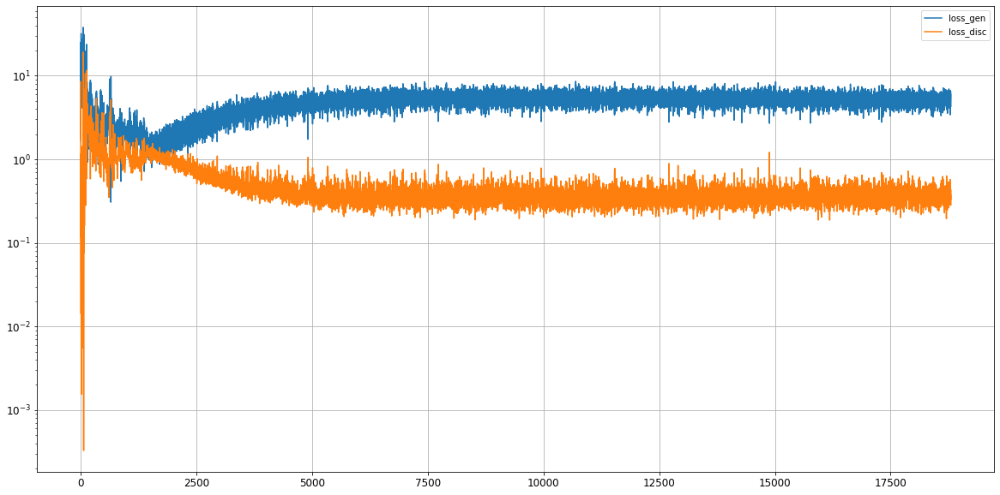

Epoch 18802/20000
0s
Epoch 18803/20000
0s
Epoch 18804/20000
0s
Epoch 18805/20000
0s
Epoch 18806/20000
0s
Epoch 18807/20000
0s
Epoch 18808/20000
0s
Epoch 18809/20000
0s
Epoch 18810/20000
0s
Epoch 18811/20000
0s
Epoch 18812/20000
0s
Epoch 18813/20000
0s
Epoch 18814/20000
0s
Epoch 18815/20000
0s
Epoch 18816/20000
0s
Epoch 18817/20000
0s
Epoch 18818/20000
0s
Epoch 18819/20000
0s
Epoch 18820/20000
0s
Epoch 18821/20000
0s
Epoch 18822/20000
0s
Epoch 18823/20000
0s
Epoch 18824/20000
0s
Epoch 18825/20000
0s
Epoch 18826/20000
0s
Epoch 18827/20000
0s
Epoch 18828/20000
0s
Epoch 18829/20000
0s
Epoch 18830/20000
0s
Epoch 18831/20000
0s
Epoch 18832/20000
0s
Epoch 18833/20000
0s
Epoch 18834/20000
0s
Epoch 18835/20000
0s
Epoch 18836/20000
0s
Epoch 18837/20000
0s
Epoch 18838/20000
0s
Epoch 18839/20000
0s
Epoch 18840/20000
0s
Epoch 18841/20000
0s
Epoch 18842/20000
0s
Epoch 18843/20000
0s
Epoch 18844/20000
0s
Epoch 18845/20000
0s
Epoch 18846/20000
0s
Epoch 18847/20000
0s
Epoch 18848/20000
0s
Epoch 18849/2

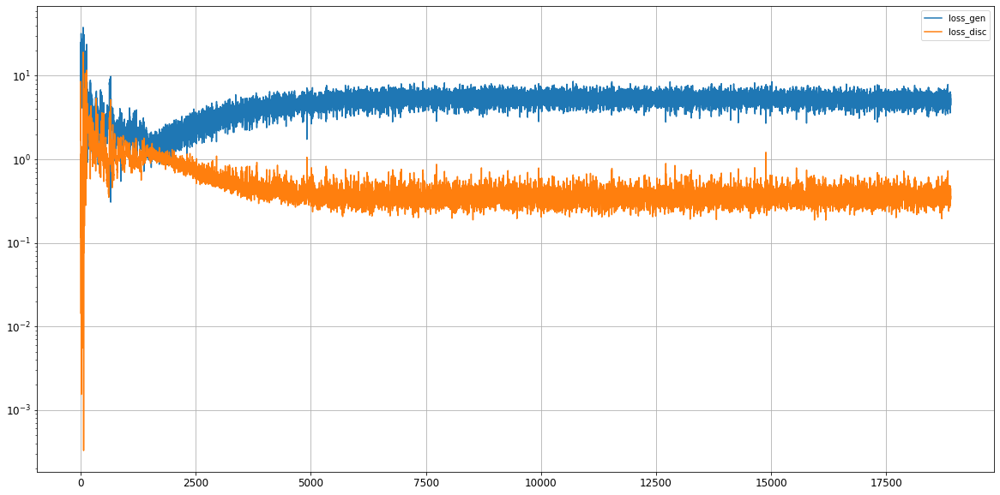

Epoch 18902/20000
0s
Epoch 18903/20000
0s
Epoch 18904/20000
0s
Epoch 18905/20000
0s
Epoch 18906/20000
0s
Epoch 18907/20000
0s
Epoch 18908/20000
0s
Epoch 18909/20000
0s
Epoch 18910/20000
0s
Epoch 18911/20000
0s
Epoch 18912/20000
0s
Epoch 18913/20000
0s
Epoch 18914/20000
0s
Epoch 18915/20000
0s
Epoch 18916/20000
0s
Epoch 18917/20000
0s
Epoch 18918/20000
0s
Epoch 18919/20000
0s
Epoch 18920/20000
0s
Epoch 18921/20000
0s
Epoch 18922/20000
0s
Epoch 18923/20000
0s
Epoch 18924/20000
0s
Epoch 18925/20000
0s
Epoch 18926/20000
0s
Epoch 18927/20000
0s
Epoch 18928/20000
0s
Epoch 18929/20000
0s
Epoch 18930/20000
0s
Epoch 18931/20000
0s
Epoch 18932/20000
0s
Epoch 18933/20000
0s
Epoch 18934/20000
0s
Epoch 18935/20000
0s
Epoch 18936/20000
0s
Epoch 18937/20000
0s
Epoch 18938/20000
0s
Epoch 18939/20000
0s
Epoch 18940/20000
0s
Epoch 18941/20000
0s
Epoch 18942/20000
0s
Epoch 18943/20000
0s
Epoch 18944/20000
0s
Epoch 18945/20000
0s
Epoch 18946/20000
0s
Epoch 18947/20000
0s
Epoch 18948/20000
0s
Epoch 18949/2

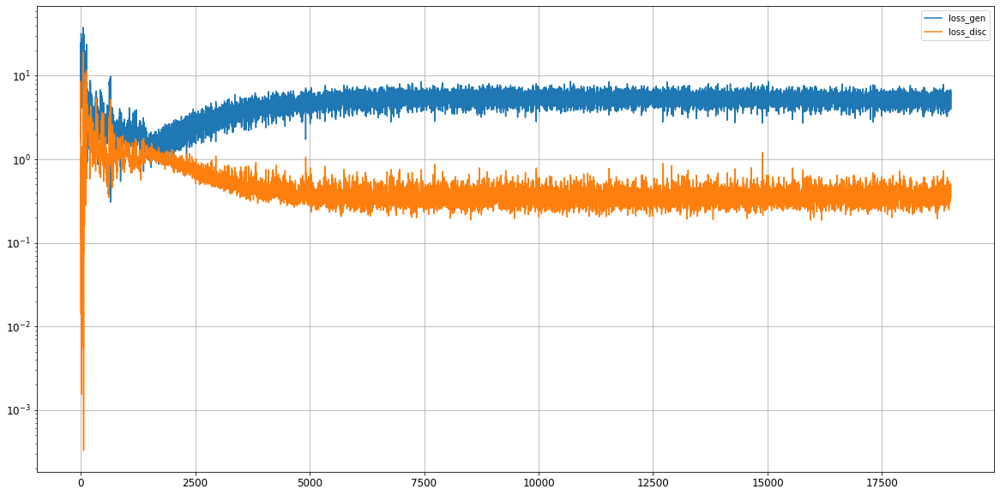

Epoch 19002/20000
0s
Epoch 19003/20000
0s
Epoch 19004/20000
0s
Epoch 19005/20000
0s
Epoch 19006/20000
0s
Epoch 19007/20000
0s
Epoch 19008/20000
0s
Epoch 19009/20000
0s
Epoch 19010/20000
0s
Epoch 19011/20000
0s
Epoch 19012/20000
0s
Epoch 19013/20000
0s
Epoch 19014/20000
0s
Epoch 19015/20000
0s
Epoch 19016/20000
0s
Epoch 19017/20000
0s
Epoch 19018/20000
0s
Epoch 19019/20000
0s
Epoch 19020/20000
0s
Epoch 19021/20000
0s
Epoch 19022/20000
0s
Epoch 19023/20000
0s
Epoch 19024/20000
0s
Epoch 19025/20000
0s
Epoch 19026/20000
0s
Epoch 19027/20000
0s
Epoch 19028/20000
0s
Epoch 19029/20000
0s
Epoch 19030/20000
0s
Epoch 19031/20000
0s
Epoch 19032/20000
0s
Epoch 19033/20000
0s
Epoch 19034/20000
0s
Epoch 19035/20000
0s
Epoch 19036/20000
0s
Epoch 19037/20000
0s
Epoch 19038/20000
0s
Epoch 19039/20000
0s
Epoch 19040/20000
0s
Epoch 19041/20000
0s
Epoch 19042/20000
0s
Epoch 19043/20000
0s
Epoch 19044/20000
0s
Epoch 19045/20000
0s
Epoch 19046/20000
0s
Epoch 19047/20000
0s
Epoch 19048/20000
0s
Epoch 19049/2

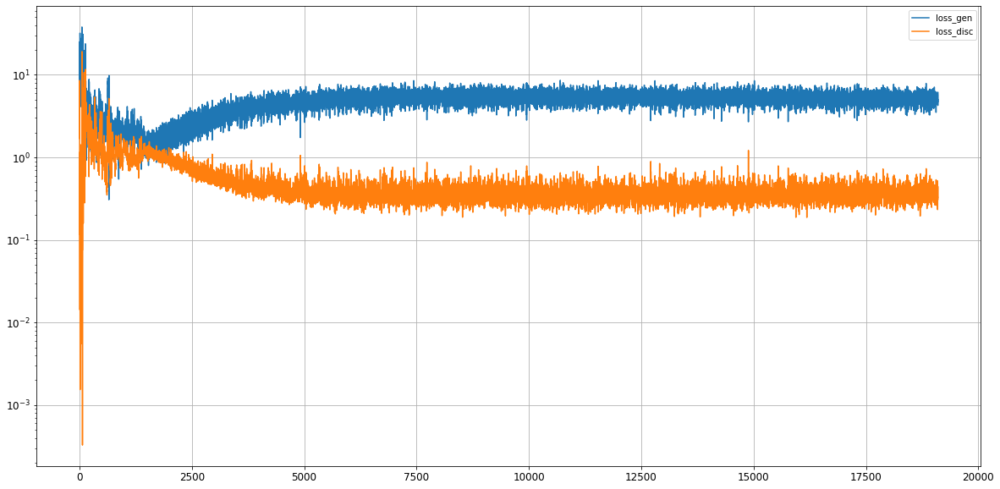

Epoch 19102/20000
0s
Epoch 19103/20000
0s
Epoch 19104/20000
0s
Epoch 19105/20000
0s
Epoch 19106/20000
0s
Epoch 19107/20000
0s
Epoch 19108/20000
0s
Epoch 19109/20000
0s
Epoch 19110/20000
0s
Epoch 19111/20000
0s
Epoch 19112/20000
0s
Epoch 19113/20000
0s
Epoch 19114/20000
0s
Epoch 19115/20000
0s
Epoch 19116/20000
0s
Epoch 19117/20000
0s
Epoch 19118/20000
0s
Epoch 19119/20000
0s
Epoch 19120/20000
0s
Epoch 19121/20000
0s
Epoch 19122/20000
0s
Epoch 19123/20000
0s
Epoch 19124/20000
0s
Epoch 19125/20000
0s
Epoch 19126/20000
0s
Epoch 19127/20000
0s
Epoch 19128/20000
0s
Epoch 19129/20000
0s
Epoch 19130/20000
0s
Epoch 19131/20000
0s
Epoch 19132/20000
0s
Epoch 19133/20000
0s
Epoch 19134/20000
0s
Epoch 19135/20000
0s
Epoch 19136/20000
0s
Epoch 19137/20000
0s
Epoch 19138/20000
0s
Epoch 19139/20000
0s
Epoch 19140/20000
0s
Epoch 19141/20000
0s
Epoch 19142/20000
0s
Epoch 19143/20000
0s
Epoch 19144/20000
0s
Epoch 19145/20000
0s
Epoch 19146/20000
0s
Epoch 19147/20000
0s
Epoch 19148/20000
0s
Epoch 19149/2

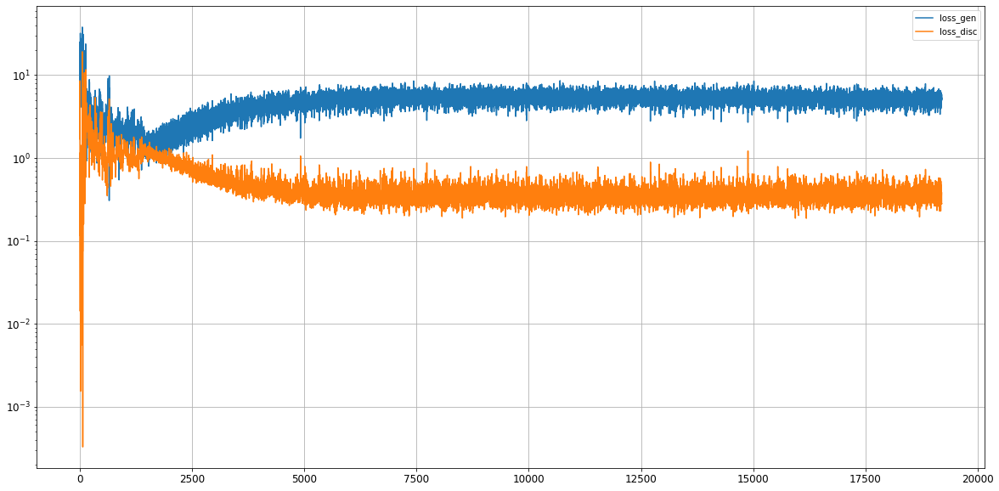

Epoch 19202/20000
0s
Epoch 19203/20000
0s
Epoch 19204/20000
0s
Epoch 19205/20000
0s
Epoch 19206/20000
0s
Epoch 19207/20000
0s
Epoch 19208/20000
0s
Epoch 19209/20000
0s
Epoch 19210/20000
0s
Epoch 19211/20000
0s
Epoch 19212/20000
0s
Epoch 19213/20000
0s
Epoch 19214/20000
0s
Epoch 19215/20000
0s
Epoch 19216/20000
0s
Epoch 19217/20000
0s
Epoch 19218/20000
0s
Epoch 19219/20000
0s
Epoch 19220/20000
0s
Epoch 19221/20000
0s
Epoch 19222/20000
0s
Epoch 19223/20000
0s
Epoch 19224/20000
0s
Epoch 19225/20000
0s
Epoch 19226/20000
0s
Epoch 19227/20000
0s
Epoch 19228/20000
0s
Epoch 19229/20000
0s
Epoch 19230/20000
0s
Epoch 19231/20000
0s
Epoch 19232/20000
0s
Epoch 19233/20000
0s
Epoch 19234/20000
0s
Epoch 19235/20000
0s
Epoch 19236/20000
0s
Epoch 19237/20000
0s
Epoch 19238/20000
0s
Epoch 19239/20000
0s
Epoch 19240/20000
0s
Epoch 19241/20000
0s
Epoch 19242/20000
0s
Epoch 19243/20000
0s
Epoch 19244/20000
0s
Epoch 19245/20000
0s
Epoch 19246/20000
0s
Epoch 19247/20000
0s
Epoch 19248/20000
0s
Epoch 19249/2

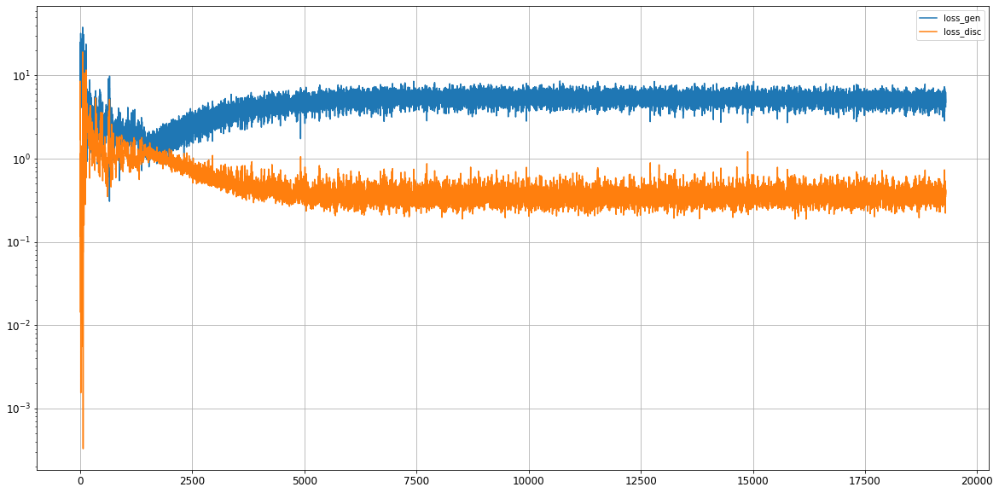

Epoch 19302/20000
0s
Epoch 19303/20000
0s
Epoch 19304/20000
0s
Epoch 19305/20000
0s
Epoch 19306/20000
0s
Epoch 19307/20000
0s
Epoch 19308/20000
0s
Epoch 19309/20000
0s
Epoch 19310/20000
0s
Epoch 19311/20000
0s
Epoch 19312/20000
0s
Epoch 19313/20000
0s
Epoch 19314/20000
0s
Epoch 19315/20000
0s
Epoch 19316/20000
0s
Epoch 19317/20000
0s
Epoch 19318/20000
0s
Epoch 19319/20000
0s
Epoch 19320/20000
0s
Epoch 19321/20000
0s
Epoch 19322/20000
0s
Epoch 19323/20000
0s
Epoch 19324/20000
0s
Epoch 19325/20000
0s
Epoch 19326/20000
0s
Epoch 19327/20000
0s
Epoch 19328/20000
0s
Epoch 19329/20000
0s
Epoch 19330/20000
0s
Epoch 19331/20000
0s
Epoch 19332/20000
0s
Epoch 19333/20000
0s
Epoch 19334/20000
0s
Epoch 19335/20000
0s
Epoch 19336/20000
0s
Epoch 19337/20000
0s
Epoch 19338/20000
0s
Epoch 19339/20000
0s
Epoch 19340/20000
0s
Epoch 19341/20000
0s
Epoch 19342/20000
0s
Epoch 19343/20000
0s
Epoch 19344/20000
0s
Epoch 19345/20000
0s
Epoch 19346/20000
0s
Epoch 19347/20000
0s
Epoch 19348/20000
0s
Epoch 19349/2

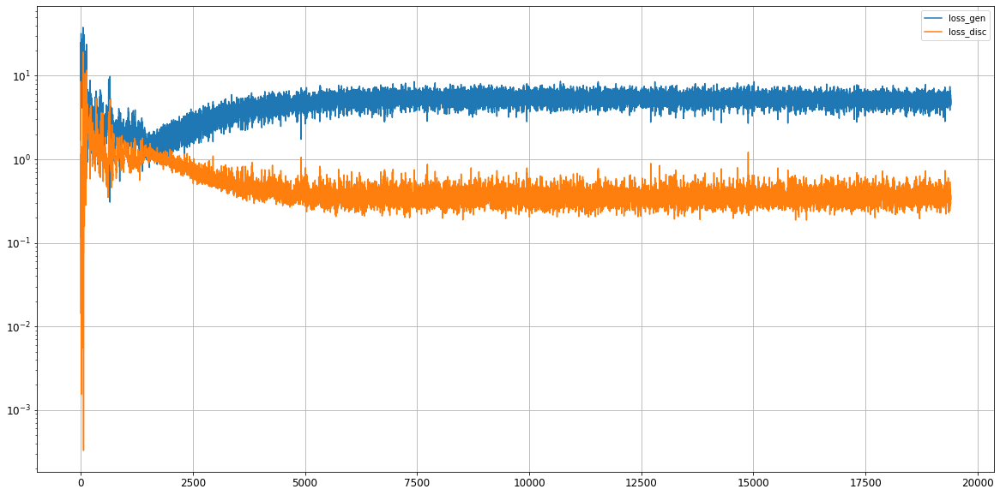

Epoch 19402/20000
0s
Epoch 19403/20000
0s
Epoch 19404/20000
0s
Epoch 19405/20000
0s
Epoch 19406/20000
0s
Epoch 19407/20000
0s
Epoch 19408/20000
0s
Epoch 19409/20000
0s
Epoch 19410/20000
0s
Epoch 19411/20000
0s
Epoch 19412/20000
0s
Epoch 19413/20000
0s
Epoch 19414/20000
0s
Epoch 19415/20000
0s
Epoch 19416/20000
0s
Epoch 19417/20000
0s
Epoch 19418/20000
0s
Epoch 19419/20000
0s
Epoch 19420/20000
0s
Epoch 19421/20000
0s
Epoch 19422/20000
0s
Epoch 19423/20000
0s
Epoch 19424/20000
0s
Epoch 19425/20000
0s
Epoch 19426/20000
0s
Epoch 19427/20000
0s
Epoch 19428/20000
0s
Epoch 19429/20000
0s
Epoch 19430/20000
0s
Epoch 19431/20000
0s
Epoch 19432/20000
0s
Epoch 19433/20000
0s
Epoch 19434/20000
0s
Epoch 19435/20000
0s
Epoch 19436/20000
0s
Epoch 19437/20000
0s
Epoch 19438/20000
0s
Epoch 19439/20000
0s
Epoch 19440/20000
0s
Epoch 19441/20000
0s
Epoch 19442/20000
0s
Epoch 19443/20000
0s
Epoch 19444/20000
0s
Epoch 19445/20000
0s
Epoch 19446/20000
0s
Epoch 19447/20000
0s
Epoch 19448/20000
0s
Epoch 19449/2

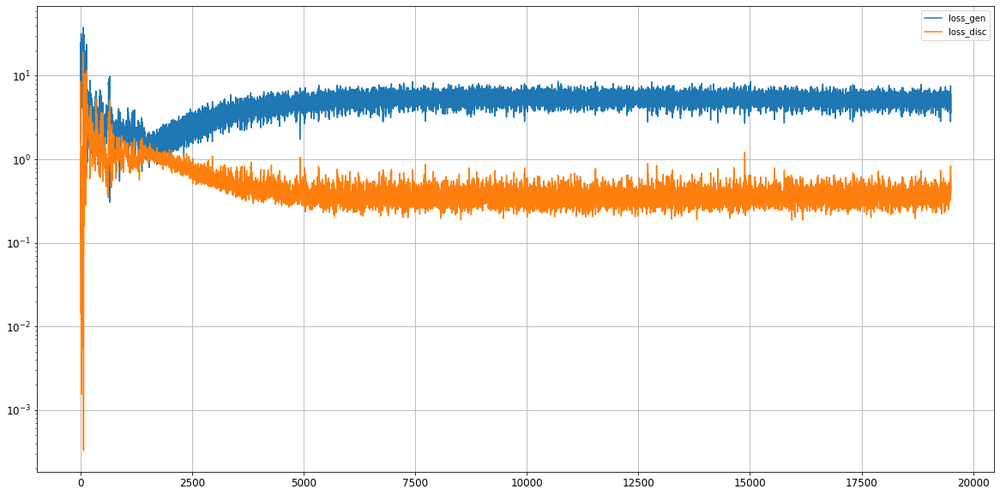

Epoch 19502/20000
0s
Epoch 19503/20000
0s
Epoch 19504/20000
0s
Epoch 19505/20000
0s
Epoch 19506/20000
0s
Epoch 19507/20000
0s
Epoch 19508/20000
0s
Epoch 19509/20000
0s
Epoch 19510/20000
0s
Epoch 19511/20000
0s
Epoch 19512/20000
0s
Epoch 19513/20000
0s
Epoch 19514/20000
0s
Epoch 19515/20000
0s
Epoch 19516/20000
0s
Epoch 19517/20000
0s
Epoch 19518/20000
0s
Epoch 19519/20000
0s
Epoch 19520/20000
0s
Epoch 19521/20000
0s
Epoch 19522/20000
0s
Epoch 19523/20000
0s
Epoch 19524/20000
0s
Epoch 19525/20000
0s
Epoch 19526/20000
0s
Epoch 19527/20000
0s
Epoch 19528/20000
0s
Epoch 19529/20000
0s
Epoch 19530/20000
0s
Epoch 19531/20000
0s
Epoch 19532/20000
0s
Epoch 19533/20000
0s
Epoch 19534/20000
0s
Epoch 19535/20000
0s
Epoch 19536/20000
0s
Epoch 19537/20000
0s
Epoch 19538/20000
0s
Epoch 19539/20000
0s
Epoch 19540/20000
0s
Epoch 19541/20000
0s
Epoch 19542/20000
0s
Epoch 19543/20000
0s
Epoch 19544/20000
0s
Epoch 19545/20000
0s
Epoch 19546/20000
0s
Epoch 19547/20000
0s
Epoch 19548/20000
0s
Epoch 19549/2

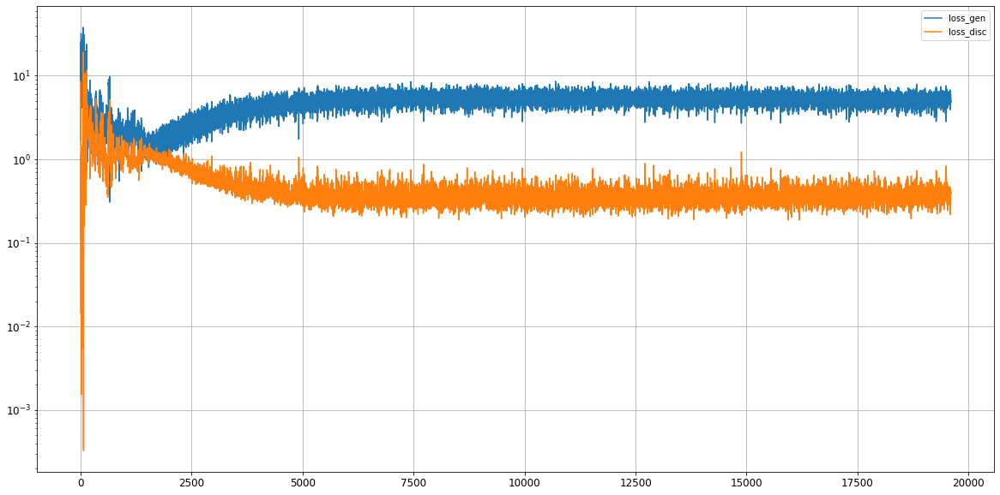

Epoch 19602/20000
0s
Epoch 19603/20000
0s
Epoch 19604/20000
0s
Epoch 19605/20000
0s
Epoch 19606/20000
0s
Epoch 19607/20000
0s
Epoch 19608/20000
0s
Epoch 19609/20000
0s
Epoch 19610/20000
0s
Epoch 19611/20000
0s
Epoch 19612/20000
0s
Epoch 19613/20000
0s
Epoch 19614/20000
0s
Epoch 19615/20000
0s
Epoch 19616/20000
0s
Epoch 19617/20000
0s
Epoch 19618/20000
0s
Epoch 19619/20000
0s
Epoch 19620/20000
0s
Epoch 19621/20000
0s
Epoch 19622/20000
0s
Epoch 19623/20000
0s
Epoch 19624/20000
0s
Epoch 19625/20000
0s
Epoch 19626/20000
0s
Epoch 19627/20000
0s
Epoch 19628/20000
0s
Epoch 19629/20000
0s
Epoch 19630/20000
0s
Epoch 19631/20000
0s
Epoch 19632/20000
0s
Epoch 19633/20000
0s
Epoch 19634/20000
0s
Epoch 19635/20000
0s
Epoch 19636/20000
0s
Epoch 19637/20000
0s
Epoch 19638/20000
0s
Epoch 19639/20000
0s
Epoch 19640/20000
0s
Epoch 19641/20000
0s
Epoch 19642/20000
0s
Epoch 19643/20000
0s
Epoch 19644/20000
0s
Epoch 19645/20000
0s
Epoch 19646/20000
0s
Epoch 19647/20000
0s
Epoch 19648/20000
0s
Epoch 19649/2

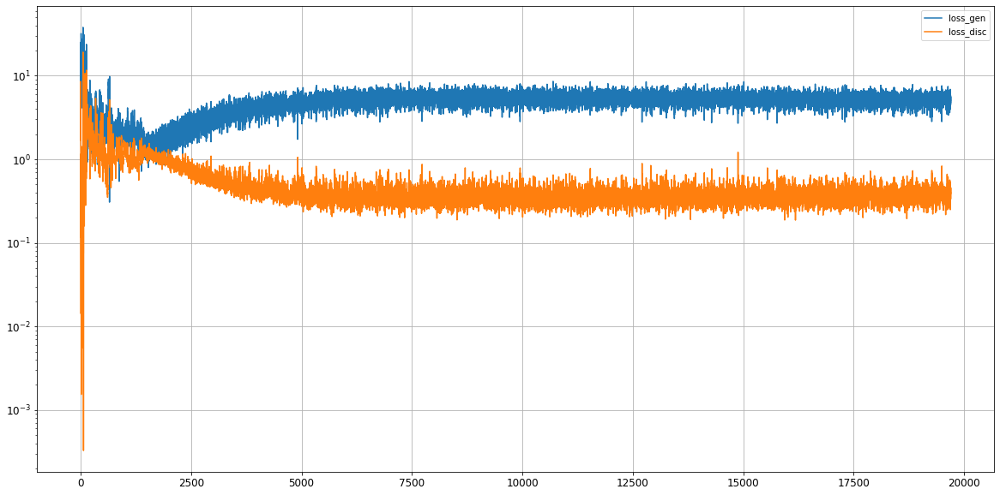

Epoch 19702/20000
0s
Epoch 19703/20000
0s
Epoch 19704/20000
0s
Epoch 19705/20000
0s
Epoch 19706/20000
0s
Epoch 19707/20000
0s
Epoch 19708/20000
0s
Epoch 19709/20000
0s
Epoch 19710/20000
0s
Epoch 19711/20000
0s
Epoch 19712/20000
0s
Epoch 19713/20000
0s
Epoch 19714/20000
0s
Epoch 19715/20000
0s
Epoch 19716/20000
0s
Epoch 19717/20000
0s
Epoch 19718/20000
0s
Epoch 19719/20000
0s
Epoch 19720/20000
0s
Epoch 19721/20000
0s
Epoch 19722/20000
0s
Epoch 19723/20000
0s
Epoch 19724/20000
0s
Epoch 19725/20000
0s
Epoch 19726/20000
0s
Epoch 19727/20000
0s
Epoch 19728/20000
0s
Epoch 19729/20000
0s
Epoch 19730/20000
0s
Epoch 19731/20000
0s
Epoch 19732/20000
0s
Epoch 19733/20000
0s
Epoch 19734/20000
0s
Epoch 19735/20000
0s
Epoch 19736/20000
0s
Epoch 19737/20000
0s
Epoch 19738/20000
0s
Epoch 19739/20000
0s
Epoch 19740/20000
0s
Epoch 19741/20000
0s
Epoch 19742/20000
0s
Epoch 19743/20000
0s
Epoch 19744/20000
0s
Epoch 19745/20000
0s
Epoch 19746/20000
0s
Epoch 19747/20000
0s
Epoch 19748/20000
0s
Epoch 19749/2

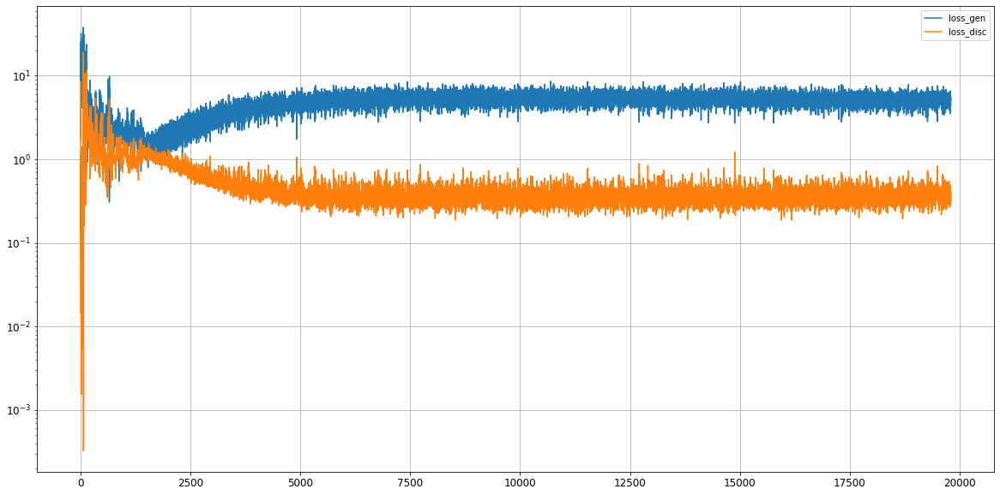

Epoch 19802/20000
0s
Epoch 19803/20000
0s
Epoch 19804/20000
0s
Epoch 19805/20000
0s
Epoch 19806/20000
0s
Epoch 19807/20000
0s
Epoch 19808/20000
0s
Epoch 19809/20000
0s
Epoch 19810/20000
0s
Epoch 19811/20000
0s
Epoch 19812/20000
0s
Epoch 19813/20000
0s
Epoch 19814/20000
0s
Epoch 19815/20000
0s
Epoch 19816/20000
0s
Epoch 19817/20000
0s
Epoch 19818/20000
0s
Epoch 19819/20000
0s
Epoch 19820/20000
0s
Epoch 19821/20000
0s
Epoch 19822/20000
0s
Epoch 19823/20000
0s
Epoch 19824/20000
0s
Epoch 19825/20000
0s
Epoch 19826/20000
0s
Epoch 19827/20000
0s
Epoch 19828/20000
0s
Epoch 19829/20000
0s
Epoch 19830/20000
0s
Epoch 19831/20000
0s
Epoch 19832/20000
0s
Epoch 19833/20000
0s
Epoch 19834/20000
0s
Epoch 19835/20000
0s
Epoch 19836/20000
0s
Epoch 19837/20000
0s
Epoch 19838/20000
0s
Epoch 19839/20000
0s
Epoch 19840/20000
0s
Epoch 19841/20000
0s
Epoch 19842/20000
0s
Epoch 19843/20000
0s
Epoch 19844/20000
0s
Epoch 19845/20000
0s
Epoch 19846/20000
0s
Epoch 19847/20000
0s
Epoch 19848/20000
0s
Epoch 19849/2

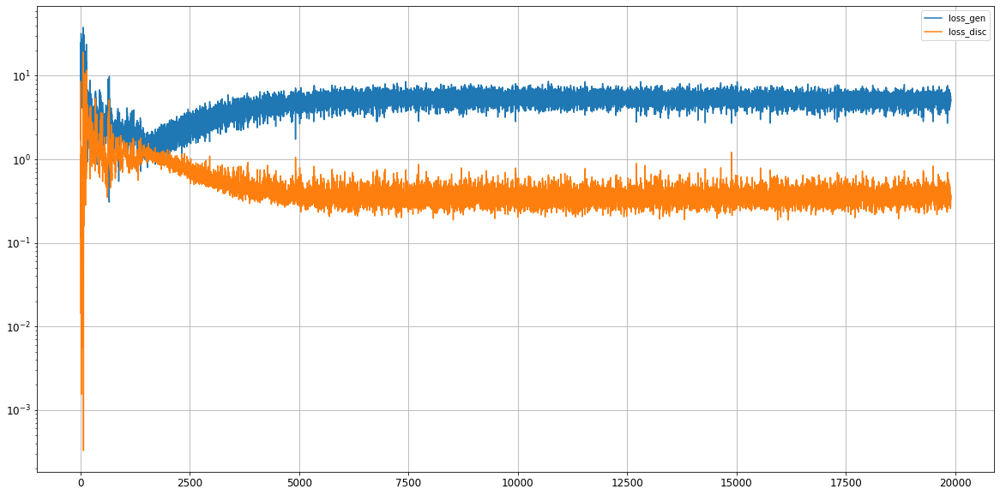

Epoch 19902/20000
0s
Epoch 19903/20000
0s
Epoch 19904/20000
0s
Epoch 19905/20000
0s
Epoch 19906/20000
0s
Epoch 19907/20000
0s
Epoch 19908/20000
0s
Epoch 19909/20000
0s
Epoch 19910/20000
0s
Epoch 19911/20000
0s
Epoch 19912/20000
0s
Epoch 19913/20000
0s
Epoch 19914/20000
0s
Epoch 19915/20000
0s
Epoch 19916/20000
0s
Epoch 19917/20000
0s
Epoch 19918/20000
0s
Epoch 19919/20000
0s
Epoch 19920/20000
0s
Epoch 19921/20000
0s
Epoch 19922/20000
0s
Epoch 19923/20000
0s
Epoch 19924/20000
0s
Epoch 19925/20000
0s
Epoch 19926/20000
0s
Epoch 19927/20000
0s
Epoch 19928/20000
0s
Epoch 19929/20000
0s
Epoch 19930/20000
0s
Epoch 19931/20000
0s
Epoch 19932/20000
0s
Epoch 19933/20000
0s
Epoch 19934/20000
0s
Epoch 19935/20000
0s
Epoch 19936/20000
0s
Epoch 19937/20000
0s
Epoch 19938/20000
0s
Epoch 19939/20000
0s
Epoch 19940/20000
0s
Epoch 19941/20000
0s
Epoch 19942/20000
0s
Epoch 19943/20000
0s
Epoch 19944/20000
0s
Epoch 19945/20000
0s
Epoch 19946/20000
0s
Epoch 19947/20000
0s
Epoch 19948/20000
0s
Epoch 19949/2

In [ ]:
tic = time.time()

#hist = train(train_dataset, epochs=200)
#hist = train(train_dataset, epochs=15000)
#hist = train(train_dataset, epochs=100)
# hist = train(train_dataset, epochs=30000)
#hist = train(train_dataset, epochs=45000)
hist = train(train_dataset, epochs=20000)

toc = time.time()
print ('\n\nTime : ', toc - tic, 'sec')

In [ ]:
# print("\ngen cnt: ", hist[-2])
# print("\ndisc cnt: ", hist[-1])

In [ ]:
hist[-1]

[5.8354025, 0.33446378]

In [ ]:
#average losses check
gensum = 0
discsum = 0
for i in range(len(hist)):
  gensum += hist[i][0]
  discsum += hist[i][-1]
gensum = gensum / len(hist)
discsum = discsum / len(hist)
print(gensum, discsum)

4.873347437760234 0.49013868660071164


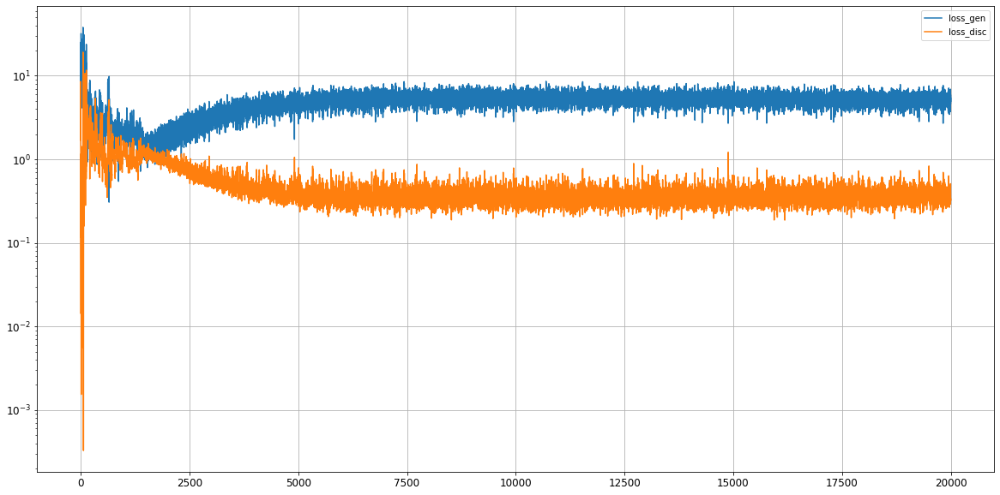

In [ ]:
fig, ax = plt.subplots(1,1, figsize=[20,10])
ax.plot(hist)
ax.legend(['loss_gen', 'loss_disc'])
ax.set_yscale('log')
ax.grid()

Quick mode collapse check

In [ ]:
noise_check1 = tf.random.normal([1, latent_space])
noise_check2 = tf.random.normal([1, latent_space])

generated_image1 = generator(noise_check1, training=False)
generated_image2 = generator(noise_check2, training=False)

assert(np.allclose(noise_check1, noise_check2) == False)
assert(np.allclose(generated_image1, generated_image2) == False)

In [ ]:
# generated_image1 = np.reshape(generated_image1, (9,243))
# generated_image2 = np.reshape(generated_image2, (9,243))
generated_image1 = np.reshape(generated_image1, (9,50))
generated_image2 = np.reshape(generated_image2, (9,50))
print(generated_image1.shape)
print(generated_image2.shape)

(9, 50)
(9, 50)


In [ ]:
# percentage of elements that are equivalent check
cnt = 0
gen_dim1, gen_dim2 = generated_image1.shape[0], generated_image1.shape[1]
for i in range(gen_dim1):
  for j in range(gen_dim2):
    if generated_image1[i][j] == generated_image2[i][j]:
      cnt += 1

print("percentage of equivalent elements within generated arrays: ", (cnt / (gen_dim1 * gen_dim2)*100), "%")

percentage of equivalent elements within generated arrays:  0.0 %


This save function saves:
- Architecture of the model, allowing to re-create the model
- Weights of the model
- Training configuration (loss, optimizer)
- The state of the optimizer, allowing to resume trainign exactly where left off

In [ ]:
# checks to see if the file exists already.
# if not, the model is saved to disk

#if os.path.isfile('/content/gdrive/MyDrive/ACSE-9/models/GAN_arch_test2_model.h5') is False:
# joblib.dump(scaler_minmax, '/content/gdrive/MyDrive/CO2-DA-GAN/models/scaler-gan_model_new196_trial2.pkl')
# gan.save('/content/gdrive/MyDrive/CO2-DA-GAN/models/GAN_model_new196_trial2.h5')

joblib.dump(scaler_minmax, '/content/gdrive/MyDrive/ACSE-9/models/scaler_minmax_410.pkl')
# gan.save('/content/gdrive/MyDrive/ACSE-9/models/GAN_model_410.h5')
#gan.save('/content/gdrive/MyDrive/ACSE-9/models/GAN_model_410_TRY_15000.h5')
# gan.save('/content/gdrive/MyDrive/ACSE-9/models/GAN_model_410_TRY_20000.h5') 04-08 RESULTS!!!
gan.save('/content/gdrive/MyDrive/ACSE-9/models/GAN_model_410_TRY_20000_2.h5')